# Import statements

In [1254]:
import pandas as pd
import numpy as np
import geopandas as gpd
from shapely.geometry import Point
from fiona.crs import from_epsg

from statsmodels.stats.outliers_influence import variance_inflation_factor

import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster, HeatMap

from sklearn.model_selection import train_test_split,GridSearchCV, RandomizedSearchCV, TimeSeriesSplit, validation_curve
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, silhouette_score, accuracy_score, confusion_matrix, classification_report
from sklearn.tree import export_graphviz, DecisionTreeClassifier, DecisionTreeRegressor
import sklearn.tree as tree
from sklearn.impute import KNNImputer
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.cluster import KMeans

import shap

import random

import os
import re
from io import StringIO

# Set display options for pandas DataFrame
pd.options.display.max_columns = 999
pd.options.display.max_rows = 500

# Import custom functions for downloading bike data, bike points, demographics data, etc.
from Download_Bike_Data import read_bike_data
from Download_Bike_Points import read_bike_points
from Download_Demographics_data import (
    load_csv_files,
    load_excel_file,
    filter_by_borough_code,
    read_house_prices,
    read_population_density,
)

# File Paths

In [3]:
# File paths for demographic data for different years
folder_path_2016 = "Data Files/Geographic & Demographics Data/Demographics/2016/"
folder_path_2017 = "Data Files/Geographic & Demographics Data/Demographics/2017/"
folder_path_2018 = "Data Files/Geographic & Demographics Data/Demographics/2018/"
folder_path_2019 = "Data Files/Geographic & Demographics Data/Demographics/2019/"

# File path for the indices file
# This file contains IoD2019 Local Authority District Summaries (upper-tier)
indices_file_path = "Data Files/Geographic & Demographics Data/Demographics/File_11_-_IoD2019_Local_Authority_District_Summaries__upper-tier__.xlsx"

# File path for the house prices data file
house_prices_file_path = "Data Files/Geographic & Demographics Data/Demographics/UK House price index.xlsx"

# File path for the population estimates data file for the years 2016-2019
population_file_path = "Data Files/Geographic & Demographics Data/Demographics/population_estimates_2016_2019.xlsx"

# File path for the boundaries of London boroughs
borough_path = "./Data Files/Geographic & Demographics Data/Geography/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp"

# Load Data to Dataframes

### Load Bike Transactions and Stations

In [4]:
# Read bike data using the custom function read_bike_data() from Download_Bike_Data.py
bike_data = read_bike_data()

# Read bike points (Bike Stations) using the custom function read_bike_points() from Download_Bike_Points.py
bike_points = read_bike_points()

/Users/mohammadmaraqa/Desktop/Masters/Modules/7CCSMPRJ & 7CUSMUIP MSc Individual Project/Final Project.nosync/Download_Bike_Data.py:142: DtypeWarning: Columns (5,8,13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  bike_data = pd.read_csv('Final Data Files/bike_data_2016_2019.csv')


Bike data read from CSV file.


In [5]:
# Print the shape of the bike_data DataFrame, which shows the number of rows and columns
print("Bike data shape: ", bike_data.shape)

# Print the shape of the bike_points DataFrame, which shows the number of rows and columns
print("Bike points data shape: ", bike_points.shape)

Bike data shape:  (41371593, 35)
Bike points data shape:  (796, 9)


### Load Demographics and Socio-economic Characteristics

In [6]:
# Load all CSV files from the 2016 demographics folder and merge them into a DataFrame
demographics_2016 = load_csv_files(folder_path_2016)

# Load all CSV files from the 2017 demographics folder and merge them into a DataFrame
demographics_2017 = load_csv_files(folder_path_2017)

# Load all CSV files from the 2018 demographics folder and merge them into a DataFrame
demographics_2018 = load_csv_files(folder_path_2018)

# Load all CSV files from the 2019 demographics folder and merge them into a DataFrame
demographics_2019 = load_csv_files(folder_path_2019)

# Load the Excel file containing indices of deprivation and filter it by borough code
indices_of_deprivation = load_excel_file(indices_file_path)
indices_of_deprivation = filter_by_borough_code(indices_of_deprivation)

# Read house prices data from the specified Excel file
average_house_prices = read_house_prices(house_prices_file_path)

# Read population density data from the specified Excel file
population_density = read_population_density(population_file_path)


population_by_age_group.csv
File population_by_age_group.csv successfully read.
Annual_Population_rate_by_unemployment.csv
File Annual_Population_rate_by_unemployment.csv successfully read.
earnings_mean_hourlypay.csv
File earnings_mean_hourlypay.csv successfully read.
population_by_gender.csv
File population_by_gender.csv successfully read.
% who are economically inactive - aged 16+.csv
File % who are economically inactive - aged 16+.csv successfully read.
demographics_2016.csv
Error reading file demographics_2016.csv: 
earnings_mean_annualpay.csv
File earnings_mean_annualpay.csv successfully read.
earnings_median_weeklypay.csv
File earnings_median_weeklypay.csv successfully read.
population_by_part_time_employment.csv
File population_by_part_time_employment.csv successfully read.
earnings_median_hourlypay.csv
File earnings_median_hourlypay.csv successfully read.
population_by_qualification.csv
File population_by_qualification.csv successfully read.
population_by_employed_self_employe

population_by_age_group.csv
File population_by_age_group.csv successfully read.
.DS_Store
Annual_Population_rate_by_unemployment.csv
File Annual_Population_rate_by_unemployment.csv successfully read.
earnings_mean_hourlypay.csv
File earnings_mean_hourlypay.csv successfully read.
population_by_gender.csv
File population_by_gender.csv successfully read.
% who are economically inactive - aged 16+.csv
File % who are economically inactive - aged 16+.csv successfully read.
earnings_mean_annualpay.csv
File earnings_mean_annualpay.csv successfully read.
earnings_median_weeklypay.csv
File earnings_median_weeklypay.csv successfully read.
population_by_part_time_employment.csv
File population_by_part_time_employment.csv successfully read.
earnings_median_hourlypay.csv
File earnings_median_hourlypay.csv successfully read.
population_by_qualification.csv
File population_by_qualification.csv successfully read.
population_by_employed_self_employed.csv
File population_by_employed_self_employed.csv suc

/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


In [7]:
# Print the shapes of the demographics DataFrames for different years
print("demographics: ", demographics_2016.shape, demographics_2017.shape, demographics_2018.shape, demographics_2019.shape)

# Print the shape of the indices_of_deprivation DataFrame
print("indices", indices_of_deprivation.shape)

# Print the shape of the population_density DataFrame
print("population", population_density.shape)

# Print the shape of the average_house_prices DataFrame
print("houses", average_house_prices.shape)

demographics:  (12, 65) (12, 65) (12, 65) (12, 65)
indices (12, 70)
population (12, 7)
houses (576, 5)


### Load Daily Weather Data

In [8]:
# Read weather data from the specified CSV file into the 'weather' DataFrame
weather = pd.read_csv('./Final Data Files/2019/weather_london_hourly_2016-2022.csv')

In [9]:
# Print the shape of the weather DataFrame
print('weather', weather.shape)

weather (61368, 11)


### Transform station longitude and latitude into a points object for the GeoDataFrame

In [10]:
# Create Point objects for each (longitude, latitude) pair in the bike_points DataFrame
geometry = [Point(xy) for xy in zip(bike_points['station_longitude'], bike_points['station_latitude'])]

# Create a GeoDataFrame 'gdf_station' using the bike_points DataFrame and the Point objects
gdf_station = gpd.GeoDataFrame(bike_points, geometry=geometry)

### Load GIS London Borough boundaries and extract boroughs that cover bike stations

In [11]:
# Load the London boroughs GeoDataFrame from the 'borough_path' file
london_boroughs = gpd.read_file(borough_path)

# Assign the Coordinate Reference System (CRS) to EPSG:27700 for the London boroughs
london_boroughs = london_boroughs.to_crs('epsg:27700')

# Assuming 'gdf_station' is the GeoDataFrame containing the cycling stations
# Change the CRS to EPSG:4326 (assuming the original CRS is WGS84)
gdf_station.crs = 'epsg:4326'
gdf_stations = gdf_station.to_crs('epsg:27700')

# Reproject the bike stations dataset back to EPSG:4326
gdf_station = gdf_station.to_crs(from_epsg(4326))

# If the CRS of the London boroughs is not EPSG:4326, reproject it to EPSG:4326
if london_boroughs.crs != from_epsg(4326):
    london_boroughs = london_boroughs.to_crs(from_epsg(4326))

# Create an empty list to store the boroughs covered by the cycling stations
covered_boroughs = []

# Iterate through each station in the gdf_station GeoDataFrame
for _, station in gdf_station.iterrows():
    # Find the London borough that contains the station's geometry
    borough = london_boroughs[london_boroughs.geometry.contains(station.geometry)]
    
    # Check if a borough was found and add its code and name to the station GeoDataFrame
    if not borough.empty:
        borough_code = borough.iloc[0]['GSS_CODE']
        borough_name = borough.iloc[0]['NAME']
        covered_boroughs.append(borough_code)  # Add the borough code to the list
        gdf_station.loc[_, 'borough_code'] = borough_code  # Add the borough code to the station GeoDataFrame
        gdf_station.loc[_, 'borough_name'] = borough_name  # Add the borough name to the station GeoDataFrame


Import GIS Data to extract boroughs of the stations and merge them into the trip and station data

In [12]:
# Create a list of unique covered boroughs from the 'covered_boroughs' list
covered_boroughs = list(set(covered_boroughs))

# Filter the 'london_boroughs' GeoDataFrame to include only the rows with 'GSS_CODE' present in the list of covered boroughs
london_boroughs_covered = london_boroughs[london_boroughs['GSS_CODE'].isin(covered_boroughs)]

# Display the head of the resulting 'london_boroughs_covered' GeoDataFrame
london_boroughs_covered.head()

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry
10,Lambeth,E09000022,2724.940,43.927,T,NaN,NaN,"POLYGON ((-0.12846 51.48505, -0.12843 51.48506..."
11,Southwark,E09000028,2991.340,105.139,T,NaN,NaN,"POLYGON ((-0.10892 51.50844, -0.10889 51.50845..."
21,Wandsworth,E09000032,3522.022,95.600,T,NaN,NaN,"POLYGON ((-0.22343 51.47152, -0.22327 51.47146..."
22,Hammersmith and Fulham,E09000013,1715.409,75.648,T,NaN,NaN,"POLYGON ((-0.24456 51.48870, -0.24460 51.48879..."
23,Kensington and Chelsea,E09000020,1238.379,25.994,T,NaN,NaN,"POLYGON ((-0.18388 51.47742, -0.18403 51.47753..."


Boroughs covered for the bike stations are 12:
['E09000022', 'E09000032', 'E09000025', 'E09000019', 'E09000013', 'E09000028', 'E09000007', 'E09000020', 'E09000033', 'E09000001', 'E09000030', 'E09000012']

# Processing Files

## Bike Data

### Checking for null values

In [13]:
# Assuming bike_data is a DataFrame containing bike-related data
print("Shape of bike_data:", bike_data.shape) 

Shape of bike_data: (41371593, 35)


In [14]:
# Assuming bike_data is a DataFrame containing bike-related data
missing_values_count = bike_data.isnull().sum()
print("Number of missing values in each column:\n", missing_values_count)

Number of missing values in each column:
 rental_id                               0
duration                          1419013
bike_id                                18
end_date                                0
endstation_id                     1649953
endstation_name                   1420314
start_date                              0
startstation_id                   1482886
startstation_name                 1250386
unnamed:_9                       41371593
unnamed:_10                      41371593
duration_seconds                 40121248
end_station_id                   40121207
end_station_name                 40121207
start_station_id                 40121207
start_station_name               40121207
unnamed:_11                      41371593
endstation_logical_terminal      41141954
endstationpriority_id            41141954
startstation_logical_terminal    41139093
start_timestamp                         0
end_timestamp                           0
start_day                         

### Processing null values

In [15]:
# List of columns to be dropped from the bike_data DataFrame
columns_to_drop = ['unnamed:_9', 'unnamed:_10', 'unnamed:_11', 'endstation_logical_terminal', 'endstationpriority_id', 'startstation_logical_terminal']

# Drop the specified columns from the bike_data DataFrame in place
bike_data.drop(columns=columns_to_drop, inplace=True)

In [16]:
# Create a mask (duration_mask) to filter rows where the 'duration' column is not null
duration_mask = bike_data['duration'].notna()

# Use the duration_mask to filter rows and get summary statistics of the filtered data
duration_filtered_data_stats = bike_data[duration_mask].describe()

In [17]:
# Filter the bike_data DataFrame to only include rows where the 'duration' column is less than or equal to 0
invalid_duration_data = bike_data[bike_data['duration'] <= 0]

# print the first few rows of invalid_duration_data
print(invalid_duration_data.head())

        rental_id  duration  bike_id    end_date  endstation_id  \
59259    56210669       0.0   5864.0  2016-07-21          552.0   
70586    56222658       0.0   6952.0  2016-07-21          251.0   
77054    56229458       0.0  10387.0  2016-07-21          541.0   
102593   56255852       0.0   1960.0  2016-07-22          492.0   
106685   56260135       0.0   5932.0  2016-07-22          251.0   

                            endstation_name  start_date  startstation_id  \
59259               Watney Street, Shadwell  2016-07-21            282.0   
70586   Brushfield Street, Liverpool Street  2016-07-21            206.0   
77054           Green Park Station, Mayfair  2016-07-21            541.0   
102593           The Green Bridge, Mile End  2016-07-22            492.0   
106685  Brushfield Street, Liverpool Street  2016-07-22            251.0   

                          startstation_name  duration_seconds  end_station_id  \
59259    Royal London Hospital, Whitechapel               N

In [18]:
# Filter the bike_data DataFrame to keep only rows where the 'duration' column is greater than 0
bike_data = bike_data.query('duration > 0')

#### Rows with duration less than 0 have missing start_station and end_station details. They will be removed.

In [19]:
# Create masks to filter rows where each specified column is not null
end_station_mask = bike_data['end_station_id'].notna()
end_station_name_mask = bike_data['end_station_name'].notna()
start_station_id_mask = bike_data['start_station_id'].notna()
start_station_name_mask = bike_data['start_station_name'].notna()
duration_seconds_mask = bike_data['duration_seconds'].notna()

# Print the count of non-null values for each filtered column
print('end_station_id:', bike_data[end_station_mask].count(),
      'end_station_name_mask:', bike_data[end_station_name_mask].count(),
      'start_station_id_mask:', bike_data[start_station_id_mask].count(),
      'start_station_name_mask:', bike_data[start_station_name_mask].count(),
      'duration_seconds_mask:', bike_data[duration_seconds_mask].count())


end_station_id: rental_id             0
duration              0
bike_id               0
end_date              0
endstation_id         0
endstation_name       0
start_date            0
startstation_id       0
startstation_name     0
duration_seconds      0
end_station_id        0
end_station_name      0
start_station_id      0
start_station_name    0
start_timestamp       0
end_timestamp         0
start_day             0
start_month           0
start_year            0
start_hour            0
start_day_of_week     0
end_day               0
end_month             0
end_year              0
end_hour              0
end_day_of_week       0
holiday               0
peak_hour             0
duration_minutes      0
dtype: int64 end_station_name_mask: rental_id             0
duration              0
bike_id               0
end_date              0
endstation_id         0
endstation_name       0
start_date            0
startstation_id       0
startstation_name     0
duration_seconds      0
end_station_

In [20]:
# Drop the specified columns from the bike_data DataFrame as they are empty
bike_data.drop(columns={'end_station_id', 'end_station_name', 'start_station_id','start_station_name','duration_seconds', 'bike_id'}, inplace=True)

#### Above columns were duplicated from the source and they have null values. Null values got removed. Also, bike_id is not needed so we will drop it.

In [21]:
missing_values_count = bike_data.isnull().sum()
print("Number of missing values in each column:\n", missing_values_count)

Number of missing values in each column:
 rental_id                 0
duration                  0
end_date                  0
endstation_id        230959
endstation_name        1329
start_date                0
startstation_id      229646
startstation_name         0
start_timestamp           0
end_timestamp             0
start_day                 0
start_month               0
start_year                0
start_hour                0
start_day_of_week         0
end_day                   0
end_month                 0
end_year                  0
end_hour                  0
end_day_of_week           0
holiday                   0
peak_hour                 0
duration_minutes          0
dtype: int64


In [22]:
# Drop rows from the bike_data DataFrame where either 'endstation_id' or 'startstation_id' is missing (NaN)
bike_data.dropna(subset=['endstation_id', 'startstation_id'], inplace=True)

#### I analysed the data for endstation_id and startstation_id and they are some null values and they are essential to our analyses. So, null values will be removed.

In [23]:
missing_values_count = bike_data.isnull().sum()
print("Number of missing values in each column:\n", missing_values_count)

Number of missing values in each column:
 rental_id            0
duration             0
end_date             0
endstation_id        0
endstation_name      0
start_date           0
startstation_id      0
startstation_name    0
start_timestamp      0
end_timestamp        0
start_day            0
start_month          0
start_year           0
start_hour           0
start_day_of_week    0
end_day              0
end_month            0
end_year             0
end_hour             0
end_day_of_week      0
holiday              0
peak_hour            0
duration_minutes     0
dtype: int64


In [24]:
print("Updated number of rows in bike_data after fixing null values:", bike_data.shape[0])

Updated number of rows in bike_data after fixing null values: 39713782


#### After pre-processing null values we got 39,713,782 rows from 41,371,593

### Covert Data Types

In [25]:
print("Data types of columns in bike_data:\n", bike_data.dtypes)


Data types of columns in bike_data:
 rental_id              int64
duration             float64
end_date              object
endstation_id        float64
endstation_name       object
start_date            object
startstation_id      float64
startstation_name     object
start_timestamp       object
end_timestamp         object
start_day              int64
start_month            int64
start_year             int64
start_hour             int64
start_day_of_week     object
end_day                int64
end_month              int64
end_year               int64
end_hour               int64
end_day_of_week       object
holiday                int64
peak_hour              int64
duration_minutes     float64
dtype: object


In [26]:
# Dictionary specifying the desired data types for each column in the bike_data DataFrame
column_data_types = {
    'rental_id': int,
    'duration': float,
    'endstation_id': int,
    'endstation_name': str,
    'startstation_id': int,
    'startstation_name': str,
    'start_timestamp': 'datetime64[ns]',
    'end_timestamp': 'datetime64[ns]',
    'start_day': int,
    'start_month': int,
    'start_year': int,
    'start_hour': int,
    'start_day_of_week': str,
    'end_day': int,
    'end_month': int,
    'end_year': int,
    'end_hour': int,
    'end_day_of_week': str,
    'holiday': bool,
    'peak_hour': bool,
    'duration_minutes': float
}

# Convert the data types of columns in the bike_data DataFrame using the column_data_types dictionary
bike_data = bike_data.astype(column_data_types)

# Print the updated data types of columns in the bike_data DataFrame
print(bike_data.dtypes)


rental_id                     int64
duration                    float64
end_date                     object
endstation_id                 int64
endstation_name              object
start_date                   object
startstation_id               int64
startstation_name            object
start_timestamp      datetime64[ns]
end_timestamp        datetime64[ns]
start_day                     int64
start_month                   int64
start_year                    int64
start_hour                    int64
start_day_of_week            object
end_day                       int64
end_month                     int64
end_year                      int64
end_hour                      int64
end_day_of_week              object
holiday                        bool
peak_hour                      bool
duration_minutes            float64
dtype: object


### Check for duplicates

In [27]:
# Find duplicated rows in the bike_data DataFrame
duplicates = bike_data.duplicated()

# Count the total number of duplicates
num_duplicates = duplicates.sum()

# Print the result showing the number of duplicated rows
print(f"Number of duplicated rows: {num_duplicates}")

# Print the duplicated rows
print("Duplicated rows:")
print(bike_data[duplicates])

Number of duplicated rows: 0
Duplicated rows:
Empty DataFrame
Columns: [rental_id, duration, end_date, endstation_id, endstation_name, start_date, startstation_id, startstation_name, start_timestamp, end_timestamp, start_day, start_month, start_year, start_hour, start_day_of_week, end_day, end_month, end_year, end_hour, end_day_of_week, holiday, peak_hour, duration_minutes]
Index: []


## Bike Stations Data

### Get Stations Geographic Boroughs

In [28]:
# Perform a spatial join between the gdf_station GeoDataFrame and the london_boroughs_covered GeoDataFrame
# The 'within' operation matches bike stations that are within the polygons of London boroughs
bike_points = gpd.sjoin(gdf_station, london_boroughs_covered, how='left', op='within')

# Display the first few rows of the resulting GeoDataFrame
bike_points.head()

/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3400: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


,bike_station_name,station_longitude,station_latitude,number_of_bikes,number_empty_docks,number_of_docks,number_standard_bikes,number_ebikes,bike_station_id,geometry,borough_code,borough_name,index_right,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006
0,"River Street , Clerkenwell",-0.109970,51.529163,13,6,19,9,4,1,POINT (-0.10997 51.52916),E09000019,Islington,27.0,Islington,E09000019,1485.664,0.000,T,NaN,NaN
1,"Phillimore Gardens, Kensington",-0.197574,51.499606,33,4,37,33,0,2,POINT (-0.19757 51.49961),E09000020,Kensington and Chelsea,23.0,Kensington and Chelsea,E09000020,1238.379,25.994,T,NaN,NaN
2,"Christopher Street, Liverpool Street",-0.084605,51.521283,0,32,32,0,0,3,POINT (-0.08460 51.52128),E09000012,Hackney,28.0,Hackney,E09000012,1904.902,0.000,T,NaN,NaN
3,"St. Chad's Street, King's Cross",-0.120973,51.530059,8,15,23,8,0,4,POINT (-0.12097 51.53006),E09000007,Camden,25.0,Camden,E09000007,2178.932,0.000,T,NaN,NaN
4,"Sedding Street, Sloane Square",-0.156876,51.493130,3,24,27,3,0,5,POINT (-0.15688 51.49313),E09000020,Kensington and Chelsea,23.0,Kensington and Chelsea,E09000020,1238.379,25.994,T,NaN,NaN


In [29]:
# Drop the specified columns from the bike_points GeoDataFrame
bike_points.drop(['index_right', 'NAME', 'GSS_CODE', 'HECTARES', 'NONLD_AREA', 'ONS_INNER', 'SUB_2009', 'SUB_2006'], axis=1, inplace=True)

### Checking for Null values

In [30]:
print("Updated shape of bike_points after dropping columns:", bike_points.shape)

Updated shape of bike_points after dropping columns: (796, 12)


In [31]:
missing_values_count = bike_points.isnull().sum()
print("Number of missing values in each column of bike_points:\n", missing_values_count)


Number of missing values in each column of bike_points:
 bike_station_name        0
station_longitude        0
station_latitude         0
number_of_bikes          0
number_empty_docks       0
number_of_docks          0
number_standard_bikes    0
number_ebikes            0
bike_station_id          0
geometry                 0
borough_code             1
borough_name             1
dtype: int64


In [32]:
# Filter the bike_points GeoDataFrame to keep only rows with missing values in any column
rows_with_missing_values = bike_points[bike_points.isnull().any(axis=1)]

# Print rows with missing values
rows_with_missing_values

,bike_station_name,station_longitude,station_latitude,number_of_bikes,number_empty_docks,number_of_docks,number_standard_bikes,number_ebikes,bike_station_id,geometry,borough_code,borough_name
131,"Wapping High Street, Wapping",-0.06797,51.504904,10,10,20,9,1,134,POINT (-0.06797 51.50490),NaN,NaN


In [33]:
# Create a Folium map centered on London with an initial zoom level of 11
m = folium.Map(location=[51.504904, -0.06797], zoom_start=20)

# Add London boroughs polygons to the map
folium.GeoJson(london_boroughs_covered).add_to(m)

# Add cycling stations as markers to the map
for _, station in gdf_station.iterrows():
    folium.Marker(
        location=[station['station_latitude'], station['station_longitude']],
        popup=station['bike_station_name']  # Set a popup displaying the bike station name
    ).add_to(m)

# Display the map
m

#### Wapping High Street, Wapping station is located outside of London Boroughs boundaries.

### Processing null values

In [34]:
# Drop rows with any missing values (NaN) from the bike_points GeoDataFrame
bike_points = bike_points.dropna()

In [35]:
print("Updated shape of bike_points after dropping columns:", bike_points.shape)

Updated shape of bike_points after dropping columns: (795, 12)


### Check for duplicates

In [36]:
# Find duplicated rows in the bike_points GeoDataFrame
duplicates = bike_points.duplicated()

# Count the total number of duplicated rows
num_duplicates = duplicates.sum()

# Print the result showing the number of duplicated rows
print(f"Number of duplicated rows: {num_duplicates}")

# Print the duplicated rows
print("Duplicated rows:")
print(bike_points[duplicates])


Number of duplicated rows: 0
Duplicated rows:
Empty GeoDataFrame
Columns: [bike_station_name, station_longitude, station_latitude, number_of_bikes, number_empty_docks, number_of_docks, number_standard_bikes, number_ebikes, bike_station_id, geometry, borough_code, borough_name]
Index: []


In [37]:
bike_points.head()

,bike_station_name,station_longitude,station_latitude,number_of_bikes,number_empty_docks,number_of_docks,number_standard_bikes,number_ebikes,bike_station_id,geometry,borough_code,borough_name
0,"River Street , Clerkenwell",-0.109970,51.529163,13,6,19,9,4,1,POINT (-0.10997 51.52916),E09000019,Islington
1,"Phillimore Gardens, Kensington",-0.197574,51.499606,33,4,37,33,0,2,POINT (-0.19757 51.49961),E09000020,Kensington and Chelsea
2,"Christopher Street, Liverpool Street",-0.084605,51.521283,0,32,32,0,0,3,POINT (-0.08460 51.52128),E09000012,Hackney
3,"St. Chad's Street, King's Cross",-0.120973,51.530059,8,15,23,8,0,4,POINT (-0.12097 51.53006),E09000007,Camden
4,"Sedding Street, Sloane Square",-0.156876,51.493130,3,24,27,3,0,5,POINT (-0.15688 51.49313),E09000020,Kensington and Chelsea


In [38]:
london_boroughs_covered.head()

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry
10,Lambeth,E09000022,2724.940,43.927,T,NaN,NaN,"POLYGON ((-0.12846 51.48505, -0.12843 51.48506..."
11,Southwark,E09000028,2991.340,105.139,T,NaN,NaN,"POLYGON ((-0.10892 51.50844, -0.10889 51.50845..."
21,Wandsworth,E09000032,3522.022,95.600,T,NaN,NaN,"POLYGON ((-0.22343 51.47152, -0.22327 51.47146..."
22,Hammersmith and Fulham,E09000013,1715.409,75.648,T,NaN,NaN,"POLYGON ((-0.24456 51.48870, -0.24460 51.48879..."
23,Kensington and Chelsea,E09000020,1238.379,25.994,T,NaN,NaN,"POLYGON ((-0.18388 51.47742, -0.18403 51.47753..."


### Plot stations across Boroughs

In [39]:
# Base map
m = folium.Map(location=[51.5074, -0.1278], zoom_start=10, tiles="cartodbpositron")

# Borough Boundaries with custom color
for _, row in london_boroughs_covered.iterrows():
    folium.GeoJson(row['geometry'],
                   style_function=lambda x: {'color': 'blue', 'weight': 2},
                   highlight_function=lambda x: {'weight':3, 'color':'green'}).add_to(m)
    centroid = row['geometry'].centroid
    folium.Marker([centroid.y, centroid.x], 
                  icon=folium.DivIcon(html=f"<div style='font-size: 10pt; color: black;'>{row['NAME']}</div>")).add_to(m)

# Station markers with clustering
station_cluster = MarkerCluster().add_to(m)
for _, row in gdf_station.iterrows():
    folium.CircleMarker(location=[row['station_latitude'], row['station_longitude']], 
                        radius=5, color='red', fill=True, fill_opacity=0.7,
                        popup=f"Station: {row['bike_station_name']}<br>Bikes: {row['number_of_bikes']}<br>Empty Docks: {row['number_empty_docks']}").add_to(station_cluster)

# Heatmap based on station locations (optional)
station_coords = gdf_station[['station_latitude', 'station_longitude']].values.tolist()
HeatMap(station_coords).add_to(m)

# Display
m


## Demographics 2019 Data (Test Data)

In [40]:
# Set the column names of demographics_2016 DataFrame to match the column names of demographics_2017 DataFrame
demographics_2019.columns = demographics_2017.columns.tolist()

### Check for Null values

In [41]:
print("Shape of demographics_2019 DataFrame:", demographics_2019.shape)


Shape of demographics_2019 DataFrame: (12, 65)


In [42]:
# Calculate the number of missing values in each column of the demographics_2016 DataFrame
missing_values_count = demographics_2019.isnull().sum()

# Sort the missing_values_count in descending order to show columns with the highest number of missing values first
missing_values_count_sorted = missing_values_count.sort_values(ascending=False)

# Print the sorted missing values count
print("Number of missing values in each column of demographics_2019 (sorted in descending order):\n", missing_values_count_sorted)


Number of missing values in each column of demographics_2019 (sorted in descending order):
 % in employment working full-time - aged 16-19      12
Male Part Time Workers  - median_annual              9
% in employment working part-time - aged 16-19       8
Male Part Time Workers  - median_weekly              6
Male Part Time Workers - mean_annual                 6
Female Part Time Workers  - median_annual            4
Female Part Time Workers  - median_weekly            4
Male Part Time Workers  - median_hourly              4
% in employment working part-time - aged 20-24       3
Male Part Time Workers  - mean_weekly                3
Male Full Time Workers  - median_annual              3
Male Part Time Workers - mean_hourly                 3
Male Full Time Workers - mean_annual                 3
Part Time Workers  - median_annual                   3
Female Part Time Workers - mean_annual               2
Male Full Time Workers  - median_hourly              2
Male Full Time Workers  - me

### Processing null values

In [43]:
# Drop the specified columns from the demographics_2016 DataFrame as most values are empty and not available
demographics_2019.drop(columns={'% in employment working full-time - aged 16-19', 'Male Part Time Workers  - median_annual'}, inplace=True)


#### The above columns were removed as most boroughs are empty and data is not available

### Covert Data Types

In [44]:
# Assuming demographics_2016 is a DataFrame containing demographic data for the year 2016
print("Data types of columns in demographics_2019:\n", demographics_2019.dtypes)


Data types of columns in demographics_2019:
 borough_name                                         object
borough_code                                         object
% of all 16+ who are aged 16-19                      object
% of all 16+ who are aged 20-24                      object
% of all 16+ who are aged 25-34                     float64
% of all 16+ who are aged 35-49                      object
% of all 16+ who are aged 50-64                     float64
% of all 16+ who are aged 65+                       float64
Unemployment rate - aged 16+                         object
Male Full Time Workers - mean_hourly                 object
Male Part Time Workers - mean_hourly                 object
Female Full Time Workers - mean_hourly              float64
Female Part Time Workers - mean_hourly               object
Full Time Workers - mean_hourly                     float64
Part Time Workers - mean_hourly                      object
% of all people aged 16+ who are male               flo

In [45]:
# Create a dictionary with column names from demographics_2016 DataFrame and their respective data type as float
column_data_types = {col: float for col in demographics_2019.columns[2:]}

# Convert each column to its respective data type using the 'astype' method
demographics_2019 = demographics_2019.astype(column_data_types)

# Print the data types of the columns after the conversion
print(demographics_2019.dtypes)


borough_name                                         object
borough_code                                         object
% of all 16+ who are aged 16-19                     float64
% of all 16+ who are aged 20-24                     float64
% of all 16+ who are aged 25-34                     float64
% of all 16+ who are aged 35-49                     float64
% of all 16+ who are aged 50-64                     float64
% of all 16+ who are aged 65+                       float64
Unemployment rate - aged 16+                        float64
Male Full Time Workers - mean_hourly                float64
Male Part Time Workers - mean_hourly                float64
Female Full Time Workers - mean_hourly              float64
Female Part Time Workers - mean_hourly              float64
Full Time Workers - mean_hourly                     float64
Part Time Workers - mean_hourly                     float64
% of all people aged 16+ who are male               float64
% of all people aged 16+ who are female 

### Check for duplicates

In [46]:
# Find duplicated rows in the demographics_2016 DataFrame
duplicates = demographics_2019.duplicated()

# Count the total number of duplicated rows
num_duplicates = duplicates.sum()

# Print the result showing the number of duplicated rows
print(f"Number of duplicated rows: {num_duplicates}")

# Print the duplicated rows
print("Duplicated rows:")
print(demographics_2019[duplicates])


Number of duplicated rows: 0
Duplicated rows:
Empty DataFrame
Columns: [borough_name, borough_code, % of all 16+ who are aged 16-19, % of all 16+ who are aged 20-24, % of all 16+ who are aged 25-34, % of all 16+ who are aged 35-49, % of all 16+ who are aged 50-64, % of all 16+ who are aged 65+, Unemployment rate - aged 16+, Male Full Time Workers - mean_hourly, Male Part Time Workers - mean_hourly, Female Full Time Workers - mean_hourly, Female Part Time Workers - mean_hourly, Full Time Workers - mean_hourly, Part Time Workers - mean_hourly, % of all people aged 16+ who are male, % of all people aged 16+ who are female, % who are economically inactive - aged 16+, Male Full Time Workers - mean_annual, Male Part Time Workers - mean_annual, Female Full Time Workers - mean_annual, Female Part Time Workers - mean_annual, Full Time Workers - mean_annual, Part Time Workers - mean_annual, Male Full Time Workers  - median_weekly, Male Part Time Workers  - median_weekly, Female Full Time Workers

## Demographics 2016-2018 Data (Training Data)

### Check for Null values

In [47]:
# Assuming demographics_2017, demographics_2018, and demographics_2019 are DataFrames containing demographic data
print("Shape of demographics_2016 DataFrame:", demographics_2016.shape)
print("Shape of demographics_2017 DataFrame:", demographics_2017.shape)
print("Shape of demographics_2018 DataFrame:", demographics_2018.shape)


Shape of demographics_2016 DataFrame: (12, 65)
Shape of demographics_2017 DataFrame: (12, 65)
Shape of demographics_2018 DataFrame: (12, 65)


In [48]:
# Calculate the number of missing values in each column of the demographics_2016 DataFrame
missing_values_count = demographics_2016.isnull().sum()

# Sort the missing_values_count in descending order to show columns with the highest number of missing values first
missing_values_count_sorted = missing_values_count.sort_values(ascending=False)

# Print the sorted missing values count
print("Number of missing values in each column of demographics_2016 (sorted in descending order):\n", missing_values_count_sorted)

Number of missing values in each column of demographics_2016 (sorted in descending order):
 % in employment working full-time - aged 16-19      12
Male Part Time Workers - median_annual              11
Male Part Time Workers - mean_annual                 9
Female Part Time Workers - median_annual             8
Part Time Workers - median_annual                    7
Male Part Time Workers - median_weekly               6
% in employment working part-time - aged 16-19       6
Male Part Time Workers - mean_weekly                 6
Male Part Time Workers - mean_hourly                 5
Male Part Time Workers - median_hourly               5
Female Part Time Workers - mean_annual               5
Male Full Time Workers - median_annual               4
Part Time Workers - mean_annual                      4
Female Full Time Workers - median_annual             3
Female Part Time Workers - median_weekly             3
Male Full Time Workers - median_weekly               2
Male Full Time Workers - med

In [49]:
# Calculate the number of missing values in each column of the demographics_2017 DataFrame
missing_values_count = demographics_2017.isnull().sum()

# Sort the missing_values_count in descending order to show columns with the highest number of missing values first
missing_values_count_sorted = missing_values_count.sort_values(ascending=False)

# Print the sorted missing values count
print("Number of missing values in each column of demographics_2017 (sorted in descending order):\n", missing_values_count_sorted)

Number of missing values in each column of demographics_2017 (sorted in descending order):
 % in employment working full-time - aged 16-19      12
Male Part Time Workers  - median_annual             11
% in employment working part-time - aged 16-19       8
Female Part Time Workers  - median_annual            7
Male Part Time Workers - mean_annual                 7
Male Part Time Workers  - median_hourly              6
Part Time Workers  - median_annual                   6
Male Part Time Workers  - median_weekly              4
Part Time Workers - mean_annual                      3
Part Time Workers  - median_weekly                   3
Female Part Time Workers  - median_weekly            3
Female Part Time Workers - mean_annual               3
Male Full Time Workers  - median_annual              3
Male Full Time Workers - mean_annual                 3
Male Part Time Workers  - mean_weekly                3
Male Part Time Workers - mean_hourly                 3
Part Time Workers - mean_hou

In [50]:
# Calculate the number of missing values in each column of the demographics_2018 DataFrame
missing_values_count = demographics_2018.isnull().sum()

# Sort the missing_values_count in descending order to show columns with the highest number of missing values first
missing_values_count_sorted = missing_values_count.sort_values(ascending=False)

# Print the sorted missing values count
print("Number of missing values in each column of demographics_2018 (sorted in descending order):\n", missing_values_count_sorted)

Number of missing values in each column of demographics_2018 (sorted in descending order):
 Male Part Time Workers - median_annual              11
% in employment working full-time - aged 16-19      10
Female Part Time Workers - median_annual             8
% in employment working part-time - aged 16-19       8
Part Time Workers - median_annual                    7
Male Part Time Workers - mean_annual                 7
Male Part Time Workers - median_weekly               5
Male Part Time Workers - mean_weekly                 4
Male Part Time Workers - median_hourly               4
Male Full Time Workers - mean_annual                 3
% in employment working part-time - aged 20-24       3
Male Part Time Workers - mean_hourly                 3
Female Part Time Workers - mean_annual               3
Part Time Workers - mean_annual                      3
Female Part Time Workers - median_weekly             3
Female Full Time Workers - median_annual             3
Male Full Time Workers - med

### Processing null values

In [52]:
# Drop the specified columns from the demographics_2016 DataFrame as most of their values are null.
demographics_2016.drop(columns={'% in employment working full-time - aged 16-19', 'Male Part Time Workers - median_annual'},inplace=True)

In [53]:
# Drop the specified columns from the demographics_2017 DataFrame as most of their values are null.
demographics_2017.drop(columns={'% in employment working full-time - aged 16-19', 'Male Part Time Workers  - median_annual'}, inplace=True)


In [54]:
# Drop the specified columns from the demographics_2018 DataFrame as most of their values are null.
demographics_2018.drop(columns={'% in employment working full-time - aged 16-19','Male Part Time Workers - median_annual'},inplace=True)

#### Above columns were dropped from 2016, 2017 and 2018 demographics data as most or all borough are missing

### Covert Data Types

In [55]:
print("Data types of columns in demographics_2016:\n", demographics_2016.dtypes)


Data types of columns in demographics_2016:
 borough_name                                         object
borough_code                                         object
% of all 16+ who are aged 16-19                      object
% of all 16+ who are aged 20-24                      object
% of all 16+ who are aged 25-34                      object
% of all 16+ who are aged 35-49                     float64
% of all 16+ who are aged 50-64                      object
% of all 16+ who are aged 65+                        object
Unemployment rate - aged 16+                         object
Male Full Time Workers - mean_hourly                float64
Male Part Time Workers - mean_hourly                 object
Female Full Time Workers - mean_hourly              float64
Female Part Time Workers - mean_hourly               object
Full Time Workers - mean_hourly                     float64
Part Time Workers - mean_hourly                      object
% of all people aged 16+ who are male               flo

In [56]:
# Create a dictionary with column names from demographics_2016 DataFrame and their respective data type as float
column_data_types = {col: float for col in demographics_2016.columns[2:]}

# Convert each column to its respective data type using the 'astype' method
demographics_2016 = demographics_2016.astype(column_data_types)

# Print the data types of the columns after the conversion
print(demographics_2016.dtypes)

borough_name                                         object
borough_code                                         object
% of all 16+ who are aged 16-19                     float64
% of all 16+ who are aged 20-24                     float64
% of all 16+ who are aged 25-34                     float64
% of all 16+ who are aged 35-49                     float64
% of all 16+ who are aged 50-64                     float64
% of all 16+ who are aged 65+                       float64
Unemployment rate - aged 16+                        float64
Male Full Time Workers - mean_hourly                float64
Male Part Time Workers - mean_hourly                float64
Female Full Time Workers - mean_hourly              float64
Female Part Time Workers - mean_hourly              float64
Full Time Workers - mean_hourly                     float64
Part Time Workers - mean_hourly                     float64
% of all people aged 16+ who are male               float64
% of all people aged 16+ who are female 

In [57]:
# Create a dictionary with column names from demographics_2017 DataFrame and their respective data type as float
column_data_types = {col: float for col in demographics_2017.columns[2:]}

# Convert each column to its respective data type using the 'astype' method
demographics_2017 = demographics_2017.astype(column_data_types)

# Print the data types of the columns after the conversion
print(demographics_2017.dtypes)


borough_name                                         object
borough_code                                         object
% of all 16+ who are aged 16-19                     float64
% of all 16+ who are aged 20-24                     float64
% of all 16+ who are aged 25-34                     float64
% of all 16+ who are aged 35-49                     float64
% of all 16+ who are aged 50-64                     float64
% of all 16+ who are aged 65+                       float64
Unemployment rate - aged 16+                        float64
Male Full Time Workers - mean_hourly                float64
Male Part Time Workers - mean_hourly                float64
Female Full Time Workers - mean_hourly              float64
Female Part Time Workers - mean_hourly              float64
Full Time Workers - mean_hourly                     float64
Part Time Workers - mean_hourly                     float64
% of all people aged 16+ who are male               float64
% of all people aged 16+ who are female 

In [58]:
# Create a dictionary with column names from demographics_2018 DataFrame and their respective data type as float
column_data_types = {col: float for col in demographics_2018.columns[2:]}

# Convert each column to its respective data type using the 'astype' method
demographics_2018 = demographics_2018.astype(column_data_types)

# Print the data types of the columns after the conversion
print(demographics_2018.dtypes)


borough_name                                         object
borough_code                                         object
% of all 16+ who are aged 16-19                     float64
% of all 16+ who are aged 20-24                     float64
% of all 16+ who are aged 25-34                     float64
% of all 16+ who are aged 35-49                     float64
% of all 16+ who are aged 50-64                     float64
% of all 16+ who are aged 65+                       float64
Unemployment rate - aged 16+                        float64
Male Full Time Workers - mean_hourly                float64
Male Part Time Workers - mean_hourly                float64
Female Full Time Workers - mean_hourly              float64
Female Part Time Workers - mean_hourly              float64
Full Time Workers - mean_hourly                     float64
Part Time Workers - mean_hourly                     float64
% of all people aged 16+ who are male               float64
% of all people aged 16+ who are female 

### Merge Demographics 2017-2019

In [59]:
# Add a new column 'source_year' to each DataFrame to indicate the year of the data source
demographics_2017['source_year'] = 2017
demographics_2018['source_year'] = 2018
demographics_2016['source_year'] = 2016

# Rename the columns of demographics_2018 and demographics_2016 to match the column names of demographics_2017
demographics_2018.columns = demographics_2017.columns.tolist()
demographics_2016.columns = demographics_2017.columns.tolist()

# Concatenate the DataFrames along the rows (stack them vertically) using pd.concat()
demographics = pd.concat([demographics_2016, demographics_2017, demographics_2018], ignore_index=True)

# Print the shape of the concatenated DataFrame 'demographics'
print("Shape of the concatenated demographics DataFrame:", demographics.shape)

Shape of the concatenated demographics DataFrame: (36, 64)


### Check for duplicates

In [60]:
# Find duplicated rows in the demographics_2017 DataFrame
duplicates = demographics.duplicated()

# Count the total number of duplicated rows
num_duplicates = duplicates.sum()

# Print the result showing the number of duplicated rows
print(f"Number of duplicated rows: {num_duplicates}")

# Print the duplicated rows
print("Duplicated rows:")
print(demographics_2017[duplicates])

Number of duplicated rows: 0
Duplicated rows:
Empty DataFrame
Columns: [borough_name, borough_code, % of all 16+ who are aged 16-19, % of all 16+ who are aged 20-24, % of all 16+ who are aged 25-34, % of all 16+ who are aged 35-49, % of all 16+ who are aged 50-64, % of all 16+ who are aged 65+, Unemployment rate - aged 16+, Male Full Time Workers - mean_hourly, Male Part Time Workers - mean_hourly, Female Full Time Workers - mean_hourly, Female Part Time Workers - mean_hourly, Full Time Workers - mean_hourly, Part Time Workers - mean_hourly, % of all people aged 16+ who are male, % of all people aged 16+ who are female, % who are economically inactive - aged 16+, Male Full Time Workers - mean_annual, Male Part Time Workers - mean_annual, Female Full Time Workers - mean_annual, Female Part Time Workers - mean_annual, Full Time Workers - mean_annual, Part Time Workers - mean_annual, Male Full Time Workers  - median_weekly, Male Part Time Workers  - median_weekly, Female Full Time Workers

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_39026/4230987631.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  print(demographics_2017[duplicates])


## Average House Price Data

### Check for Null values

In [61]:
print("Shape of average_house_prices DataFrame:", average_house_prices.shape)


Shape of average_house_prices DataFrame: (576, 5)


In [62]:
# Calculate the number of missing values in each column of the average_house_prices DataFrame
missing_values_count = average_house_prices.isnull().sum()

# Sort the missing_values_count in descending order to show columns with the highest number of missing values first
missing_values_count_sorted = missing_values_count.sort_values(ascending=False)

# Print the sorted missing values count
print("Number of missing values in each column of average_house_prices (sorted in descending order):\n", missing_values_count_sorted)


Number of missing values in each column of average_house_prices (sorted in descending order):
 date            0
borough_code    0
house_price     0
year            0
month           0
dtype: int64


### Check for duplicates

In [63]:
# Find duplicated rows in the average_house_prices DataFrame
duplicates = average_house_prices.duplicated()

# Count the total number of duplicated rows
num_duplicates = duplicates.sum()

# Print the result showing the number of duplicated rows
print(f"Number of duplicated rows: {num_duplicates}")

# Print the duplicated rows
print("Duplicated rows:")
print(average_house_prices[duplicates])


Number of duplicated rows: 0
Duplicated rows:
Empty DataFrame
Columns: [date, borough_code, house_price, year, month]
Index: []


## Indices of Deprevation 2019 Data

### Check for Null values

In [64]:
print("Shape of indices_of_deprivation DataFrame:", indices_of_deprivation.shape)


Shape of indices_of_deprivation DataFrame: (12, 70)


In [65]:
# Calculate the number of missing values in each column of the indices_of_deprivation DataFrame
missing_values_count = indices_of_deprivation.isnull().sum()

# Sort the missing_values_count in descending order to show columns with the highest number of missing values first
missing_values_count_sorted = missing_values_count.sort_values(ascending=False)

# Print the sorted missing values count
print("Number of missing values in each column of indices_of_deprivation (sorted in descending order):\n", missing_values_count_sorted)


Number of missing values in each column of indices_of_deprivation (sorted in descending order):
 borough_code                                                                                        0
Crime - Proportion  of LSOAs in most deprived 10% nationally                                        0
Barriers to Housing and Services - Proportion  of LSOAs in most deprived 10% nationally             0
Barriers to Housing and Services - Rank of average score                                            0
Barriers to Housing and Services - Average score                                                    0
Barriers to Housing and Services - Rank of average rank                                             0
Barriers to Housing and Services - Average rank                                                     0
Crime - Rank of proportion of LSOAs in most deprived 10% nationally                                 0
Crime - Rank of average score                                                          

### Check for duplicates

In [66]:
# Find duplicated rows in the indices_of_deprivation DataFrame
duplicates = indices_of_deprivation.duplicated()

# Count the total number of duplicated rows
num_duplicates = duplicates.sum()

# Print the result showing the number of duplicated rows
print(f"Number of duplicated rows: {num_duplicates}")

# Print the duplicated rows
print("Duplicated rows:")
print(indices_of_deprivation[duplicates])

Number of duplicated rows: 0
Duplicated rows:
Empty DataFrame
Columns: [borough_code, borough_name, IMD - Average rank , IMD - Rank of average rank , IMD - Average score , IMD - Rank of average score , IMD - Proportion of LSOAs in most deprived 10% nationally , IMD - Rank of proportion of LSOAs in most deprived 10% nationally , IMD 2019 - Extent , IMD 2019 - Rank of extent , IMD 2019 - Local concentration , IMD 2019 - Rank of local concentration , Income - Average rank , Income - Rank of average rank , Income - Average score , Income - Rank of average score , Income - Proportion  of LSOAs in most deprived 10% nationally , Income - Rank of proportion of LSOAs in most deprived 10% nationally , Income scale, Rank of Income Scale, Employment - Average rank , Employment - Rank of average rank , Employment - Average score , Employment - Rank of average score , Employment - Proportion  of LSOAs in most deprived 10% nationally , Employment - Rank of proportion of LSOAs in most deprived 10% nat

## Population Density Estimates 2016-2019 Data

### Add borough_code to Dataframe

In [67]:
# Map the 'borough_name' in population_density to the corresponding 'GSS_CODE' from london_boroughs_covered DataFrame
population_density['borough_code'] = population_density['borough_name'].map(london_boroughs_covered.set_index('NAME')['GSS_CODE'])


### Check for Null values

In [68]:
print("Shape of population_density DataFrame:", population_density.shape)


Shape of population_density DataFrame: (12, 8)


In [69]:
# Calculate the number of missing values in each column of the population_density DataFrame
missing_values_count = population_density.isnull().sum()

# Sort the missing_values_count in descending order to show columns with the highest number of missing values first
missing_values_count_sorted = missing_values_count.sort_values(ascending=False)

# Print the sorted missing values count
print("Number of missing values in each column of population_density (sorted in descending order):\n", missing_values_count_sorted)


Number of missing values in each column of population_density (sorted in descending order):
 borough_name    0
2016            0
2017            0
2018            0
2019            0
2020            0
2021            0
borough_code    0
dtype: int64


### Check for duplicates

In [70]:
# Find duplicated rows in the population_density DataFrame
duplicates = population_density.duplicated()

# Count the total number of duplicated rows
num_duplicates = duplicates.sum()

# Print the result showing the number of duplicated rows
print(f"Number of duplicated rows: {num_duplicates}")

# Print the duplicated rows
print("Duplicated rows:")
print(population_density[duplicates])

Number of duplicated rows: 0
Duplicated rows:
Empty DataFrame
Columns: [borough_name, 2016, 2017, 2018, 2019, 2020, 2021, borough_code]
Index: []


### Pivot Table

In [71]:
# Reshape the DataFrame to long format
population_density = population_density.melt(id_vars=['borough_name', 'borough_code'], var_name='year', value_name='population_density')

# Convert the 'year' column to integer
population_density['year'] = population_density['year'].astype(int)

## Weather Data

### Timestamp Feature Engineering

In [72]:
# Create new columns 'hour', 'day', 'month', and 'year' by extracting the respective values from the 'datetime' column
weather['hour'] = pd.DatetimeIndex(weather['datetime']).hour
weather['day'] = pd.DatetimeIndex(weather['datetime']).day
weather['month'] = pd.DatetimeIndex(weather['datetime']).month
weather['year'] = pd.DatetimeIndex(weather['datetime']).year

# Drop the original 'datetime' column from the DataFrame
weather.drop('datetime', axis=1, inplace=True)

### Filter data with year 2016-2019

In [73]:
# Filter the weather DataFrame to keep only data from the years 2016 to 2019
weather = weather[weather['year'].isin([2016, 2017, 2018, 2019])]

In [74]:
# Count the occurrences of each unique value in the 'year' column of the weather DataFrame
year_counts = weather['year'].value_counts()

# Print the result showing the count for each year
print("Count of records for each year in the weather DataFrame:\n", year_counts)

Count of records for each year in the weather DataFrame:
 2016    8784
2017    8760
2018    8760
2019    8760
Name: year, dtype: int64


### Checking for null values

In [75]:
print("Shape of weather DataFrame:", weather.shape)


Shape of weather DataFrame: (35064, 14)


In [76]:
# Calculate the number of missing values in each column of the weather DataFrame
missing_values_count = weather.isnull().sum()

# Print the result
print("Number of missing values in each column of weather:\n", missing_values_count)


Number of missing values in each column of weather:
 temp              0
feelslike         0
dew               0
humidity          0
precip            0
windgust      31349
windspeed         0
cloudcover        0
visibility        0
uvindex           0
hour              0
day               0
month             0
year              0
dtype: int64


In [77]:
# Create a boolean mask (uv_mask) to identify rows where the 'windgust' column contains missing values (NaN)
uv_mask = weather['windgust'].isnull()

# Filter the weather DataFrame to show only the rows with missing values in the 'windgust' column
weather_with_missing_windgust = weather[uv_mask]

weather_with_missing_windgust.head()

,temp,feelslike,dew,humidity,precip,windgust,windspeed,cloudcover,visibility,uvindex,hour,day,month,year
0,5.1,2.6,2.5,83.33,0.398,NaN,11.0,78.5,30.1,0.0,0,1,1,2016
1,4.1,2.3,2.3,88.09,0.000,NaN,7.5,0.0,15.3,0.0,1,1,1,2016
2,3.5,2.1,2.1,90.57,0.000,NaN,5.8,0.0,13.3,0.0,2,1,1,2016
3,3.1,3.1,2.1,93.16,0.000,NaN,3.9,0.0,5.2,0.0,3,1,1,2016
4,3.1,1.7,2.3,94.49,0.000,NaN,5.9,99.1,12.5,0.0,4,1,1,2016


### Processing null values

In [78]:
# Drop the 'windgust' column from the weather DataFrame
weather.drop(columns='windgust', inplace=True)

# Cleaning Trip and Stations Data

In [79]:
print("Shape of bike_data DataFrame:", bike_data.shape)

print("Shape of bike_points DataFrame:", bike_points.shape)


Shape of bike_data DataFrame: (39713782, 23)
Shape of bike_points DataFrame: (795, 12)


In [80]:
def remove_invalid_station_ids(df, bike_points):
    """
    Returns a dataframe with the rows that have valid start_station_id and end_station_id.
    """
    # Get the list of valid station ids from the bike_points DataFrame
    valid_station_ids = bike_points['bike_station_id'].unique()
    
    # Filter the input DataFrame (df) by the valid station ids for both start and end stations
    df = df[df['startstation_id'].isin(valid_station_ids)]
    df = df[df['endstation_id'].isin(valid_station_ids)]
    
    return df


In [81]:
# Call the remove_invalid_station_ids function with bike_data and bike_points as inputs
bike_data = remove_invalid_station_ids(bike_data, bike_points)

In [82]:
print("Shape of bike_data DataFrame:", bike_data.shape)

print("Shape of bike_points DataFrame:", bike_points.shape)

Shape of bike_data DataFrame: (38087121, 23)
Shape of bike_points DataFrame: (795, 12)


#### Some Stations were removed or their ID have changed so we made sure to remove inconsistencies between trips and stations.

In [83]:
def change_station_names(df, bike_points):
    """
    Returns a dataframe with the start_station_name and end_station_name columns changed to the bike_points station names.
    """
    # Change the start_station_name and end_station_name columns to the bike_points station names
    df['startstation_name'] = df['startstation_id'].map(bike_points.set_index('bike_station_id')['bike_station_name'])
    df['endstation_name'] = df['endstation_id'].map(bike_points.set_index('bike_station_id')['bike_station_name'])
    
    return df


In [84]:
# Call the change_station_names function with bike_data and bike_points as inputs
bike_data = change_station_names(bike_data, bike_points)

In [85]:
print("Shape of bike_data DataFrame:", bike_data.shape)

print("Shape of bike_points DataFrame:", bike_points.shape)

Shape of bike_data DataFrame: (38087121, 23)
Shape of bike_points DataFrame: (795, 12)


# Split Bike Data by Year (2016-2019)

In [86]:
# Create separate DataFrames for each year's data from the bike_data DataFrame
bike_data_16 = bike_data[bike_data['start_year'] == 2016]
bike_data_17 = bike_data[bike_data['start_year'] == 2017]
bike_data_18 = bike_data[bike_data['start_year'] == 2018]
bike_data_19 = bike_data[bike_data['start_year'] == 2019]


In [87]:
# Assuming you have created the DataFrames bike_data_16, bike_data_17, bike_data_18, and bike_data_19
print("Shape of bike_data_16 DataFrame:", bike_data_16.shape)
print("Shape of bike_data_17 DataFrame:", bike_data_17.shape)
print("Shape of bike_data_18 DataFrame:", bike_data_18.shape)
print("Shape of bike_data_19 DataFrame:", bike_data_19.shape)


Shape of bike_data_16 DataFrame: (9448378, 23)
Shape of bike_data_17 DataFrame: (8563845, 23)
Shape of bike_data_18 DataFrame: (10045556, 23)
Shape of bike_data_19 DataFrame: (9939149, 23)


# Split Datasets (Training and testing data)

In [88]:
# Create the training set by concatenating bike_data_17, bike_data_18, and bike_data_19 DataFrames
X_train = pd.concat([bike_data_16, bike_data_17, bike_data_18], ignore_index=True)

# Create the testing set as a copy of bike_data_16 DataFrame
X_test = bike_data_19.copy()

# Merge Datasets for Training set before grouping

### Merge Bike trips with Start Station details 

In [89]:
# Merge X_train with bike_points on startstation_id using an inner join
# Rename the columns to avoid column name conflicts
X_train = X_train.merge(bike_points, how='inner', left_on='startstation_id', right_on='bike_station_id')
X_train = X_train.rename(columns={'bike_station_name': 'start_station_name', 'bike_station_id': 'start_station_id', 'station_latitude': 'start_station_latitude', 'station_longitude': 'start_station_longitude', 'number_of_bikes' : 'start_number_of_bikes', 'number_empty_docks' : 'start_number_of_empty_docks', 'number_of_docks' : 'start_number_of_docks', 'number_standard_bikes' : 'start_number_standard_bikes', 'number_ebikes':'start_number_ebikes', 'geometry' : 'start_geometry', 'borough_code' : 'start_borough_code', 'borough_name' : 'start_borough_name'})

# Drop the columns 'start_station_id', 'start_station_name', 'start_station_latitude', and 'start_station_longitude' from X_train
X_train = X_train.drop(['start_station_id', 'start_station_name', 'start_station_latitude', 'start_station_longitude'], axis=1)

In [90]:
# Check for missing values in the X_train DataFrame
missing_values = X_train.isnull().sum()

# Print the count of missing values for each column
print(missing_values)

rental_id                      0
duration                       0
end_date                       0
endstation_id                  0
endstation_name                0
start_date                     0
startstation_id                0
startstation_name              0
start_timestamp                0
end_timestamp                  0
start_day                      0
start_month                    0
start_year                     0
start_hour                     0
start_day_of_week              0
end_day                        0
end_month                      0
end_year                       0
end_hour                       0
end_day_of_week                0
holiday                        0
peak_hour                      0
duration_minutes               0
start_number_of_bikes          0
start_number_of_empty_docks    0
start_number_of_docks          0
start_number_standard_bikes    0
start_number_ebikes            0
start_geometry                 0
start_borough_code             0
start_boro

In [91]:
X_train.head()

,rental_id,duration,end_date,endstation_id,endstation_name,start_date,startstation_id,startstation_name,start_timestamp,end_timestamp,start_day,start_month,start_year,start_hour,start_day_of_week,end_day,end_month,end_year,end_hour,end_day_of_week,holiday,peak_hour,duration_minutes,start_number_of_bikes,start_number_of_empty_docks,start_number_of_docks,start_number_standard_bikes,start_number_ebikes,start_geometry,start_borough_code,start_borough_name
0,56149114,540.0,2016-07-20,163,"Sloane Avenue, Knightsbridge",2016-07-20,222,"Knightsbridge, Hyde Park",2016-07-20 00:00:00,2016-07-20 00:00:00,20,7,2016,0,Wednesday,20,7,2016,0,Wednesday,False,False,9.0,1,42,43,1,0,POINT (-0.15535 51.50276),E09000033,Westminster
1,56149234,780.0,2016-07-20,573,"Limerston Street, West Chelsea",2016-07-20,222,"Knightsbridge, Hyde Park",2016-07-20 00:07:00,2016-07-20 00:07:00,20,7,2016,0,Wednesday,20,7,2016,0,Wednesday,False,False,13.0,1,42,43,1,0,POINT (-0.15535 51.50276),E09000033,Westminster
2,56149946,1800.0,2016-07-20,524,"Lancaster Gate , Bayswater",2016-07-20,222,"Knightsbridge, Hyde Park",2016-07-20 01:47:00,2016-07-20 01:47:00,20,7,2016,1,Wednesday,20,7,2016,1,Wednesday,False,False,30.0,1,42,43,1,0,POINT (-0.15535 51.50276),E09000033,Westminster
3,56149968,1320.0,2016-07-20,524,"Lancaster Gate , Bayswater",2016-07-20,222,"Knightsbridge, Hyde Park",2016-07-20 01:54:00,2016-07-20 01:54:00,20,7,2016,1,Wednesday,20,7,2016,1,Wednesday,False,False,22.0,1,42,43,1,0,POINT (-0.15535 51.50276),E09000033,Westminster
4,56150116,1140.0,2016-07-20,296,"Knaresborough Place, Earl's Court",2016-07-20,222,"Knightsbridge, Hyde Park",2016-07-20 02:47:00,2016-07-20 02:47:00,20,7,2016,2,Wednesday,20,7,2016,2,Wednesday,False,False,19.0,1,42,43,1,0,POINT (-0.15535 51.50276),E09000033,Westminster


#### We used inner join as there is a start station: Wapping High Street, Wapping that does not belong to any borough as it is located outside the boundaries.

### Merge with Weather Dataset on hourly basis

In [92]:
weather.head()

,temp,feelslike,dew,humidity,precip,windspeed,cloudcover,visibility,uvindex,hour,day,month,year
0,5.1,2.6,2.5,83.33,0.398,11.0,78.5,30.1,0.0,0,1,1,2016
1,4.1,2.3,2.3,88.09,0.000,7.5,0.0,15.3,0.0,1,1,1,2016
2,3.5,2.1,2.1,90.57,0.000,5.8,0.0,13.3,0.0,2,1,1,2016
3,3.1,3.1,2.1,93.16,0.000,3.9,0.0,5.2,0.0,3,1,1,2016
4,3.1,1.7,2.3,94.49,0.000,5.9,99.1,12.5,0.0,4,1,1,2016


In [93]:
# Merge X_train with weather DataFrame based on start_year, start_month, start_day, and start_hour
# This will combine data from both DataFrames using an inner join
X_train = X_train.merge(weather, how='inner', left_on=["start_year", "start_month", "start_day", "start_hour"], right_on=['year', 'month', 'day', 'hour'])

In [94]:
# Drop the columns 'year', 'month', 'day', and 'hour' from X_train DataFrame
X_train = X_train.drop(['year', 'month', 'day', 'hour'], axis=1)

In [95]:
# Check for missing values in the X_train DataFrame
missing_values = X_train.isnull().sum().sum()

# Print the count of missing values for each column
print(missing_values)


0


# Merge Datasets for Testing set before grouping

### Merge Bike trips with Start Station details 

In [96]:
# Merge X_test with bike_points on startstation_id using an inner join
# Rename the columns to avoid column name conflicts
X_test = X_test.merge(bike_points, how='inner', left_on='startstation_id', right_on='bike_station_id')
X_test = X_test.rename(columns={'bike_station_name': 'start_station_name', 'bike_station_id': 'start_station_id', 'station_latitude': 'start_station_latitude', 'station_longitude': 'start_station_longitude', 'number_of_bikes' : 'start_number_of_bikes', 'number_empty_docks' : 'start_number_of_empty_docks', 'number_of_docks' : 'start_number_of_docks', 'number_standard_bikes' : 'start_number_standard_bikes', 'number_ebikes':'start_number_ebikes', 'geometry' : 'start_geometry', 'borough_code' : 'start_borough_code', 'borough_name' : 'start_borough_name'})

# Drop the columns 'start_station_id', 'start_station_name', 'start_station_latitude', and 'start_station_longitude' from X_test
X_test = X_test.drop(['start_station_id', 'start_station_name', 'start_station_latitude', 'start_station_longitude'], axis=1)


In [97]:
# Check for missing values in the X_test DataFrame
missing_values = X_test.isnull().sum()

# Print the count of missing values for each column
print(missing_values)


rental_id                      0
duration                       0
end_date                       0
endstation_id                  0
endstation_name                0
start_date                     0
startstation_id                0
startstation_name              0
start_timestamp                0
end_timestamp                  0
start_day                      0
start_month                    0
start_year                     0
start_hour                     0
start_day_of_week              0
end_day                        0
end_month                      0
end_year                       0
end_hour                       0
end_day_of_week                0
holiday                        0
peak_hour                      0
duration_minutes               0
start_number_of_bikes          0
start_number_of_empty_docks    0
start_number_of_docks          0
start_number_standard_bikes    0
start_number_ebikes            0
start_geometry                 0
start_borough_code             0
start_boro

#### Start station: Wapping High Street, Wapping does not belong to any borough as it is located outside the boundaries.

### Merge with Weather Dataset on hourly basis

In [98]:
# Merge X_test with weather DataFrame based on start_year, start_month, start_day, and start_hour
X_test = X_test.merge(weather, how='inner', left_on=["start_year", "start_month", "start_day", "start_hour"], right_on=['year', 'month', 'day', 'hour'])

# Drop the columns 'year', 'month', 'day', and 'hour' from X_test DataFrame
X_test = X_test.drop(['year', 'month', 'day', 'hour'], axis=1)


In [99]:
# Check for missing values in the X_test DataFrame
missing_values = X_test.isnull().sum()

# Print the count of missing values for each column
print(missing_values)


rental_id                      0
duration                       0
end_date                       0
endstation_id                  0
endstation_name                0
start_date                     0
startstation_id                0
startstation_name              0
start_timestamp                0
end_timestamp                  0
start_day                      0
start_month                    0
start_year                     0
start_hour                     0
start_day_of_week              0
end_day                        0
end_month                      0
end_year                       0
end_hour                       0
end_day_of_week                0
holiday                        0
peak_hour                      0
duration_minutes               0
start_number_of_bikes          0
start_number_of_empty_docks    0
start_number_of_docks          0
start_number_standard_bikes    0
start_number_ebikes            0
start_geometry                 0
start_borough_code             0
start_boro

# Grouping Training & Testing sets on Borough level

In [100]:
# Group the X_train DataFrame based on start_year, start_month, and start_borough_code and perform aggregation
X_train_grouped = X_train.groupby(['start_year', 'start_month', 'start_borough_code'], as_index=False).agg({
    'rental_id': 'count',  # Count the number of rental_ids for each group
    'duration_minutes': 'mean',  # Calculate the mean of the duration_minutes for each group
    'holiday': lambda x: (x == 1).mean(),  # Calculate the proportion of holidays for each group
    'start_number_of_bikes': 'mean',  # Calculate the mean of start_number_of_bikes for each group
    'start_number_of_docks': 'mean',  # Calculate the mean of start_number_of_docks for each group
    'start_number_of_empty_docks': 'mean',  # Calculate the mean of start_number_of_empty_docks for each group
    'start_number_standard_bikes': 'mean',  # Calculate the mean of start_number_standard_bikes for each group
    'start_number_ebikes': 'mean',  # Calculate the mean of start_number_ebikes for each group
    'temp': 'mean',  # Calculate the mean of temp for each group
    'feelslike': 'mean',  # Calculate the mean of feelslike for each group
    'humidity': 'mean',  # Calculate the mean of humidity for each group
    'windspeed': 'mean',  # Calculate the mean of windspeed for each group
    'cloudcover': 'mean',  # Calculate the mean of cloudcover for each group
    'uvindex': 'mean',  # Calculate the mean of uvindex for each group
    'dew': 'mean',  # Calculate the mean of dew for each group
    'precip': 'mean',  # Calculate the mean of precip for each group
    'visibility': 'mean'  # Calculate the mean of visibility for each group
})

# Group the X_test DataFrame based on start_year, start_month, and start_borough_code and perform aggregation
X_test_grouped = X_test.groupby(['start_year', 'start_month', 'start_borough_code'], as_index=False).agg({
    'rental_id': 'count',  # Count the number of rental_ids for each group
    'duration_minutes': 'mean',  # Calculate the mean of the duration_minutes for each group
    'holiday': lambda x: (x == 1).mean(),  # Calculate the proportion of holidays for each group
    'start_number_of_bikes': 'mean',  # Calculate the mean of start_number_of_bikes for each group
    'start_number_of_docks': 'mean',  # Calculate the mean of start_number_of_docks for each group
    'start_number_of_empty_docks': 'mean',  # Calculate the mean of start_number_of_empty_docks for each group
    'start_number_standard_bikes': 'mean',  # Calculate the mean of start_number_standard_bikes for each group
    'start_number_ebikes': 'mean',  # Calculate the mean of start_number_ebikes for each group
    'temp': 'mean',  # Calculate the mean of temp for each group
    'feelslike': 'mean',  # Calculate the mean of feelslike for each group
    'humidity': 'mean',  # Calculate the mean of humidity for each group
    'windspeed': 'mean',  # Calculate the mean of windspeed for each group
    'cloudcover': 'mean',  # Calculate the mean of cloudcover for each group
    'uvindex': 'mean',  # Calculate the mean of uvindex for each group
    'dew': 'mean',  # Calculate the mean of dew for each group
    'precip': 'mean',  # Calculate the mean of precip for each group
    'visibility': 'mean'  # Calculate the mean of visibility for each group
})

# Rename the 'rental_id' column to 'pickups' in the grouped DataFrames
X_train_grouped.rename(columns={"rental_id": "pickups"}, errors="raise", inplace=True)
X_test_grouped.rename(columns={"rental_id": "pickups"}, errors="raise", inplace=True)


In [101]:
print("X_train_grouped shape:", X_train_grouped.shape)
print("X_test_grouped shape:", X_test_grouped.shape)

X_train_grouped shape: (432, 20)
X_test_grouped shape: (144, 20)


In [102]:
# Count occurrences of each unique value in the 'start_month' column of X_train_grouped DataFrame
month_counts = X_train_grouped['start_month'].value_counts()

# Print the counts for each unique month
print(month_counts)

1     36
2     36
3     36
4     36
5     36
6     36
7     36
8     36
9     36
10    36
11    36
12    36
Name: start_month, dtype: int64


In [103]:
# Count occurrences of each unique value in the 'start_month' column of X_train_grouped DataFrame
month_counts = X_test_grouped['start_month'].value_counts()

# Print the counts for each unique month
print(month_counts)

1     12
2     12
3     12
4     12
5     12
6     12
7     12
8     12
9     12
10    12
11    12
12    12
Name: start_month, dtype: int64


# Merge Datasets for Training set after grouping

### Merge Training data with population density

In [104]:
# Displaying the first few rows of the population_density DataFrame
print("Population Density Data:")
(population_density.head())


Population Density Data:


,borough_name,borough_code,year,population_density
0,Camden,E09000007,2016,249200
1,City of London,E09000001,2016,7200
2,Hackney,E09000012,2016,273200
3,Hammersmith and Fulham,E09000013,2016,181800
4,Islington,E09000019,2016,232100


In [105]:
# Function to get the population density for each row in X_train_grouped
def get_population_density(row):
    # Find the matching row in population_density DataFrame based on 'start_borough_code' and 'start_year'
    matched_row = population_density.loc[
        (population_density['borough_code'] == row['start_borough_code']) &
        (population_density['year'] == row['start_year'])
    ]
    
    # Extract the population density value from the matched row
    population_density_value = matched_row['population_density'].values[0]
    
    return population_density_value

# Apply the get_population_density function to create a new 'population_density' column in X_train_grouped
X_train_grouped['population_density'] = X_train_grouped.apply(get_population_density, axis=1)


In [106]:
# Displaying the first few rows of the X_train_grouped DataFrame
print("X_train_grouped Data:")
X_train_grouped.head()


X_train_grouped Data:


,start_year,start_month,start_borough_code,pickups,duration_minutes,holiday,start_number_of_bikes,start_number_of_docks,start_number_of_empty_docks,start_number_standard_bikes,start_number_ebikes,temp,feelslike,humidity,windspeed,cloudcover,uvindex,dew,precip,visibility,population_density
0,2016,1,E09000001,47896,14.380909,0.007976,0.920139,26.787811,25.867672,0.774532,0.145607,6.889692,4.852374,78.313245,16.988550,55.908855,0.322135,3.281988,0.043140,23.908673,7200
1,2016,1,E09000007,61137,16.169505,0.011711,10.648020,31.273059,20.625039,10.336965,0.311055,6.770210,4.753468,79.373835,16.795998,57.796073,0.413318,3.358313,0.038136,23.145195,249200
2,2016,1,E09000012,30598,16.875776,0.013824,17.711321,31.546376,13.835055,17.262207,0.449114,6.743029,4.728528,80.359541,16.683303,59.380855,0.451664,3.513893,0.037744,22.559726,273200
3,2016,1,E09000013,28200,19.558617,0.015674,21.353369,29.805355,8.451986,20.515319,0.838050,6.782851,4.748766,80.151641,16.577652,59.373018,0.464823,3.517411,0.039242,22.584135,181800
4,2016,1,E09000019,35138,15.648642,0.010644,9.955461,24.543770,14.588309,9.270903,0.684558,6.792740,4.779233,79.599545,16.857317,58.641169,0.465024,3.424708,0.043683,22.935933,232100


### Merge Training data with Average House price on monthly basis

In [107]:
# Displaying the first few rows of the average_house_prices DataFrame
print("Average House Prices Data:")
(average_house_prices.head())


Average House Prices Data:


,date,borough_code,house_price,year,month
0,2016-01-01,E09000001,736788.4978,2016,1
1,2016-02-01,E09000001,765643.5620,2016,2
2,2016-03-01,E09000001,794754.2788,2016,3
3,2016-04-01,E09000001,805319.9631,2016,4
4,2016-05-01,E09000001,845579.4697,2016,5


In [108]:
# Merge X_train_grouped and average_house_prices on 'start_borough_code', 'start_year', and 'start_month'
X_train_grouped = X_train_grouped.merge(average_house_prices, how='left', left_on=['start_borough_code', 'start_year', 'start_month'], right_on=['borough_code', 'year', 'month'])


In [109]:
# Remove 'date', 'borough_code', 'year', and 'month' columns from X_train_grouped
X_train_grouped.drop(['date', 'borough_code', 'year', 'month'], inplace=True, axis=1)

# Rename the 'house_price' column to 'average_house_price'
X_train_grouped = X_train_grouped.rename(columns={'house_price': 'average_house_price'})

In [110]:
X_train_grouped.columns

Index(['start_year', 'start_month', 'start_borough_code', 'pickups',
       'duration_minutes', 'holiday', 'start_number_of_bikes',
       'start_number_of_docks', 'start_number_of_empty_docks',
       'start_number_standard_bikes', 'start_number_ebikes', 'temp',
       'feelslike', 'humidity', 'windspeed', 'cloudcover', 'uvindex', 'dew',
       'precip', 'visibility', 'population_density', 'average_house_price'],
      dtype='object')

### Merge Training data with Demographics on borough level

In [111]:
# Merge X_train_grouped and demographics on 'start_borough_code' and 'start_year'
X_train_grouped = X_train_grouped.merge(demographics, how='inner', left_on=['start_borough_code', 'start_year'], right_on=['borough_code', 'source_year'])

In [112]:
# Drop 'source_year', 'borough_name', and 'borough_code' columns from X_train_grouped
X_train_grouped.drop(columns={'source_year', 'borough_name', 'borough_code'}, inplace=True)

### Merge Training data with Indices of Depravation on borough level

In [113]:
# Merge X_train_grouped and indices_of_deprivation on 'start_borough_code'
X_train_grouped = X_train_grouped.merge(indices_of_deprivation, how='inner', left_on=['start_borough_code'], right_on=['borough_code'])

In [114]:
X_train_grouped.head()

,start_year,start_month,start_borough_code,pickups,duration_minutes,holiday,start_number_of_bikes,start_number_of_docks,start_number_of_empty_docks,start_number_standard_bikes,start_number_ebikes,temp,feelslike,humidity,windspeed,cloudcover,uvindex,dew,precip,visibility,population_density,average_house_price,% of all 16+ who are aged 16-19,% of all 16+ who are aged 20-24,% of all 16+ who are aged 25-34,% of all 16+ who are aged 35-49,% of all 16+ who are aged 50-64,% of all 16+ who are aged 65+,Unemployment rate - aged 16+,Male Full Time Workers - mean_hourly,Male Part Time Workers - mean_hourly,Female Full Time Workers - mean_hourly,Female Part Time Workers - mean_hourly,Full Time Workers - mean_hourly,Part Time Workers - mean_hourly,% of all people aged 16+ who are male,% of all people aged 16+ who are female,% who are economically inactive - aged 16+,Male Full Time Workers - mean_annual,Male Part Time Workers - mean_annual,Female Full Time Workers - mean_annual,Female Part Time Workers - mean_annual,Full Time Workers - mean_annual,Part Time Workers - mean_annual,Male Full Time Workers - median_weekly,Male Part Time Workers - median_weekly,Female Full Time Workers - median_weekly,Female Part Time Workers - median_weekly,Full Time Workers - median_weekly,Part Time Workers - median_weekly,% in employment working part-time - aged 16-19,% in employment working part-time - aged 20-24,% in employment working part-time - aged 25-49,% in employment working part-time - aged 50+,Male Full Time Workers - median_hourly,Male Part Time Workers - median_hourly,Female Full Time Workers - median_hourly,Female Part Time Workers - median_hourly,Full Time Workers - median_hourly,Part Time Workers - median_hourly,% with NVQ4+ - aged 16-64,% with NVQ3 only - aged 16-64,% with NVQ2 only - aged 16-64,% with NVQ1 only - aged 16-64,% with other qualifications (NVQ) - aged 16-64,% with no qualifications (NVQ) - aged 16-64,% in employment who are employees - aged 16+,% in employment who are self employed - aged 16+,Male Full Time Workers - mean_weekly,Male Part Time Workers - mean_weekly,Female Full Time Workers - mean_weekly,Female Part Time Workers - mean_weekly,Full Time Workers - mean_weekly,Part Time Workers - mean_weekly,Male Full Time Workers - median_annual,Female Full Time Workers - median_annual,Female Part Time Workers - median_annual,Full Time Workers - median_annual,Part Time Workers - median_annual,% in employment working full-time - aged 20-24,% in employment working full-time - aged 25-49,% in employment working full-time - aged 50+,Economic activity rate - aged 16+,borough_code,borough_name,IMD - Average rank,IMD - Rank of average rank,IMD - Average score,IMD - Rank of average score,IMD - Proportion of LSOAs in most deprived 10% nationally,IMD - Rank of proportion of LSOAs in most deprived 10% nationally,IMD 2019 - Extent,IMD 2019 - Rank of extent,IMD 2019 - Local concentration,IMD 2019 - Rank of local concentration,Income - Average rank,Income - Rank of average rank,Income - Average score,Income - Rank of average score,Income - Proportion of LSOAs in most deprived 10% nationally,Income - Rank of proportion of LSOAs in most deprived 10% nationally,Income scale,Rank of Income Scale,Employment - Average rank,Employment - Rank of average rank,Employment - Average score,Employment - Rank of average score,Employment - Proportion of LSOAs in most deprived 10% nationally,Employment - Rank of proportion of LSOAs in most deprived 10% nationally,Employment scale,Rank of Employment Scale,"Education, Skills and Training - Average rank","Education, Skills and Training - Rank of average rank","Education, Skills and Training - Average score","Education, Skills and Training - Rank of average score","Education, Skills and Training - Proportion of LSOAs in most deprived 10% nationally","Education, Skills and Training - Rank of proportion of LSOAs in most deprived 10% nationally",Health Deprivation and Disability - Average rank,Health Deprivation and Dis

In [115]:
X_train_grouped.drop(columns={'borough_name','borough_code'}, inplace=True)

In [116]:
X_train_grouped.shape

(432, 151)

# Merge Datasets for Testing set after grouping

### Merge Testing data with population density

In [117]:
# Replace 'borough_column' and 'year_column' with the actual column names in your DataFrame
# This code adds the 'population_density' column to X_test_grouped by matching 'start_borough_code' and 'start_year'
X_test_grouped['population_density'] = X_test_grouped.apply(lambda row: population_density.loc[
    (population_density['borough_code'] == row['start_borough_code']) &
    (population_density['year'] == row['start_year'])
]['population_density'].values[0], axis=1)


In [118]:
X_test_grouped.head()

,start_year,start_month,start_borough_code,pickups,duration_minutes,holiday,start_number_of_bikes,start_number_of_docks,start_number_of_empty_docks,start_number_standard_bikes,start_number_ebikes,temp,feelslike,humidity,windspeed,cloudcover,uvindex,dew,precip,visibility,population_density
0,2019,1,E09000001,56335,13.813065,0.012035,0.895181,26.629449,25.734268,0.773285,0.121896,5.453235,3.414801,75.987020,12.222070,73.279421,0.181930,1.433397,0.028656,24.692232,9700
1,2019,1,E09000007,68812,14.895803,0.014532,10.642025,30.865285,20.223260,10.341917,0.300108,5.345425,3.256726,76.675377,12.419244,73.421131,0.205880,1.458519,0.021836,24.201420,270000
2,2019,1,E09000012,35165,14.398351,0.012967,19.241120,31.539258,12.298137,18.756093,0.485028,5.300663,3.239016,77.493583,12.538396,74.675973,0.202673,1.575456,0.021101,23.681416,281100
3,2019,1,E09000013,35086,15.189563,0.017956,21.316765,29.691757,8.374993,20.450465,0.866300,5.523870,3.463912,77.102005,12.833729,74.650077,0.227612,1.726700,0.021600,24.042373,185100
4,2019,1,E09000019,36674,13.664749,0.012843,10.153842,24.752549,14.598708,9.476168,0.677674,5.374181,3.293423,76.912008,12.565030,73.821323,0.220129,1.534537,0.021342,24.081867,242500


### Merge Testing data with Average House price on monthly basis

In [119]:
# Merge X_test_grouped and average_house_prices on 'start_borough_code', 'start_year', and 'start_month'
# using an inner join to match the columns
X_test_grouped = X_test_grouped.merge(average_house_prices, how='left', left_on=['start_borough_code', 'start_year', 'start_month'], right_on=['borough_code', 'year', 'month'])

In [120]:
# Drop 'date', 'borough_code', 'year', and 'month' columns from X_test_grouped
X_test_grouped.drop(['date', 'borough_code', 'year', 'month'], inplace=True, axis=1)

# Rename 'house_price' column to 'average_house_price'
X_test_grouped = X_test_grouped.rename(columns={'house_price': 'average_house_price'})


In [121]:
X_test_grouped.columns

Index(['start_year', 'start_month', 'start_borough_code', 'pickups',
       'duration_minutes', 'holiday', 'start_number_of_bikes',
       'start_number_of_docks', 'start_number_of_empty_docks',
       'start_number_standard_bikes', 'start_number_ebikes', 'temp',
       'feelslike', 'humidity', 'windspeed', 'cloudcover', 'uvindex', 'dew',
       'precip', 'visibility', 'population_density', 'average_house_price'],
      dtype='object')

### Merge Testing data with Demographics on borough level

In [122]:
# Merge X_test_grouped and demographics_2016 on 'start_borough_code' using an inner join
# to match the columns
X_test_grouped = X_test_grouped.merge(demographics_2016, how='inner', left_on=['start_borough_code'], right_on=['borough_code'])


In [123]:
# Drop 'borough_name' and 'borough_code' columns from X_test_grouped
X_test_grouped.drop(columns={'borough_name', 'borough_code'}, inplace=True)

### Merge Testing data with Indices of Depravation on borough level

In [124]:
# Merge X_train_grouped and indices_of_deprivation on 'start_borough_code'
X_test_grouped = X_test_grouped.merge(indices_of_deprivation, how='inner', left_on=['start_borough_code'], right_on=['borough_code'])

In [125]:
X_test_grouped.drop(columns={'borough_name','borough_code','source_year'}, inplace=True)

In [126]:
print("Shape of X_test_grouped DataFrame:", X_test_grouped.shape)

Shape of X_test_grouped DataFrame: (144, 151)


# Merge Training and Testing set to fill missing values

### Merge Datasets

In [127]:
# Concatenate X_test_grouped and X_train_grouped DataFrames along axis 0 (rows)
# This will merge the two DataFrames into a single DataFrame called merged_dataset
merged_dataset = pd.concat([X_train_grouped, X_test_grouped], axis=0)

# Reset the index of the merged_dataset after concatenation (optional but recommended)
# This ensures the index is reset to be consecutive integers starting from 0
merged_dataset.reset_index(drop=True, inplace=True)


In [128]:
# Count the occurrences of each unique value in the 'start_year' column
start_year_counts = merged_dataset['start_year'].value_counts()

# Display the result
print("Counts of start_year:")
print(start_year_counts)


Counts of start_year:
2016    144
2017    144
2018    144
2019    144
Name: start_year, dtype: int64


### Percentage of Missing Values

In [1347]:
# Calculate the total number of missing values in each column of the merged_dataset DataFrame
missing_values = merged_dataset.isnull().sum()

# Calculate the total number of rows in the DataFrame
total_rows = len(merged_dataset)

# Calculate the percentage of missing values in each column
percentage_missing = (missing_values / total_rows) * 100

# Sort the percentage of missing values in descending order
percentage_missing_sorted = percentage_missing.sort_values(ascending=False)

# Print the percentage of missing values in each column, sorted in descending order
print("Percentage of missing values in each column:")
print(percentage_missing_sorted)


Percentage of missing values in each column:
Male Part Time Workers - mean_annual                                                                66.666667
Female Part Time Workers  - median_annual                                                           64.583333
% in employment working part-time - aged 16-19                                                      58.333333
Part Time Workers  - median_annual                                                                  56.250000
Male Part Time Workers  - median_weekly                                                             43.750000
Male Part Time Workers  - median_hourly                                                             41.666667
Male Part Time Workers  - mean_weekly                                                               39.583333
Male Part Time Workers - mean_hourly                                                                33.333333
Female Part Time Workers - mean_annual                                     

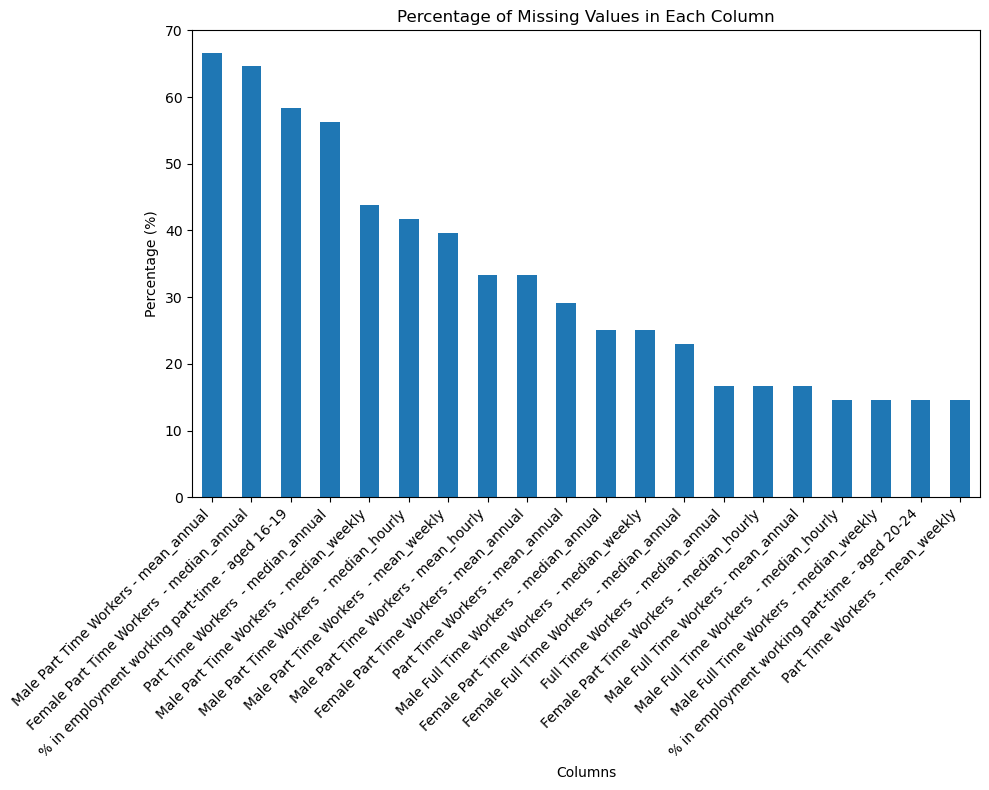

In [1349]:
# Plot
plt.figure(figsize=(10,8))  # Adjust the size of the figure
percentage_missing_sorted[:20].plot(kind='bar')
plt.title('Percentage of Missing Values in Each Column')
plt.ylabel('Percentage (%)')
plt.xlabel('Columns')
plt.xticks(rotation=45, ha='right')  # Rotate column names for better visibility
plt.tight_layout()  # Adjust layout for better visibility
plt.show()

### Feature Engineering

In [130]:
# Perform one-hot encoding for the 'start_borough_code' column in the merged_dataset DataFrame
# This creates binary columns for each unique value in the 'start_borough_code' column
merged_dataset = pd.get_dummies(merged_dataset, columns=['start_borough_code'], prefix='borough_code', drop_first=False)


### Transform the data

In [131]:
# Create a new DataFrame containing only the columns to be scaled (excluding the first two columns)
columns_to_scale = merged_dataset.columns[2:]  # Exclude the first two columns
merged_dataset_to_scale = merged_dataset[columns_to_scale]

# Create an instance of MinMaxScaler
scaler = MinMaxScaler()

# Use the scaler to fit and transform the values in the merged_dataset_to_scale DataFrame
# The fit_transform method scales the values in each column to the range [0, 1]
# and creates a new DataFrame with the scaled values
merged_dataset_scaled_values = scaler.fit_transform(merged_dataset_to_scale)
merged_dataset_scaled = pd.DataFrame(merged_dataset_scaled_values, columns=columns_to_scale)

# Combine the scaled DataFrame with the first two columns from the original DataFrame
merged_dataset_scaled = pd.concat([merged_dataset[['start_year', 'start_month']], merged_dataset_scaled], axis=1)

# Display the first few rows of the scaled DataFrame
merged_dataset_scaled.head()


,start_year,start_month,pickups,duration_minutes,holiday,start_number_of_bikes,start_number_of_docks,start_number_of_empty_docks,start_number_standard_bikes,start_number_ebikes,temp,feelslike,humidity,windspeed,cloudcover,uvindex,dew,precip,visibility,population_density,average_house_price,% of all 16+ who are aged 16-19,% of all 16+ who are aged 20-24,% of all 16+ who are aged 25-34,% of all 16+ who are aged 35-49,% of all 16+ who are aged 50-64,% of all 16+ who are aged 65+,Unemployment rate - aged 16+,Male Full Time Workers - mean_hourly,Male Part Time Workers - mean_hourly,Female Full Time Workers - mean_hourly,Female Part Time Workers - mean_hourly,Full Time Workers - mean_hourly,Part Time Workers - mean_hourly,% of all people aged 16+ who are male,% of all people aged 16+ who are female,% who are economically inactive - aged 16+,Male Full Time Workers - mean_annual,Male Part Time Workers - mean_annual,Female Full Time Workers - mean_annual,Female Part Time Workers - mean_annual,Full Time Workers - mean_annual,Part Time Workers - mean_annual,Male Full Time Workers - median_weekly,Male Part Time Workers - median_weekly,Female Full Time Workers - median_weekly,Female Part Time Workers - median_weekly,Full Time Workers - median_weekly,Part Time Workers - median_weekly,% in employment working part-time - aged 16-19,% in employment working part-time - aged 20-24,% in employment working part-time - aged 25-49,% in employment working part-time - aged 50+,Male Full Time Workers - median_hourly,Male Part Time Workers - median_hourly,Female Full Time Workers - median_hourly,Female Part Time Workers - median_hourly,Full Time Workers - median_hourly,Part Time Workers - median_hourly,% with NVQ4+ - aged 16-64,% with NVQ3 only - aged 16-64,% with NVQ2 only - aged 16-64,% with NVQ1 only - aged 16-64,% with other qualifications (NVQ) - aged 16-64,% with no qualifications (NVQ) - aged 16-64,% in employment who are employees - aged 16+,% in employment who are self employed - aged 16+,Male Full Time Workers - mean_weekly,Male Part Time Workers - mean_weekly,Female Full Time Workers - mean_weekly,Female Part Time Workers - mean_weekly,Full Time Workers - mean_weekly,Part Time Workers - mean_weekly,Male Full Time Workers - median_annual,Female Full Time Workers - median_annual,Female Part Time Workers - median_annual,Full Time Workers - median_annual,Part Time Workers - median_annual,% in employment working full-time - aged 20-24,% in employment working full-time - aged 25-49,% in employment working full-time - aged 50+,Economic activity rate - aged 16+,IMD - Average rank,IMD - Rank of average rank,IMD - Average score,IMD - Rank of average score,IMD - Proportion of LSOAs in most deprived 10% nationally,IMD - Rank of proportion of LSOAs in most deprived 10% nationally,IMD 2019 - Extent,IMD 2019 - Rank of extent,IMD 2019 - Local concentration,IMD 2019 - Rank of local concentration,Income - Average rank,Income - Rank of average rank,Income - Average score,Income - Rank of average score,Income - Proportion of LSOAs in most deprived 10% nationally,Income - Rank of proportion of LSOAs in most deprived 10% nationally,Income scale,Rank of Income Scale,Employment - Average rank,Employment - Rank of average rank,Employment - Average score,Employment - Rank of average score,Employment - Proportion of LSOAs in most deprived 10% nationally,Employment - Rank of proportion of LSOAs in most deprived 10% nationally,Employment scale,Rank of Employment Scale,"Education, Skills and Training - Average rank","Education, Skills and Training - Rank of average rank","Education, Skills and Training - Average score","Education, Skills and Training - Rank of average score","Education, Skills and Training - Proportion of LSOAs in most deprived 10% nationally","Education, Skills and Training - Rank of proportion of LSOAs in most deprived 10% nationally",Health Deprivation and Disability - Average rank,Health Deprivation and Disability - Rank of average rank,Health Depriva

### KNN Imputation

In [132]:
# Create an instance of KNNImputer with the number of neighbors set to 4
imputer = KNNImputer(n_neighbors=4)

# Use the KNNImputer to impute the missing values in the merged_dataset_scaled DataFrame
merged_dataset_imputed_scaled_values = imputer.fit_transform(merged_dataset_scaled)
print(merged_dataset_scaled.shape,merged_dataset_imputed_scaled_values.shape)
merged_dataset_imputed_scaled = pd.DataFrame(merged_dataset_imputed_scaled_values, columns=merged_dataset_scaled.columns)

# Use the inverse_transform method to convert the imputed and scaled data back to the original scale using the MinMaxScaler
merged_dataset_imputed = pd.DataFrame(scaler.inverse_transform(merged_dataset_imputed_scaled[columns_to_scale]), columns=merged_dataset_imputed_scaled[columns_to_scale].columns)

merged_dataset_imputed = pd.concat([merged_dataset[['start_year', 'start_month']], merged_dataset_imputed], axis=1)

merged_dataset_imputed.head()

(576, 162) (576, 162)


,start_year,start_month,pickups,duration_minutes,holiday,start_number_of_bikes,start_number_of_docks,start_number_of_empty_docks,start_number_standard_bikes,start_number_ebikes,temp,feelslike,humidity,windspeed,cloudcover,uvindex,dew,precip,visibility,population_density,average_house_price,% of all 16+ who are aged 16-19,% of all 16+ who are aged 20-24,% of all 16+ who are aged 25-34,% of all 16+ who are aged 35-49,% of all 16+ who are aged 50-64,% of all 16+ who are aged 65+,Unemployment rate - aged 16+,Male Full Time Workers - mean_hourly,Male Part Time Workers - mean_hourly,Female Full Time Workers - mean_hourly,Female Part Time Workers - mean_hourly,Full Time Workers - mean_hourly,Part Time Workers - mean_hourly,% of all people aged 16+ who are male,% of all people aged 16+ who are female,% who are economically inactive - aged 16+,Male Full Time Workers - mean_annual,Male Part Time Workers - mean_annual,Female Full Time Workers - mean_annual,Female Part Time Workers - mean_annual,Full Time Workers - mean_annual,Part Time Workers - mean_annual,Male Full Time Workers - median_weekly,Male Part Time Workers - median_weekly,Female Full Time Workers - median_weekly,Female Part Time Workers - median_weekly,Full Time Workers - median_weekly,Part Time Workers - median_weekly,% in employment working part-time - aged 16-19,% in employment working part-time - aged 20-24,% in employment working part-time - aged 25-49,% in employment working part-time - aged 50+,Male Full Time Workers - median_hourly,Male Part Time Workers - median_hourly,Female Full Time Workers - median_hourly,Female Part Time Workers - median_hourly,Full Time Workers - median_hourly,Part Time Workers - median_hourly,% with NVQ4+ - aged 16-64,% with NVQ3 only - aged 16-64,% with NVQ2 only - aged 16-64,% with NVQ1 only - aged 16-64,% with other qualifications (NVQ) - aged 16-64,% with no qualifications (NVQ) - aged 16-64,% in employment who are employees - aged 16+,% in employment who are self employed - aged 16+,Male Full Time Workers - mean_weekly,Male Part Time Workers - mean_weekly,Female Full Time Workers - mean_weekly,Female Part Time Workers - mean_weekly,Full Time Workers - mean_weekly,Part Time Workers - mean_weekly,Male Full Time Workers - median_annual,Female Full Time Workers - median_annual,Female Part Time Workers - median_annual,Full Time Workers - median_annual,Part Time Workers - median_annual,% in employment working full-time - aged 20-24,% in employment working full-time - aged 25-49,% in employment working full-time - aged 50+,Economic activity rate - aged 16+,IMD - Average rank,IMD - Rank of average rank,IMD - Average score,IMD - Rank of average score,IMD - Proportion of LSOAs in most deprived 10% nationally,IMD - Rank of proportion of LSOAs in most deprived 10% nationally,IMD 2019 - Extent,IMD 2019 - Rank of extent,IMD 2019 - Local concentration,IMD 2019 - Rank of local concentration,Income - Average rank,Income - Rank of average rank,Income - Average score,Income - Rank of average score,Income - Proportion of LSOAs in most deprived 10% nationally,Income - Rank of proportion of LSOAs in most deprived 10% nationally,Income scale,Rank of Income Scale,Employment - Average rank,Employment - Rank of average rank,Employment - Average score,Employment - Rank of average score,Employment - Proportion of LSOAs in most deprived 10% nationally,Employment - Rank of proportion of LSOAs in most deprived 10% nationally,Employment scale,Rank of Employment Scale,"Education, Skills and Training - Average rank","Education, Skills and Training - Rank of average rank","Education, Skills and Training - Average score","Education, Skills and Training - Rank of average score","Education, Skills and Training - Proportion of LSOAs in most deprived 10% nationally","Education, Skills and Training - Rank of proportion of LSOAs in most deprived 10% nationally",Health Deprivation and Disability - Average rank,Health Deprivation and Disability - Rank of average rank,Health Depriva

#### Evaluating KNN Imputation

In [133]:
# Identify columns with missing values
cols_with_missing = merged_dataset.columns[merged_dataset.isna().any()].tolist()

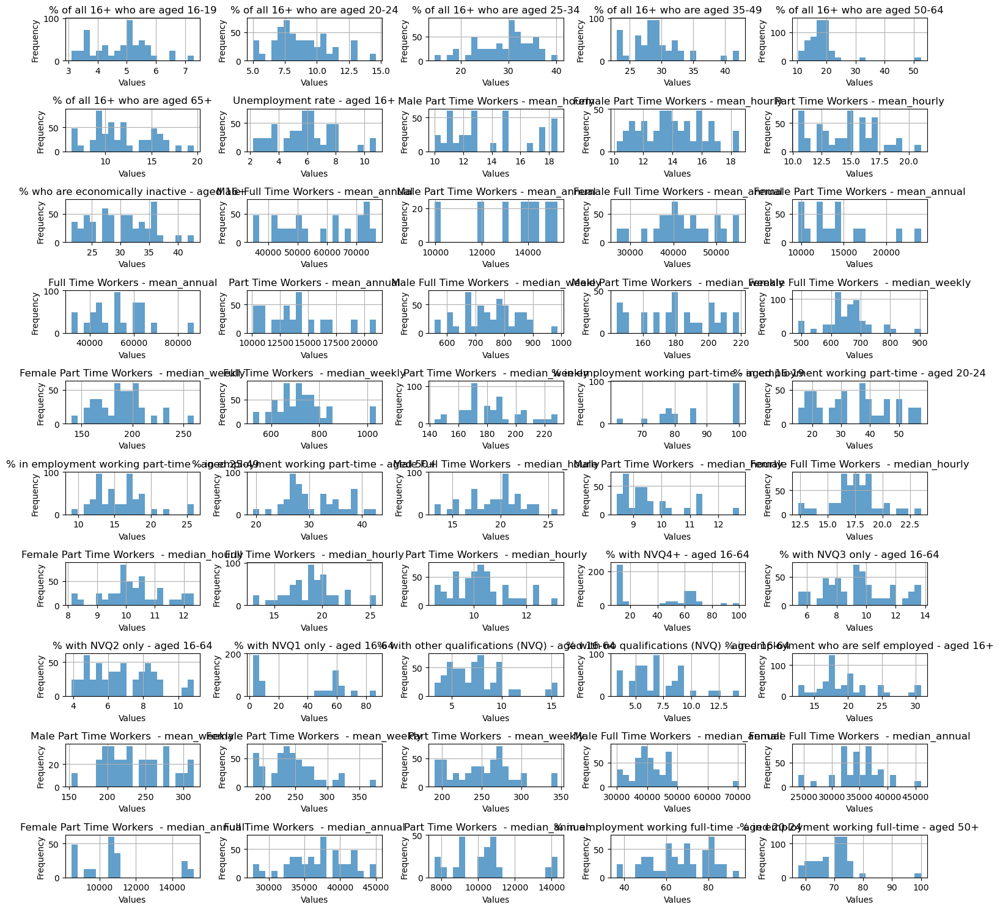

In [134]:
num_plots = merged_dataset[cols_with_missing].shape[1]
num_cols = 5  # Number of columns in the grid layout
num_rows = (num_plots - 1) // num_cols + 1  # Calculate the number of rows

# Create a grid of subplots to plot histograms
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Flatten the axes array to loop over all subplots
axes = axes.ravel()

# Loop through each column and plot the histogram in the corresponding subplot
for i, col in enumerate(merged_dataset[cols_with_missing].columns):
    merged_dataset[cols_with_missing][col].hist(bins=20, alpha=0.7, ax=axes[i])
    axes[i].set_xlabel('Values')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(col)

plt.tight_layout()  # Adjust subplot spacing
plt.show()


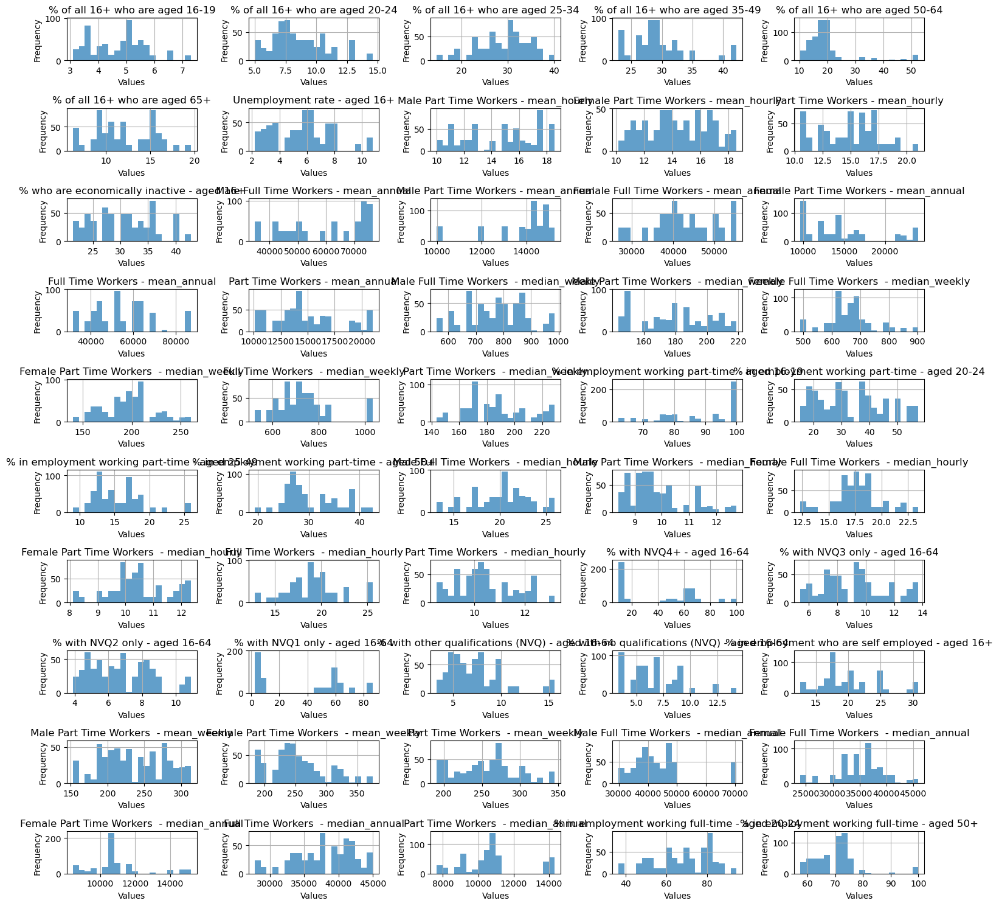

In [135]:
num_plots = merged_dataset_imputed[cols_with_missing].shape[1]
num_cols = 5  # Number of columns in the grid layout
num_rows = (num_plots - 1) // num_cols + 1  # Calculate the number of rows

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Flatten the axes array to loop over all subplots
axes = axes.ravel()

# Loop through each column and plot the histogram in the corresponding subplot
for i, col in enumerate(merged_dataset_imputed[cols_with_missing].columns):
    merged_dataset_imputed[cols_with_missing][col].hist(bins=20, alpha=0.7, ax=axes[i])
    axes[i].set_xlabel('Values')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(col)

plt.tight_layout()  # Adjust subplot spacing
plt.show()


In [136]:
# Assuming cols_with_missing is a list of column names with missing values in the DataFrame merged_dataset
missing_data_description = merged_dataset[cols_with_missing].describe()

print(missing_data_description)


       % of all 16+ who are aged 16-19  % of all 16+ who are aged 20-24  \
count                       528.000000                       528.000000   
mean                          4.784091                         8.795455   
std                           0.938231                         2.196076   
min                           3.100000                         5.000000   
25%                           4.025000                         7.175000   
50%                           4.950000                         8.300000   
75%                           5.425000                        10.250000   
max                           7.300000                        14.600000   

       % of all 16+ who are aged 25-34  % of all 16+ who are aged 35-49  \
count                       540.000000                       564.000000   
mean                         29.113333                        29.236170   
std                           5.665110                         4.290421   
min                     

In [137]:
# Assuming cols_with_missing is a list of column names with missing values in the DataFrame merged_dataset_imputed
imputed_data_description = merged_dataset_imputed[cols_with_missing].describe()

print(imputed_data_description)


       % of all 16+ who are aged 16-19  % of all 16+ who are aged 20-24  \
count                       576.000000                       576.000000   
mean                          4.716797                         8.592882   
std                           0.937828                         2.211118   
min                           3.100000                         5.000000   
25%                           3.800000                         7.000000   
50%                           4.862500                         8.100000   
75%                           5.400000                         9.900000   
max                           7.300000                        14.600000   

       % of all 16+ who are aged 25-34  % of all 16+ who are aged 35-49  \
count                       576.000000                       576.000000   
mean                         28.937500                        29.491667   
std                           5.527089                         4.593144   
min                     

### Mean Imputation

In [138]:

# Calculate the mean for each column
mean_values = merged_dataset.mean()

# Fill missing values with the corresponding column mean
merged_dataset_mean = merged_dataset.fillna(mean_values)


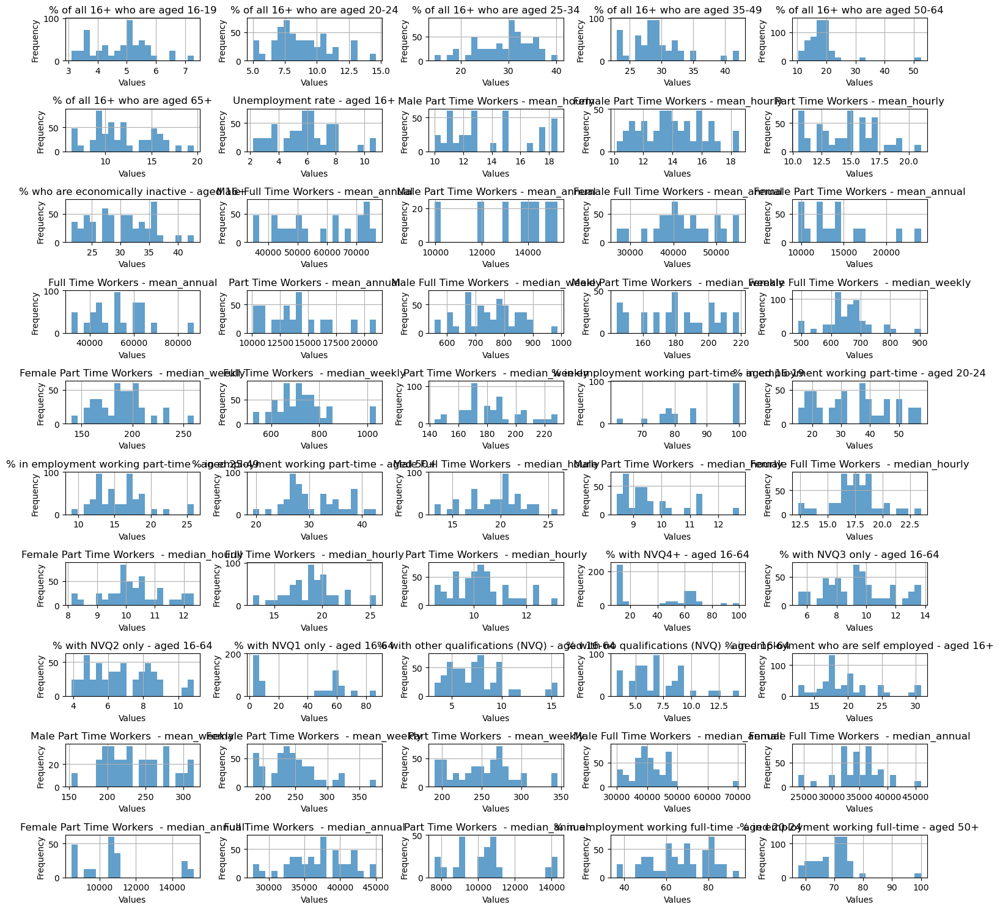

In [139]:
num_plots = merged_dataset[cols_with_missing].shape[1]
num_cols = 5  # Number of columns in the grid layout
num_rows = (num_plots - 1) // num_cols + 1  # Calculate the number of rows

# Create a grid of subplots to plot histograms
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Flatten the axes array to loop over all subplots
axes = axes.ravel()

# Loop through each column and plot the histogram in the corresponding subplot
for i, col in enumerate(merged_dataset[cols_with_missing].columns):
    merged_dataset[cols_with_missing][col].hist(bins=20, alpha=0.7, ax=axes[i])
    axes[i].set_xlabel('Values')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(col)

plt.tight_layout()  # Adjust subplot spacing
plt.show()


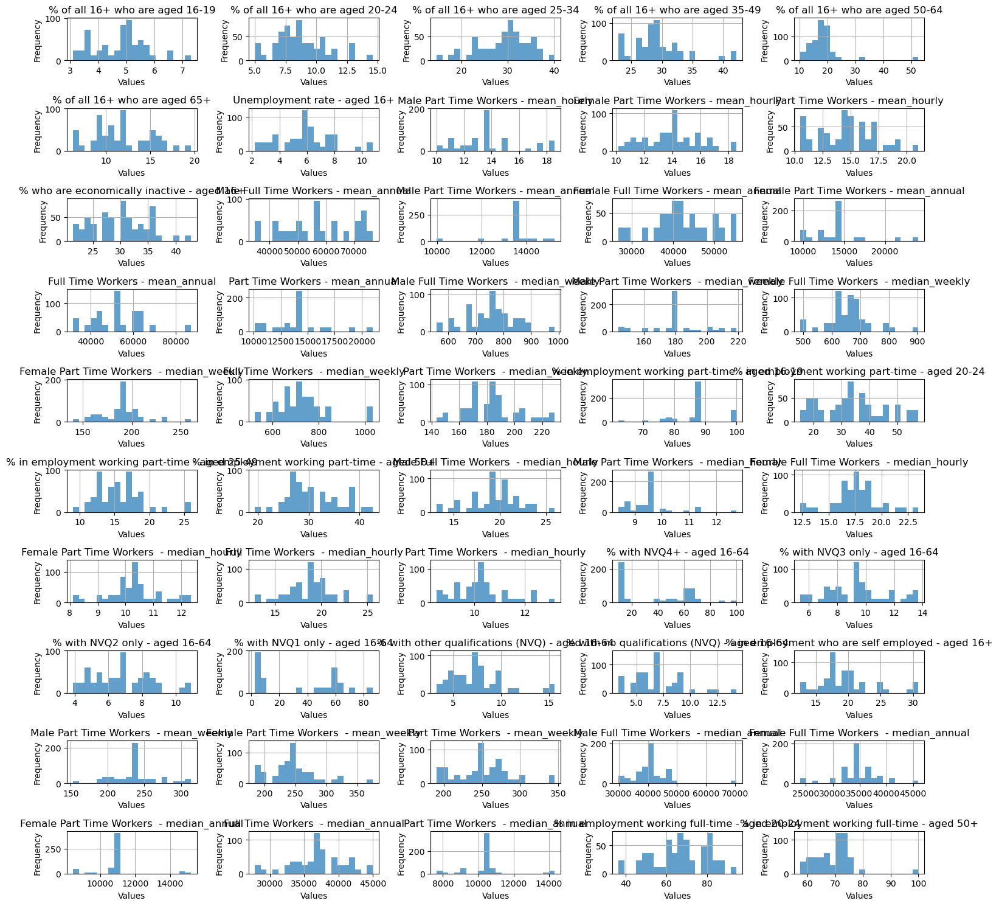

In [140]:
num_plots = merged_dataset_mean[cols_with_missing].shape[1]
num_cols = 5  # Number of columns in the grid layout
num_rows = (num_plots - 1) // num_cols + 1  # Calculate the number of rows

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Flatten the axes array to loop over all subplots
axes = axes.ravel()

# Loop through each column and plot the histogram in the corresponding subplot
for i, col in enumerate(merged_dataset_mean[cols_with_missing].columns):
    merged_dataset_mean[cols_with_missing][col].hist(bins=20, alpha=0.7, ax=axes[i])
    axes[i].set_xlabel('Values')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(col)

plt.tight_layout()  # Adjust subplot spacing
plt.show()


### Median Imputation

In [774]:

# Calculate the mean for each column
median_values = merged_dataset.median()

# Fill missing values with the corresponding column mean
merged_dataset_median = merged_dataset.fillna(median_values)


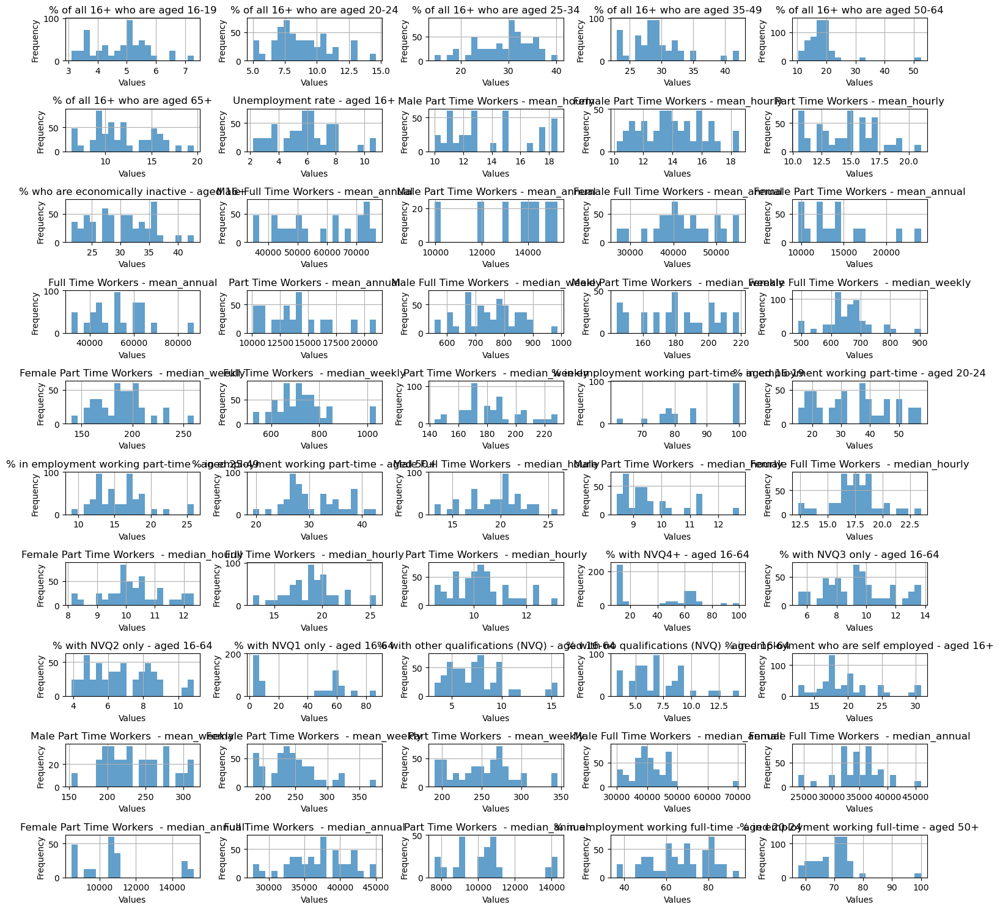

In [ ]:
num_plots = merged_dataset[cols_with_missing].shape[1]
num_cols = 5  # Number of columns in the grid layout
num_rows = (num_plots - 1) // num_cols + 1  # Calculate the number of rows

# Create a grid of subplots to plot histograms
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Flatten the axes array to loop over all subplots
axes = axes.ravel()

# Loop through each column and plot the histogram in the corresponding subplot
for i, col in enumerate(merged_dataset[cols_with_missing].columns):
    merged_dataset[cols_with_missing][col].hist(bins=20, alpha=0.7, ax=axes[i])
    axes[i].set_xlabel('Values')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(col)

plt.tight_layout()  # Adjust subplot spacing
plt.show()


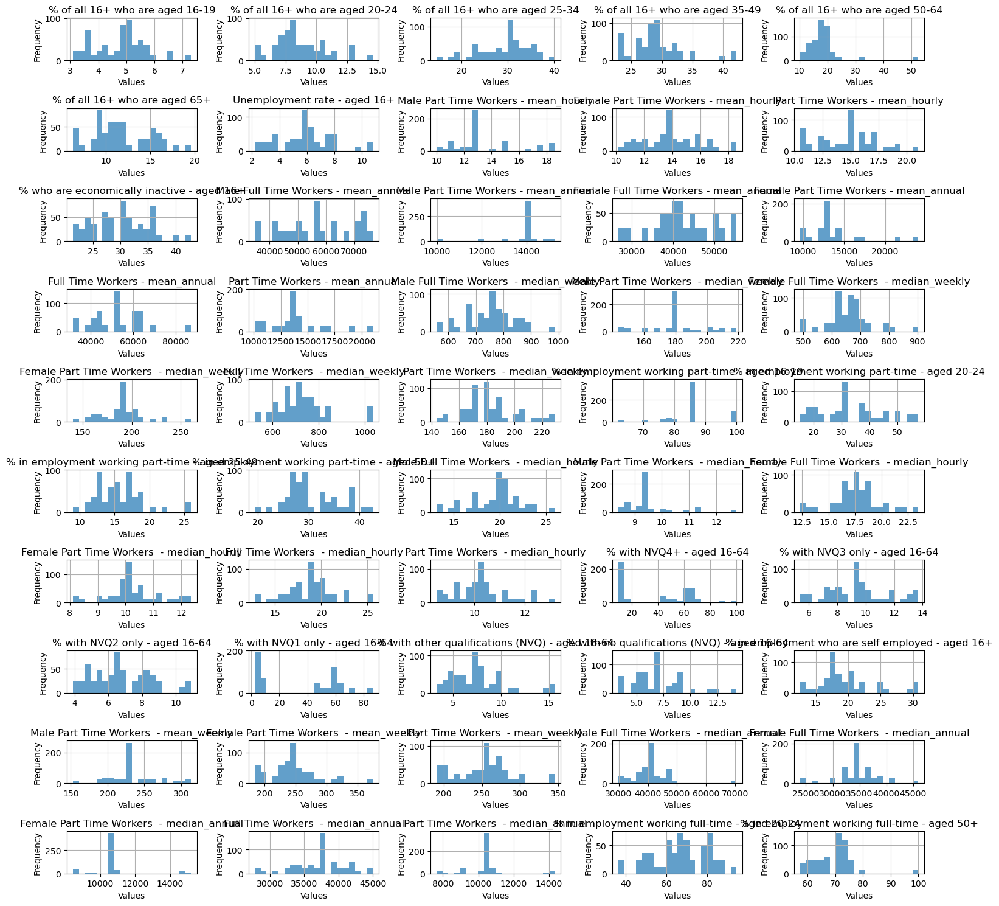

In [776]:
num_plots = merged_dataset_median[cols_with_missing].shape[1]
num_cols = 5  # Number of columns in the grid layout
num_rows = (num_plots - 1) // num_cols + 1  # Calculate the number of rows

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Flatten the axes array to loop over all subplots
axes = axes.ravel()

# Loop through each column and plot the histogram in the corresponding subplot
for i, col in enumerate(merged_dataset_median[cols_with_missing].columns):
    merged_dataset_median[cols_with_missing][col].hist(bins=20, alpha=0.7, ax=axes[i])
    axes[i].set_xlabel('Values')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(col)

plt.tight_layout()  # Adjust subplot spacing
plt.show()


# Split Data into training and testing sets After Imputation

### Split Data By Year

In [660]:
merged_dataset_imputed['start_year'].value_counts()

2016    144
2017    144
2018    144
2019    144
Name: start_year, dtype: int64

In [777]:
# Selecting data for the mean imputation approach
X_train_mean = merged_dataset_mean[merged_dataset_mean['start_year'].isin([2016, 2017, 2018])]
X_test_mean = merged_dataset_mean[merged_dataset_mean['start_year'].isin([2019])]

# Selecting data for the KNN imputation approach
X_train_knn = merged_dataset_imputed[merged_dataset_imputed['start_year'].isin([2016, 2017, 2018])]
X_test_knn = merged_dataset_imputed[merged_dataset_imputed['start_year'].isin([2019])]

# Selecting data for median imputation approach
X_train_median = merged_dataset_median[merged_dataset_median['start_year'].isin([2016, 2017, 2018])]
X_test_median = merged_dataset_median[merged_dataset_median['start_year'].isin([2019])]

# Printing the shapes of the datasets after mean imputation and KNN imputation
print("X_train_mean shape:", X_train_mean.shape)
print("X_test_mean shape:", X_test_mean.shape)
print("X_train_knn shape:", X_train_knn.shape)
print("X_test_knn shape:", X_test_knn.shape)
print("X_train_median shape:", X_train_median.shape)
print("X_test_median shape:", X_test_median.shape)

X_train_mean shape: (432, 162)
X_test_mean shape: (144, 162)
X_train_knn shape: (432, 162)
X_test_knn shape: (144, 162)
X_train_median shape: (432, 162)
X_test_median shape: (144, 162)


### Split the data into training and testing sets

In [779]:
# For KNN imputation
# Extracting the 'pickups' column as our target variable for training data
y_train_imputed = X_train_knn['pickups']
# Dropping the 'pickups' column from training data to get our feature matrix
X_train_imputed = X_train_knn.drop(['pickups'], axis=1)

# Extracting the 'pickups' column as our target variable for testing data
y_test_imputed = X_test_knn['pickups']
# Dropping the 'pickups' column from testing data to get our feature matrix
X_test_imputed = X_test_knn.drop(['pickups'], axis=1)


# For mean imputation
# Extracting the 'pickups' column as our target variable for training data
y_train_mean = X_train_mean['pickups']
# Dropping the 'pickups' column from training data to get our feature matrix
X_train_mean = X_train_mean.drop(['pickups'], axis=1)

# Extracting the 'pickups' column as our target variable for testing data
y_test_mean = X_test_mean['pickups']
# Dropping the 'pickups' column from testing data to get our feature matrix
X_test_mean = X_test_mean.drop(['pickups'], axis=1)


# For median imputation
# Extracting the 'pickups' column as our target variable for training data
y_train_median = X_train_median['pickups']
# Dropping the 'pickups' column from training data to get our feature matrix
X_train_median = X_train_median.drop(['pickups'], axis=1)

# Extracting the 'pickups' column as our target variable for testing data
y_test_median = X_test_median['pickups']
# Dropping the 'pickups' column from testing data to get our feature matrix
X_test_median = X_test_median.drop(['pickups'], axis=1)


In [780]:
print("Imputed data:", y_train_imputed.shape, y_test_imputed.shape, X_train_imputed.shape, X_test_imputed.shape)
print("Mean imputed data:", y_train_mean.shape, y_test_mean.shape, X_train_mean.shape, X_test_mean.shape)
print("Median imputed data:", y_train_median.shape, y_test_median.shape, X_train_median.shape, X_test_median.shape)

Imputed data: (432,) (144,) (432, 161) (144, 161)
Mean imputed data: (432,) (144,) (432, 161) (144, 161)
Median imputed data: (432,) (144,) (432, 161) (144, 161)


# EDA

### Correlation Analysis

In [ ]:
# Calculate the correlation of 'pickups' with other columns
correlation = X_train_mean.corr()['pickups'].sort_values(key=abs, ascending=False)

# Display the top 10 columns that have the highest absolute correlation
correlation.head(11)

pickups                                                               1.000000
borough_code_E09000033                                                0.758547
Full Time Workers - mean_annual                                       0.587056
Female Full Time Workers  - mean_weekly                               0.559485
Female Full Time Workers - mean_annual                                0.551996
Female Full Time Workers - mean_hourly                                0.550902
start_number_standard_bikes                                          -0.527253
start_number_of_bikes                                                -0.522215
Full Time Workers  - median_annual                                    0.512754
Barriers to Housing and Services - Rank of average score              0.507144
Employment - Proportion  of LSOAs in most deprived 10% nationally     0.504322
Name: pickups, dtype: float64

In [ ]:
# Calculate the correlation of 'pickups' with other columns
correlation = X_train_knn.corr()['pickups'].sort_values(key=abs, ascending=False)

# Display the top 10 columns that have the highest absolute correlation
correlation.head(11)

pickups                                                               1.000000
borough_code_E09000033                                                0.758547
Female Full Time Workers  - mean_weekly                               0.559485
Full Time Workers - mean_annual                                       0.559140
Female Full Time Workers - mean_annual                                0.550982
Female Full Time Workers - mean_hourly                                0.550902
start_number_standard_bikes                                          -0.527253
start_number_of_bikes                                                -0.522215
Female Full Time Workers  - median_annual                             0.508477
Barriers to Housing and Services - Rank of average score              0.507144
Employment - Proportion  of LSOAs in most deprived 10% nationally     0.504322
Name: pickups, dtype: float64

In [970]:
X_train_knn_copy = X_train_knn.copy()

#get columns that starts with borough_code_ and drop them
borough_code_columns = [col for col in X_train_knn_copy.columns if col.startswith('borough_code_')]
X_train_knn_copy.drop(borough_code_columns, axis=1, inplace=True)



# Calculate the correlation of 'pickups' with other columns
correlation = X_train_knn_copy.corr()['pickups'].sort_values(key=abs, ascending=False)

# Display the top 10 columns that have the highest absolute correlation
correlation.head(15)

pickups                                                                                            1.000000
Female Full Time Workers  - mean_weekly                                                            0.559485
Full Time Workers - mean_annual                                                                    0.559140
Female Full Time Workers - mean_annual                                                             0.550982
Female Full Time Workers - mean_hourly                                                             0.550902
start_number_standard_bikes                                                                       -0.527253
start_number_of_bikes                                                                             -0.522215
Female Full Time Workers  - median_annual                                                          0.508477
Barriers to Housing and Services - Rank of average score                                           0.507144
Employment - Proportion  of 

<Axes: >

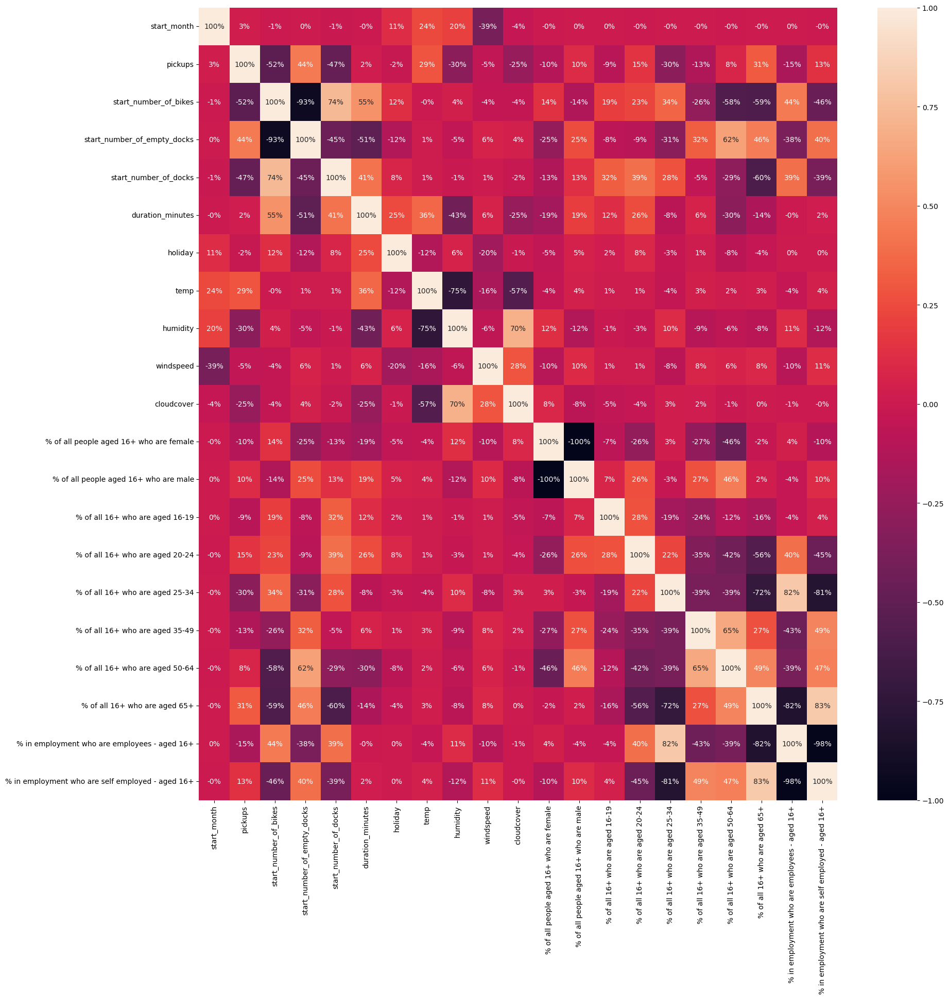

In [ ]:
key_variables = ["start_month", "pickups", "start_number_of_bikes", "start_number_of_empty_docks", "start_number_of_docks", "duration_minutes", 
                 "holiday", "temp", "humidity", "windspeed",'cloudcover',
                 "% of all people aged 16+ who are female", 
                 "% of all people aged 16+ who are male", 
                 "% of all 16+ who are aged 16-19", 
                 "% of all 16+ who are aged 20-24", 
                 "% of all 16+ who are aged 25-34", 
                 "% of all 16+ who are aged 35-49", 
                 "% of all 16+ who are aged 50-64", 
                 "% of all 16+ who are aged 65+",
                 "% in employment who are employees - aged 16+", 
                 "% in employment who are self employed - aged 16+"
                 ]

# plot correlation matrix heat map for key_variables
plt.figure(figsize=(20,20))
sns.heatmap(X_train_knn[key_variables].corr(), annot=True, fmt='.0%')


### Descriptive Statistics

In [ ]:
# Showing descriptive statistics (mean, standard deviation, min, max and quartiles)
X_train_knn.describe()

,start_year,start_month,pickups,duration_minutes,holiday,start_number_of_bikes,start_number_of_docks,start_number_of_empty_docks,start_number_standard_bikes,start_number_ebikes,temp,feelslike,humidity,windspeed,cloudcover,uvindex,dew,precip,visibility,population_density,average_house_price,% of all 16+ who are aged 16-19,% of all 16+ who are aged 20-24,% of all 16+ who are aged 25-34,% of all 16+ who are aged 35-49,% of all 16+ who are aged 50-64,% of all 16+ who are aged 65+,Unemployment rate - aged 16+,Male Full Time Workers - mean_hourly,Male Part Time Workers - mean_hourly,Female Full Time Workers - mean_hourly,Female Part Time Workers - mean_hourly,Full Time Workers - mean_hourly,Part Time Workers - mean_hourly,% of all people aged 16+ who are male,% of all people aged 16+ who are female,% who are economically inactive - aged 16+,Male Full Time Workers - mean_annual,Male Part Time Workers - mean_annual,Female Full Time Workers - mean_annual,Female Part Time Workers - mean_annual,Full Time Workers - mean_annual,Part Time Workers - mean_annual,Male Full Time Workers - median_weekly,Male Part Time Workers - median_weekly,Female Full Time Workers - median_weekly,Female Part Time Workers - median_weekly,Full Time Workers - median_weekly,Part Time Workers - median_weekly,% in employment working part-time - aged 16-19,% in employment working part-time - aged 20-24,% in employment working part-time - aged 25-49,% in employment working part-time - aged 50+,Male Full Time Workers - median_hourly,Male Part Time Workers - median_hourly,Female Full Time Workers - median_hourly,Female Part Time Workers - median_hourly,Full Time Workers - median_hourly,Part Time Workers - median_hourly,% with NVQ4+ - aged 16-64,% with NVQ3 only - aged 16-64,% with NVQ2 only - aged 16-64,% with NVQ1 only - aged 16-64,% with other qualifications (NVQ) - aged 16-64,% with no qualifications (NVQ) - aged 16-64,% in employment who are employees - aged 16+,% in employment who are self employed - aged 16+,Male Full Time Workers - mean_weekly,Male Part Time Workers - mean_weekly,Female Full Time Workers - mean_weekly,Female Part Time Workers - mean_weekly,Full Time Workers - mean_weekly,Part Time Workers - mean_weekly,Male Full Time Workers - median_annual,Female Full Time Workers - median_annual,Female Part Time Workers - median_annual,Full Time Workers - median_annual,Part Time Workers - median_annual,% in employment working full-time - aged 20-24,% in employment working full-time - aged 25-49,% in employment working full-time - aged 50+,Economic activity rate - aged 16+,IMD - Average rank,IMD - Rank of average rank,IMD - Average score,IMD - Rank of average score,IMD - Proportion of LSOAs in most deprived 10% nationally,IMD - Rank of proportion of LSOAs in most deprived 10% nationally,IMD 2019 - Extent,IMD 2019 - Rank of extent,IMD 2019 - Local concentration,IMD 2019 - Rank of local concentration,Income - Average rank,Income - Rank of average rank,Income - Average score,Income - Rank of average score,Income - Proportion of LSOAs in most deprived 10% nationally,Income - Rank of proportion of LSOAs in most deprived 10% nationally,Income scale,Rank of Income Scale,Employment - Average rank,Employment - Rank of average rank,Employment - Average score,Employment - Rank of average score,Employment - Proportion of LSOAs in most deprived 10% nationally,Employment - Rank of proportion of LSOAs in most deprived 10% nationally,Employment scale,Rank of Employment Scale,"Education, Skills and Training - Average rank","Education, Skills and Training - Rank of average rank","Education, Skills and Training - Average score","Education, Skills and Training - Rank of average score","Education, Skills and Training - Proportion of LSOAs in most deprived 10% nationally","Education, Skills and Training - Rank of proportion of LSOAs in most deprived 10% nationally",Health Deprivation and Disability - Average rank,Health Deprivation and Disability - Rank of average rank,Health Depriva

### Distributions

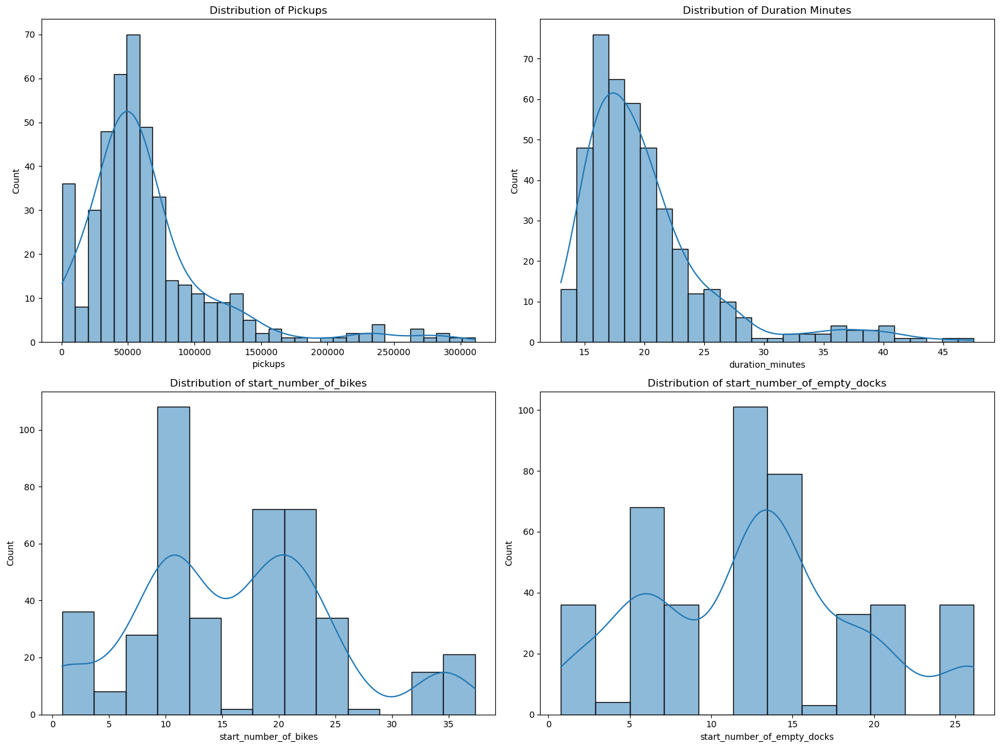

In [ ]:
# Create a figure with multiple subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Plot the distribution of pickups
sns.histplot(X_train_knn['pickups'], kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Distribution of Pickups')

# Plot the distribution of duration_minutes
sns.histplot(X_train_knn['duration_minutes'], kde=True, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Duration Minutes')

# Plot the distribution of Employment rate - aged 16+
sns.histplot(X_train_knn['start_number_of_bikes'], kde=True, ax=axes[1, 0])
axes[1, 0].set_title('Distribution of start_number_of_bikes')

# Plot the distribution of total_annual_median_pay
sns.histplot(X_train_knn['start_number_of_empty_docks'], kde=True, ax=axes[1, 1])
axes[1, 1].set_title('Distribution of start_number_of_empty_docks')


# Show the plots
plt.tight_layout()
plt.show()


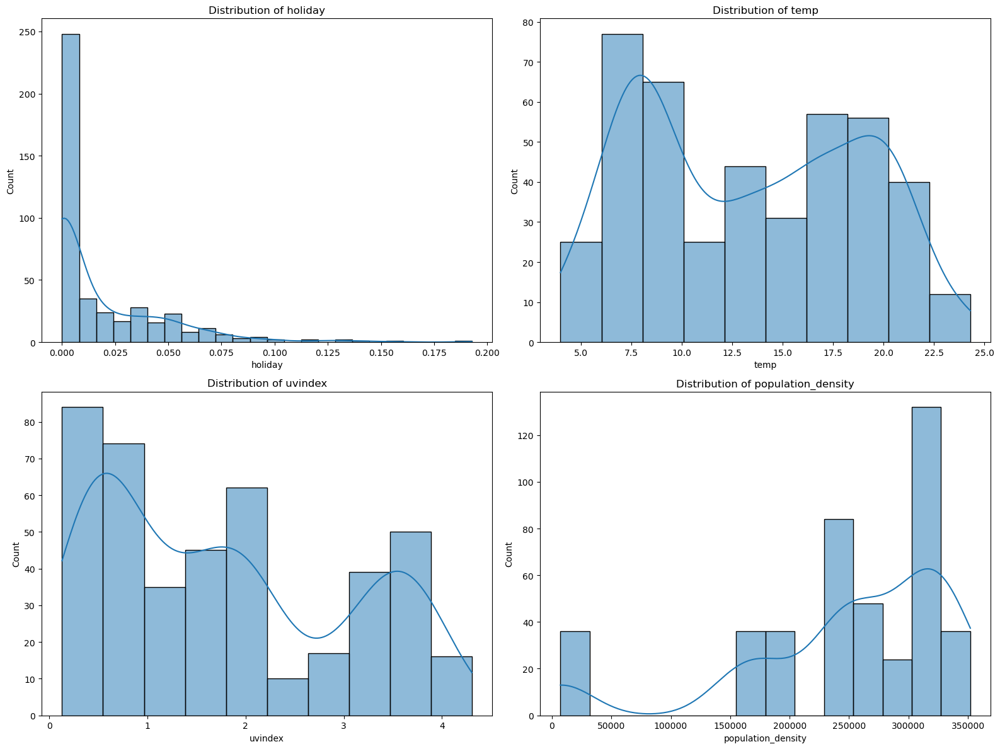

In [ ]:
# Create a figure with multiple subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Plot the distribution of pickups
sns.histplot(X_train_knn['holiday'], kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Distribution of holiday')

# Plot the distribution of duration_minutes
sns.histplot(X_train_knn['temp'], kde=True, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of temp')

# Plot the distribution of Employment rate - aged 16+
sns.histplot(X_train_knn['uvindex'], kde=True, ax=axes[1, 0])
axes[1, 0].set_title('Distribution of uvindex')

# Plot the distribution of total_annual_median_pay
sns.histplot(X_train_knn['population_density'], kde=True, ax=axes[1, 1])
axes[1, 1].set_title('Distribution of population_density')


# Show the plots
plt.tight_layout()
plt.show()


### Multi-colinearity Analyses (VIF)

In [ ]:
# Get features
features = X_train_knn.columns

# Prepare dataframe for VIF
vif_data = pd.DataFrame()
vif_data["feature"] = features

# Calculate VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_knn.values, i) for i in range(len(features))]

vif_data.sort_values(by='VIF', ascending=False)

/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


,feature,VIF
0,start_year,inf
82,IMD - Average rank,inf
104,Employment - Proportion of LSOAs in most depr...,inf
105,Employment - Rank of proportion of LSOAs in mo...,inf
106,Employment scale,inf
107,Rank of Employment Scale,inf
108,"Education, Skills and Training - Average rank",inf
109,"Education, Skills and Training - Rank of avera...",inf
110,"Education, Skills and Training - Average score",inf
111,"Education, Skills and Training - Rank of avera...",inf


### Scatter-plots

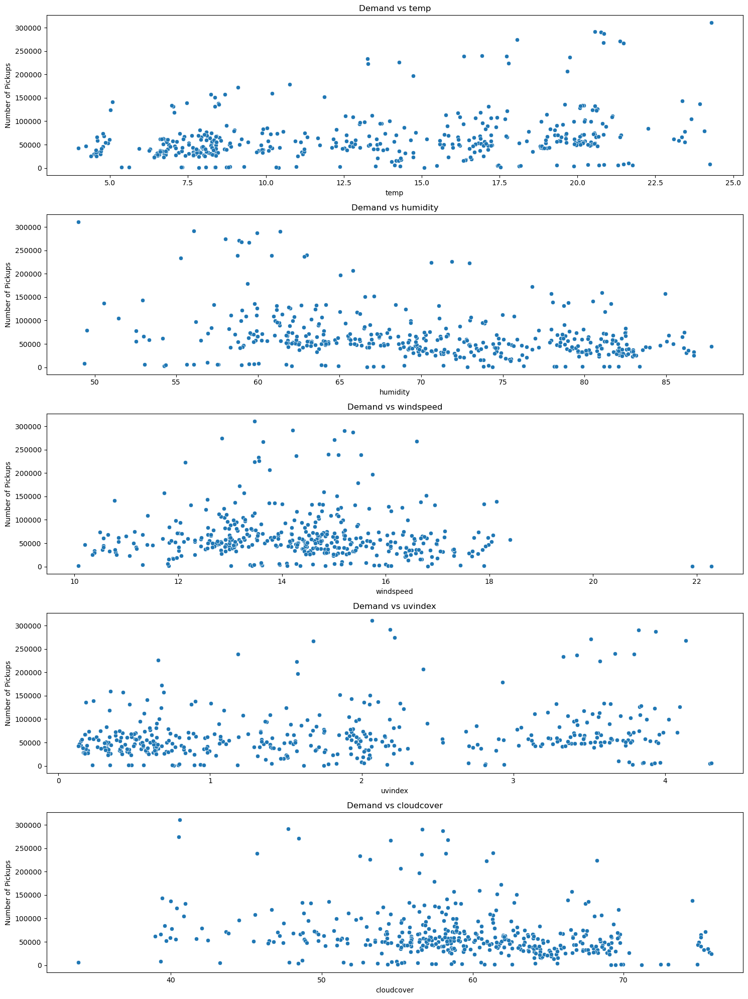

In [ ]:
# Create a list of features
features = ['temp', 'humidity', 'windspeed', 'uvindex', 'cloudcover']

plt.figure(figsize=(15, 20))

# Loop over the features and create subplots
for i, feature in enumerate(features):
    plt.subplot(len(features), 1, i+1)
    sns.scatterplot(data=X_train_knn, x=feature, y='pickups')
    plt.title('Demand vs ' + feature)
    plt.ylabel('Number of Pickups')

# Adjust the layout
plt.tight_layout()
plt.show()


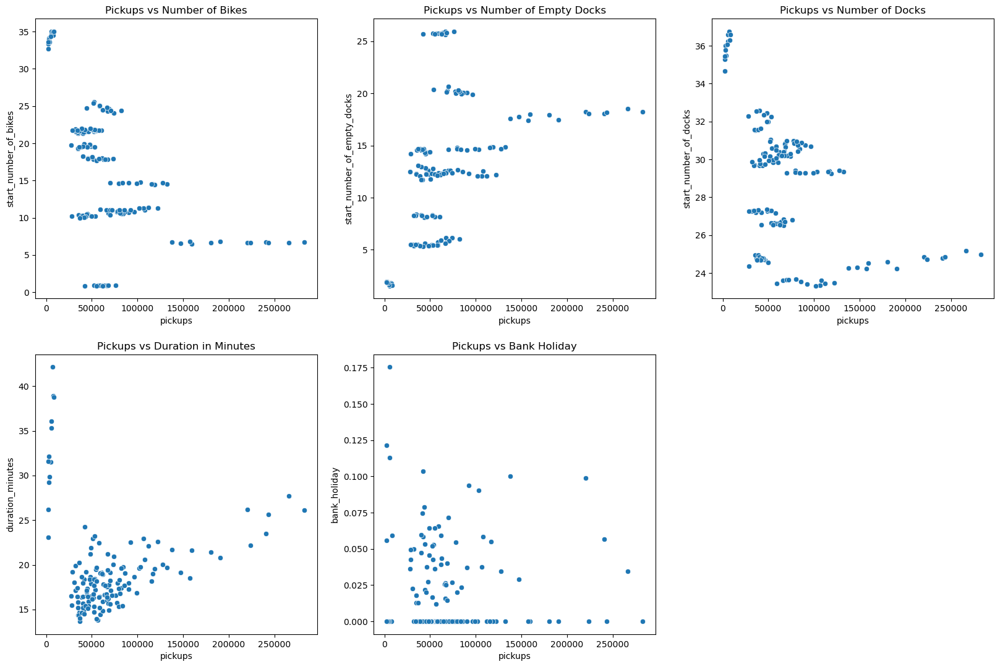

In [ ]:
# Initialize a figure with a size of 20x20 units for plotting multiple scatter plots.
plt.figure(figsize=(20, 20))

# Scatter plot: Pickups vs Number of Bikes.
plt.subplot(3, 3, 1)
sns.scatterplot(x='pickups', y='start_number_of_bikes', data=X_train_knn)
plt.title('Pickups vs Number of Bikes')

# Scatter plot: Pickups vs Number of Empty Docks.
plt.subplot(3, 3, 2)
sns.scatterplot(x='pickups', y='start_number_of_empty_docks', data=X_train_knn)
plt.title('Pickups vs Number of Empty Docks')

# Scatter plot: Pickups vs Total Number of Docks.
plt.subplot(3, 3, 3)
sns.scatterplot(x='pickups', y='start_number_of_docks', data=X_train_knn)
plt.title('Pickups vs Number of Docks')

# Scatter plot: Pickups vs Duration in Minutes.
plt.subplot(3, 3, 4)
sns.scatterplot(x='pickups', y='duration_minutes', data=X_train_knn)
plt.title('Pickups vs Duration in Minutes')

# Scatter plot: Pickups vs Whether it's a Bank Holiday or not.
plt.subplot(3, 3, 5)
sns.scatterplot(x='pickups', y='bank_holiday', data=X_train_knn)
plt.title('Pickups vs Bank Holiday')

# Display the plots.
plt.show()


### Time-series Analysis

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_62571/455946273.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train_knn['year_month'] = X_train_knn['start_year'].astype(str) + '-' + X_train_knn['start_month'].astype(str).str.zfill(2)


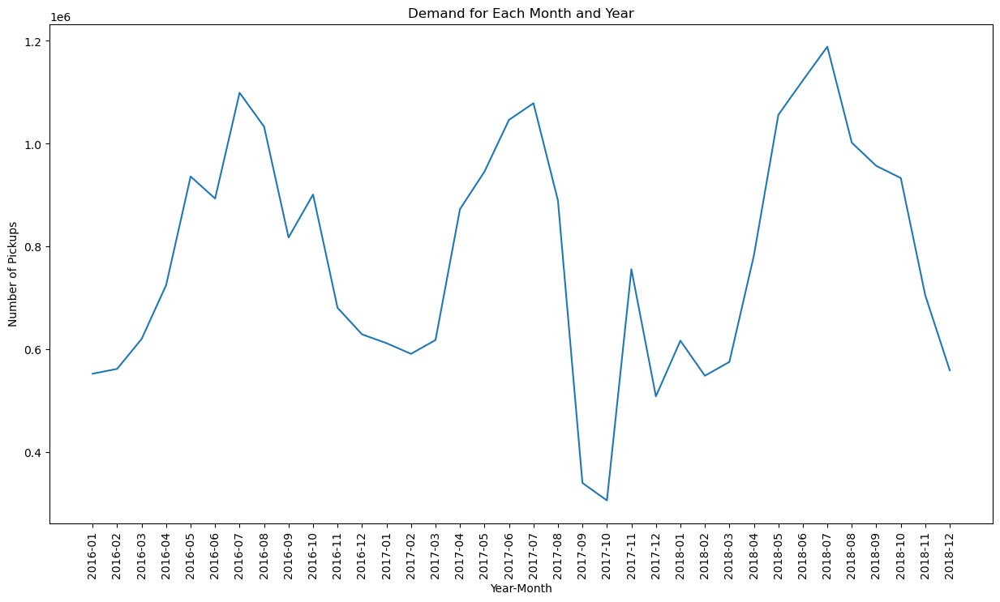

In [ ]:
# Generate a new 'year_month' column by combining 'start_year' and 'start_month' columns.
# This allows us to view data on a per month basis for each year.
# The zfill(2) ensures that single-digit months (e.g., 1, 2) are padded to two digits (01, 02).
X_train_knn['year_month'] = X_train_knn['start_year'].astype(str) + '-' + X_train_knn['start_month'].astype(str).str.zfill(2)

# Initialize a figure for plotting.
plt.figure(figsize=(15, 8))

# Group the data by 'year_month' and sum the 'pickups' for each group.
df_grouped = X_train_knn.groupby('year_month')['pickups'].sum().reset_index()

# Plot the summed pickups for each month-year.
sns.lineplot(data=df_grouped, x='year_month', y='pickups')

# Setting the x-axis labels to be rotated for better readability.
plt.xticks(rotation=90)

# Setting the title and axis labels.
plt.title('Demand for Each Month and Year')
plt.xlabel('Year-Month')
plt.ylabel('Number of Pickups')

# Display the plot.
plt.show()


In [ ]:
X_train_knn.drop(columns={'year_month'}, inplace=True)

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_62571/1779483785.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train_knn.drop(columns={'year_month'}, inplace=True)


### Borough Analysis

In [1374]:
# Sum up the total pickups for each borough
borough_pickups = X_train_knn.filter(regex='borough_code_').multiply(X_train_knn['pickups'], axis=0).sum()

# Create a DataFrame for the borough pickups
borough_pickups_df = pd.DataFrame(borough_pickups).reset_index()
borough_pickups_df.columns = ['borough', 'pickups']

# Plot the total pickups for each borough
plt.figure(figsize=(15,8))
sns.barplot(data=borough_pickups_df, x='borough', y='pickups')
plt.xticks(rotation=90)
plt.title('Total Pickups for Each Borough')
plt.xlabel('Borough')
plt.ylabel('Total Number of Pickups')
plt.show()


KeyError: 'pickups'

Here are a few observations:

Borough Code E09000033: This borough has the highest total number of pickups, which indicates a high demand for bikes in this area. This aligns with the results from our correlation analysis.
Other Boroughs: There are significant differences in the total number of pickups across different boroughs. Some boroughs have a high number of pickups, while others have relatively fewer. This suggests that the location (i.e., borough) is an important factor influencing the demand for bikes.

### Outlier Analysis

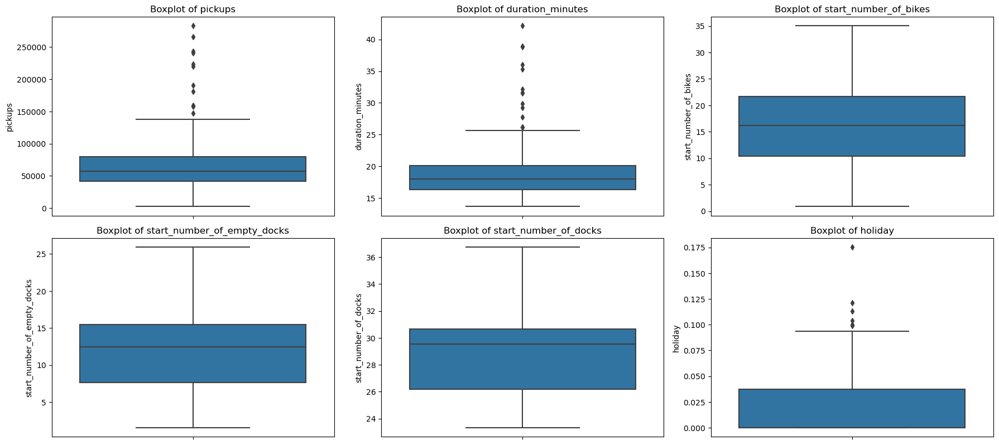

In [ ]:
# List of features for which boxplots are to be generated.
features = ['pickups', 'duration_minutes', 'start_number_of_bikes', 'start_number_of_empty_docks', 'start_number_of_docks', 'holiday']

# Create a new figure instance with a specified size.
fig = plt.figure(figsize=(18, 12))

# Iterate through each feature to generate a subplot with its respective boxplot.
for i, feature in enumerate(features):
    # Create a subplot for the current feature.
    ax = fig.add_subplot(3, 3, i+1)
    
    # Plot the boxplot for the current feature.
    sns.boxplot(y=X_test_knn[feature], ax=ax)
    
    # Set the title for the subplot.
    ax.set_title(f'Boxplot of {feature}')

# Adjust the layout to ensure the subplots do not overlap.
plt.tight_layout()

# Display the complete figure with all subplots.
plt.show()


Here are a few observations:

Pickups: The number of pickups has several outliers, especially on the higher end. This indicates that there are some periods with a significantly higher demand than usual.
Duration of Bike Usage: This feature also has many outliers, with some extremely high values. This suggests that while the duration of bike usage is typically within a certain range, there are some instances where the duration is significantly longer.
Number of Bikes at Start: There are several outliers with high values. This suggests that while the number of bikes at the start is typically within a certain range, there are some periods with a significantly higher number of bikes.
Number of Empty Docks at Start: There are outliers on both ends, indicating that there are periods with a significantly higher or lower number of empty docks than usual.
Total Number of Docks: This feature also has outliers on both ends, indicating that there are periods with a significantly higher or lower total number of docks than usual.
Holiday: This is a binary feature, with most of the values being 0 (non-holiday). The box plot shows that there are fewer data points for holidays, which is expected as holidays are less frequent.

# First round: Classification Model - All Features(2019)

In [663]:
# Create a copy of the test dataset to avoid altering the original data
X1 = X_test_grouped.copy()

# Mean Imputation: Replace missing values with the mean of the respective column
X1_mean_imputation = X1.fillna(X1.mean())

# Zero Imputation: Replace missing values with zeros
X1_zero_imputation = X1.fillna(0)

# Median Imputation: Replace missing values with the median of the respective column
X1_median_imputation = X1.fillna(X1.median())


/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_39026/3055582505.py:3: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  X1_mean_imputation = X1.fillna(X1.mean())
/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_39026/3055582505.py:7: FutureWarning: The default value of numeric_only in DataFrame.median is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  X1_median_imputation = X1.fillna(X1.median())


In [664]:
# Use one-hot encoding
X1_mean_imputation = pd.get_dummies(X1_mean_imputation, columns=['start_borough_code'], prefix='borough_code_')

# Use one-hot encoding
X1_zero_imputation = pd.get_dummies(X1_zero_imputation, columns=['start_borough_code'], prefix='borough_code_')

# Use one-hot encoding
X1_median_imputation = pd.get_dummies(X1_median_imputation, columns=['start_borough_code'], prefix='borough_code_')

### Clustering

In [665]:
# Extract the relevant columns
X_train_mean_cluster = X1_mean_imputation[['pickups'] ]

# Extract the relevant columns
X_train_zero_cluster = X1_zero_imputation[['pickups'] ]

# Extract the relevant columns
X_train_median_cluster = X1_median_imputation[['pickups'] ]

In [668]:
# Initialize K-means with k=2
kmeans = KMeans(n_clusters=2, random_state=0, n_init=10)

# Fit the model to the data
X1_mean_imputation = X1_mean_imputation.copy()
X1_mean_imputation['cluster_labels'] = kmeans.fit_predict(X_train_mean_cluster)

# Fit the model to the data
X1_zero_imputation = X1_zero_imputation.copy()
X1_zero_imputation['cluster_labels'] = kmeans.fit_predict(X_train_zero_cluster)

# Fit the model to the data
X1_median_imputation = X1_median_imputation.copy()
X1_median_imputation['cluster_labels'] = kmeans.fit_predict(X_train_median_cluster)


In [670]:
X1_mean_imputation['cluster_labels'].value_counts()

0    130
1     14
Name: cluster_labels, dtype: int64

In [671]:
X1_median_imputation['cluster_labels'].value_counts()

0    130
1     14
Name: cluster_labels, dtype: int64

In [672]:
X1_zero_imputation['cluster_labels'].value_counts()

0    130
1     14
Name: cluster_labels, dtype: int64

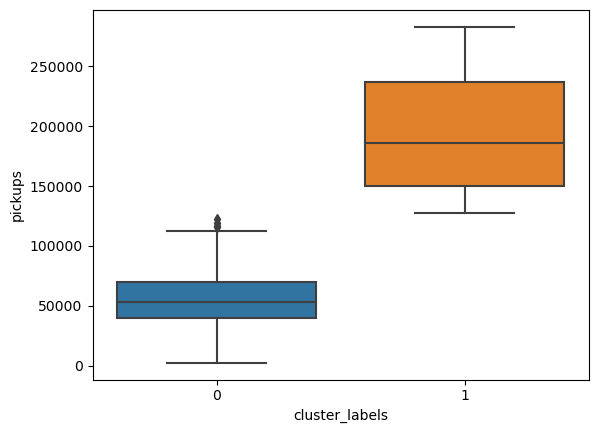

In [551]:
# plot box plot for pickups by cluster
sns.boxplot(x='cluster_labels', y='pickups', data=X1_mean_imputation)
plt.show()

In [673]:
# Splitting the mean-imputed dataset into training and testing sets:
# Dropping 'pickups' and 'cluster_labels' from features, and using 'cluster_labels' as the target variable
X1_train_mean, X1_test_mean, y1_train_mean, y1_test_mean = train_test_split(
    X1_mean_imputation.drop(columns=['pickups', 'cluster_labels']),  # Features
    X1_mean_imputation['cluster_labels'],  # Target
    test_size=0.25,  # 25% of the data used for testing
    random_state=42  # To ensure reproducibility
)

# Splitting the median-imputed dataset similarly
X1_train_median, X1_test_median, y1_train_median, y1_test_median = train_test_split(
    X1_median_imputation.drop(columns=['pickups', 'cluster_labels']),
    X1_median_imputation['cluster_labels'],
    test_size=0.25,
    random_state=42
)

# Splitting the zero-imputed dataset similarly
X1_train_zero, X1_test_zero, y1_train_zero, y1_test_zero = train_test_split(
    X1_zero_imputation.drop(columns=['pickups', 'cluster_labels']),
    X1_zero_imputation['cluster_labels'],
    test_size=0.25,
    random_state=42
)


In [674]:
# print shapes of train and test sets for mean
print("Mean Train shape:", X1_train_mean.shape, "Mean Test shape:", X1_test_mean.shape)

# print shapes of train and test sets for median
print("Median Train shape:", X1_train_median.shape, "Median Test shape:", X1_test_median.shape)

# print shapes of train and test sets for zero
print("Zero Train shape:", X1_train_zero.shape, "Zero Test shape:", X1_test_zero.shape)

Mean Train shape: (108, 161) Mean Test shape: (36, 161)
Median Train shape: (108, 161) Median Test shape: (36, 161)
Zero Train shape: (108, 161) Zero Test shape: (36, 161)


### Decision Tree Classifier

#### Mean Fill

In [679]:
# Initialize the Decision Tree model
model = DecisionTreeClassifier(random_state=42)

# Define the initial hyperparameters to search
param_grid = {
    'max_depth': [6, 8, 10, 13, 15, 18, 20],
    'min_samples_split': [4, 5, 6, 7, 8, 9, 13, 14, 17, 20],
    'min_samples_leaf': [4, 5, 6, 7, 8, 9, 12, 13]
}

# Initialize the grid search with a 5-fold cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, verbose=1)

# Set the initial conditions for overfitting checks and iteration limits
overfitting = True
iteration = 0
max_iterations = 20

# Loop until overfitting is mitigated or max iterations reached
while overfitting and iteration < max_iterations:
    print('param_grid', iteration, ":", param_grid)

    # Fit the grid search on the training data
    grid_search.fit(X1_train_mean, y1_train_mean)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X1_train_mean)
    y_pred_test = grid_search.predict(X1_test_mean)

    # Compute the accuracy scores for both training and testing sets
    train_acc = accuracy_score(y1_train_mean, y_pred_train)
    test_acc = accuracy_score(y1_test_mean, y_pred_test)
    print(train_acc, test_acc)

    # Check if the difference between the train and test score is within a set threshold (0.05)
    if np.abs(train_acc - test_acc) < 0.05:
        overfitting = False
    else:
        # If overfitting exists, adjust the parameters for the next iteration of grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d-1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s+1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l+1 for l in param_grid['min_samples_leaf']]
        print('param_grid', iteration, ":", param_grid)

    # Increase the iteration counter for the next loop
    iteration += 1

# After the loop ends, print the best found parameters and their corresponding score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Print the detailed classification report for both training and testing sets
print("Train Classification Report:")
print(classification_report(y1_train_mean, y_pred_train))
print("Test Classification Report:")
print(classification_report(y1_test_mean, y_pred_test))

# Print the Area Under Curve (AUC) score for both training and testing sets
print("Train AUC score:", roc_auc_score(y1_train_mean, y_pred_train))
print("Test AUC score:", roc_auc_score(y1_test_mean, y_pred_test))

# Display the importance of each feature in the decision tree model
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X1_train_mean.columns), reverse=True):
    print(name, importance)


param_grid 0 : {'max_depth': [6, 8, 10, 13, 15, 18, 20], 'min_samples_split': [4, 5, 6, 7, 8, 9, 13, 14, 17, 20], 'min_samples_leaf': [4, 5, 6, 7, 8, 9, 12, 13]}
Fitting 5 folds for each of 560 candidates, totalling 2800 fits
0.9814814814814815 1.0
Best parameters: {'max_depth': 6, 'min_samples_leaf': 4, 'min_samples_split': 4}
Best score: 0.9818181818181818
Train Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        96
           1       1.00      0.83      0.91        12

    accuracy                           0.98       108
   macro avg       0.99      0.92      0.95       108
weighted avg       0.98      0.98      0.98       108

Test Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00         2

    accuracy                           1.00        36
   macro avg       1.00      1.00    

### Median Fill

In [682]:
# Initialize the Decision Tree model
model = DecisionTreeClassifier(random_state=42)

# Define the initial hyperparameters to search
param_grid = {
    'max_depth': [4, 5, 6, 7, 8, 9, 10, 12, 14, 15, 17],
    'min_samples_split': [2, 5, 6, 7, 8, 9],
    'min_samples_leaf': [1, 4, 5, 6, 7, 8, 9]
}

# Initialize the grid search with 5-fold cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, verbose=1)

# Set the initial conditions for overfitting checks and iteration limits
overfitting = True
iteration = 0
max_iterations = 5

# Loop until overfitting is mitigated or max iterations reached
while overfitting and iteration < max_iterations:
    print('param_grid', iteration, ":", param_grid)

    # Fit the grid search on the training data
    grid_search.fit(X1_train_median, y1_train_median)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X1_train_median)
    y_pred_test = grid_search.predict(X1_test_median)

    # Compute the accuracy scores for both training and testing sets
    train_acc = accuracy_score(y1_train_median, y_pred_train)
    test_acc = accuracy_score(y1_test_median, y_pred_test)
    print(train_acc, test_acc)

    # Check if the difference between the train and test score is within a set threshold (0.05)
    if np.abs(train_acc - test_acc) < 0.05:
        overfitting = False
    else:
        # If overfitting exists, adjust the parameters for the next iteration of grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d-1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s+1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l+1 for l in param_grid['min_samples_leaf']]
        print('param_grid', iteration, ":", param_grid)

    # Increase the iteration counter for the next loop
    iteration += 1

# After the loop ends, print the best found parameters and their corresponding score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Print the detailed classification report for both training and testing sets
print("Train Classification Report:")
print(classification_report(y1_train_median, y_pred_train))
print("Test Classification Report:")
print(classification_report(y1_test_median, y_pred_test))

# Print the Area Under Curve (AUC) score for both training and testing sets
print("Train AUC score:", roc_auc_score(y1_train_median, y_pred_train))
print("Test AUC score:", roc_auc_score(y1_test_median, y_pred_test))

# Display the importance of each feature in the decision tree model
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X1_train_median.columns), reverse=True):
    print(name, importance)


param_grid 0 : {'max_depth': [4, 5, 6, 7, 8, 9, 10, 12, 14, 15, 17], 'min_samples_split': [2, 5, 6, 7, 8, 9], 'min_samples_leaf': [1, 4, 5, 6, 7, 8, 9]}
Fitting 5 folds for each of 462 candidates, totalling 2310 fits
1.0 1.0
Best parameters: {'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 5}
Best score: 0.9818181818181818
Train Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        96
           1       1.00      1.00      1.00        12

    accuracy                           1.00       108
   macro avg       1.00      1.00      1.00       108
weighted avg       1.00      1.00      1.00       108

Test Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00         2

    accuracy                           1.00        36
   macro avg       1.00      1.00      1.00        36
weighte

### Zero Fill

In [681]:
# Initialize the model
model = DecisionTreeClassifier(random_state=42)

# Define the initial parameters to search
param_grid = {
    'max_depth': [4, 5, 6, 7, 8, 9, 10, 12, 14, 15, 17],
    'min_samples_split': [4, 5, 6, 7, 8, 9],
    'min_samples_leaf': [4, 5, 6, 7, 8, 9]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, verbose=1)

# Track overfitting and iteration count
overfitting = True
iteration = 0
max_iterations = 5

while overfitting and iteration < max_iterations:
    print('param_grid', iteration, ":", param_grid)

    # Fit the grid search
    grid_search.fit(X1_train_zero, y1_train_zero)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X1_train_zero)
    y_pred_test = grid_search.predict(X1_test_zero)

    # Compute the accuracy scores
    train_acc = accuracy_score(y1_train_zero, y_pred_train)
    test_acc = accuracy_score(y1_test_zero, y_pred_test)

    print(train_acc, test_acc)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_acc - test_acc) < 0.05:
        overfitting = False
    else:
        # Adjust the parameters and repeat the grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d - 1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s + 1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l + 1 for l in param_grid['min_samples_leaf']]

        print('param_grid', iteration, ":", param_grid)

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Print the classification report
print("Train Classification Report:")
print(classification_report(y1_train_zero, y_pred_train))
print("Test Classification Report:")
print(classification_report(y1_test_zero, y_pred_test))

# Print AUC scores
print("Train AUC score:", roc_auc_score(y1_train_mean, y_pred_train))
print("Test AUC score:", roc_auc_score(y1_test_mean, y_pred_test))

# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X1_train_zero.columns), reverse=True):
    print(name, importance)


param_grid 0 : {'max_depth': [4, 5, 6, 7, 8, 9, 10, 12, 14, 15, 17], 'min_samples_split': [4, 5, 6, 7, 8, 9], 'min_samples_leaf': [4, 5, 6, 7, 8, 9]}
Fitting 5 folds for each of 396 candidates, totalling 1980 fits


0.9814814814814815 1.0
Best parameters: {'max_depth': 4, 'min_samples_leaf': 4, 'min_samples_split': 4}
Best score: 0.9818181818181818
Train Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        96
           1       1.00      0.83      0.91        12

    accuracy                           0.98       108
   macro avg       0.99      0.92      0.95       108
weighted avg       0.98      0.98      0.98       108

Test Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00         2

    accuracy                           1.00        36
   macro avg       1.00      1.00      1.00        36
weighted avg       1.00      1.00      1.00        36

Train AUC score: 0.9166666666666667
Test AUC score: 1.0
Feature importances:
Female Full Time Workers  - mean_weekly 0.900774102744546
temp 0.051724137931

### Evaluate the model

In [684]:
#import roc auc score
from sklearn.metrics import roc_auc_score

# build decision tree classifier
model = DecisionTreeClassifier( max_depth=6, min_samples_split=4, min_samples_leaf=6)

# fit the model
model.fit(X1_train_mean, y1_train_mean)

# predict the response
y1_pred_mean = model.predict(X1_test_mean)
y1_pred_train = model.predict(X1_train_mean)

#build classification report for train
print("Training Report:", classification_report(y1_train_mean, y1_pred_train))

# build classification report
print("Testing Report:", classification_report(y1_test_mean, y1_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y1_test_mean, y1_pred_mean))

# build accuracy score
print("Accuracy Score: ",accuracy_score(y1_test_mean, y1_pred_mean))

# build roc_auc_score
print("ROC AUC Score", roc_auc_score(y1_test_mean, y1_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       0.98      1.00      0.99        96
           1       1.00      0.83      0.91        12

    accuracy                           0.98       108
   macro avg       0.99      0.92      0.95       108
weighted avg       0.98      0.98      0.98       108

Testing Report:               precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00         2

    accuracy                           1.00        36
   macro avg       1.00      1.00      1.00        36
weighted avg       1.00      1.00      1.00        36

Confusion Matrix: [[34  0]
 [ 0  2]]
Accuracy Score:  1.0
ROC AUC Score 1.0


In [685]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X1_train_mean.columns), reverse=True):
    print(name, importance)


Feature importances:
borough_code__E09000033 0.9499072356215212
IDAOPI - Rank of average score  0.05009276437847876
windspeed 0.0
visibility 0.0
uvindex 0.0
temp 0.0
start_year 0.0
start_number_standard_bikes 0.0
start_number_of_empty_docks 0.0
start_number_of_docks 0.0
start_number_of_bikes 0.0
start_number_ebikes 0.0
start_month 0.0
precip 0.0
population_density 0.0
humidity 0.0
holiday 0.0
feelslike 0.0
duration_minutes 0.0
dew 0.0
cloudcover 0.0
borough_code__E09000032 0.0
borough_code__E09000030 0.0
borough_code__E09000028 0.0
borough_code__E09000025 0.0
borough_code__E09000022 0.0
borough_code__E09000020 0.0
borough_code__E09000019 0.0
borough_code__E09000013 0.0
borough_code__E09000012 0.0
borough_code__E09000007 0.0
borough_code__E09000001 0.0
average_house_price 0.0
Unemployment rate - aged 16+ 0.0
Rank of Income Scale 0.0
Rank of Employment Scale 0.0
Part Time Workers - mean_hourly 0.0
Part Time Workers - mean_annual 0.0
Part Time Workers  - median_weekly 0.0
Part Time Worker

In [1292]:
#import roc auc score
from sklearn.metrics import roc_auc_score

# build decision tree classifier
model = DecisionTreeClassifier( max_depth=6, min_samples_split=4, min_samples_leaf=6)

# fit the model
model.fit(X1_train_median, y1_train_median)

# predict the response
y1_pred_median = model.predict(X1_test_median)
y1_pred_train = model.predict(X1_train_median)

#build classification report for train
print("Training Report:", classification_report(y1_train_median, y1_pred_train))

# build classification report
print("Testing Report:", classification_report(y1_test_median, y1_pred_median))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y1_test_median, y1_pred_median))

# build accuracy score
print("Accuracy Score: ",accuracy_score(y1_test_median, y1_pred_median))

# build roc_auc_score
print("ROC AUC Score", roc_auc_score(y1_test_median, y1_pred_median))

print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X1_train_median.columns), reverse=True):
    print(name, importance)

Training Report:               precision    recall  f1-score   support

           0       0.98      1.00      0.99        96
           1       1.00      0.83      0.91        12

    accuracy                           0.98       108
   macro avg       0.99      0.92      0.95       108
weighted avg       0.98      0.98      0.98       108

Testing Report:               precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00         2

    accuracy                           1.00        36
   macro avg       1.00      1.00      1.00        36
weighted avg       1.00      1.00      1.00        36

Confusion Matrix: [[34  0]
 [ 0  2]]
Accuracy Score:  1.0
ROC AUC Score 1.0
Feature importances:
Full Time Workers  - median_annual 0.9499072356215212
Unemployment rate - aged 16+ 0.05009276437847876
windspeed 0.0
visibility 0.0
uvindex 0.0
temp 0.0
start_year 0.0
start_number_standard_bikes 0.0
start_number_of_

In [1293]:
#import roc auc score
from sklearn.metrics import roc_auc_score

# build decision tree classifier
model = DecisionTreeClassifier( max_depth=6, min_samples_split=4, min_samples_leaf=6)

# fit the model
model.fit(X1_train_zero, y1_train_zero)

# predict the response
y1_pred_median = model.predict(X1_test_zero)
y1_pred_train = model.predict(X1_train_zero)

#build classification report for train
print("Training Report:", classification_report(y1_train_zero, y1_pred_train))

# build classification report
print("Testing Report:", classification_report(y1_test_zero, y1_pred_median))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y1_test_zero, y1_pred_median))

# build accuracy score
print("Accuracy Score: ",accuracy_score(y1_test_zero, y1_pred_median))

# build roc_auc_score
print("ROC AUC Score", roc_auc_score(y1_test_zero, y1_pred_median))

print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X1_train_zero.columns), reverse=True):
    print(name, importance)

Training Report:               precision    recall  f1-score   support

           0       0.98      1.00      0.99        96
           1       1.00      0.83      0.91        12

    accuracy                           0.98       108
   macro avg       0.99      0.92      0.95       108
weighted avg       0.98      0.98      0.98       108

Testing Report:               precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00         2

    accuracy                           1.00        36
   macro avg       1.00      1.00      1.00        36
weighted avg       1.00      1.00      1.00        36

Confusion Matrix: [[34  0]
 [ 0  2]]
Accuracy Score:  1.0
ROC AUC Score 1.0
Feature importances:
Economic activity rate - aged 16+ 0.9499072356215212
IDAOPI - Rank of average score  0.05009276437847876
windspeed 0.0
visibility 0.0
uvindex 0.0
temp 0.0
start_year 0.0
start_number_standard_bikes 0.0
start_number_o

#  Second Round: Classification Model - Only features with high correlation and feature selection method (2019)

### Pre-processing data

In [611]:
# create X2 with the following features only, start_month, start_borough_code, pickups, Female Part Time Workers  - median_annual, Male Full Time Workers  - median_weekly, Employment - Proportion  of LSOAs in most deprived 10% nationally, Barriers to Housing and Services - Rank of average score, Barriers to Housing and Services - Rank of proportion of LSOAs in most deprived 10% nationally, Female Full Time Workers  - mean_weekly, Female Full Time Workers - mean_hourly, Full Time Workers  - median_annual, Female Full Time Workers - mean_annual, Female Full Time Workers  - median_annual, Female Part Time Workers  - median_annual, start_number_standard_bikes, start_number_of_bikes, Barriers to Housing and Services - Average score, start_number_of_docks, Health Deprivation and Disability - Proportion of LSOAs in most deprived 10% nationally, duration_minutes
X2 = X_test_grouped[['start_month', 'start_borough_code', 'pickups', 'Female Part Time Workers  - median_annual',
                    'Male Full Time Workers  - median_weekly', 'Employment - Proportion  of LSOAs in most deprived 10% nationally ', 
                    'Barriers to Housing and Services - Rank of average score ', 
                    'Barriers to Housing and Services - Rank of proportion of LSOAs in most deprived 10% nationally ', 
                    'Female Full Time Workers  - mean_weekly', 'Female Full Time Workers - mean_hourly', 
                    'Full Time Workers  - median_annual', 'Female Full Time Workers - mean_annual', 
                    'Female Full Time Workers  - median_annual', 'Female Part Time Workers  - median_annual', 
                    'start_number_standard_bikes', 'start_number_of_bikes', 'Barriers to Housing and Services - Average score ', 
                    'start_number_of_docks', 'Health Deprivation and Disability - Proportion  of LSOAs in most deprived 10% nationally ', 
                    'duration_minutes']]

# Fill missing values with column mean
X2_mean_imputation = X2.fillna(X2.mean())



/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_39026/939914743.py:14: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  X2_mean_imputation = X2.fillna(X2.mean())


In [612]:
# Use one-hot encoding
X2_mean_imputation = pd.get_dummies(X2_mean_imputation, columns=['start_borough_code'], prefix='borough_code_')

### Clustering

In [613]:
# Extract the relevant columns
X_train_mean_cluster = X2_mean_imputation[['pickups'] ]

In [614]:
# Initialize K-means with k=2
kmeans = KMeans(n_clusters=2, random_state=0, n_init=10)

# Fit the model to the data
X2_mean_imputation = X2_mean_imputation.copy()
X2_mean_imputation['cluster_labels'] = kmeans.fit_predict(X_train_mean_cluster)


In [615]:
X2_mean_imputation['cluster_labels'].value_counts()

0    130
1     14
Name: cluster_labels, dtype: int64

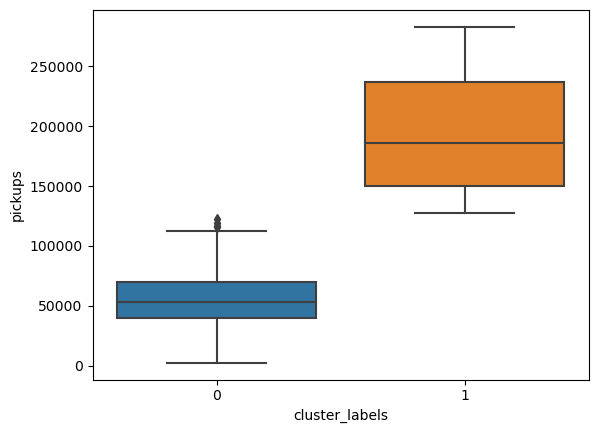

In [616]:
# plot box plot for pickups by cluster
sns.boxplot(x='cluster_labels', y='pickups', data=X2_mean_imputation)
plt.show()

### Split Dataset

In [618]:
# Split the data into training and testing sets
X2_train_mean, X2_test_mean, y2_train_mean, y2_test_mean = train_test_split(
    X2_mean_imputation.drop(columns=['pickups', 'cluster_labels']),
    X2_mean_imputation['cluster_labels'],
    test_size=0.25,
    random_state=42
)

In [619]:
# print shapes of train and test sets for mean
print("Mean Train shape:", X2_train_mean.shape, "Mean Test shape:", X2_test_mean.shape)

Mean Train shape: (108, 30) Mean Test shape: (36, 30)


### Decision Tree Classifier

In [461]:
# Initialize the model
model = DecisionTreeClassifier(random_state=42)

# Define the initial parameters to search
param_grid = {
    'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10],
    'min_samples_split': [1, 2, 3, 4, 5, 6],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6],
    'max_features': ['sqrt', 'log2'],
    'class_weight': ['balanced', None]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, verbose=1)

# Track overfitting and iteration count
overfitting = True
iteration = 0
max_iterations = 20

while overfitting and iteration < max_iterations:
    print('param_grid', iteration, ":", param_grid)

    # Fit the grid search
    grid_search.fit(X2_train_mean, y2_train_mean)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X2_train_mean)
    y_pred_test = grid_search.predict(X2_test_mean)

    # Compute the accuracy scores
    train_acc = accuracy_score(y2_train_mean, y_pred_train)
    test_acc = accuracy_score(y2_test_mean, y_pred_test)

    print(train_acc, test_acc)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_acc - test_acc) < 0.05:
        overfitting = False
    else:
        # Adjust the parameters and repeat the grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d - 1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s + 1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l + 1 for l in param_grid['min_samples_leaf']]

        print('param_grid', iteration, ":", param_grid)

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Print the classification report
print("Train Classification Report:")
print(classification_report(y2_train_mean, y_pred_train))
print("Test Classification Report:")
print(classification_report(y2_test_mean, y_pred_test))

# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X2_train_mean.columns), reverse=True):
    print(name, importance)


param_grid 0 : {'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10], 'min_samples_split': [1, 2, 3, 4, 5, 6], 'min_samples_leaf': [1, 2, 3, 4, 5, 6], 'max_features': ['sqrt', 'log2'], 'class_weight': ['balanced', None]}
Fitting 10 folds for each of 1296 candidates, totalling 12960 fits
0.9814814814814815 1.0
Best parameters: {'class_weight': 'balanced', 'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 1}
Best score: 0.9818181818181818
Train Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        96
           1       1.00      0.83      0.91        12

    accuracy                           0.98       108
   macro avg       0.99      0.92      0.95       108
weighted avg       0.98      0.98      0.98       108

Test Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00

### Without borough codes

In [620]:
# Filter and drop borough columns
borough_columns = X2_mean_imputation.filter(regex='borough_code').columns
X2_mean_imputation.drop(borough_columns, axis=1, inplace=True)

# Split the data into training and testing sets
X2_train_mean, X2_test_mean, y2_train_mean, y2_test_mean = train_test_split(
    X2_mean_imputation.drop(columns=['pickups', 'cluster_labels']),
    X2_mean_imputation['cluster_labels'],
    test_size=0.25,
    random_state=42
)

#### Decision Tree Classifier

In [494]:
# Initialize the model
model = DecisionTreeClassifier(random_state=42)

# Define the initial parameters to search
param_grid = {
    'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10],
    'min_samples_split': [1, 2, 3, 4, 5, 6],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6],
    'class_weight': ['balanced', None]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, verbose=1)

# Track overfitting and iteration count
overfitting = True
iteration = 0
max_iterations = 20

while overfitting and iteration < max_iterations:
    print('param_grid', iteration, ":", param_grid)

    # Fit the grid search
    grid_search.fit(X2_train_mean, y2_train_mean)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X2_train_mean)
    y_pred_test = grid_search.predict(X2_test_mean)

    # Compute the accuracy scores
    train_acc = accuracy_score(y2_train_mean, y_pred_train)
    test_acc = accuracy_score(y2_test_mean, y_pred_test)

    print(train_acc, test_acc)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_acc - test_acc) < 0.05:
        overfitting = False
    else:
        # Adjust the parameters and repeat the grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d - 1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s + 1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l + 1 for l in param_grid['min_samples_leaf']]

        print('param_grid', iteration, ":", param_grid)

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Print the classification report
print("Train Classification Report:")
print(classification_report(y2_train_mean, y_pred_train))
print("Test Classification Report:")
print(classification_report(y2_test_mean, y_pred_test))

# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X2_train_mean.columns), reverse=True):
    print(name, importance)


param_grid 0 : {'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10], 'min_samples_split': [1, 2, 3, 4, 5, 6], 'min_samples_leaf': [1, 2, 3, 4, 5, 6], 'class_weight': ['balanced', None]}
Fitting 10 folds for each of 648 candidates, totalling 6480 fits


0.9814814814814815 1.0
Best parameters: {'class_weight': None, 'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 1}
Best score: 0.9818181818181818
Train Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        96
           1       1.00      0.83      0.91        12

    accuracy                           0.98       108
   macro avg       0.99      0.92      0.95       108
weighted avg       0.98      0.98      0.98       108

Test Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00         2

    accuracy                           1.00        36
   macro avg       1.00      1.00      1.00        36
weighted avg       1.00      1.00      1.00        36

Feature importances:
Female Full Time Workers - mean_hourly 0.9499072356215212
Female Part Time Workers  - median_annual 0.050092764

### Random Forest Classifier

In [630]:
# Initialize the model
model = RandomForestClassifier(random_state=42)

# Define the parameters for random search
param_distributions = {
    'n_estimators': [10, 15, 20, 30, 50, 100, 200, 500],  # Number of trees in the forest
    'max_depth': [i for i in range(4, 25)],
    'min_samples_split': [i for i in range(3, 25)],
    'min_samples_leaf': [i for i in range(2, 25)],
    'class_weight': ['balanced', 'balanced_subsample', None]
}

# Initialize the random search
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions, n_iter=50, cv=5, verbose=1, random_state=42)

# Track overfitting and iteration count
overfitting = True
iteration = 0
max_iterations = 1

while overfitting and iteration < max_iterations:
    # Fit the random search
    random_search.fit(X2_train_mean, y2_train_mean)

    # Make predictions on the training and test sets
    y_pred_train = random_search.predict(X2_train_mean)
    y_pred_test = random_search.predict(X2_test_mean)

    # Compute the accuracy scores
    train_acc = accuracy_score(y2_train_mean, y_pred_train)
    test_acc = accuracy_score(y2_test_mean, y_pred_test)
    
    print(train_acc, test_acc)
    
    # Print the best parameters found during random search
    print("Best parameters:", random_search.best_params_)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_acc - test_acc) < 0.005:
        overfitting = False
    else:
        iteration += 1

# Print the best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

# Print the classification report
print("Train Classification Report:")
print(classification_report(y2_train_mean, y_pred_train))
print("Test Classification Report:")
print(classification_report(y2_test_mean, y_pred_test))

# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(random_search.best_estimator_.feature_importances_, X2_train_mean.columns), reverse=True):
    print(name, importance)


Fitting 5 folds for each of 50 candidates, totalling 250 fits


0.9814814814814815 1.0
Best parameters: {'n_estimators': 200, 'min_samples_split': 23, 'min_samples_leaf': 4, 'max_depth': 13, 'class_weight': 'balanced_subsample'}
Best parameters: {'n_estimators': 200, 'min_samples_split': 23, 'min_samples_leaf': 4, 'max_depth': 13, 'class_weight': 'balanced_subsample'}
Best score: 0.9818181818181818
Train Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        96
           1       1.00      0.83      0.91        12

    accuracy                           0.98       108
   macro avg       0.99      0.92      0.95       108
weighted avg       0.98      0.98      0.98       108

Test Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00         2

    accuracy                           1.00        36
   macro avg       1.00      1.00      1.00        36
weight

#### Model Evaluation

In [624]:
# Build a Decision Tree classifier with specified hyperparameters
model = DecisionTreeClassifier(max_depth=8, min_samples_split=5, min_samples_leaf=2)

# Fit the model to the training data
model.fit(X2_train_mean, y2_train_mean)

# Predict responses on the test and train sets
y2_pred_mean = model.predict(X2_test_mean)
y2_pred_train = model.predict(X2_train_mean)

# Build and print classification report for training data
print("Training Report:", classification_report(y2_train_mean, y2_pred_train))

# Build and print classification report for testing data
print("Testing Report:", classification_report(y2_test_mean, y2_pred_mean))

# Build and print confusion matrix
print("Confusion Matrix:", confusion_matrix(y2_test_mean, y2_pred_mean))

# Calculate and print accuracy score for training data
print("Training accuracy Score: ", accuracy_score(y2_train_mean, y2_pred_train))

# Calculate and print accuracy score for testing data
print("Testing accuracy Score: ", accuracy_score(y2_test_mean, y2_pred_mean))

# Calculate and print ROC AUC score
print("ROC AUC Score:", roc_auc_score(y2_test_mean, y2_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       1.00      0.99      0.99        96
           1       0.92      1.00      0.96        12

    accuracy                           0.99       108
   macro avg       0.96      0.99      0.98       108
weighted avg       0.99      0.99      0.99       108

Testing Report:               precision    recall  f1-score   support

           0       1.00      0.97      0.99        34
           1       0.67      1.00      0.80         2

    accuracy                           0.97        36
   macro avg       0.83      0.99      0.89        36
weighted avg       0.98      0.97      0.97        36

Confusion Matrix: [[33  1]
 [ 0  2]]
Training accuracy Score:  0.9907407407407407
Testing accuracy Score:  0.9722222222222222
ROC AUC Score 0.9852941176470588


In [625]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X2_train_mean.columns), reverse=True):
    print(name, importance)

Feature importances:
Female Full Time Workers - mean_hourly 0.8707482993197277
duration_minutes 0.08333333333333333
Female Part Time Workers  - median_annual 0.04591836734693886
start_number_standard_bikes 0.0
start_number_of_docks 0.0
start_number_of_bikes 0.0
start_month 0.0
Male Full Time Workers  - median_weekly 0.0
Health Deprivation and Disability - Proportion  of LSOAs in most deprived 10% nationally  0.0
Full Time Workers  - median_annual 0.0
Female Part Time Workers  - median_annual 0.0
Female Full Time Workers - mean_annual 0.0
Female Full Time Workers  - median_annual 0.0
Female Full Time Workers  - mean_weekly 0.0
Employment - Proportion  of LSOAs in most deprived 10% nationally  0.0
Barriers to Housing and Services - Rank of proportion of LSOAs in most deprived 10% nationally  0.0
Barriers to Housing and Services - Rank of average score  0.0
Barriers to Housing and Services - Average score  0.0


#### Random Forest

In [631]:
# build decision tree classifier
model = RandomForestClassifier(n_estimators= 100, min_samples_split= 10, min_samples_leaf= 4, max_depth= 13, bootstrap=True)

# fit the model
model.fit(X2_train_mean, y2_train_mean)

# predict the response
y2_pred_mean = model.predict(X2_test_mean)
y2_pred_train = model.predict(X2_train_mean)

#build classification report for train
print("Training Report:", classification_report(y2_train_mean, y2_pred_train))

# build classification report
print("Testing Report:", classification_report(y2_test_mean, y2_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y2_test_mean, y2_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y2_train_mean, y2_pred_train))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y2_test_mean, y2_pred_mean))


# build roc_auc_score
print("ROC AUC Score", roc_auc_score(y2_test_mean, y2_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       0.98      1.00      0.99        96
           1       1.00      0.83      0.91        12

    accuracy                           0.98       108
   macro avg       0.99      0.92      0.95       108
weighted avg       0.98      0.98      0.98       108

Testing Report:               precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00         2

    accuracy                           1.00        36
   macro avg       1.00      1.00      1.00        36
weighted avg       1.00      1.00      1.00        36

Confusion Matrix: [[34  0]
 [ 0  2]]
Training accuracy Score:  0.9814814814814815
Testing accuracy Score:  1.0
ROC AUC Score 1.0


In [632]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X2_train_mean.columns), reverse=True):
    print(name, importance)

Feature importances:
Female Full Time Workers - mean_hourly 0.23237741666047246
Full Time Workers  - median_annual 0.1939452861937314
Female Full Time Workers  - median_annual 0.1914396932447715
Female Full Time Workers  - mean_weekly 0.10652772588004558
start_number_of_bikes 0.05357200393559403
duration_minutes 0.036523370484709466
Barriers to Housing and Services - Rank of average score  0.02763977212084194
Employment - Proportion  of LSOAs in most deprived 10% nationally  0.0261288431753967
Male Full Time Workers  - median_weekly 0.024740737836121997
Female Full Time Workers - mean_annual 0.02307792013427291
Barriers to Housing and Services - Rank of proportion of LSOAs in most deprived 10% nationally  0.016552090974514756
start_number_standard_bikes 0.014500178458175611
Barriers to Housing and Services - Average score  0.014047896757134255
Female Part Time Workers  - median_annual 0.013462122815687469
Health Deprivation and Disability - Proportion  of LSOAs in most deprived 10% nat

#  Third Round: Classification Model (2016-2019)

### Pre-processing

In [1300]:
# Selecting data for the mean imputation approach
X_train_mean = merged_dataset_mean[merged_dataset_mean['start_year'].isin([2016, 2017, 2018])]
X_test_mean = merged_dataset_mean[merged_dataset_mean['start_year'].isin([2019])]

# Selecting data for the KNN imputation approach
X_train_knn = merged_dataset_imputed[merged_dataset_imputed['start_year'].isin([2016, 2017, 2018])]
X_test_knn = merged_dataset_imputed[merged_dataset_imputed['start_year'].isin([2019])]

# Selecting data for median imputation approach
X_train_median = merged_dataset_median[merged_dataset_median['start_year'].isin([2016, 2017, 2018])]
X_test_median = merged_dataset_median[merged_dataset_median['start_year'].isin([2019])]

# Printing the shapes of the datasets after mean imputation and KNN imputation
print("X_train_mean shape:", X_train_mean.shape)
print("X_test_mean shape:", X_test_mean.shape)
print("X_train_knn shape:", X_train_knn.shape)
print("X_test_knn shape:", X_test_knn.shape)
print("X_train_median shape:", X_train_median.shape)
print("X_test_median shape:", X_test_median.shape)

X_train_mean shape: (432, 162)
X_test_mean shape: (144, 162)
X_train_knn shape: (432, 162)
X_test_knn shape: (144, 162)
X_train_median shape: (432, 162)
X_test_median shape: (144, 162)


### K-Means Clustering

In [1301]:
# Extract the relevant columns
X_train_mean_cluster = X_train_mean[['pickups'] ]

# For KNN imputation
X_train_knn_cluster = X_train_knn[['pickups'] ]

#For Median imputation
X_train_median_cluster = X_train_median[['pickups'] ]

In [1302]:
# Extract the relevant columns
X_test_mean_cluster = X_test_mean[['pickups'] ]

# For KNN imputation
X_test_knn_cluster = X_test_knn[['pickups'] ]

# For median imputation
X_test_median_cluster = X_test_median[['pickups'] ]

### Evaluate K-Means with Elbow Method

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` exp

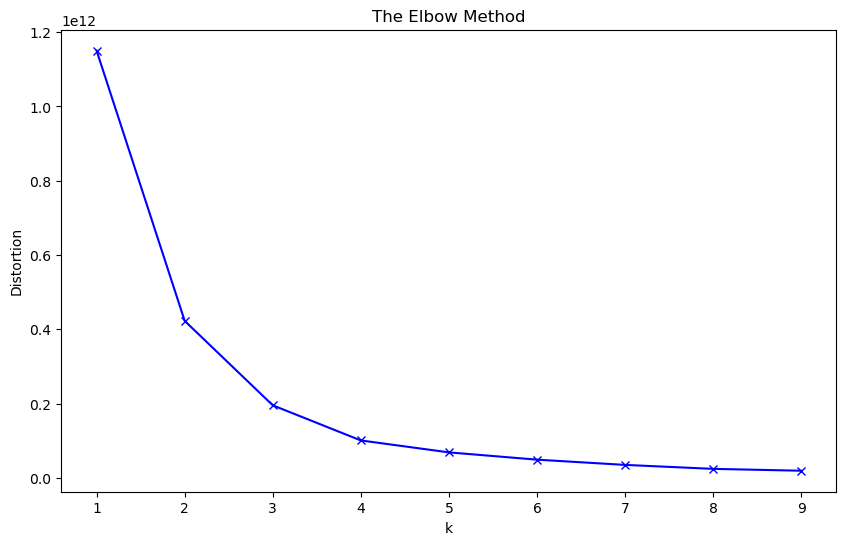

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` exp

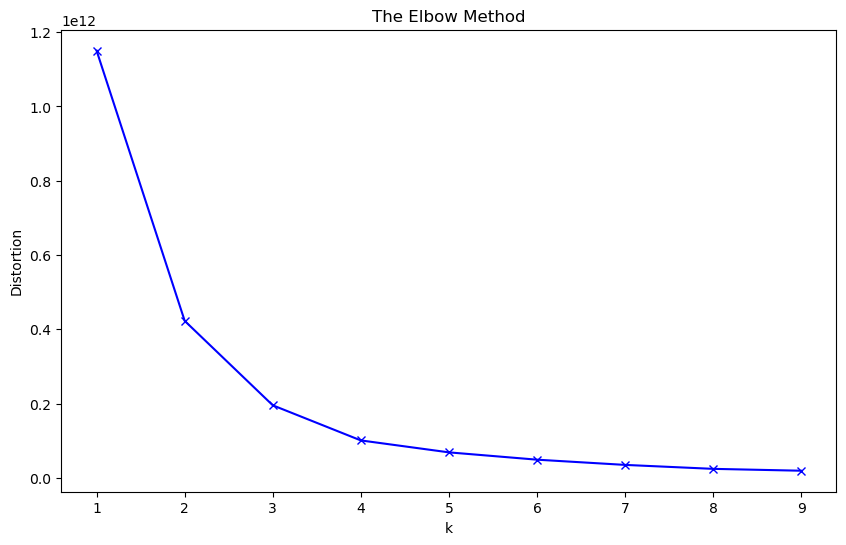

In [1303]:
def elbow_method(data):
    distortions = []  # List to store distortions for different values of k
    K = range(1, 10)  # You can change the range if needed

    # Loop through different values of k
    for k in K:
        kmeanModel = KMeans(n_clusters=k)
        kmeanModel.fit(data)
        distortions.append(kmeanModel.inertia_)  # Append the distortion to the list

    # Plot the elbow method graph
    plt.figure(figsize=(10, 6))
    plt.plot(K, distortions, 'bx-')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Distortion')
    plt.title('The Elbow Method')
    plt.show()

# Call the elbow_method function for different datasets
elbow_method(X_train_mean_cluster)
elbow_method(X_train_knn_cluster)


### Evaluate K-Means with Silhouette Method

/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the va

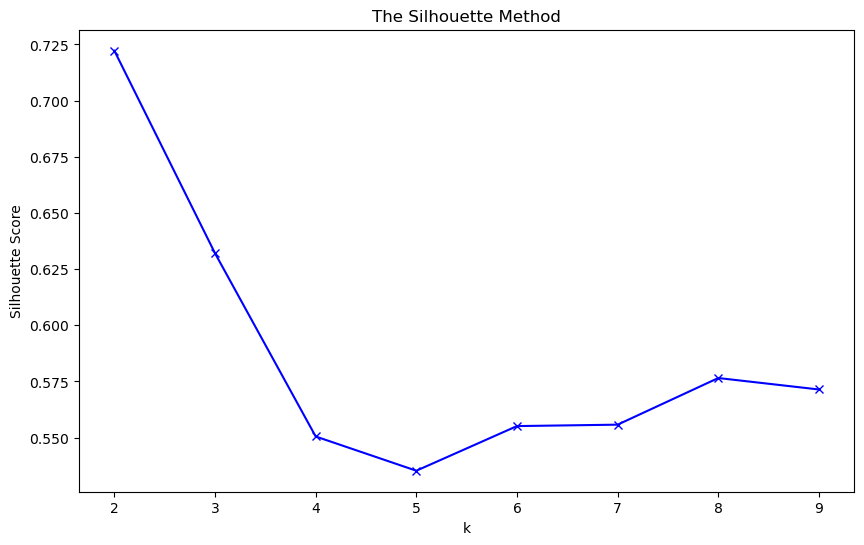

/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the va

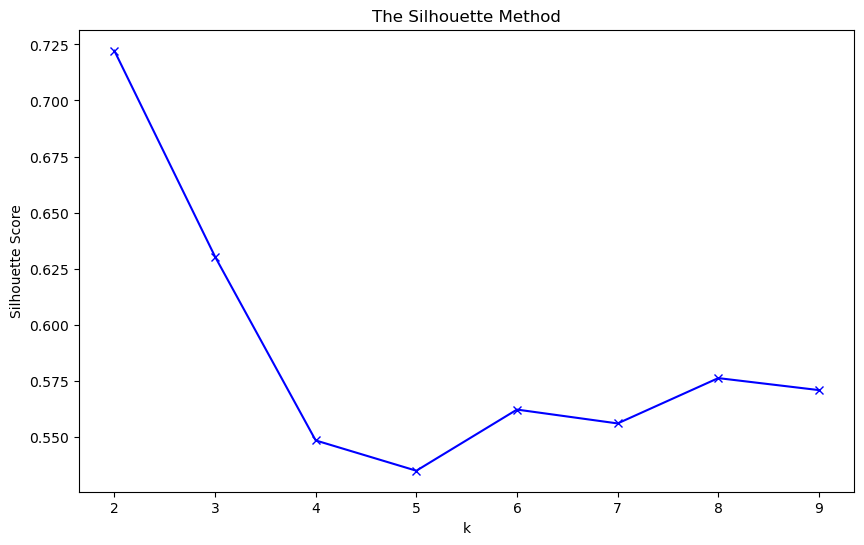

In [585]:
def silhouette_method(data):
    silhouette_scores = []  # List to store silhouette scores for different values of k
    K = range(2, 10)  # silhouette_score requires at least 2 clusters

    # Loop through different values of k
    for k in K:
        kmeanModel = KMeans(n_clusters=k)
        kmeanModel.fit(data)
        cluster_labels = kmeanModel.predict(data)
        silhouette_avg = silhouette_score(data, cluster_labels)  # Calculate silhouette score
        silhouette_scores.append(silhouette_avg)  # Append the silhouette score to the list

    # Plot the silhouette method graph
    plt.figure(figsize=(10, 6))
    plt.plot(K, silhouette_scores, 'bx-')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Silhouette Score')
    plt.title('The Silhouette Method')
    plt.show()

# Call the silhouette_method function for different datasets
silhouette_method(X_train_mean_cluster)
silhouette_method(X_train_knn_cluster)


### Add labels

In [1304]:
# Initialize K-means with k=2
kmeans = KMeans(n_clusters=2, random_state=0, n_init=10)

# Fit the K-means model and assign cluster labels to the data
X_train_mean = X_train_mean.copy()  # Make a copy of the dataset
X_train_mean['cluster_labels'] = kmeans.fit_predict(X_train_mean_cluster)

X_train_knn = X_train_knn.copy()  # Make a copy of the dataset
X_train_knn['cluster_labels'] = kmeans.fit_predict(X_train_knn_cluster)

X_train_median = X_train_median.copy()  # Make a copy of the dataset
X_train_median['cluster_labels'] = kmeans.fit_predict(X_train_median_cluster)


In [1305]:
# Fit the K-means model to the test data and assign cluster labels
X_test_mean = X_test_mean.copy()  # Make a copy of the test dataset
X_test_mean['cluster_labels'] = kmeans.fit_predict(X_test_mean_cluster)

X_test_knn = X_test_knn.copy()  # Make a copy of the test dataset
X_test_knn['cluster_labels'] = kmeans.fit_predict(X_test_knn_cluster)

X_test_median = X_test_median.copy()  # Make a copy of the test dataset
X_test_median['cluster_labels'] = kmeans.fit_predict(X_test_median_cluster)


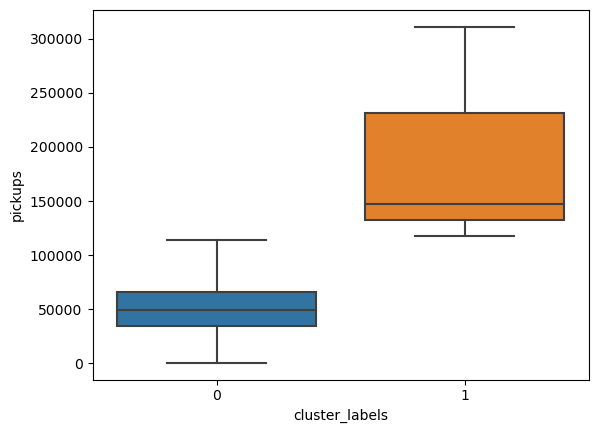

In [1306]:
# plot box plot for pickups by cluster
sns.boxplot(x='cluster_labels', y='pickups', data=X_train_mean)
plt.show()

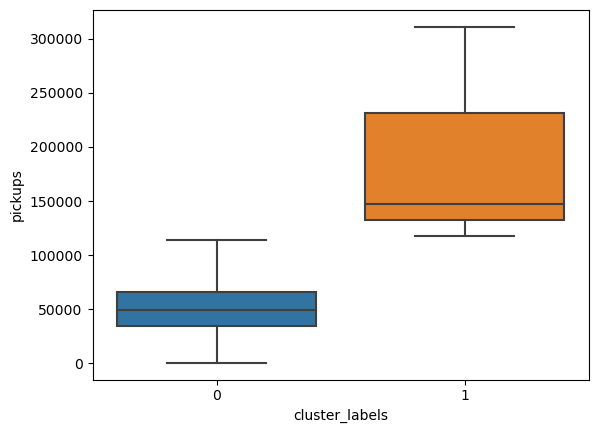

In [1307]:
# plot box plot for pickups by cluster
sns.boxplot(x='cluster_labels', y='pickups', data=X_train_knn)
plt.show()

In [1308]:
X_train_mean['cluster_labels'].value_counts()

0    382
1     50
Name: cluster_labels, dtype: int64

In [1309]:
X_test_mean['cluster_labels'].value_counts()

0    130
1     14
Name: cluster_labels, dtype: int64

In [1310]:
X_train_knn['cluster_labels'].value_counts()

0    382
1     50
Name: cluster_labels, dtype: int64

In [1311]:
X_test_knn['cluster_labels'].value_counts()

0    130
1     14
Name: cluster_labels, dtype: int64

In [770]:
# Describe the statistical summary of data points in cluster 0 of X_train_mean
cluster_0_description = X_train_mean[X_train_mean['cluster_labels'] == 0].describe()
print(cluster_0_description)


,start_year,start_month,pickups,duration_minutes,holiday,start_number_of_bikes,start_number_of_docks,start_number_of_empty_docks,start_number_standard_bikes,start_number_ebikes,temp,feelslike,humidity,windspeed,cloudcover,uvindex,dew,precip,visibility,population_density,average_house_price,% of all 16+ who are aged 16-19,% of all 16+ who are aged 20-24,% of all 16+ who are aged 25-34,% of all 16+ who are aged 35-49,% of all 16+ who are aged 50-64,% of all 16+ who are aged 65+,Unemployment rate - aged 16+,Male Full Time Workers - mean_hourly,Male Part Time Workers - mean_hourly,Female Full Time Workers - mean_hourly,Female Part Time Workers - mean_hourly,Full Time Workers - mean_hourly,Part Time Workers - mean_hourly,% of all people aged 16+ who are male,% of all people aged 16+ who are female,% who are economically inactive - aged 16+,Male Full Time Workers - mean_annual,Male Part Time Workers - mean_annual,Female Full Time Workers - mean_annual,Female Part Time Workers - mean_annual,Full Time Workers - mean_annual,Part Time Workers - mean_annual,Male Full Time Workers - median_weekly,Male Part Time Workers - median_weekly,Female Full Time Workers - median_weekly,Female Part Time Workers - median_weekly,Full Time Workers - median_weekly,Part Time Workers - median_weekly,% in employment working part-time - aged 16-19,% in employment working part-time - aged 20-24,% in employment working part-time - aged 25-49,% in employment working part-time - aged 50+,Male Full Time Workers - median_hourly,Male Part Time Workers - median_hourly,Female Full Time Workers - median_hourly,Female Part Time Workers - median_hourly,Full Time Workers - median_hourly,Part Time Workers - median_hourly,% with NVQ4+ - aged 16-64,% with NVQ3 only - aged 16-64,% with NVQ2 only - aged 16-64,% with NVQ1 only - aged 16-64,% with other qualifications (NVQ) - aged 16-64,% with no qualifications (NVQ) - aged 16-64,% in employment who are employees - aged 16+,% in employment who are self employed - aged 16+,Male Full Time Workers - mean_weekly,Male Part Time Workers - mean_weekly,Female Full Time Workers - mean_weekly,Female Part Time Workers - mean_weekly,Full Time Workers - mean_weekly,Part Time Workers - mean_weekly,Male Full Time Workers - median_annual,Female Full Time Workers - median_annual,Female Part Time Workers - median_annual,Full Time Workers - median_annual,Part Time Workers - median_annual,% in employment working full-time - aged 20-24,% in employment working full-time - aged 25-49,% in employment working full-time - aged 50+,Economic activity rate - aged 16+,IMD - Average rank,IMD - Rank of average rank,IMD - Average score,IMD - Rank of average score,IMD - Proportion of LSOAs in most deprived 10% nationally,IMD - Rank of proportion of LSOAs in most deprived 10% nationally,IMD 2019 - Extent,IMD 2019 - Rank of extent,IMD 2019 - Local concentration,IMD 2019 - Rank of local concentration,Income - Average rank,Income - Rank of average rank,Income - Average score,Income - Rank of average score,Income - Proportion of LSOAs in most deprived 10% nationally,Income - Rank of proportion of LSOAs in most deprived 10% nationally,Income scale,Rank of Income Scale,Employment - Average rank,Employment - Rank of average rank,Employment - Average score,Employment - Rank of average score,Employment - Proportion of LSOAs in most deprived 10% nationally,Employment - Rank of proportion of LSOAs in most deprived 10% nationally,Employment scale,Rank of Employment Scale,"Education, Skills and Training - Average rank","Education, Skills and Training - Rank of average rank","Education, Skills and Training - Average score","Education, Skills and Training - Rank of average score","Education, Skills and Training - Proportion of LSOAs in most deprived 10% nationally","Education, Skills and Training - Rank of proportion of LSOAs in most deprived 10% nationally",Health Deprivation and Disability - Average rank,Health Deprivation and Disability - Rank of average rank,Health Depriva

In [771]:
# Describe the statistical summary of data points in cluster 1 of X_train_mean
cluster_1_description = X_train_mean[X_train_mean['cluster_labels'] == 1].describe()
print(cluster_1_description)


,start_year,start_month,pickups,duration_minutes,holiday,start_number_of_bikes,start_number_of_docks,start_number_of_empty_docks,start_number_standard_bikes,start_number_ebikes,temp,feelslike,humidity,windspeed,cloudcover,uvindex,dew,precip,visibility,population_density,average_house_price,% of all 16+ who are aged 16-19,% of all 16+ who are aged 20-24,% of all 16+ who are aged 25-34,% of all 16+ who are aged 35-49,% of all 16+ who are aged 50-64,% of all 16+ who are aged 65+,Unemployment rate - aged 16+,Male Full Time Workers - mean_hourly,Male Part Time Workers - mean_hourly,Female Full Time Workers - mean_hourly,Female Part Time Workers - mean_hourly,Full Time Workers - mean_hourly,Part Time Workers - mean_hourly,% of all people aged 16+ who are male,% of all people aged 16+ who are female,% who are economically inactive - aged 16+,Male Full Time Workers - mean_annual,Male Part Time Workers - mean_annual,Female Full Time Workers - mean_annual,Female Part Time Workers - mean_annual,Full Time Workers - mean_annual,Part Time Workers - mean_annual,Male Full Time Workers - median_weekly,Male Part Time Workers - median_weekly,Female Full Time Workers - median_weekly,Female Part Time Workers - median_weekly,Full Time Workers - median_weekly,Part Time Workers - median_weekly,% in employment working part-time - aged 16-19,% in employment working part-time - aged 20-24,% in employment working part-time - aged 25-49,% in employment working part-time - aged 50+,Male Full Time Workers - median_hourly,Male Part Time Workers - median_hourly,Female Full Time Workers - median_hourly,Female Part Time Workers - median_hourly,Full Time Workers - median_hourly,Part Time Workers - median_hourly,% with NVQ4+ - aged 16-64,% with NVQ3 only - aged 16-64,% with NVQ2 only - aged 16-64,% with NVQ1 only - aged 16-64,% with other qualifications (NVQ) - aged 16-64,% with no qualifications (NVQ) - aged 16-64,% in employment who are employees - aged 16+,% in employment who are self employed - aged 16+,Male Full Time Workers - mean_weekly,Male Part Time Workers - mean_weekly,Female Full Time Workers - mean_weekly,Female Part Time Workers - mean_weekly,Full Time Workers - mean_weekly,Part Time Workers - mean_weekly,Male Full Time Workers - median_annual,Female Full Time Workers - median_annual,Female Part Time Workers - median_annual,Full Time Workers - median_annual,Part Time Workers - median_annual,% in employment working full-time - aged 20-24,% in employment working full-time - aged 25-49,% in employment working full-time - aged 50+,Economic activity rate - aged 16+,IMD - Average rank,IMD - Rank of average rank,IMD - Average score,IMD - Rank of average score,IMD - Proportion of LSOAs in most deprived 10% nationally,IMD - Rank of proportion of LSOAs in most deprived 10% nationally,IMD 2019 - Extent,IMD 2019 - Rank of extent,IMD 2019 - Local concentration,IMD 2019 - Rank of local concentration,Income - Average rank,Income - Rank of average rank,Income - Average score,Income - Rank of average score,Income - Proportion of LSOAs in most deprived 10% nationally,Income - Rank of proportion of LSOAs in most deprived 10% nationally,Income scale,Rank of Income Scale,Employment - Average rank,Employment - Rank of average rank,Employment - Average score,Employment - Rank of average score,Employment - Proportion of LSOAs in most deprived 10% nationally,Employment - Rank of proportion of LSOAs in most deprived 10% nationally,Employment scale,Rank of Employment Scale,"Education, Skills and Training - Average rank","Education, Skills and Training - Rank of average rank","Education, Skills and Training - Average score","Education, Skills and Training - Rank of average score","Education, Skills and Training - Proportion of LSOAs in most deprived 10% nationally","Education, Skills and Training - Rank of proportion of LSOAs in most deprived 10% nationally",Health Deprivation and Disability - Average rank,Health Deprivation and Disability - Rank of average rank,Health Depriva

### Split Data set

In [1312]:
# Filter columns that start with 'borough_code_' in X_train_mean
borough_columns = list(filter(lambda x: x.startswith('borough_code_'), X_train_mean.columns))


In [1313]:
# Separate the features and target variable for X_train_mean
y_train_mean = X_train_mean['cluster_labels']
X_train_mean = X_train_mean.drop(['cluster_labels', 'pickups'], axis=1)

# Separate the features and target variable for X_train_knn
y_train_knn = X_train_knn['cluster_labels']
X_train_knn = X_train_knn.drop(['cluster_labels', 'pickups'], axis=1)

# Separate the features and target variable for X_train_median
y_train_median = X_train_median['cluster_labels']
X_train_median = X_train_median.drop(['cluster_labels', 'pickups'], axis=1)

# Separate the features and target variable for X_test_mean
y_test_mean = X_test_mean['cluster_labels']
X_test_mean = X_test_mean.drop(['cluster_labels', 'pickups'], axis=1)

# Separate the features and target variable for X_test_knn
y_test_knn = X_test_knn['cluster_labels']
X_test_knn = X_test_knn.drop(['cluster_labels', 'pickups'], axis=1)

# Separate the features and target variable for X_test_median
y_test_median = X_test_median['cluster_labels']
X_test_median = X_test_median.drop(['cluster_labels', 'pickups'], axis=1)

# Print the shape of each dataset
print(X_train_mean.shape, y_train_mean.shape)
print(X_train_knn.shape, y_train_knn.shape)
print(X_train_median.shape, y_train_median.shape)
print(X_test_mean.shape, y_test_mean.shape)
print(X_test_knn.shape, y_test_knn.shape)
print(X_test_median.shape, y_test_median.shape)


(432, 161) (432,)
(432, 161) (432,)
(432, 161) (432,)
(144, 161) (144,)
(144, 161) (144,)
(144, 161) (144,)


### Mean Fill

In [222]:
# Initialize the model
model = DecisionTreeClassifier(random_state=42)

# Define the initial parameters to search
param_grid = {
    'max_depth': [2,3,4,5,6,7,8,9,10],
    'min_samples_split': [2,3,4,5,6],
    'min_samples_leaf': [2,3,4,5,6],
    'class_weight': ['balanced', None]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, verbose=1)

overfitting = True
iteration = 0
max_iterations = 20

while overfitting and iteration < max_iterations:
    print('param_grid',iteration,":", param_grid)

    # Fit the grid search
    grid_search.fit(X_train_mean, y_train_mean)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X_train_mean)
    y_pred_test = grid_search.predict(X_test_mean)

    # Compute the accuracy scores
    train_acc = accuracy_score(y_train_mean, y_pred_train)
    test_acc = accuracy_score(y_test_mean, y_pred_test)
    
    print(train_acc, test_acc)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_acc - test_acc) < 0.05:
        overfitting = False
    else:
        # Adjust the parameters and repeat the grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d-1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s+1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l+1 for l in param_grid['min_samples_leaf']]

        print('param_grid',iteration,":", param_grid)

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Print the classification report
print("Train Classification Report:")
print(classification_report(y_train_mean, y_pred_train))
print("Test Classification Report:")
print(classification_report(y_test_mean, y_pred_test))

# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X_train_mean.columns), reverse=True):
    print(name, importance)


param_grid 0 : {'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10], 'min_samples_split': [2, 3, 4, 5, 6], 'min_samples_leaf': [2, 3, 4, 5, 6], 'class_weight': ['balanced', None]}
Fitting 10 folds for each of 450 candidates, totalling 4500 fits


0.9861111111111112 0.9236111111111112
param_grid 0 : {'max_depth': [3, 2, 3, 4, 5, 6, 7, 8, 9], 'min_samples_split': [3, 4, 5, 6, 7], 'min_samples_leaf': [3, 4, 5, 6, 7], 'class_weight': ['balanced', None]}
param_grid 1 : {'max_depth': [3, 2, 3, 4, 5, 6, 7, 8, 9], 'min_samples_split': [3, 4, 5, 6, 7], 'min_samples_leaf': [3, 4, 5, 6, 7], 'class_weight': ['balanced', None]}
Fitting 10 folds for each of 450 candidates, totalling 4500 fits
0.9791666666666666 0.9097222222222222
param_grid 1 : {'max_depth': [2, 5, 2, 3, 4, 5, 6, 7, 8], 'min_samples_split': [4, 5, 6, 7, 8], 'min_samples_leaf': [4, 5, 6, 7, 8], 'class_weight': ['balanced', None]}
param_grid 2 : {'max_depth': [2, 5, 2, 3, 4, 5, 6, 7, 8], 'min_samples_split': [4, 5, 6, 7, 8], 'min_samples_leaf': [4, 5, 6, 7, 8], 'class_weight': ['balanced', None]}
Fitting 10 folds for each of 450 candidates, totalling 4500 fits
0.9745370370370371 0.9375
Best parameters: {'class_weight': 'balanced', 'max_depth': 6, 'min_samples_leaf': 4, 'min_sa

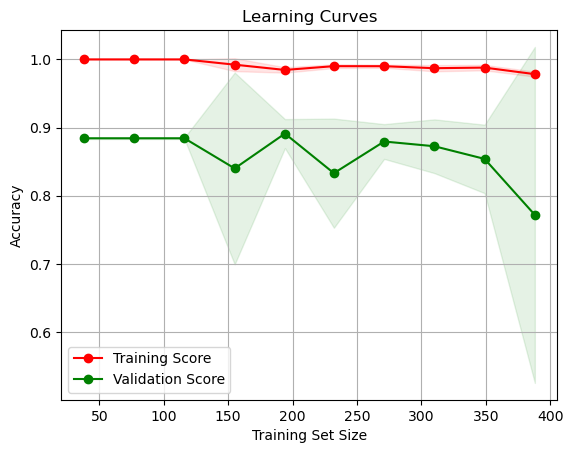

In [223]:
# Initialize the model with specific hyperparameters
model = DecisionTreeClassifier(class_weight='balanced', max_depth=6, min_samples_leaf=4, min_samples_split=4)

# Calculate the learning curves
train_sizes, train_scores, val_scores = learning_curve(model, X_train_mean, y_train_mean, train_sizes=np.linspace(0.1, 1.0, 10), cv=10)

# Calculate the mean and standard deviation of the training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
val_scores_mean = np.mean(val_scores, axis=1)
val_scores_std = np.std(val_scores, axis=1)

# Plot the learning curves
plt.figure()
plt.title("Learning Curves")
plt.xlabel("Training Set Size")
plt.ylabel("Accuracy")
plt.grid()

# Fill areas between the curves to indicate variability
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, val_scores_mean - val_scores_std,
                 val_scores_mean + val_scores_std, alpha=0.1, color="g")

# Plot the mean training and validation scores
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training Score")
plt.plot(train_sizes, val_scores_mean, 'o-', color="g", label="Validation Score")

plt.legend(loc="best")
plt.show()


### KNN Fill

In [238]:
# Initialize the model
model = DecisionTreeClassifier(random_state=42)

# Define the initial parameters to search
param_grid = {
    'max_depth': [2,3,4,5,6,7,8,9,10],
    'min_samples_split': [1,2,3,4,5,6],
    'min_samples_leaf': [1,2,3,4,5,6],
    'max_features': [ 'sqrt', 'log2'],
    'class_weight': ['balanced', None]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, verbose=1)

overfitting = True
iteration = 0
max_iterations = 20

while overfitting and iteration < max_iterations:
    print('param_grid',iteration,":", param_grid)

    # Fit the grid search
    grid_search.fit(X_train_knn, y_train_knn)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X_train_knn)
    y_pred_test = grid_search.predict(X_test_knn)

    # Compute the accuracy scores
    train_acc = accuracy_score(y_train_knn, y_pred_train)
    test_acc = accuracy_score(y_test_knn, y_pred_test)
    
    print(train_acc, test_acc)
    
    print("Best parameters:", grid_search.best_params_)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_acc - test_acc) < 0.005:
        overfitting = False
    else:
        # Adjust the parameters and repeat the grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d-1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s+1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l+1 for l in param_grid['min_samples_leaf']]

        print('param_grid',iteration,":", param_grid)

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Print the classification report
print("Train Classification Report:")
print(classification_report(y_train_knn, y_pred_train))
print("Test Classification Report:")
print(classification_report(y_test_knn, y_pred_test))

# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X_train_knn.columns), reverse=True):
    print(name, importance)


param_grid 0 : {'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10], 'min_samples_split': [2, 3, 4, 5, 6], 'min_samples_leaf': [2, 3, 4, 5, 6], 'class_weight': ['balanced', None]}
Fitting 10 folds for each of 450 candidates, totalling 4500 fits


0.9652777777777778 0.8888888888888888
Best parameters: {'class_weight': 'balanced', 'max_depth': 6, 'min_samples_leaf': 6, 'min_samples_split': 2}
param_grid 0 : {'max_depth': [6, 2, 3, 4, 5, 6, 7, 8, 9], 'min_samples_split': [3, 4, 5, 6, 7], 'min_samples_leaf': [3, 4, 5, 6, 7], 'class_weight': ['balanced', None]}
param_grid 1 : {'max_depth': [6, 2, 3, 4, 5, 6, 7, 8, 9], 'min_samples_split': [3, 4, 5, 6, 7], 'min_samples_leaf': [3, 4, 5, 6, 7], 'class_weight': ['balanced', None]}
Fitting 10 folds for each of 450 candidates, totalling 4500 fits
0.9652777777777778 0.8888888888888888
Best parameters: {'class_weight': 'balanced', 'max_depth': 6, 'min_samples_leaf': 6, 'min_samples_split': 3}
param_grid 1 : {'max_depth': [5, 2, 2, 3, 4, 5, 6, 7, 8], 'min_samples_split': [4, 5, 6, 7, 8], 'min_samples_leaf': [4, 5, 6, 7, 8], 'class_weight': ['balanced', None]}
param_grid 2 : {'max_depth': [5, 2, 2, 3, 4, 5, 6, 7, 8], 'min_samples_split': [4, 5, 6, 7, 8], 'min_samples_leaf': [4, 5, 6, 7, 8], '

KeyboardInterrupt: 

In [ ]:
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    
    # Calculate learning curve
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    plt.grid()

    # Fill areas between the curves to indicate variability
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Call the function to plot the learning curve for the best estimator
plot_learning_curve(grid_search.best_estimator_, "Learning Curve", X_train_knn, y_train_knn, cv=10)
plt.show()


In [236]:
# Initialize the model with specific hyperparameters
model = DecisionTreeClassifier(max_depth=9, min_samples_leaf=8, min_samples_split=5)

# Fit the model to the training data
model.fit(X_train_knn, y_train_knn)

# Predict the labels for the test and train sets
y_pred_knn = model.predict(X_test_knn)
train_pred_knn = model.predict(X_train_knn)

# Evaluate the model's performance
train_accuracy = accuracy_score(y_train_knn, train_pred_knn)
test_accuracy = accuracy_score(y_test_knn, y_pred_knn)

print("Train accuracy:", train_accuracy)
print("Test accuracy:", test_accuracy)

# Generate and print the classification report
classification_rep = classification_report(y_test_knn, y_pred_knn)
print("Classification Report:\n", classification_rep)


Train accuracy: 0.9745370370370371
Test accuracy: 0.9722222222222222
              precision    recall  f1-score   support

           0       1.00      0.97      0.98       130
           1       0.78      1.00      0.88        14

    accuracy                           0.97       144
   macro avg       0.89      0.98      0.93       144
weighted avg       0.98      0.97      0.97       144



In [237]:
# confusion matrix
confusion_matrix(y_test_knn, y_pred_knn)

array([[126,   4],
       [  0,  14]])

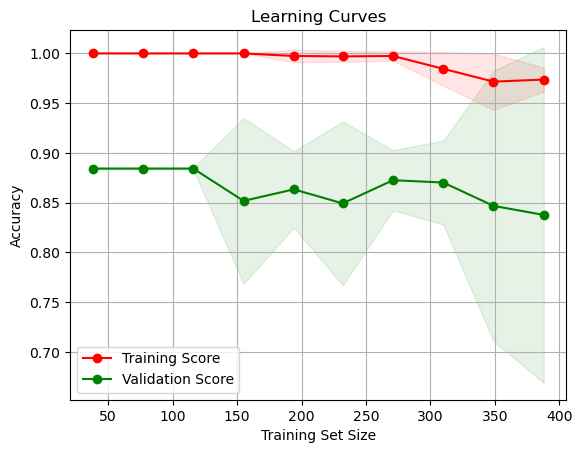

In [228]:
# Define the hyperparameters for the Decision Tree model
model = DecisionTreeClassifier(class_weight='balanced', max_depth=6, max_features='log2', min_samples_leaf=1, min_samples_split=1)

# Calculate the learning curves
train_sizes, train_scores, val_scores = learning_curve(
    model, X_train_knn, y_train_knn, train_sizes=np.linspace(0.1, 1.0, 10), cv=10)

# Calculate the mean and standard deviation of the training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
val_scores_mean = np.mean(val_scores, axis=1)
val_scores_std = np.std(val_scores, axis=1)

# Plot the learning curves
plt.figure()
plt.title("Learning Curves")
plt.xlabel("Training Set Size")
plt.ylabel("Accuracy")
plt.grid()

# Fill areas between the curves to indicate variability
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, val_scores_mean - val_scores_std,
                 val_scores_mean + val_scores_std, alpha=0.1, color="g")

# Plot the mean training and validation scores
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training Score")
plt.plot(train_sizes, val_scores_mean, 'o-', color="g", label="Validation Score")

plt.legend(loc="best")
plt.show()


## Random Search CV

### Mean Fill

In [790]:
# Initialize the model
model = DecisionTreeClassifier(random_state=42)

# Define the parameters for random search
param_distributions = {
    'max_depth': [i for i in range(2, 21)],   # extended range
    'min_samples_split': [i for i in range(2, 21)],
    'min_samples_leaf': [i for i in range(1, 21)],
    'class_weight': ['balanced', None]
}

# Initialize the random search
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions, n_iter=100, cv=10, verbose=1, random_state=42)


overfitting = True
iteration = 0
max_iterations = 1

while overfitting and iteration < max_iterations:
    print('param_grid',iteration,":", param_grid)

    # Fit the grid search
    random_search.fit(X_train_mean, y_train_mean)

    # Make predictions on the training and test sets
    y_pred_train = random_search.predict(X_train_mean)
    y_pred_test = random_search.predict(X_test_mean)

    # Compute the accuracy scores
    train_acc = accuracy_score(y_train_mean, y_pred_train)
    test_acc = accuracy_score(y_test_mean, y_pred_test)
    
    print(train_acc, test_acc)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_acc - test_acc) < 0.005:
        overfitting = False
    else:
        iteration += 1

# Print the best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

# Print the classification report
print("Train Classification Report:")
print(classification_report(y_train_mean, y_pred_train))
print("Test Classification Report:")
print(classification_report(y_test_mean, y_pred_test))

# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(random_search.best_estimator_.feature_importances_, X_train_mean.columns), reverse=True):
    print(name, importance)


param_grid 0 : {'max_depth': [4, 5, 6, 7, 8, 9, 10, 12, 14, 15, 17], 'min_samples_split': [2, 5, 6, 7, 8, 9], 'min_samples_leaf': [1, 4, 5, 6, 7, 8, 9]}
Fitting 10 folds for each of 100 candidates, totalling 1000 fits


0.9745370370370371 0.9722222222222222
Best parameters: {'min_samples_split': 19, 'min_samples_leaf': 12, 'max_depth': 18, 'class_weight': None}
Best score: 0.8512684989429176
Train Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       382
           1       0.90      0.88      0.89        50

    accuracy                           0.97       432
   macro avg       0.94      0.93      0.94       432
weighted avg       0.97      0.97      0.97       432

Test Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.97      0.98       130
           1       0.78      1.00      0.88        14

    accuracy                           0.97       144
   macro avg       0.89      0.98      0.93       144
weighted avg       0.98      0.97      0.97       144

Feature importances:
borough_code_E09000033 0.7501633093589962
humidity 0.13669359973963124
IDAOPI - Average score

In [791]:
# confusion matrix
confusion_matrix(y_test_mean, y_pred_test)

array([[126,   4],
       [  0,  14]])

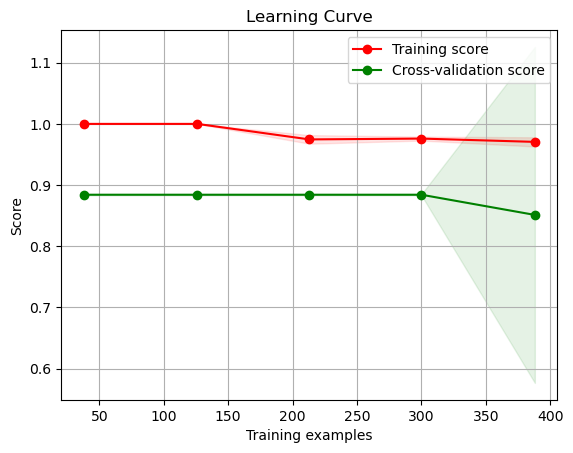

In [792]:
# Call the function to plot the learning curve
plot_learning_curve(random_search.best_estimator_, "Learning Curve", X_train_mean, y_train_mean, cv=10)
plt.show()


### KNN Fill

In [299]:
# Initialize the model
model = DecisionTreeClassifier(random_state=42)

# Define the parameters for random search
param_distributions = {
    'max_depth': [i for i in range(2, 21)],   # extended range
    'min_samples_split': [i for i in range(2, 21)],
    'min_samples_leaf': [i for i in range(1, 21)],
}

# Initialize the random search
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions, n_iter=100, cv=10, verbose=1, random_state=42)


overfitting = True
iteration = 0
max_iterations = 2

while overfitting and iteration < max_iterations:
    print('param_grid',iteration,":", param_grid)

    # Fit the grid search
    random_search.fit(X_train_knn, y_train_knn)

    # Make predictions on the training and test sets
    y_pred_train = random_search.predict(X_train_knn)
    y_pred_test = random_search.predict(X_test_knn)

    # Compute the accuracy scores
    train_acc = accuracy_score(y_train_knn, y_pred_train)
    test_acc = accuracy_score(y_test_knn, y_pred_test)
    
    print(train_acc, test_acc)
    
    print("Best parameters:", random_search.best_params_)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_acc - test_acc) < 0.005:
        overfitting = False
    else:
        iteration += 1

# Print the best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

# Print the classification report
print("Train Classification Report:")
print(classification_report(y_train_knn, y_pred_train))
print("Test Classification Report:")
print(classification_report(y_test_knn, y_pred_test))

# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(random_search.best_estimator_.feature_importances_, X_train_knn.columns), reverse=True):
    print(name, importance)


param_grid 0 : {'max_depth': [4, 5, 7, 2, 3, 4, 5, 6, 7], 'min_samples_split': [5, 6, 7, 8, 9], 'min_samples_leaf': [5, 6, 7, 8, 9], 'class_weight': ['balanced', None]}
Fitting 4 folds for each of 100 candidates, totalling 400 fits


1.0 0.9791666666666666
Best parameters: {'min_samples_split': 9, 'min_samples_leaf': 2, 'max_depth': 4}
param_grid 1 : {'max_depth': [4, 5, 7, 2, 3, 4, 5, 6, 7], 'min_samples_split': [5, 6, 7, 8, 9], 'min_samples_leaf': [5, 6, 7, 8, 9], 'class_weight': ['balanced', None]}
Fitting 4 folds for each of 100 candidates, totalling 400 fits
1.0 0.9791666666666666
Best parameters: {'min_samples_split': 9, 'min_samples_leaf': 2, 'max_depth': 4}
Best parameters: {'min_samples_split': 9, 'min_samples_leaf': 2, 'max_depth': 4}
Best score: 0.9825581395348837
Train Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       382
           1       1.00      1.00      1.00        50

    accuracy                           1.00       432
   macro avg       1.00      1.00      1.00       432
weighted avg       1.00      1.00      1.00       432

Test Classification Report:
              precision    recall  f1-score   support

         

In [254]:
# confusion matrix
confusion_matrix(y_test_knn, y_pred_test)

array([[126,   4],
       [  0,  14]])

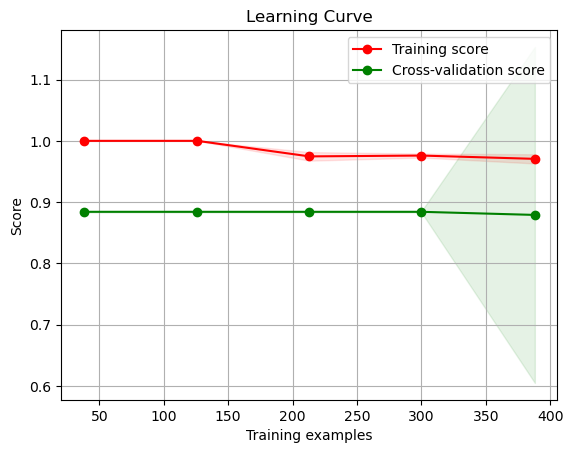

In [255]:
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    
    # Calculate learning curve
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    plt.grid()

    # Fill areas between the curves to indicate variability
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Call the function to plot the learning curve for the best estimator
plot_learning_curve(random_search.best_estimator_, "Learning Curve", X_train_knn, y_train_knn, cv=10)
plt.show()


## Evaluate the model

### Mean fill

In [799]:
# initialize the model
model = DecisionTreeClassifier(min_samples_split=19, min_samples_leaf=12, max_depth=18)

# fit the model
model.fit(X_train_mean, y_train_mean)

# predict the response
y_pred_mean = model.predict(X_test_mean)
y_pred_train = model.predict(X_train_mean)

#build classification report for train
print("Training Report:", classification_report(y_train_mean, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_mean, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_mean, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_test_mean, y_pred_mean))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_train_mean, y_pred_train))


# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_mean, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_mean, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       0.98      0.99      0.99       382
           1       0.90      0.88      0.89        50

    accuracy                           0.97       432
   macro avg       0.94      0.93      0.94       432
weighted avg       0.97      0.97      0.97       432

Testing Report:               precision    recall  f1-score   support

           0       1.00      0.97      0.98       130
           1       0.78      1.00      0.88        14

    accuracy                           0.97       144
   macro avg       0.89      0.98      0.93       144
weighted avg       0.98      0.97      0.97       144

Confusion Matrix: [[126   4]
 [  0  14]]
Training accuracy Score:  0.9722222222222222
Testing accuracy Score:  0.9745370370370371
Training ROC AUC Score 0.9334554973821989
Testing ROC AUC Score 0.9846153846153847


In [800]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_mean.columns), reverse=True):
    print(name, importance)


Feature importances:
borough_code_E09000033 0.7501633093589962
humidity 0.13669359973963124
IDAOPI - Rank of average score  0.06206213602724097
start_number_of_docks 0.044900026885904804
% of all 16+ who are aged 65+ 0.006180927988226812
windspeed 0.0
visibility 0.0
uvindex 0.0
temp 0.0
start_year 0.0
start_number_standard_bikes 0.0
start_number_of_empty_docks 0.0
start_number_of_bikes 0.0
start_number_ebikes 0.0
start_month 0.0
precip 0.0
population_density 0.0
holiday 0.0
feelslike 0.0
duration_minutes 0.0
dew 0.0
cloudcover 0.0
borough_code_E09000032 0.0
borough_code_E09000030 0.0
borough_code_E09000028 0.0
borough_code_E09000025 0.0
borough_code_E09000022 0.0
borough_code_E09000020 0.0
borough_code_E09000019 0.0
borough_code_E09000013 0.0
borough_code_E09000012 0.0
borough_code_E09000007 0.0
borough_code_E09000001 0.0
average_house_price 0.0
Unemployment rate - aged 16+ 0.0
Rank of Income Scale 0.0
Rank of Employment Scale 0.0
Part Time Workers - mean_hourly 0.0
Part Time Workers -

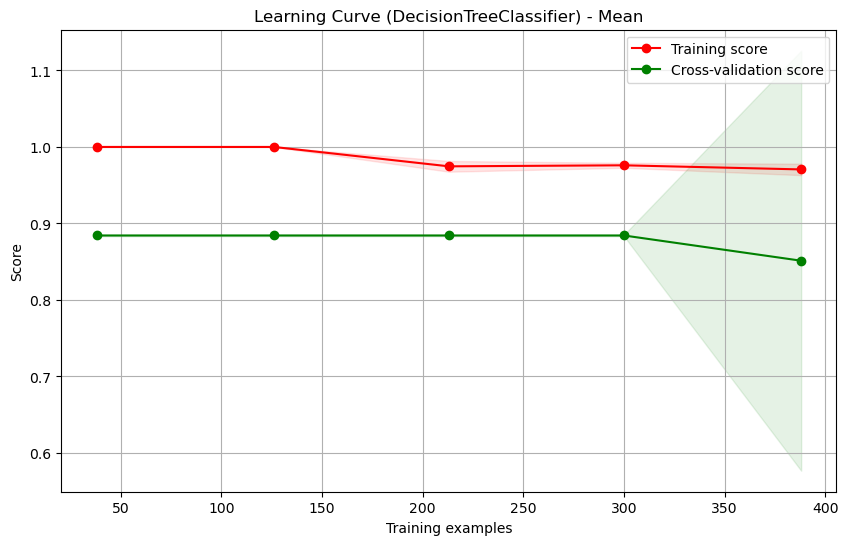

In [1314]:

# Initialize the model
model = DecisionTreeClassifier(min_samples_split=19, min_samples_leaf=12, max_depth=18)

# Plot the learning curve for your model
plot_learning_curve(model, "Learning Curve (DecisionTreeClassifier) - Mean", X_train_mean, y_train_mean, cv=10)


### KNN Fill

In [810]:
#Initialize the model 
model = DecisionTreeClassifier(min_samples_split=19, min_samples_leaf=12, max_depth=18, random_state=42)

# fit the model
model.fit(X_train_knn, y_train_knn)

# predict the response
y_pred_mean = model.predict(X_test_knn)
y_pred_train = model.predict(X_train_knn)

#build classification report for train
print("Training Report:", classification_report(y_train_knn, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_knn, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_knn, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_test_knn, y_pred_mean))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_train_knn, y_pred_train))

# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_knn, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_knn, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       0.98      0.99      0.99       382
           1       0.90      0.88      0.89        50

    accuracy                           0.97       432
   macro avg       0.94      0.93      0.94       432
weighted avg       0.97      0.97      0.97       432

Testing Report:               precision    recall  f1-score   support

           0       1.00      0.97      0.98       130
           1       0.78      1.00      0.88        14

    accuracy                           0.97       144
   macro avg       0.89      0.98      0.93       144
weighted avg       0.98      0.97      0.97       144

Confusion Matrix: [[126   4]
 [  0  14]]
Training accuracy Score:  0.9722222222222222
Testing accuracy Score:  0.9745370370370371
Training ROC AUC Score 0.9334554973821989
Testing ROC AUC Score 0.9846153846153847


In [803]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_knn.columns), reverse=True):
    print(name, importance)

Feature importances:
borough_code_E09000033 0.7501633093589962
humidity 0.13669359973963124
% of all 16+ who are aged 65+ 0.06206213602724097
start_number_of_docks 0.044900026885904804
% of all people aged 16+ who are female 0.006180927988226812
windspeed 0.0
visibility 0.0
uvindex 0.0
temp 0.0
start_year 0.0
start_number_standard_bikes 0.0
start_number_of_empty_docks 0.0
start_number_of_bikes 0.0
start_number_ebikes 0.0
start_month 0.0
precip 0.0
population_density 0.0
holiday 0.0
feelslike 0.0
duration_minutes 0.0
dew 0.0
cloudcover 0.0
borough_code_E09000032 0.0
borough_code_E09000030 0.0
borough_code_E09000028 0.0
borough_code_E09000025 0.0
borough_code_E09000022 0.0
borough_code_E09000020 0.0
borough_code_E09000019 0.0
borough_code_E09000013 0.0
borough_code_E09000012 0.0
borough_code_E09000007 0.0
borough_code_E09000001 0.0
average_house_price 0.0
Unemployment rate - aged 16+ 0.0
Rank of Income Scale 0.0
Rank of Employment Scale 0.0
Part Time Workers - mean_hourly 0.0
Part Time W

In [804]:
# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test_knn, y_pred_knn)

# Print the confusion matrix
print(conf_matrix)


array([[126,   4],
       [  0,  14]])

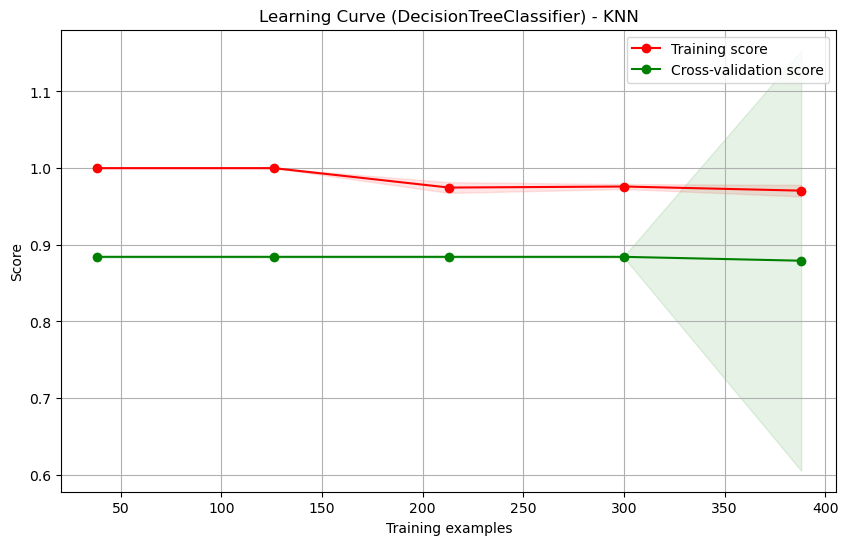

In [1315]:
# Initialize the model
model = DecisionTreeClassifier(min_samples_split=19, min_samples_leaf=12, max_depth=18, random_state=42)

# Plot the learning curve for your model
plot_learning_curve(model, "Learning Curve (DecisionTreeClassifier) - KNN", X_train_knn, y_train_knn, cv=10)


### Median Fill

In [811]:
#Initialize the model
model = DecisionTreeClassifier(min_samples_split=19, min_samples_leaf=12, max_depth=18, random_state=42)

# fit the model
model.fit(X_train_median, y_train_median)

# predict the response
y_pred_mean = model.predict(X_test_median)
y_pred_train = model.predict(X_train_median)

#build classification report for train
print("Training Report:", classification_report(y_train_median, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_median, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_median, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_test_median, y_pred_mean))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_train_median, y_pred_train))

# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_median, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_median, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       0.98      0.99      0.99       382
           1       0.90      0.88      0.89        50

    accuracy                           0.97       432
   macro avg       0.94      0.93      0.94       432
weighted avg       0.97      0.97      0.97       432

Testing Report:               precision    recall  f1-score   support

           0       1.00      0.97      0.98       130
           1       0.78      1.00      0.88        14

    accuracy                           0.97       144
   macro avg       0.89      0.98      0.93       144
weighted avg       0.98      0.97      0.97       144

Confusion Matrix: [[126   4]
 [  0  14]]
Training accuracy Score:  0.9722222222222222
Testing accuracy Score:  0.9745370370370371
Training ROC AUC Score 0.9334554973821989
Testing ROC AUC Score 0.9846153846153847


In [812]:
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_median.columns), reverse=True):
    print(name, importance)

Feature importances:
borough_code_E09000033 0.7501633093589962
humidity 0.13669359973963124
IDAOPI - Average score  0.06206213602724097
start_number_of_docks 0.044900026885904804
% of all people aged 16+ who are female 0.006180927988226812
windspeed 0.0
visibility 0.0
uvindex 0.0
temp 0.0
start_year 0.0
start_number_standard_bikes 0.0
start_number_of_empty_docks 0.0
start_number_of_bikes 0.0
start_number_ebikes 0.0
start_month 0.0
precip 0.0
population_density 0.0
holiday 0.0
feelslike 0.0
duration_minutes 0.0
dew 0.0
cloudcover 0.0
borough_code_E09000032 0.0
borough_code_E09000030 0.0
borough_code_E09000028 0.0
borough_code_E09000025 0.0
borough_code_E09000022 0.0
borough_code_E09000020 0.0
borough_code_E09000019 0.0
borough_code_E09000013 0.0
borough_code_E09000012 0.0
borough_code_E09000007 0.0
borough_code_E09000001 0.0
average_house_price 0.0
Unemployment rate - aged 16+ 0.0
Rank of Income Scale 0.0
Rank of Employment Scale 0.0
Part Time Workers - mean_hourly 0.0
Part Time Workers

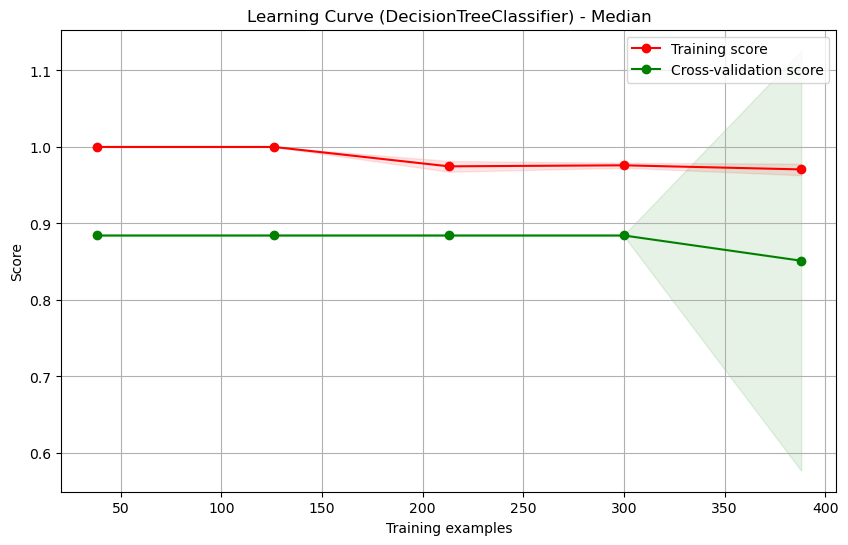

In [1316]:

# Initialize the model
model = DecisionTreeClassifier(min_samples_split=19, min_samples_leaf=12, max_depth=18, random_state=42)

# Plot the learning curve for your model
plot_learning_curve(model, "Learning Curve (DecisionTreeClassifier) - Median", X_train_median, y_train_median, cv=10)


# Fourth Round: Classification Model - All features without Borough code

### Pre-process Data

In [1317]:
# Drop the specified columns from the DataFrames

# For the training and testing datasets with k-NN imputation
X_train_knn.drop(borough_columns, axis=1, inplace=True)
X_test_knn.drop(borough_columns, axis=1, inplace=True)

# For the training and testing datasets with mean imputation
X_train_mean.drop(borough_columns, axis=1, inplace=True)
X_test_mean.drop(borough_columns, axis=1, inplace=True)

# For the training and testing datasets with median imputation
X_train_median.drop(borough_columns, axis=1, inplace=True)
X_test_median.drop(borough_columns, axis=1, inplace=True)


### Mean Fill

In [832]:
#Initialize the model
model = DecisionTreeClassifier(min_samples_split=12, min_samples_leaf=16, max_depth=18, random_state=42)

# fit the model
model.fit(X_train_mean, y_train_mean)

# predict the response
y_pred_mean = model.predict(X_test_mean)
y_pred_train = model.predict(X_train_mean)

#build classification report for train
print("Training Report:", classification_report(y_train_mean, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_mean, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_mean, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_test_mean, y_pred_mean))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_train_mean, y_pred_train))


# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_mean, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_mean, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       0.97      0.98      0.98       382
           1       0.83      0.80      0.82        50

    accuracy                           0.96       432
   macro avg       0.90      0.89      0.90       432
weighted avg       0.96      0.96      0.96       432

Testing Report:               precision    recall  f1-score   support

           0       1.00      0.98      0.99       130
           1       0.82      1.00      0.90        14

    accuracy                           0.98       144
   macro avg       0.91      0.99      0.95       144
weighted avg       0.98      0.98      0.98       144

Confusion Matrix: [[127   3]
 [  0  14]]
Training accuracy Score:  0.9791666666666666
Testing accuracy Score:  0.9583333333333334
Training ROC AUC Score 0.8895287958115183
Testing ROC AUC Score 0.9884615384615384


In [820]:
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_mean.columns), reverse=True):
    print(name, importance)

Feature importances:
Full Time Workers  - median_annual 0.527439188328687
IMD - Proportion of LSOAs in most deprived 10% nationally  0.22328602357469324
humidity 0.13669359973963122
IDAOPI - Average score  0.06159614443439817
start_number_of_docks 0.044804115934363495
% of all 16+ who are aged 16-19 0.006180927988226811
windspeed 0.0
visibility 0.0
uvindex 0.0
temp 0.0
start_year 0.0
start_number_standard_bikes 0.0
start_number_of_empty_docks 0.0
start_number_of_bikes 0.0
start_number_ebikes 0.0
start_month 0.0
precip 0.0
population_density 0.0
holiday 0.0
feelslike 0.0
duration_minutes 0.0
dew 0.0
cloudcover 0.0
average_house_price 0.0
Unemployment rate - aged 16+ 0.0
Rank of Income Scale 0.0
Rank of Employment Scale 0.0
Part Time Workers - mean_hourly 0.0
Part Time Workers - mean_annual 0.0
Part Time Workers  - median_weekly 0.0
Part Time Workers  - median_hourly 0.0
Part Time Workers  - median_annual 0.0
Part Time Workers  - mean_weekly 0.0
Male Part Time Workers - mean_hourly 0.0
M

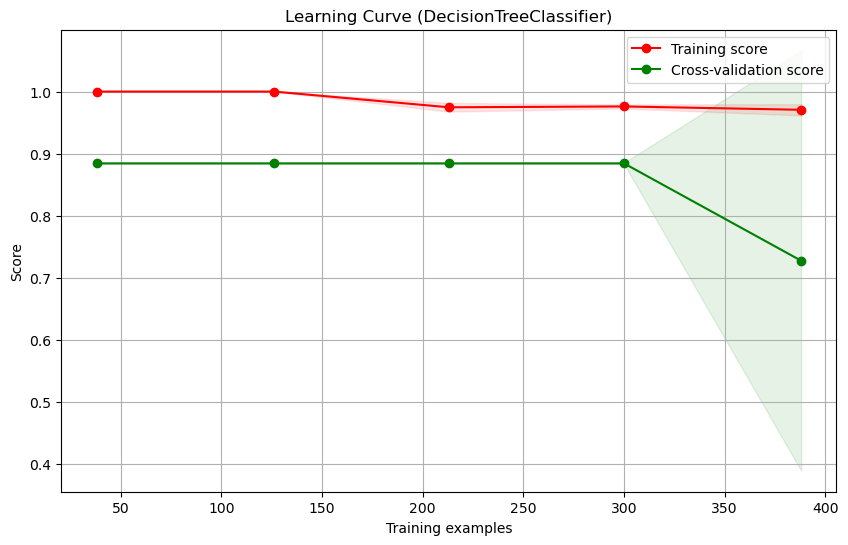

In [821]:
# Initialize the model
model = DecisionTreeClassifier(min_samples_split=19, min_samples_leaf=12, max_depth=18)

# Plot the learning curve for your model
plot_learning_curve(model, "Learning Curve (DecisionTreeClassifier)", X_train_mean, y_train_mean, cv=10)


### KNN fill

In [827]:
#Initialize the model 
model = DecisionTreeClassifier(min_samples_split=19, min_samples_leaf=12, max_depth=18, random_state=42)

# fit the model
model.fit(X_train_knn, y_train_knn)

# predict the response
y_pred_mean = model.predict(X_test_knn)
y_pred_train = model.predict(X_train_knn)

#build classification report for train
print("Training Report:", classification_report(y_train_knn, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_knn, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_knn, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_test_knn, y_pred_mean))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_train_knn, y_pred_train))

# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_knn, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_knn, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       0.98      0.99      0.99       382
           1       0.90      0.88      0.89        50

    accuracy                           0.97       432
   macro avg       0.94      0.93      0.94       432
weighted avg       0.97      0.97      0.97       432

Testing Report:               precision    recall  f1-score   support

           0       1.00      0.97      0.98       130
           1       0.78      1.00      0.88        14

    accuracy                           0.97       144
   macro avg       0.89      0.98      0.93       144
weighted avg       0.98      0.97      0.97       144

Confusion Matrix: [[126   4]
 [  0  14]]
Training accuracy Score:  0.9722222222222222
Testing accuracy Score:  0.9745370370370371
Training ROC AUC Score 0.9334554973821989
Testing ROC AUC Score 0.9846153846153847


In [823]:
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_knn.columns), reverse=True):
    print(name, importance)

Feature importances:
Male Full Time Workers - mean_annual 0.48382855619152176
% in employment working part-time - aged 50+ 0.2606622780321125
humidity 0.13197406422737792
IDAOPI - Average score  0.06721660414065238
feelslike 0.05035097450414093
% in employment working full-time - aged 50+ 0.005967522904194488
windspeed 0.0
visibility 0.0
uvindex 0.0
temp 0.0
start_year 0.0
start_number_standard_bikes 0.0
start_number_of_empty_docks 0.0
start_number_of_docks 0.0
start_number_of_bikes 0.0
start_number_ebikes 0.0
start_month 0.0
precip 0.0
population_density 0.0
holiday 0.0
duration_minutes 0.0
dew 0.0
cloudcover 0.0
average_house_price 0.0
Unemployment rate - aged 16+ 0.0
Rank of Income Scale 0.0
Rank of Employment Scale 0.0
Part Time Workers - mean_hourly 0.0
Part Time Workers - mean_annual 0.0
Part Time Workers  - median_weekly 0.0
Part Time Workers  - median_hourly 0.0
Part Time Workers  - median_annual 0.0
Part Time Workers  - mean_weekly 0.0
Male Part Time Workers - mean_hourly 0.0


In [824]:
confusion_matrix(y_test_knn, y_pred_knn)

array([[126,   4],
       [  0,  14]])

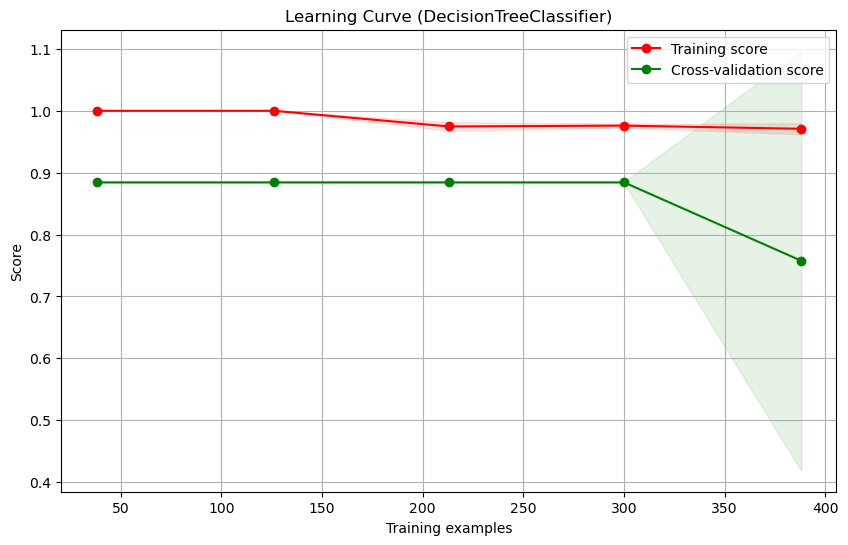

In [825]:
# Initialize the model
model = DecisionTreeClassifier(min_samples_split=19, min_samples_leaf=12, max_depth=18, random_state=42)

# Plot the learning curve for your model
plot_learning_curve(model, "Learning Curve (DecisionTreeClassifier)", X_train_knn, y_train_knn, cv=10)


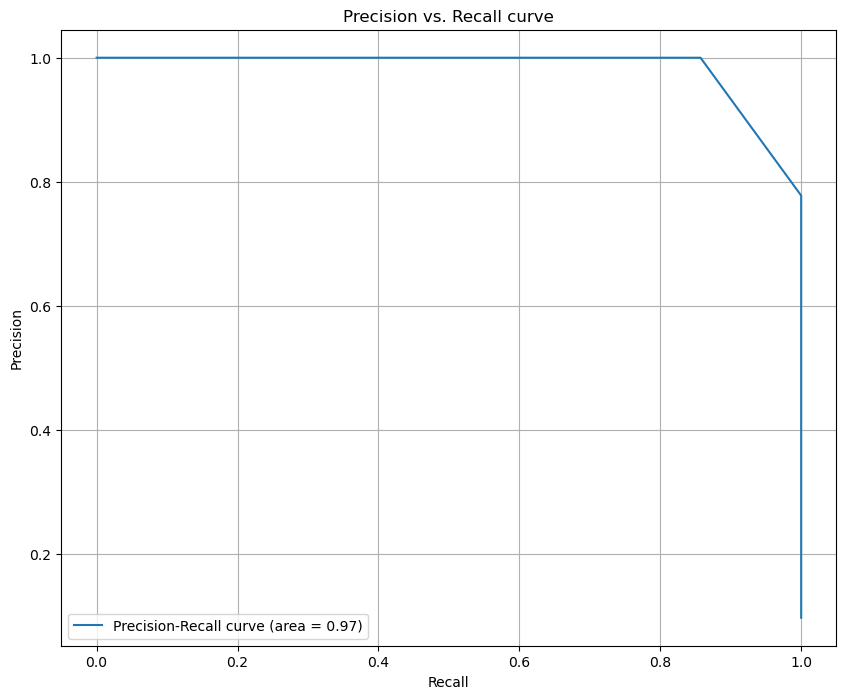

In [828]:
# Compute probabilities of class membership (for the positive class, typically labeled as 1).
y_scores = model.predict_proba(X_test_knn)[:, 1]

# Calculate precision and recall values for various thresholds
precision, recall, _ = precision_recall_curve(y_test_knn, y_scores)

# Average precision score
avg_precision = average_precision_score(y_test_knn, y_scores)

# Plot Precision-Recall curve
plt.figure(figsize=(10, 8))
plt.plot(recall, precision, label='Precision-Recall curve (area = %0.2f)' % avg_precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision vs. Recall curve')
plt.legend(loc="lower left")
plt.grid(True)
plt.show()


### Median Fill

In [829]:
#Initialize the model 
model = DecisionTreeClassifier(min_samples_split=19, min_samples_leaf=12, max_depth=18, random_state=42)

# fit the model
model.fit(X_train_median, y_train_median)

# predict the response
y_pred_mean = model.predict(X_test_median)
y_pred_train = model.predict(X_train_median)

#build classification report for train
print("Training Report:", classification_report(y_train_median, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_median, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_median, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_test_median, y_pred_mean))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_train_median, y_pred_train))

# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_median, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_median, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       0.98      0.99      0.99       382
           1       0.90      0.88      0.89        50

    accuracy                           0.97       432
   macro avg       0.94      0.93      0.94       432
weighted avg       0.97      0.97      0.97       432

Testing Report:               precision    recall  f1-score   support

           0       1.00      0.97      0.98       130
           1       0.78      1.00      0.88        14

    accuracy                           0.97       144
   macro avg       0.89      0.98      0.93       144
weighted avg       0.98      0.97      0.97       144

Confusion Matrix: [[126   4]
 [  0  14]]
Training accuracy Score:  0.9722222222222222
Testing accuracy Score:  0.9745370370370371
Training ROC AUC Score 0.9334554973821989
Testing ROC AUC Score 0.9846153846153847


In [830]:
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_median.columns), reverse=True):
    print(name, importance)

Feature importances:
Full Time Workers  - median_annual 0.527439188328687
IMD - Proportion of LSOAs in most deprived 10% nationally  0.22328602357469324
humidity 0.13669359973963122
IDAOPI - Average score  0.06159614443439817
start_number_of_docks 0.044804115934363495
% of all 16+ who are aged 16-19 0.006180927988226811
windspeed 0.0
visibility 0.0
uvindex 0.0
temp 0.0
start_year 0.0
start_number_standard_bikes 0.0
start_number_of_empty_docks 0.0
start_number_of_bikes 0.0
start_number_ebikes 0.0
start_month 0.0
precip 0.0
population_density 0.0
holiday 0.0
feelslike 0.0
duration_minutes 0.0
dew 0.0
cloudcover 0.0
average_house_price 0.0
Unemployment rate - aged 16+ 0.0
Rank of Income Scale 0.0
Rank of Employment Scale 0.0
Part Time Workers - mean_hourly 0.0
Part Time Workers - mean_annual 0.0
Part Time Workers  - median_weekly 0.0
Part Time Workers  - median_hourly 0.0
Part Time Workers  - median_annual 0.0
Part Time Workers  - mean_weekly 0.0
Male Part Time Workers - mean_hourly 0.0
M

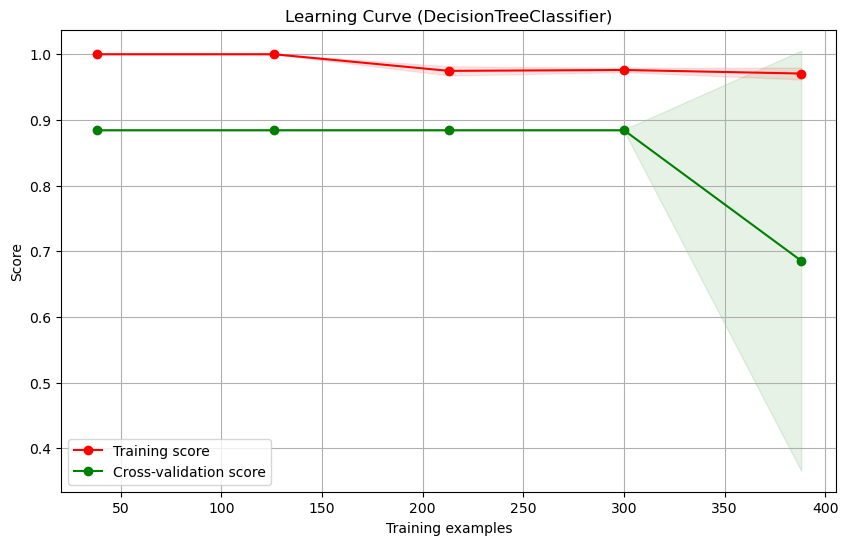

In [831]:
# Initialize the model
model = DecisionTreeClassifier(min_samples_split=19, min_samples_leaf=12, max_depth=18, random_state=42)

# Plot the learning curve for your model
plot_learning_curve(model, "Learning Curve (DecisionTreeClassifier)", X_train_median, y_train_median, cv=10)


# Fifth round: Ensemble Methods - All features except for boroughs

## Random Forest model

### Mean Fill

In [833]:
# Initialize the model
model = RandomForestClassifier(random_state=42)

# Define the parameters for random search
param_distributions = {
    'n_estimators': [10, 50, 100, 200, 300],
    'max_depth': [i for i in range(2, 21)],   # extended range
    'min_samples_split': [i for i in range(2, 21)],
    'min_samples_leaf': [i for i in range(1, 21)],
    'max_features': ['auto', 'sqrt', 'log2'],
    'class_weight': ['balanced', None]
}

# Initialize the random search
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions, n_iter=100, cv=10, verbose=1, random_state=42)

overfitting = True
iteration = 0
max_iterations = 1

while overfitting and iteration < max_iterations:
    print('param_grid',iteration,":", param_distributions)

    # Fit the grid search
    random_search.fit(X_train_mean, y_train_mean)

    # Make predictions on the training and test sets
    y_pred_train = random_search.predict(X_train_mean)
    y_pred_test = random_search.predict(X_test_mean)

    # Compute the accuracy scores
    train_acc = accuracy_score(y_train_mean, y_pred_train)
    test_acc = accuracy_score(y_test_mean, y_pred_test)
    
    print(train_acc, test_acc)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_acc - test_acc) < 0.005:
        overfitting = False
    else:
        iteration += 1

# Print the best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

# Print the classification report
print("Train Classification Report:")
print(classification_report(y_train_mean, y_pred_train))
print("Test Classification Report:")
print(classification_report(y_test_mean, y_pred_test))

# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(random_search.best_estimator_.feature_importances_, X_train_mean.columns), reverse=True):
    print(name, importance)


param_grid 0 : {'n_estimators': [10, 50, 100, 200, 300], 'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20], 'min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20], 'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20], 'max_features': ['auto', 'sqrt', 'log2'], 'class_weight': ['balanced', None]}
Fitting 10 folds for each of 100 candidates, totalling 1000 fits


/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/mohammadmaraqa/opt/anaconda3/envs/proj/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, expli

0.9583333333333334 0.9861111111111112
Best parameters: {'n_estimators': 200, 'min_samples_split': 17, 'min_samples_leaf': 15, 'max_features': 'log2', 'max_depth': 5, 'class_weight': None}
Best score: 0.9168076109936575
Train Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.98       382
           1       0.94      0.68      0.79        50

    accuracy                           0.96       432
   macro avg       0.95      0.84      0.88       432
weighted avg       0.96      0.96      0.96       432

Test Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       130
           1       1.00      0.86      0.92        14

    accuracy                           0.99       144
   macro avg       0.99      0.93      0.96       144
weighted avg       0.99      0.99      0.99       144

Feature importances:
Employment - Proportion  of LSOAs in most deprive

In [834]:
# confusion matrix
confusion_matrix(y_test_mean, y_pred_test)

array([[130,   0],
       [  2,  12]])

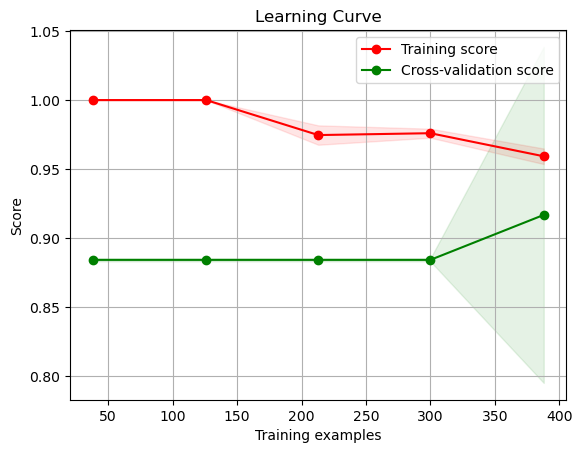

In [835]:
# Call the function to plot the learning curve
plot_learning_curve(random_search.best_estimator_, "Learning Curve", X_train_mean, y_train_mean, cv=10)
plt.show()


### KNN Fill

In [836]:
# Initialize the model
model = RandomForestClassifier(random_state=42)

# Define the parameters for random search
param_distributions = {
    'n_estimators': [10, 50, 100, 200, 500],  # Number of trees in the forest
    'max_depth': [i for i in range(2, 25)],
    'min_samples_split': [i for i in range(2, 25)],
    'min_samples_leaf': [i for i in range(2, 25)],
    'bootstrap': [True, False],
    'class_weight': ['balanced', 'balanced_subsample', None],
}

# Initialize the random search
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions, n_iter=50, cv=5, verbose=1, random_state=42)

overfitting = True
iteration = 0
max_iterations = 1

while overfitting and iteration < max_iterations:
    # Fit the grid search
    random_search.fit(X_train_knn, y_train_knn)

    # Make predictions on the training and test sets
    y_pred_train = random_search.predict(X_train_knn)
    y_pred_test = random_search.predict(X_test_knn)

    # Compute the accuracy scores
    train_acc = accuracy_score(y_train_knn, y_pred_train)
    test_acc = accuracy_score(y_test_knn, y_pred_test)
    
    print(train_acc, test_acc)
    
    print("Best parameters:", random_search.best_params_)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_acc - test_acc) < 0.005:
        overfitting = False
    else:
        iteration += 1

# Print the best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

# Print the classification report
print("Train Classification Report:")
print(classification_report(y_train_knn, y_pred_train))
print("Test Classification Report:")
print(classification_report(y_test_knn, y_pred_test))

# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(random_search.best_estimator_.feature_importances_, X_train_knn.columns), reverse=True):
    print(name, importance)


Fitting 5 folds for each of 50 candidates, totalling 250 fits


0.9583333333333334 0.9861111111111112
Best parameters: {'n_estimators': 500, 'min_samples_split': 5, 'min_samples_leaf': 15, 'max_depth': 9, 'class_weight': None, 'bootstrap': True}
Best parameters: {'n_estimators': 500, 'min_samples_split': 5, 'min_samples_leaf': 15, 'max_depth': 9, 'class_weight': None, 'bootstrap': True}
Best score: 0.8405239240844693
Train Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.98       382
           1       0.94      0.68      0.79        50

    accuracy                           0.96       432
   macro avg       0.95      0.84      0.88       432
weighted avg       0.96      0.96      0.96       432

Test Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       130
           1       1.00      0.86      0.92        14

    accuracy                           0.99       144
   macro avg       0.99      0.93      0.

In [837]:
# confusion matrix
confusion_matrix(y_test_knn, y_pred_test)

array([[130,   0],
       [  2,  12]])

Training set sizes: [ 38 126 213 300 388]
Mean training scores: [1.         1.         0.97464789 0.976      0.95927835]
Std deviation of training scores: [0.         0.         0.00702659 0.00326599 0.00562305]
Mean test scores: [0.88424947 0.88424947 0.88424947 0.88424947 0.83498943]
Std deviation of test scores: [0.00105708 0.00105708 0.00105708 0.00105708 0.28290781]


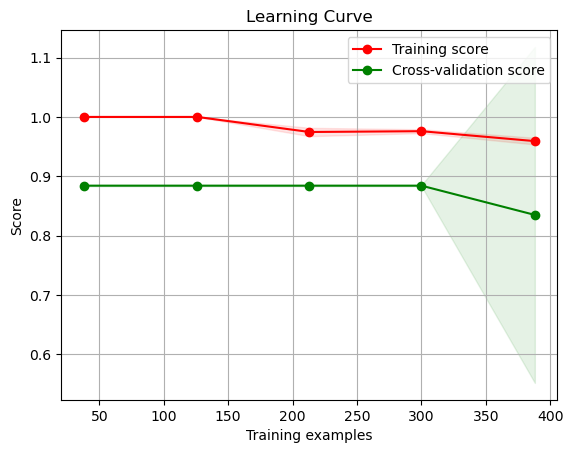

In [838]:

# Call the function to plot the learning curve
plot_learning_curve(random_search.best_estimator_, "Learning Curve", X_train_knn, y_train_knn, cv=10)
plt.show()


### Median Fill

In [839]:
# Initialize the model
model = RandomForestClassifier(random_state=42)

# Define the parameters for random search
param_distributions = {
    'n_estimators': [10, 50, 100, 200, 500],  # Number of trees in the forest
    'max_depth': [i for i in range(2, 25)],
    'min_samples_split': [i for i in range(2, 25)],
    'min_samples_leaf': [i for i in range(2, 25)],
    'bootstrap': [True, False],
    'class_weight': ['balanced', 'balanced_subsample', None],
}

# Initialize the random search
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions, n_iter=50, cv=5, verbose=1, random_state=42)

overfitting = True
iteration = 0
max_iterations = 1

while overfitting and iteration < max_iterations:
    # Fit the grid search
    random_search.fit(X_train_median, y_train_median)

    # Make predictions on the training and test sets
    y_pred_train = random_search.predict(X_train_median)
    y_pred_test = random_search.predict(X_test_median)

    # Compute the accuracy scores
    train_acc = accuracy_score(y_train_median, y_pred_train)
    test_acc = accuracy_score(y_test_median, y_pred_test)
    
    print(train_acc, test_acc)
    
    print("Best parameters:", random_search.best_params_)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_acc - test_acc) < 0.005:
        overfitting = False
    else:
        iteration += 1

# Print the best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

# Print the classification report
print("Train Classification Report:")
print(classification_report(y_train_median, y_pred_train))
print("Test Classification Report:")
print(classification_report(y_test_median, y_pred_test))

# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(random_search.best_estimator_.feature_importances_, X_train_median.columns), reverse=True):
    print(name, importance)


Fitting 5 folds for each of 50 candidates, totalling 250 fits


0.9583333333333334 0.9861111111111112
Best parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 23, 'max_depth': 7, 'class_weight': None, 'bootstrap': True}
Best parameters: {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 23, 'max_depth': 7, 'class_weight': None, 'bootstrap': True}
Best score: 0.8539160652232024
Train Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.98       382
           1       0.94      0.68      0.79        50

    accuracy                           0.96       432
   macro avg       0.95      0.84      0.88       432
weighted avg       0.96      0.96      0.96       432

Test Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       130
           1       1.00      0.86      0.92        14

    accuracy                           0.99       144
   macro avg       0.99      0.93      0.

In [840]:
# confusion matrix
confusion_matrix(y_test_median, y_pred_test)

array([[130,   0],
       [  2,  12]])

Training set sizes: [ 38 126 213 300 388]
Mean training scores: [1.         1.         0.97464789 0.976      0.95927835]
Std deviation of training scores: [0.         0.         0.00702659 0.00326599 0.00562305]
Mean test scores: [0.88424947 0.88424947 0.88424947 0.88424947 0.91680761]
Std deviation of test scores: [0.00105708 0.00105708 0.00105708 0.00105708 0.12168465]


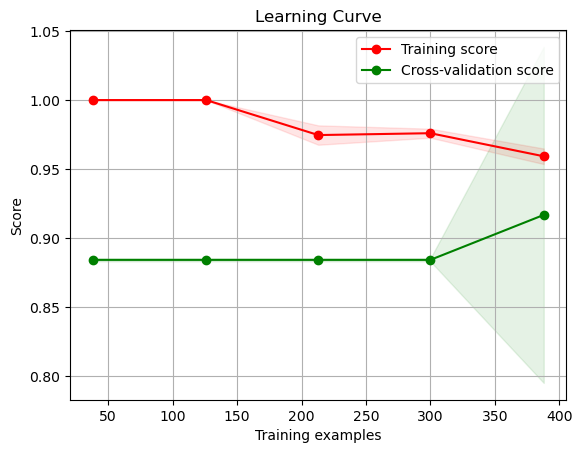

In [841]:
# Call the function to plot the learning curve
plot_learning_curve(random_search.best_estimator_, "Learning Curve", X_train_median, y_train_median, cv=10)
plt.show()


## Evaluation

### Mean Fill

In [1318]:
#Initialize the model with n_estimators': 200, 'min_samples_split': 17, 'min_samples_leaf': 15, 'max_features': 'log2', 'max_depth': 5, 'class_weight': None
model = RandomForestClassifier(n_estimators=150, min_samples_split=8, min_samples_leaf= 3, max_depth=14,random_state=42)

# fit the model
model.fit(X_train_mean, y_train_mean)

# predict the response
y_pred_mean = model.predict(X_test_mean)
y_pred_train = model.predict(X_train_mean)

#build classification report for train
print("Training Report:", classification_report(y_train_mean, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_mean, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_mean, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_train_mean, y_pred_train))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_test_mean, y_pred_mean))


# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_mean, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_mean, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       0.99      0.99      0.99       382
           1       0.96      0.90      0.93        50

    accuracy                           0.98       432
   macro avg       0.97      0.95      0.96       432
weighted avg       0.98      0.98      0.98       432

Testing Report:               precision    recall  f1-score   support

           0       0.98      1.00      0.99       130
           1       1.00      0.86      0.92        14

    accuracy                           0.99       144
   macro avg       0.99      0.93      0.96       144
weighted avg       0.99      0.99      0.99       144

Confusion Matrix: [[130   0]
 [  2  12]]
Training accuracy Score:  0.9837962962962963
Testing accuracy Score:  0.9861111111111112
Training ROC AUC Score 0.9473821989528796
Testing ROC AUC Score 0.9285714285714286


In [1319]:
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_mean.columns), reverse=True):
    print(name, importance)

Feature importances:
Full Time Workers  - median_annual 0.04171970898635198
Employment - Proportion  of LSOAs in most deprived 10% nationally  0.03796530439865354
Employment - Rank of proportion of LSOAs in most deprived 10% nationally  0.031126537775493467
Female Full Time Workers - mean_annual 0.030553069860045648
Full Time Workers - mean_annual 0.030262293260538572
average_house_price 0.029305204095021777
start_number_of_bikes 0.029047913955927332
Health Deprivation and Disability - Average score  0.02576358851564944
% who are economically inactive - aged 16+ 0.022784892271644788
humidity 0.021228897810042127
start_number_of_empty_docks 0.020707691858243872
Economic activity rate - aged 16+ 0.020052917278139494
duration_minutes 0.01999280859752167
feelslike 0.017538423729985205
temp 0.01703123617922495
Crime - Rank of average rank  0.016106908745988927
Barriers to Housing and Services - Proportion  of LSOAs in most deprived 10% nationally  0.015862095904617787
% of all people aged 1

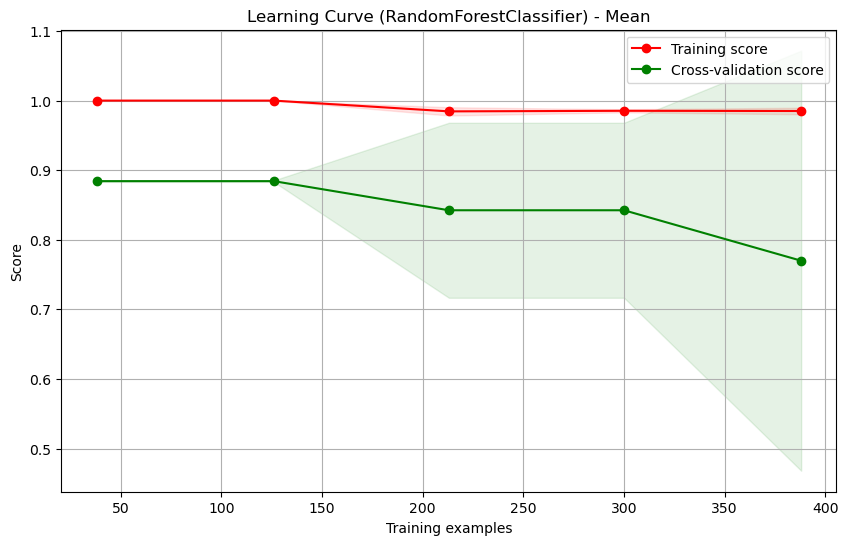

In [1320]:
# Initialize the model
model = RandomForestClassifier(n_estimators=150, min_samples_split=8, min_samples_leaf= 3, max_depth=14,random_state=42)

# Plot the learning curve for your model
plot_learning_curve(model, "Learning Curve (RandomForestClassifier) - Mean", X_train_mean, y_train_mean, cv=10)


### KNN Fill

In [1321]:
#Initialize the model {'min_samples_split': 8, 'min_samples_leaf': 14, 'max_features': 'sqrt', 'max_depth': 17, 'class_weight': 'balanced'}
model = RandomForestClassifier(n_estimators=150, min_samples_split=8, min_samples_leaf= 3, max_depth=14,random_state=42)

# fit the model
model.fit(X_train_knn, y_train_knn)

# predict the response
y_pred_mean = model.predict(X_test_knn)
y_pred_train = model.predict(X_train_knn)

#build classification report for train
print("Training Report:", classification_report(y_train_knn, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_knn, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_knn, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_test_knn, y_pred_mean))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_train_knn, y_pred_train))

# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_knn, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_knn, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       0.99      0.99      0.99       382
           1       0.96      0.92      0.94        50

    accuracy                           0.99       432
   macro avg       0.97      0.96      0.97       432
weighted avg       0.99      0.99      0.99       432

Testing Report:               precision    recall  f1-score   support

           0       0.98      1.00      0.99       130
           1       1.00      0.86      0.92        14

    accuracy                           0.99       144
   macro avg       0.99      0.93      0.96       144
weighted avg       0.99      0.99      0.99       144

Confusion Matrix: [[130   0]
 [  2  12]]
Training accuracy Score:  0.9861111111111112
Testing accuracy Score:  0.9861111111111112
Training ROC AUC Score 0.9573821989528797
Testing ROC AUC Score 0.9285714285714286


In [1322]:
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_knn.columns), reverse=True):
    print(name, importance)

Feature importances:
Male Full Time Workers - mean_annual 0.06528745244338771
Employment - Proportion  of LSOAs in most deprived 10% nationally 0.03393102543496438
Employment - Rank of proportion of LSOAs in most deprived 10% nationally 0.029371064864101754
average_house_price 0.029241664928547635
Health Deprivation and Disability - Average score 0.02809689752439711
duration_minutes 0.022582926039843063
Crime - Rank of average rank 0.021115419855511592
Female Full Time Workers - mean_annual 0.020568988951971852
IDACI - Rank of average rank 0.019190344555687747
Economic activity rate - aged 16+ 0.018228214177901134
start_number_standard_bikes 0.018045236405267347
Barriers to Housing and Services - Proportion  of LSOAs in most deprived 10% nationally 0.017990409158829043
start_number_of_bikes 0.017680136707280393
Crime - Average score 0.017246481826042874
start_number_of_empty_docks 0.01672660724281158
Female Full Time Workers  - mean_weekly 0.01558699118475397
humidity 0.015300144661955

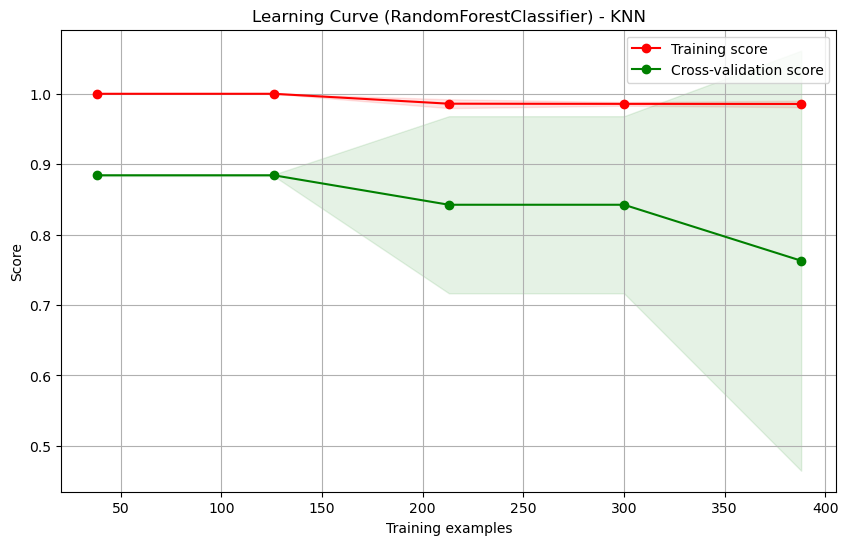

In [1324]:
# Initialize the model
model = RandomForestClassifier(n_estimators=150, min_samples_split=8, min_samples_leaf= 3, max_depth=14,random_state=42)

# Plot the learning curve for your model
plot_learning_curve(model, "Learning Curve (RandomForestClassifier) - KNN", X_train_knn, y_train_knn, cv=10)


### Median Fill

In [1328]:
#Initialize the model {'min_samples_split': 8, 'min_samples_leaf': 14, 'max_features': 'sqrt', 'max_depth': 17, 'class_weight': 'balanced'}
model = RandomForestClassifier(n_estimators=150, min_samples_split=8, min_samples_leaf= 3, max_depth=14)

# fit the model
model.fit(X_train_median, y_train_median)

# predict the response
y_pred_mean = model.predict(X_test_median)
y_pred_train = model.predict(X_train_median)

#build classification report for train
print("Training Report:", classification_report(y_train_median, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_median, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_median, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_test_median, y_pred_mean))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_train_median, y_pred_train))

# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_median, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_median, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       0.99      0.99      0.99       382
           1       0.96      0.90      0.93        50

    accuracy                           0.98       432
   macro avg       0.97      0.95      0.96       432
weighted avg       0.98      0.98      0.98       432

Testing Report:               precision    recall  f1-score   support

           0       0.98      1.00      0.99       130
           1       1.00      0.86      0.92        14

    accuracy                           0.99       144
   macro avg       0.99      0.93      0.96       144
weighted avg       0.99      0.99      0.99       144

Confusion Matrix: [[130   0]
 [  2  12]]
Training accuracy Score:  0.9861111111111112
Testing accuracy Score:  0.9837962962962963
Training ROC AUC Score 0.9473821989528796
Testing ROC AUC Score 0.9285714285714286


In [1326]:
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_median.columns), reverse=True):
    print(name, importance)

Feature importances:
Full Time Workers  - median_annual 0.04139714164287989
Employment - Proportion  of LSOAs in most deprived 10% nationally  0.03796712239718423
Employment - Rank of proportion of LSOAs in most deprived 10% nationally  0.031126537775493467
Female Full Time Workers - mean_annual 0.030553069860045648
Full Time Workers - mean_annual 0.030262293260538572
average_house_price 0.029305204095021777
start_number_of_bikes 0.029286598895521685
Health Deprivation and Disability - Average score  0.02576358851564944
% who are economically inactive - aged 16+ 0.022793333385189025
start_number_of_empty_docks 0.020925232571807284
humidity 0.02081847383266931
Economic activity rate - aged 16+ 0.020053606401356006
duration_minutes 0.01995369017259993
feelslike 0.017280008833333162
temp 0.01703123617922495
Crime - Rank of average rank  0.016106908745988927
Barriers to Housing and Services - Proportion  of LSOAs in most deprived 10% nationally  0.015862095904617787
% of all people aged 16

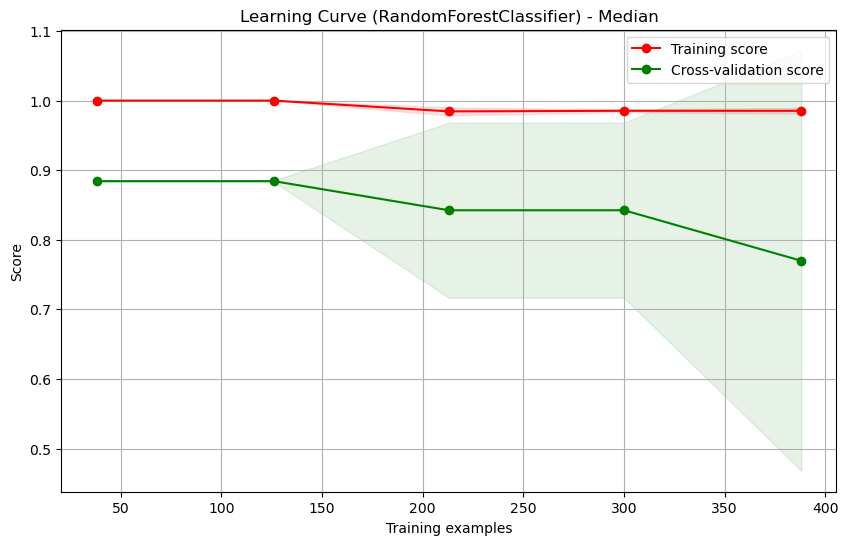

In [1327]:
# Initialize the model
model = RandomForestClassifier(n_estimators=150, min_samples_split=8, min_samples_leaf= 3, max_depth=14,random_state=42)

# Plot the learning curve for your model
plot_learning_curve(model, "Learning Curve (RandomForestClassifier) - Median", X_train_median, y_train_median, cv=10)


## Gradient Boost Classifier

### Mean Fill

In [907]:
#Initialize the model n_estimators': 50, 'min_samples_split': 13, 'min_samples_leaf': 8, 'max_depth': 7, 'learning_rate': 0.01
model = GradientBoostingClassifier(n_estimators=150, min_samples_split=13, min_samples_leaf= 8, max_depth=7, learning_rate=0.01,random_state=42)

# fit the model
model.fit(X_train_mean, y_train_mean)

# predict the response
y_pred_mean = model.predict(X_test_mean)
y_pred_train = model.predict(X_train_mean)

#build classification report for train
print("Training Report:", classification_report(y_train_mean, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_mean, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_mean, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_test_mean, y_pred_mean))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_train_mean, y_pred_train))

# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_mean, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_mean, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       1.00      0.99      1.00       382
           1       0.96      0.98      0.97        50

    accuracy                           0.99       432
   macro avg       0.98      0.99      0.98       432
weighted avg       0.99      0.99      0.99       432

Testing Report:               precision    recall  f1-score   support

           0       1.00      0.99      1.00       130
           1       0.93      1.00      0.97        14

    accuracy                           0.99       144
   macro avg       0.97      1.00      0.98       144
weighted avg       0.99      0.99      0.99       144

Confusion Matrix: [[129   1]
 [  0  14]]
Training accuracy Score:  0.9930555555555556
Testing accuracy Score:  0.9930555555555556
Training ROC AUC Score 0.9873821989528797
Testing ROC AUC Score 0.9961538461538462


In [908]:
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_mean.columns), reverse=True):
    print(name, importance)

Feature importances:
Full Time Workers  - median_annual 0.48548072217419513
humidity 0.08109434611991308
Unemployment rate - aged 16+ 0.039024545372011575
start_number_of_docks 0.035612252967019205
feelslike 0.03179862149745574
% with NVQ2 only - aged 16-64 0.02970400379897771
duration_minutes 0.025036228923840123
temp 0.017734740177056268
start_number_standard_bikes 0.01347723424130308
% of all 16+ who are aged 25-34 0.012210198865259213
start_number_ebikes 0.009571962343650632
% of all 16+ who are aged 16-19 0.009402354362711597
cloudcover 0.009228470477277467
% in employment working part-time - aged 25-49 0.00837083935379516
Female Part Time Workers - mean_hourly 0.008084284615893075
Part Time Workers  - median_hourly 0.007657964474294814
% of all 16+ who are aged 65+ 0.006365272875933549
% with NVQ4+ - aged 16-64 0.006207789164120651
% in employment working part-time - aged 50+ 0.005622472180581702
Income - Rank of proportion of LSOAs in most deprived 10% nationally  0.005500541320

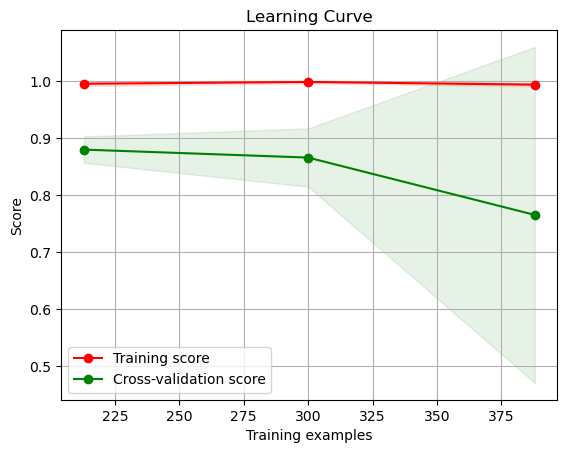

In [886]:
# Call the function to plot the learning curve
plot_learning_curve(model, "Learning Curve (GradientBoost) - Mean", X_train_mean, y_train_mean, cv=10)
plt.show()


### KNN Fill

In [1329]:
#Initialize the model n_estimators': 50, 'min_samples_split': 13, 'min_samples_leaf': 8, 'max_depth': 7, 'learning_rate': 0.01
model = GradientBoostingClassifier(n_estimators=150, min_samples_split=13, min_samples_leaf= 8, max_depth=7, learning_rate=0.01,random_state=42)

# fit the model
model.fit(X_train_knn, y_train_knn)

# predict the response
y_pred_mean = model.predict(X_test_knn)
y_pred_train = model.predict(X_train_knn)

#build classification report for train
print("Training Report:", classification_report(y_train_knn, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_knn, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_knn, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_test_knn, y_pred_mean))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_train_knn, y_pred_train))

# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_knn, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_knn, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       1.00      0.99      1.00       382
           1       0.96      1.00      0.98        50

    accuracy                           1.00       432
   macro avg       0.98      1.00      0.99       432
weighted avg       1.00      1.00      1.00       432

Testing Report:               precision    recall  f1-score   support

           0       1.00      0.99      1.00       130
           1       0.93      1.00      0.97        14

    accuracy                           0.99       144
   macro avg       0.97      1.00      0.98       144
weighted avg       0.99      0.99      0.99       144

Confusion Matrix: [[129   1]
 [  0  14]]
Training accuracy Score:  0.9930555555555556
Testing accuracy Score:  0.9953703703703703
Training ROC AUC Score 0.9973821989528796
Testing ROC AUC Score 0.9961538461538462


In [1330]:
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_knn.columns), reverse=True):
    print(name, importance)

Feature importances:
Male Full Time Workers - mean_annual 0.458090820161939
humidity 0.09253269355242529
start_number_of_empty_docks 0.04084313109341787
feelslike 0.03429520450728657
temp 0.03377920976299593
% with NVQ2 only - aged 16-64 0.025175669638016963
% in employment working part-time - aged 50+ 0.01806071947562131
Unemployment rate - aged 16+ 0.016193322205814237
duration_minutes 0.015197048050642353
% of all 16+ who are aged 65+ 0.014232579114449695
Male Full Time Workers  - median_weekly 0.012822005647861285
% of all 16+ who are aged 16-19 0.011936759349978624
IDAOPI - Average score 0.011783354249783376
start_number_standard_bikes 0.011057258936139978
% of all people aged 16+ who are female 0.01024478904336968
average_house_price 0.009432936993911354
IMD - Proportion of LSOAs in most deprived 10% nationally 0.009380368659616
Full Time Workers  - mean_weekly 0.0087098329989598
IDACI - Rank of average rank 0.008544486806121694
IMD 2019 - Extent 0.008010441059066014
IDACI - Aver

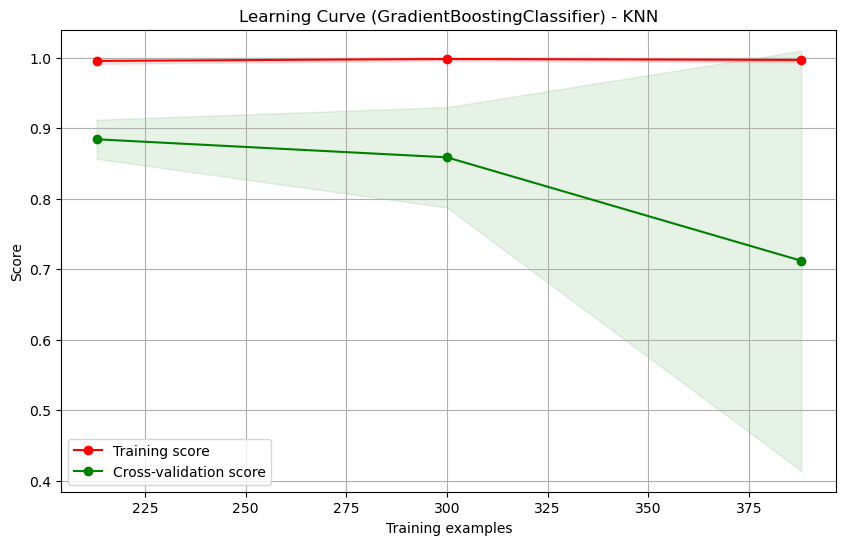

In [1331]:
# Initialize the model
model = GradientBoostingClassifier(n_estimators=150, min_samples_split=13, min_samples_leaf= 8, max_depth=7, learning_rate=0.01, random_state=42)

# Plot the learning curve for your model
plot_learning_curve(model, "Learning Curve (GradientBoostingClassifier) - KNN", X_train_knn, y_train_knn, cv=10)


### Median Fill

In [1332]:
#Initialize the model {'min_samples_split': 8, 'min_samples_leaf': 14, 'max_features': 'sqrt', 'max_depth': 17, 'class_weight': 'balanced'}
model = GradientBoostingClassifier(n_estimators=150, min_samples_split=13, min_samples_leaf= 8, max_depth=7, learning_rate=0.01, random_state=42)

# fit the model
model.fit(X_train_median, y_train_median)

# predict the response
y_pred_mean = model.predict(X_test_median)
y_pred_train = model.predict(X_train_median)

#build classification report for train
print("Training Report:", classification_report(y_train_median, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_median, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_median, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_test_median, y_pred_mean))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_train_median, y_pred_train))

# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_median, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_median, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       1.00      0.99      1.00       382
           1       0.96      0.98      0.97        50

    accuracy                           0.99       432
   macro avg       0.98      0.99      0.98       432
weighted avg       0.99      0.99      0.99       432

Testing Report:               precision    recall  f1-score   support

           0       1.00      0.99      1.00       130
           1       0.93      1.00      0.97        14

    accuracy                           0.99       144
   macro avg       0.97      1.00      0.98       144
weighted avg       0.99      0.99      0.99       144

Confusion Matrix: [[129   1]
 [  0  14]]
Training accuracy Score:  0.9930555555555556
Testing accuracy Score:  0.9930555555555556
Training ROC AUC Score 0.9873821989528797
Testing ROC AUC Score 0.9961538461538462


In [1333]:
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_median.columns), reverse=True):
    print(name, importance)

Feature importances:
Full Time Workers  - median_annual 0.48626767133897103
humidity 0.0833959537474365
start_number_of_docks 0.03615623999488645
Unemployment rate - aged 16+ 0.032050335561282735
feelslike 0.029953822782859206
% with NVQ2 only - aged 16-64 0.029130298565072044
duration_minutes 0.02462077684787507
temp 0.019704463126772216
% of all 16+ who are aged 25-34 0.012232707373213907
% of all 16+ who are aged 16-19 0.011466938939226594
Income - Proportion  of LSOAs in most deprived 10% nationally  0.00926496418565849
cloudcover 0.009108756678064428
start_number_standard_bikes 0.00902639059820807
Part Time Workers - mean_hourly 0.007914012141482334
start_number_ebikes 0.00791189194037189
IDAOPI - Average score  0.007643302418909555
% of all 16+ who are aged 50-64 0.007369542161653682
Part Time Workers  - median_hourly 0.006331258876635683
% with NVQ4+ - aged 16-64 0.005876229215883175
Living Environment - Average score  0.005857068866312533
Part Time Workers  - median_weekly 0.00

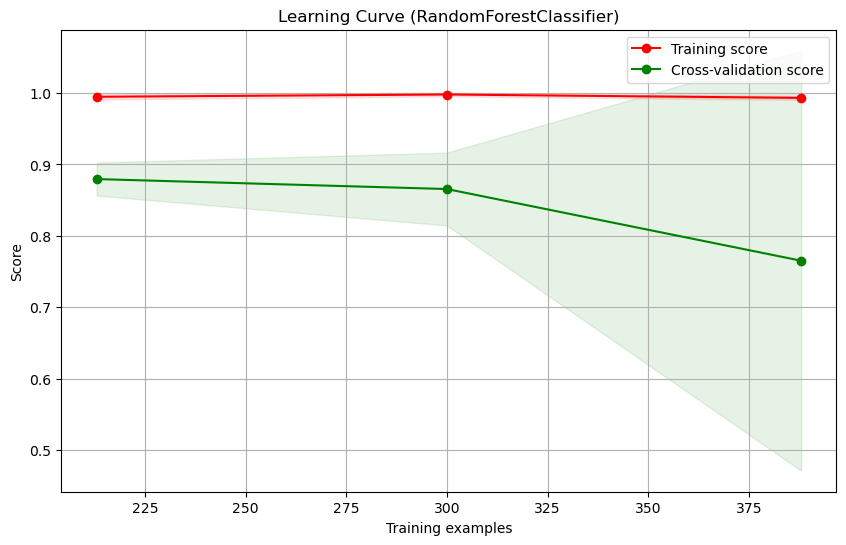

In [1334]:
# Initialize the model
model = GradientBoostingClassifier(n_estimators=150, min_samples_split=13, min_samples_leaf= 8, max_depth=7, learning_rate=0.01, random_state=42)

# Plot the learning curve for your model
plot_learning_curve(model, "Learning Curve (GradientBoostingClassifier) - Median", X_train_median, y_train_median, cv=10)


# Final Models For classification without boroughs

In [1055]:
# Selecting data for the KNN imputation approach
X_train_knn = merged_dataset_imputed[merged_dataset_imputed['start_year'].isin([2016, 2017, 2018])]
X_test_knn = merged_dataset_imputed[merged_dataset_imputed['start_year'].isin([2019])]

# Printing the shapes of the datasets after mean imputation and KNN imputation
print("X_train_knn shape:", X_train_knn.shape)
print("X_test_knn shape:", X_test_knn.shape)

X_train_knn shape: (432, 162)
X_test_knn shape: (144, 162)


### K-Means Clustering

In [1056]:
# For KNN imputation
X_train_knn_cluster = X_train_knn[['pickups'] ]


In [1057]:
# For KNN imputation
X_test_knn_cluster = X_test_knn[['pickups'] ]


### Add labels

In [1058]:
# Initialize K-means with k=2
kmeans = KMeans(n_clusters=2, random_state=0, n_init=10)

# Create a copy of the DataFrame and add cluster labels
X_train_knn = X_train_knn.copy()
X_train_knn['cluster_labels'] = kmeans.fit_predict(X_train_knn_cluster)


In [1059]:
# Fit the K-means model to the test data
X_test_knn = X_test_knn.copy()
X_test_knn['cluster_labels'] = kmeans.fit_predict(X_test_knn_cluster)


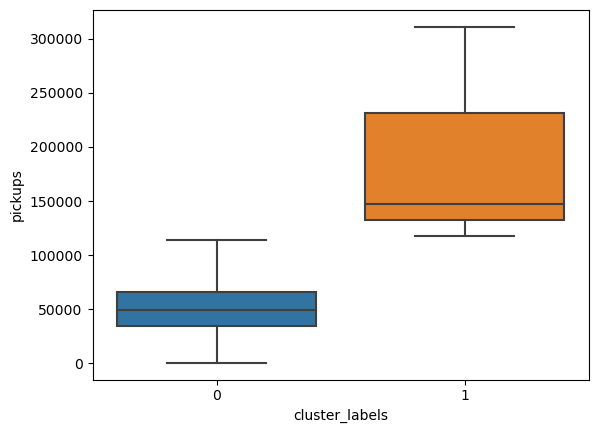

In [1060]:
# plot box plot for pickups by cluster
sns.boxplot(x='cluster_labels', y='pickups', data=X_train_knn)
plt.show()

### Split Data set

In [1061]:
# Filter columns that start with 'borough_code_' in the X_train_knn DataFrame
borough_columns = list(filter(lambda x: x.startswith('borough_code_'), X_train_knn.columns))


In [1062]:
# Separate target variable and features for training data
y_train_knn = X_train_knn['cluster_labels']
X_train_knn = X_train_knn.drop(['cluster_labels', 'pickups'], axis=1)

# Separate target variable and features for test data
y_test_knn = X_test_knn['cluster_labels']
X_test_knn = X_test_knn.drop(['cluster_labels', 'pickups'], axis=1)

# Print the shape of the resulting datasets
print("Training data shape:", X_train_knn.shape, y_train_knn.shape)
print("Test data shape:", X_test_knn.shape, y_test_knn.shape)


(432, 161) (432,)
(144, 161) (144,)


In [1063]:
# Remove leading/trailing whitespace from column names in X_train_knn DataFrame
X_train_knn.columns = X_train_knn.columns.str.strip()

# Remove leading/trailing whitespace from column names in X_test_knn DataFrame
X_test_knn.columns = X_test_knn.columns.str.strip()


### Filter columns

In [1265]:
# Select specific columns from X_train_knn to create X_train_final
X_train_final = X_train_knn[['start_year','start_month','dew',
'uvindex',
'Male Full Time Workers - mean_annual',
'% with NVQ2 only - aged 16-64',
'% of all people aged 16+ who are female',
'start_number_ebikes',
'% of all 16+ who are aged 25-34',
'% of all 16+ who are aged 16-19',
'Unemployment rate - aged 16+',
'IMD - Rank of average score',
'Income - Rank of proportion of LSOAs in most deprived 10% nationally',
'IDACI - Rank of proportion of LSOAs in most deprived 10% nationally',
'Female Part Time Workers - mean_hourly',
'% in employment who are employees - aged 16+',
'Income - Rank of average score',
'% of all 16+ who are aged 50-64',
'Part Time Workers - mean_hourly',
'Part Time Workers  - median_weekly',
'% in employment who are self employed - aged 16+',
'Part Time Workers  - mean_weekly',
'% of all 16+ who are aged 20-24',
'precip',
'% in employment working part-time - aged 50+',
'Part Time Workers  - median_hourly',
'% in employment working full-time - aged 50+',
'% in employment working part-time - aged 25-49',
'% in employment working full-time - aged 25-49',
'average_house_price',
'duration_minutes',
'start_number_standard_bikes',
'start_number_of_bikes',
'start_number_of_empty_docks',
'humidity',
'temp',
'feelslike',
'cloudcover',
'% of all 16+ who are aged 65+',
'Full Time Workers  - median_annual',
'start_number_of_docks',
'% in employment working part-time - aged 50+',
'Full Time Workers - mean_annual',
'% of all people aged 16+ who are male']]

In [1266]:
# Select specific columns from X_test_knn to create X_test_final
X_test_final = X_test_knn[['start_year','start_month','dew',
'uvindex',
'Male Full Time Workers - mean_annual',
'% with NVQ2 only - aged 16-64',
'% of all people aged 16+ who are female',
'start_number_ebikes',
'% of all 16+ who are aged 25-34',
'% of all 16+ who are aged 16-19',
'Unemployment rate - aged 16+',
'IMD - Rank of average score',
'Income - Rank of proportion of LSOAs in most deprived 10% nationally',
'IDACI - Rank of proportion of LSOAs in most deprived 10% nationally',
'Female Part Time Workers - mean_hourly',
'% in employment who are employees - aged 16+',
'Income - Rank of average score',
'% of all 16+ who are aged 50-64',
'Part Time Workers - mean_hourly',
'Part Time Workers  - median_weekly',
'% in employment who are self employed - aged 16+',
'Part Time Workers  - mean_weekly',
'% of all 16+ who are aged 20-24',
'precip',
'% in employment working part-time - aged 50+',
'Part Time Workers  - median_hourly',
'% in employment working full-time - aged 50+',
'% in employment working part-time - aged 25-49',
'% in employment working full-time - aged 25-49',
'average_house_price',
'duration_minutes',
'start_number_standard_bikes',
'start_number_of_bikes',
'start_number_of_empty_docks',
'humidity',
'temp',
'feelslike',
'cloudcover',
'% of all 16+ who are aged 65+',
'Full Time Workers  - median_annual',
'start_number_of_docks',
'% in employment working part-time - aged 50+',
'Full Time Workers - mean_annual',
'% of all people aged 16+ who are male']]

### Decision Tree Classifier

In [1375]:
#Initialize the model {'min_samples_split': 8, 'min_samples_leaf': 14, 'max_features': 'sqrt', 'max_depth': 17, 'class_weight': 'balanced'}
model = DecisionTreeClassifier(min_samples_split=19, min_samples_leaf=12, max_depth=18, random_state=42)

# fit the model
model.fit(X_train_final, y_train_knn)

# predict the response
y_pred_mean = model.predict(X_test_final)
y_pred_train = model.predict(X_train_final)

#build classification report for train
print("Training Report:", classification_report(y_train_knn, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_knn, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_knn, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_train_knn, y_pred_train))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_test_knn, y_pred_mean))

# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_knn, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_knn, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       0.98      0.99      0.99       382
           1       0.90      0.88      0.89        50

    accuracy                           0.97       432
   macro avg       0.94      0.93      0.94       432
weighted avg       0.97      0.97      0.97       432

Testing Report:               precision    recall  f1-score   support

           0       1.00      0.97      0.98       130
           1       0.78      1.00      0.88        14

    accuracy                           0.97       144
   macro avg       0.89      0.98      0.93       144
weighted avg       0.98      0.97      0.97       144

Confusion Matrix: [[126   4]
 [  0  14]]
Training accuracy Score:  0.9745370370370371
Testing accuracy Score:  0.9722222222222222
Training ROC AUC Score 0.9334554973821989
Testing ROC AUC Score 0.9846153846153847


#### Tree Plot

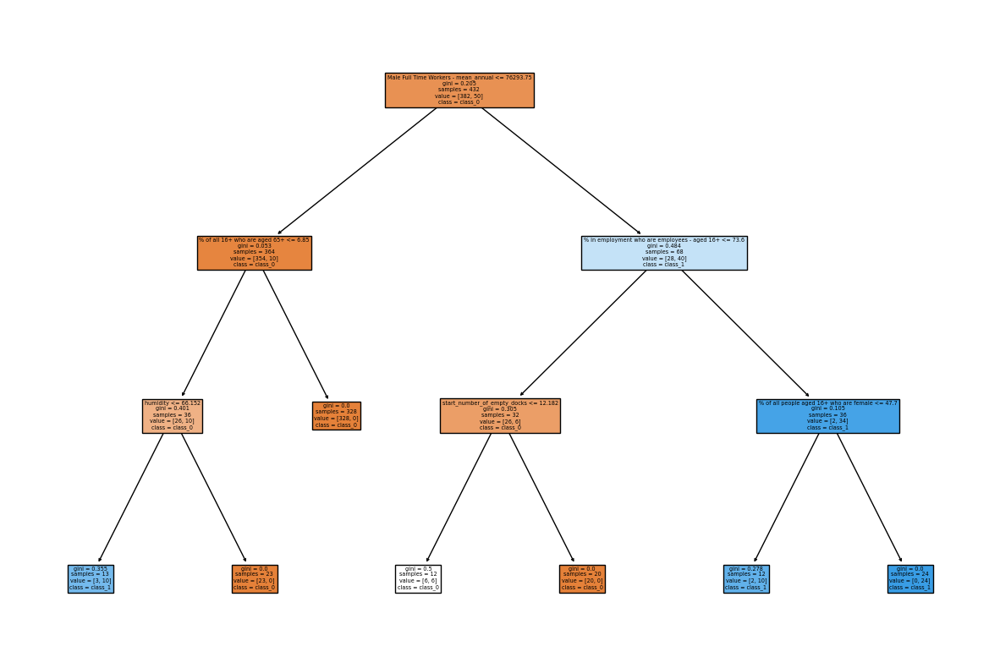

In [1381]:
# Plotting the decision tree
plt.figure(figsize=(15, 10))
plot_tree(model, filled=True,feature_names=X_train_final.columns, class_names=["class_0", "class_1"])
plt.show()

#### Learning Curve

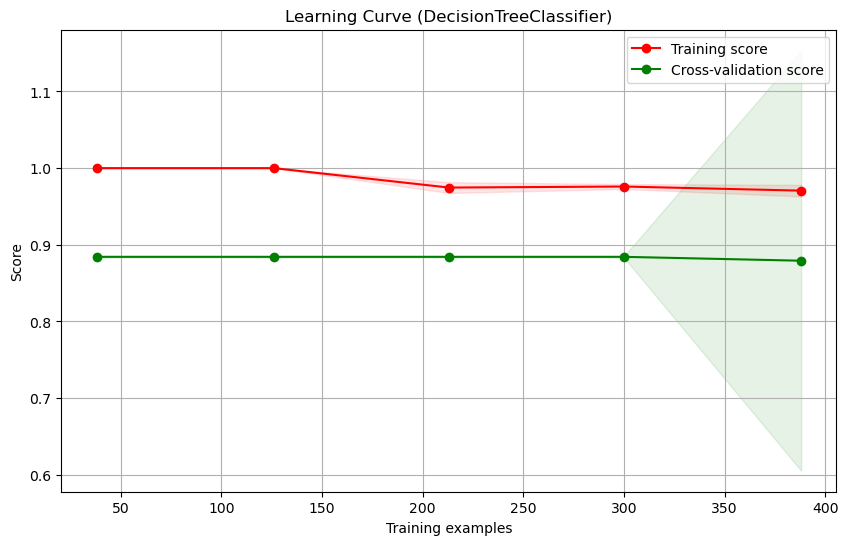

In [1122]:


# Initialize the model
model = DecisionTreeClassifier(min_samples_split=19, min_samples_leaf=12, max_depth=18, random_state=42)

# Plot the learning curve for your model
plot_learning_curve(model, "Learning Curve (DecisionTreeClassifier)", X_train_knn, y_train_knn, cv=10)


#### Feature Selection

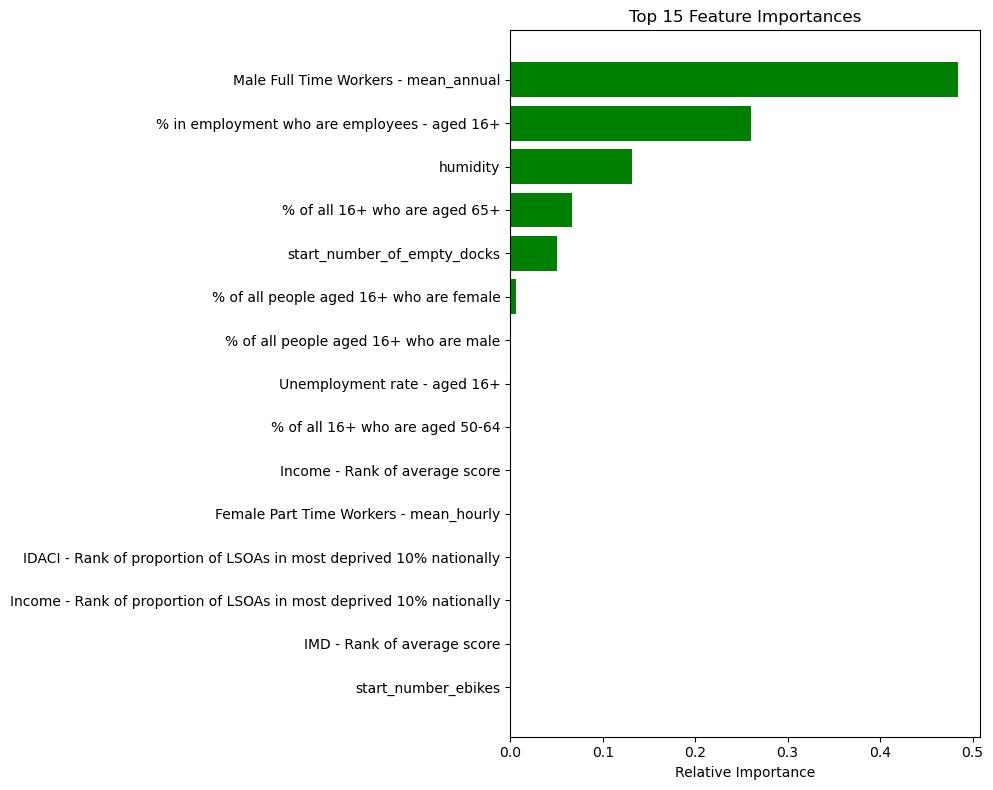

In [1268]:
# Assuming the variable "model" refers to "clf" which is our trained GradientBoostingClassifier
importances = model.feature_importances_

# Get the indices of the features sorted by importance
indices = np.argsort(importances)[-15:]  # Get the top 15

features = X_train_final.columns

# Plot the top 15 feature importances
plt.figure(figsize=(10, 8))
plt.title('Top 15 Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='g', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.tight_layout()
plt.show()

#### SHAP Values

In [1248]:
# Initialize the explainer
explainer = shap.TreeExplainer(model)

# Compute SHAP values for a set of samples (e.g., X_test_final)
shap_values = explainer.shap_values(X_test_final)

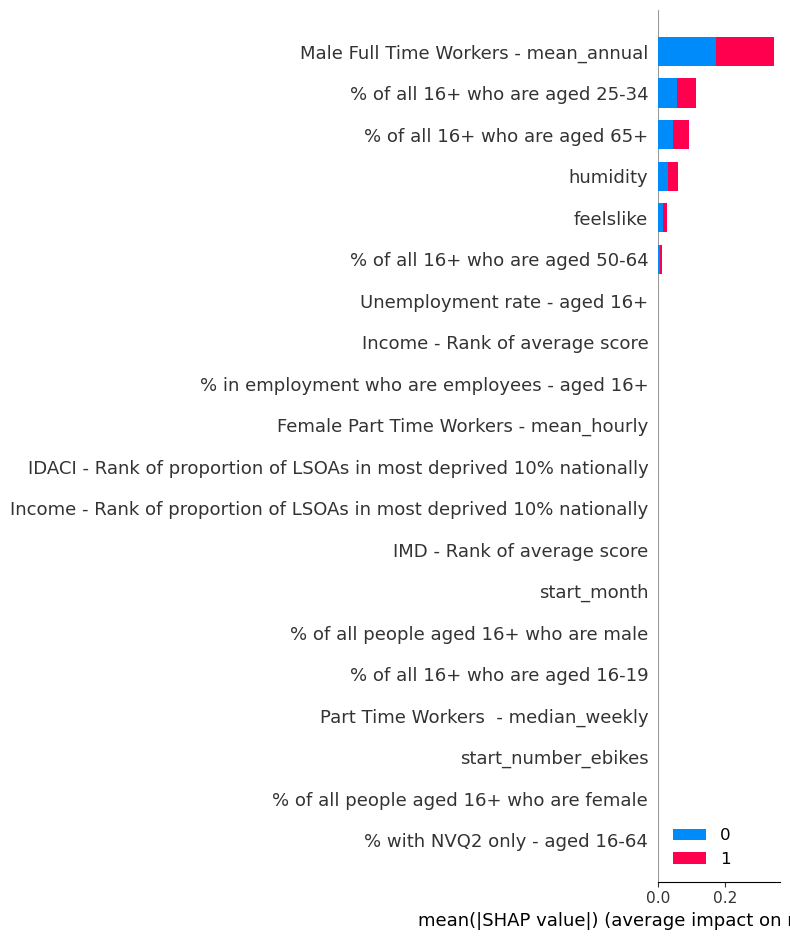

In [1249]:
# Assuming shap_values is already calculated
class_names = [0, 1]  # Replace with actual class labels if needed
shap.summary_plot(shap_values, X_test_final.values, plot_type="bar", class_names=class_names, feature_names=X_test_final.columns)


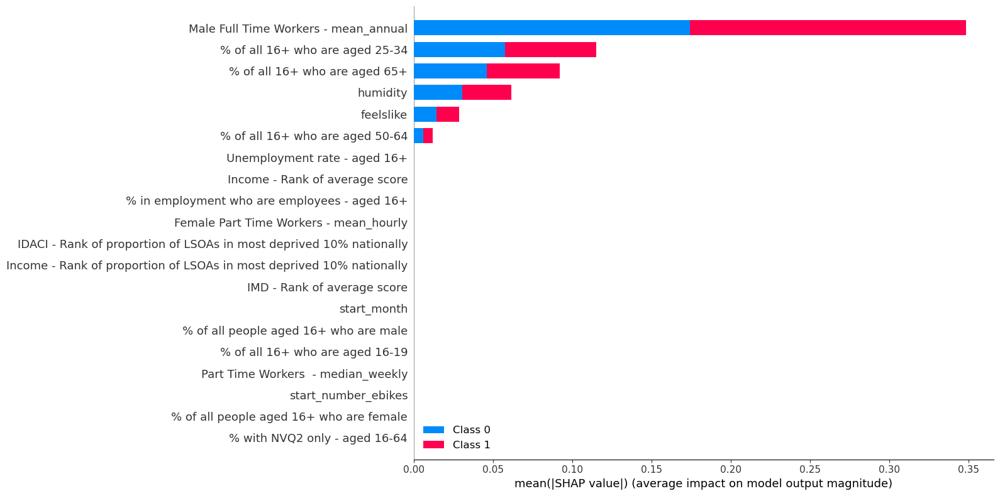

In [1251]:
# Use the SHAP library to create a summary plot of SHAP values
# This plot visualizes the feature importances and their impact on model predictions
# The shap_values parameter contains the SHAP values calculated for the test data
# The X_test_final parameter is the test data for which SHAP values were calculated
# The plot_size parameter specifies the width and height of the resulting plot
shap.summary_plot(shap_values, X_test_final, plot_size=[16, 8])


In [1258]:
# Loop through each class and its corresponding SHAP values
for class_idx, class_shap_values in enumerate(shap_values):
    print(f"Class {class_idx}:")
    
    # Calculate the average SHAP values across instances for this class
    average_shap_values = np.mean(class_shap_values, axis=0)

    # Print the averaged SHAP values along with their corresponding feature names
    for feature_name, value in zip(X_test_final.columns, average_shap_values):
        print(f"{feature_name}: {value}")


Class 0:
start_year: 0.0
start_month: 0.0
dew: 0.0
uvindex: 0.0
Male Full Time Workers - mean_annual: 0.022924257629742872
% with NVQ2 only - aged 16-64: 0.0
% of all people aged 16+ who are female: 0.0
start_number_ebikes: 0.0
% of all 16+ who are aged 25-34: -0.02765190867156192
% of all 16+ who are aged 16-19: 0.0
Unemployment rate - aged 16+: 0.0
start_month: 0.0
IMD - Rank of average score: 0.0
Income - Rank of proportion of LSOAs in most deprived 10% nationally: 0.0
IDACI - Rank of proportion of LSOAs in most deprived 10% nationally: 0.0
Female Part Time Workers - mean_hourly: 0.0
% in employment who are employees - aged 16+: 0.0
Income - Rank of average score: 0.0
% of all 16+ who are aged 50-64: -0.0030141343231394075
Part Time Workers - mean_hourly: 0.0
Part Time Workers  - median_weekly: 0.0
% in employment who are self employed - aged 16+: 0.0
Part Time Workers  - mean_weekly: 0.0
% of all 16+ who are aged 20-24: 0.0
precip: 0.0
% in employment working part-time - aged 50+: 

SHAP Values Interpretation

The data reveals the SHAP values for two classes: Class 0 (moderate demand) and Class 1 (high demand). These values serve as a means to comprehend the impact of each feature on the model's prediction. A SHAP value signifies the extent by which the model's output changes when a feature is observed compared to when it's not.

Features with Zero SHAP Values

A substantial number of features exhibit zero SHAP values for both classes, implying their insignificance in influencing the model's decision for either category. This suggests that these features lack influence in predicting demand levels as classified by the model.

Features with Non-Zero SHAP Values

For features with non-zero SHAP values, the magnitude and direction offer insights:

Male Full Time Workers - mean_annual: In Class 0, an increase in this feature results in a slight rise in the predicted probability of an observation being categorized as 'moderate demand'. Conversely, in Class 1, the impact is negative, reducing the probability of an observation being 'high demand'. Despite differing directions, the magnitude of impact remains consistent but opposite for both classes.

% of all 16+ who are aged 25-34: An increase in this demographic decreases the likelihood of moderate demand for Class 0, whereas it increases the likelihood of high demand for Class 1.

% of all 16+ who are aged 50-64: A positive SHAP value for Class 1 suggests areas with a higher percentage of this age group experience higher demand. In Class 0, the negative value indicates the reverse effect.

humidity: Elevated humidity diminishes the probability of moderate demand while heightening the probability of high demand.

feelslike: This feature influences both classes differently. In Class 0, a higher 'feelslike' temperature elevates the probability of moderate demand, but in Class 1, it reduces the likelihood of high demand.

% of all 16+ who are aged 65+: The feature's impact is minor, evidenced by its very small SHAP values for both classes.

Key Takeaways

Most features exhibit little influence in predicting either moderate or high demand, given their zero SHAP values.

A handful of significant features, such as age demographics (% of all 16+ who are aged 25-34 and % of all 16+ who are aged 50-64), humidity, and feelslike temperature, impact predictions, with effects varying across demand classes.

Some features exhibit opposite influence directions between classes. For instance, a feature that heightens the probability of 'moderate demand' in Class 0 might decrease it in Class 1.

Implications

These insights can prove valuable to stakeholders aiming to predict and address demand. Marketing strategies or service offerings can be tailored based on age demographics or prevailing weather conditions in specific areas.

### Random Forest Classifier

In [1278]:
#Initialize the model {'min_samples_split': 8, 'min_samples_leaf': 14, 'max_features': 'sqrt', 'max_depth': 17, 'class_weight': 'balanced'}
model = RandomForestClassifier(n_estimators=150, min_samples_split=8, min_samples_leaf= 3, max_depth=14,random_state=42)

# fit the model
model.fit(X_train_final, y_train_knn)

# predict the response
y_pred_mean = model.predict(X_test_final)
y_pred_train = model.predict(X_train_final)

#build classification report for train
print("Training Report:", classification_report(y_train_knn, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_knn, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_knn, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_train_knn, y_pred_train))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_test_knn, y_pred_mean))

# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_knn, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_knn, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       0.99      0.99      0.99       382
           1       0.96      0.96      0.96        50

    accuracy                           0.99       432
   macro avg       0.98      0.98      0.98       432
weighted avg       0.99      0.99      0.99       432

Testing Report:               precision    recall  f1-score   support

           0       0.98      1.00      0.99       130
           1       1.00      0.86      0.92        14

    accuracy                           0.99       144
   macro avg       0.99      0.93      0.96       144
weighted avg       0.99      0.99      0.99       144

Confusion Matrix: [[130   0]
 [  2  12]]
Training accuracy Score:  0.9907407407407407
Testing accuracy Score:  0.9861111111111112
Training ROC AUC Score 0.9773821989528796
Testing ROC AUC Score 0.9285714285714286


#### Learning Curve

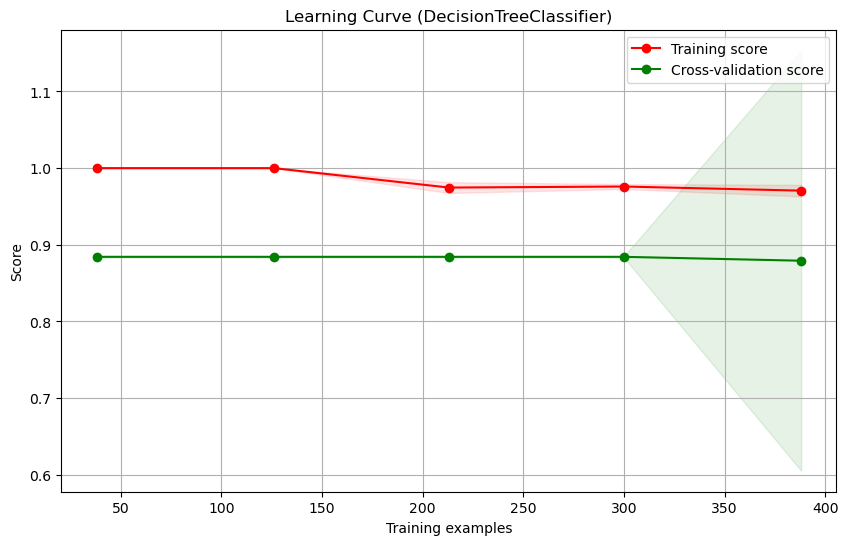

In [1112]:
# Initialize the model
model = RandomForestClassifier(n_estimators=150, min_samples_split=8, min_samples_leaf= 3, max_depth=14,random_state=42)

# Plot the learning curve for your model
plot_learning_curve(model, "Learning Curve (RandomForestClassifier)", X_train_knn, y_train_knn, cv=10)


#### Feature Importance

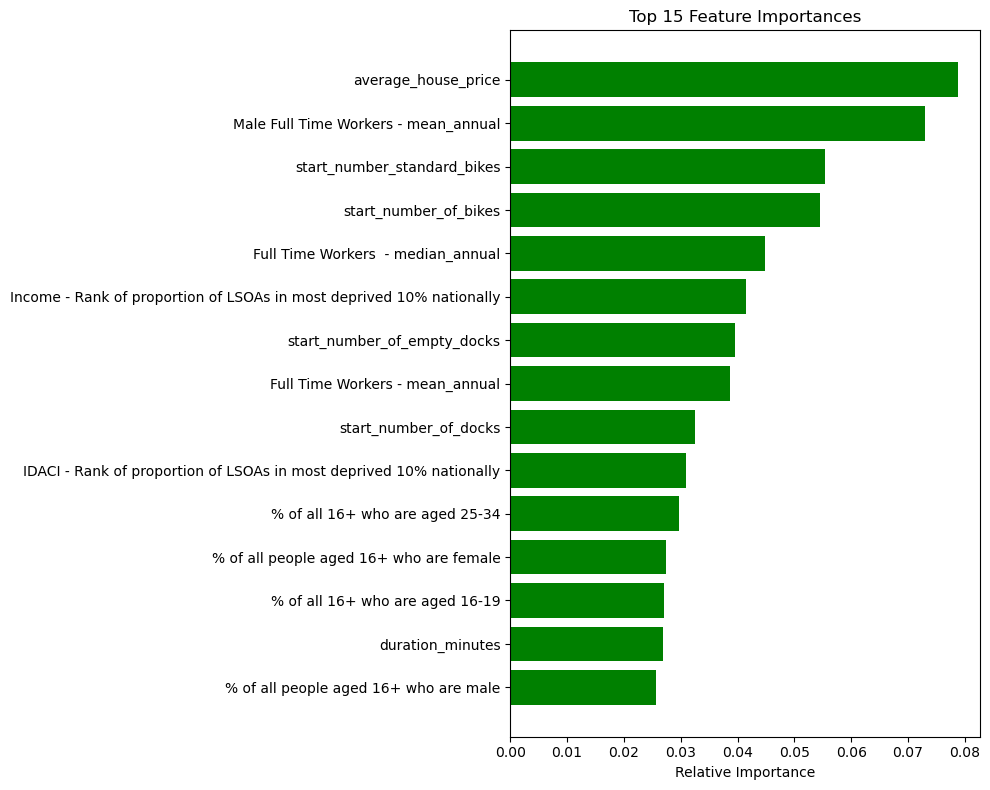

In [1239]:
# Assuming the variable "model" refers to "clf" which is our trained GradientBoostingClassifier
importances = model.feature_importances_

# Get the indices of the features sorted by importance
indices = np.argsort(importances)[-15:]  # Get the top 15

features = X_train_final.columns

# Plot the top 15 feature importances
plt.figure(figsize=(10, 8))
plt.title('Top 15 Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='g', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.tight_layout()
plt.show()

#### SHAP Values

In [1279]:
# Initialize the explainer
explainer = shap.TreeExplainer(model)

# Compute SHAP values for a set of samples (e.g., X_test_final)
shap_values = explainer.shap_values(X_test_final)

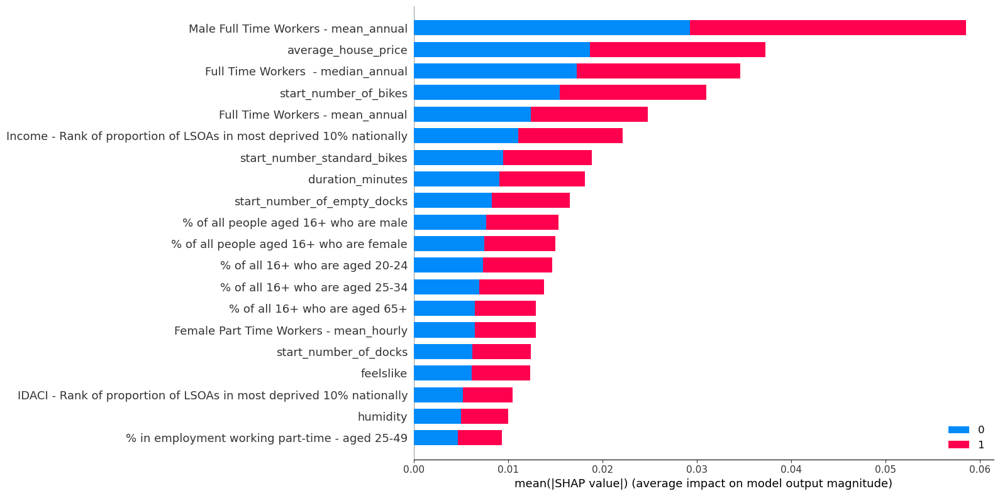

In [1280]:
class_names = [0, 1]

# Generate SHAP summary plot with bar visualization
shap.summary_plot(shap_values, X_test_final.values, plot_type="bar", class_names=class_names, feature_names=X_test_final.columns, plot_size=(16, 8))

# Explanation
plt.title("Feature Importance for Demand Classification")
plt.xlabel("SHAP Value")
plt.ylabel("Features")
plt.show()


In [1263]:
# Loop through each class and its corresponding SHAP values
for class_idx, class_shap_values in enumerate(shap_values):
    print(f"Class {class_idx}:")
    
    # Calculate the average SHAP values across instances for this class
    average_shap_values = np.mean(class_shap_values, axis=0)

    # Print the averaged SHAP values along with feature names
    for feature_name, value in zip(X_test_final.columns, average_shap_values):
        print(f"{feature_name}: {value}")


Class 0:
start_year: -0.000880433786518323
start_month: -7.046965038805062e-05
dew: 0.0007162915234684382
uvindex: 0.0012629747704296975
Male Full Time Workers - mean_annual: 0.000854014102119957
% with NVQ2 only - aged 16-64: 0.0010388540696036378
% of all people aged 16+ who are female: 8.379649951870496e-05
start_number_ebikes: -0.00044650230078579323
% of all 16+ who are aged 25-34: 0.0014974733383054941
% of all 16+ who are aged 16-19: -0.00033781986940102453
Unemployment rate - aged 16+: -1.91491069239034e-06
start_month: -0.00012353287457552697
IMD - Rank of average score: -0.000706390180094402
Income - Rank of proportion of LSOAs in most deprived 10% nationally: -0.0007122827565209109
IDACI - Rank of proportion of LSOAs in most deprived 10% nationally: -0.0015427100907803798
Female Part Time Workers - mean_hourly: -0.0008668472854291339
% in employment who are employees - aged 16+: 0.00036393445341612886
Income - Rank of average score: -0.000651231917894165
% of all 16+ who are

### Gradient Boost classifier

In [1382]:
#Initialize the model n_estimators': 50, 'min_samples_split': 13, 'min_samples_leaf': 8, 'max_depth': 7, 'learning_rate': 0.01
model = GradientBoostingClassifier(n_estimators=150, min_samples_split=13, min_samples_leaf= 8, max_depth=7, learning_rate=0.01,random_state=42)

# fit the model
model.fit(X_train_final, y_train_knn)

# predict the response
y_pred_mean = model.predict(X_test_final)
y_pred_train = model.predict(X_train_final)

#build classification report for train
print("Training Report:", classification_report(y_train_knn, y_pred_train))

# build classification report
print("Testing Report:", classification_report(y_test_knn, y_pred_mean))

# build confusion matrix
print("Confusion Matrix:",confusion_matrix(y_test_knn, y_pred_mean))

# build accuracy score
print("Training accuracy Score: ",accuracy_score(y_train_knn, y_pred_train))
#build accuracy score for test
print("Testing accuracy Score: ",accuracy_score(y_test_knn, y_pred_mean))

# build roc_auc_score
print("Training ROC AUC Score", roc_auc_score(y_train_knn, y_pred_train))
#   build roc_auc_score for test
print("Testing ROC AUC Score", roc_auc_score(y_test_knn, y_pred_mean))


Training Report:               precision    recall  f1-score   support

           0       1.00      0.99      1.00       382
           1       0.96      1.00      0.98        50

    accuracy                           1.00       432
   macro avg       0.98      1.00      0.99       432
weighted avg       1.00      1.00      1.00       432

Testing Report:               precision    recall  f1-score   support

           0       1.00      0.99      1.00       130
           1       0.93      1.00      0.97        14

    accuracy                           0.99       144
   macro avg       0.97      1.00      0.98       144
weighted avg       0.99      0.99      0.99       144

Confusion Matrix: [[129   1]
 [  0  14]]
Training accuracy Score:  0.9953703703703703
Testing accuracy Score:  0.9930555555555556
Training ROC AUC Score 0.9973821989528796
Testing ROC AUC Score 0.9961538461538462


In [1345]:
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_final.columns), reverse=True):
    print(name, importance)

Feature importances:
Male Full Time Workers - mean_annual 0.45544003606028205
humidity 0.09386820519947645
temp 0.04356962842118823
% of all 16+ who are aged 65+ 0.03597015142447901
Income - Rank of average score 0.03178503636318957
IDACI - Rank of proportion of LSOAs in most deprived 10% nationally 0.03085156189843262
start_number_of_empty_docks 0.03036235307874892
feelslike 0.02911255889857122
% with NVQ2 only - aged 16-64 0.025300268224688848
Income - Rank of proportion of LSOAs in most deprived 10% nationally 0.02102438119900853
% in employment working part-time - aged 50+ 0.016700686362704865
% of all 16+ who are aged 16-19 0.01649070056281394
average_house_price 0.015483693095558446
Unemployment rate - aged 16+ 0.01500665283707679
% in employment working part-time - aged 50+ 0.015004470885510959
% in employment who are self employed - aged 16+ 0.014791473657422219
duration_minutes 0.014481124970324314
% in employment who are employees - aged 16+ 0.01176037738583584
IMD - Rank of 

#### Learning Curve

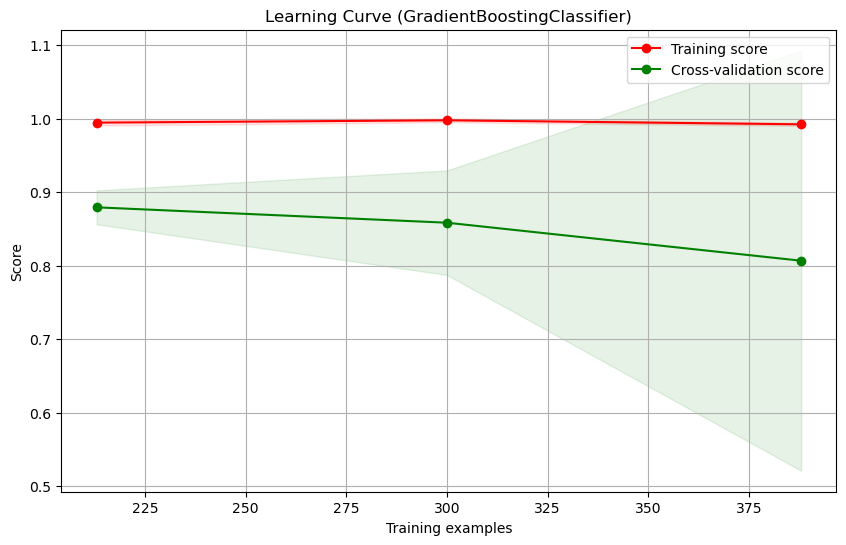

In [1007]:

# Initialize the model
model = GradientBoostingClassifier(n_estimators=150, min_samples_split=13, min_samples_leaf= 8, max_depth=7, learning_rate=0.01, random_state=42)

# Plot the learning curve for your model
plot_learning_curve(model, "Learning Curve (GradientBoostingClassifier) - KNN ", X_train_final, y_train_knn, cv=10)


#### Feature Importance

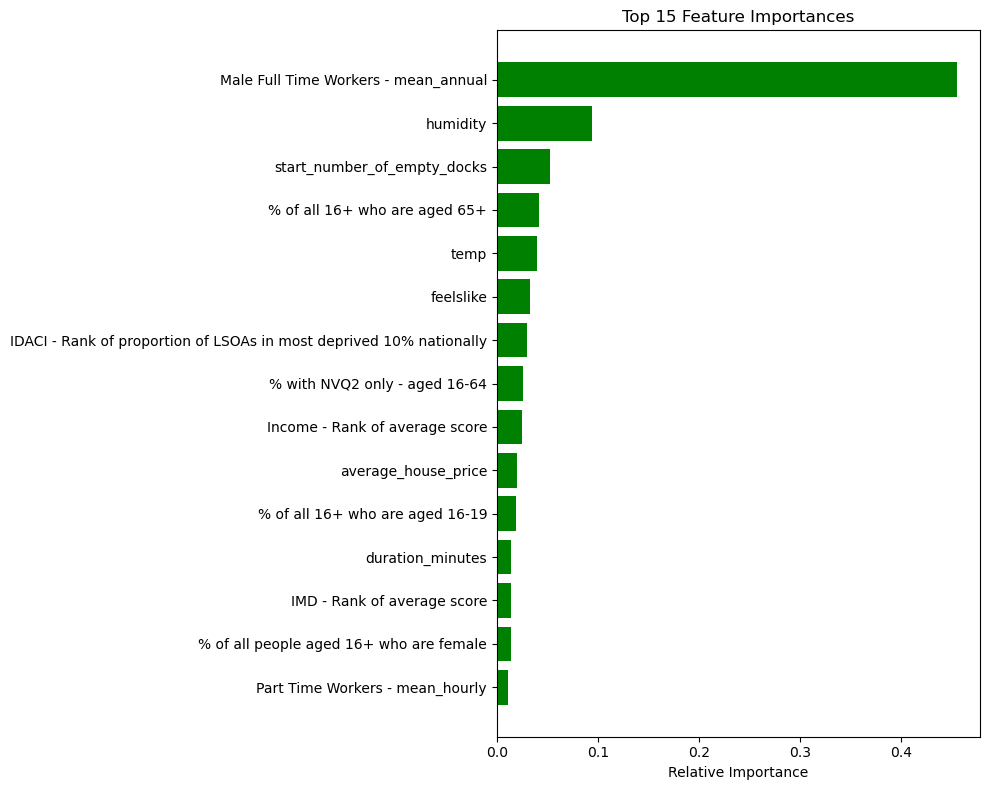

In [1103]:
# Assuming the variable "model" refers to "clf" which is our trained GradientBoostingClassifier
importances = model.feature_importances_

# Get the indices of the features sorted by importance
indices = np.argsort(importances)[-15:]  # Get the top 15

features = X_train_final.columns

# Plot the top 15 feature importances
plt.figure(figsize=(10, 8))
plt.title('Top 15 Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='g', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.tight_layout()
plt.show()

#### SHAP Values

In [1383]:
# Initialize the explainer
explainer = shap.TreeExplainer(model)

# Compute SHAP values for a set of samples (e.g., X_test_final)
shap_values = explainer.shap_values(X_test_final)

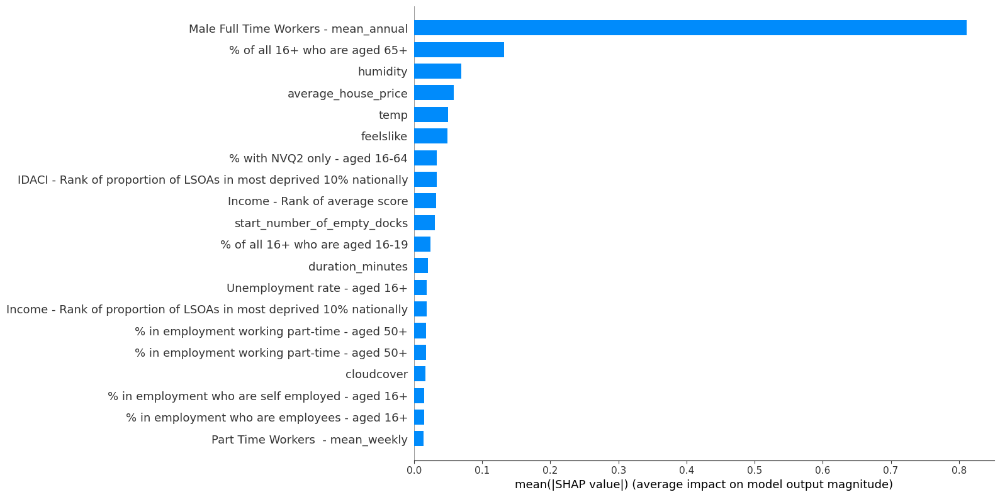

In [1384]:
class_names = [0, 1]
shap.summary_plot(
    shap_values,                   # SHAP values for each instance and class
    X_test_final.values,           # Feature values of the test set
    plot_type="bar",               # Plot type: "bar" for a bar plot
    class_names=class_names,       # Class names corresponding to the classes in the SHAP values
    feature_names=X_test_final.columns,  # Names of the features
    plot_size=(16, 8)              # Size of the plot
)


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


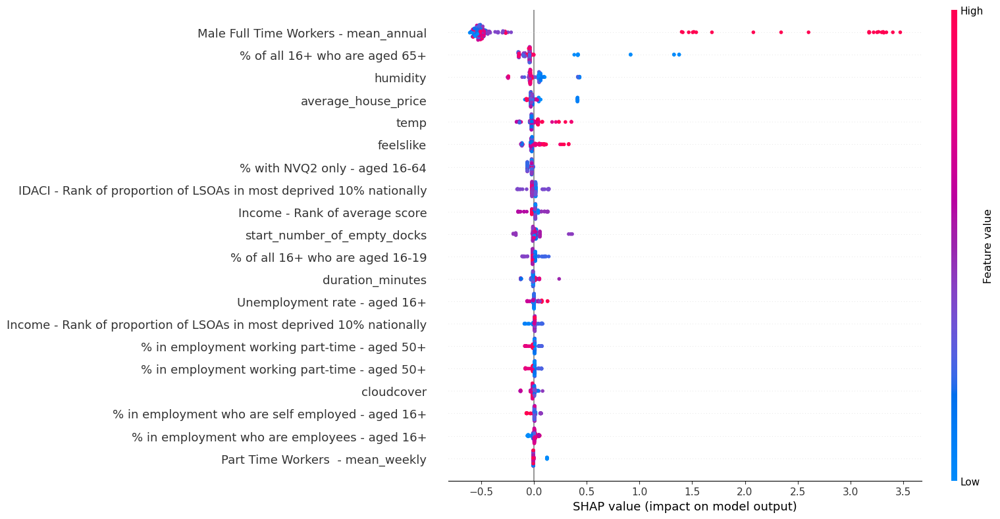

In [1385]:
shap.summary_plot(
    shap_values,          # SHAP values for each instance and class
    X_test_final,         # Feature values of the test set
    plot_size=[16, 8]     # Size of the plot [width, height]
)


In [1275]:
# Average the SHAP values across instances
average_shap_values = np.mean(shap_values, axis=0)

# Print the averaged SHAP values along with feature names
for feature_name, value in zip(X_test_final.columns, average_shap_values):
    print(f"{feature_name}: {value}")


start_year: 0.0
start_month: 0.0013620436256226035
dew: -0.000882980018379728
uvindex: -0.0033331473573705453
Male Full Time Workers - mean_annual: -0.020259620274494513
% with NVQ2 only - aged 16-64: -0.0335019909173043
% of all people aged 16+ who are female: -0.00133662294213882
start_number_ebikes: 0.00023127625418418925
% of all 16+ who are aged 25-34: -0.008995631421400524
% of all 16+ who are aged 16-19: 5.276610213995236e-05
Unemployment rate - aged 16+: 0.008080797733487403
IMD - Rank of average score: -0.0009631567571314661
Income - Rank of proportion of LSOAs in most deprived 10% nationally: 0.006032863022762543
IDACI - Rank of proportion of LSOAs in most deprived 10% nationally: -0.0017083180415243587
Female Part Time Workers - mean_hourly: 0.00031996241930250534
% in employment who are employees - aged 16+: 0.005090057557501087
Income - Rank of average score: 0.00875395572927382
% of all 16+ who are aged 50-64: -0.009696074974135521
Part Time Workers - mean_hourly: 0.00199

The Gradient Boosted Classifier provides a mechanism to determine the influence of each feature in predicting a target class. The values presented here represent the relative importance of each feature for predicting the occurrence of Class 1 ("high demand").

Magnitude of Values:

The magnitude of the value signifies the importance of the feature. A larger absolute value indicates that the feature plays a significant role in the decision-making process, whereas a value close to zero suggests that the feature has little to no importance in predicting Class 1.
Features with the largest absolute values can be considered the most impactful in influencing the model's decision towards predicting "high demand".
Positive vs. Negative Values:

A positive value indicates that an increase in the feature's value pushes the model's prediction towards Class 1 ("high demand").
A negative value suggests that an increase in the feature's value moves the model's prediction away from Class 1, or towards the opposite class.
For instance, if average_house_price has a positive value, it means that higher house prices increase the likelihood of predicting "high demand". Conversely, a negative value for a feature like dew means that as dew increases, the likelihood of "high demand" decreases.
Key Takeaways:

The features with the highest absolute importance values can provide stakeholders with actionable insights. For instance, if economic factors like "Male Full Time Workers - mean_annual" have high importance, then economic trends might be a key driver of demand.
Weather conditions like dew, uvindex, humidity, and cloudcover also seem to influence the demand, suggesting that environmental factors play a role in predicting high demand.

# Sixth Round: Regression Model (2016-2019)

In [1392]:
# Selecting data for the mean imputation approach
X_train_mean = merged_dataset_mean[merged_dataset_mean['start_year'].isin([2016, 2017, 2018])]
X_test_mean = merged_dataset_mean[merged_dataset_mean['start_year'].isin([2019])]

# Selecting data for the KNN imputation approach
X_train_knn = merged_dataset_imputed[merged_dataset_imputed['start_year'].isin([2016, 2017, 2018])]
X_test_knn = merged_dataset_imputed[merged_dataset_imputed['start_year'].isin([2019])]

# Selecting data for median imputation approach
X_train_median = merged_dataset_median[merged_dataset_median['start_year'].isin([2016, 2017, 2018])]
X_test_median = merged_dataset_median[merged_dataset_median['start_year'].isin([2019])]

# Printing the shapes of the datasets after mean imputation and KNN imputation
print("X_train_mean shape:", X_train_mean.shape)
print("X_test_mean shape:", X_test_mean.shape)
print("X_train_knn shape:", X_train_knn.shape)
print("X_test_knn shape:", X_test_knn.shape)
print("X_train_median shape:", X_train_median.shape)
print("X_test_median shape:", X_test_median.shape)

X_train_mean shape: (432, 162)
X_test_mean shape: (144, 162)
X_train_knn shape: (432, 162)
X_test_knn shape: (144, 162)
X_train_median shape: (432, 162)
X_test_median shape: (144, 162)


### Split the data into training and testing sets

In [1393]:
# Splitting data into features and target variables for different imputation strategies

# For KNN imputation
y_train_imputed = X_train_knn['pickups']
X_train_imputed = X_train_knn.drop(['pickups'], axis=1)
y_test_imputed = X_test_knn['pickups']
X_test_imputed = X_test_knn.drop(['pickups'], axis=1)

# For mean imputation
y_train_mean = X_train_mean['pickups']
X_train_mean = X_train_mean.drop(['pickups'], axis=1)
y_test_mean = X_test_mean['pickups']
X_test_mean = X_test_mean.drop(['pickups'], axis=1)

# For median imputation
y_train_median = X_train_median['pickups']
X_train_median = X_train_median.drop(['pickups'], axis=1)
y_test_median = X_test_median['pickups']
X_test_median = X_test_median.drop(['pickups'], axis=1)


## Decision Tree Regressor

### KNN Fill

In [918]:
# Initialize the Decision Tree Regressor model
model = DecisionTreeRegressor(random_state=42)

# Define the parameter distributions to search
param_dist = {
    'max_depth': [3, 5, 7, 8, 9, 10, 11, 12],
    'min_samples_split': [3, 4, 5, 6, 7, 10, 11, 12, 13],
    'min_samples_leaf': [3, 4, 5, 6, 7, 8, 10, 11, 12]
}

# Initialize the random search
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist, n_iter=100, cv=10, verbose=1, random_state=42)

# Execute the random search
random_search.fit(X_train_imputed, y_train_imputed)

# Print the best parameters and best score
print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

# Make predictions on the test set
y3_pred = random_search.predict(X_test_imputed)

# Make predictions on the training set
y3_pred_train = random_search.predict(X_train_imputed)

# Print the R-squared scores
print("R-squared score (train):", r2_score(y_train_imputed, y3_pred_train))
print("R-squared score (test):", r2_score(y_test_imputed, y3_pred))

# Compute the Root Mean Squared Error (RMSE) on the training set
rmse_train = np.sqrt(mean_squared_error(y_train_imputed, y3_pred_train))

# Compute the RMSE on the test set
rmse_test = np.sqrt(mean_squared_error(y_test_imputed, y3_pred))
print('Root Mean Squared Error (train):', rmse_train)
print('Root Mean Squared Error (test):', rmse_test)

# Print the summary of the best estimator from random search
print("Best estimator:", random_search.best_estimator_)


Fitting 10 folds for each of 100 candidates, totalling 1000 fits


{'min_samples_split': 3, 'min_samples_leaf': 4, 'max_depth': 5}
-11.512070160123558
0.9518355842889141
0.9416568506576146
Mean Squared Error: 11323.063965842526 12213.404533359706
DecisionTreeRegressor(max_depth=5, min_samples_leaf=4, min_samples_split=3,
                      random_state=42)


In [919]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(random_search.best_estimator_.feature_importances_, X_train_imputed.columns), reverse=True):
    print(name, importance)


Feature importances:
borough_code_E09000033 0.6045088294930475
start_number_of_docks 0.13974754331611905
start_number_standard_bikes 0.12453218512996723
duration_minutes 0.05944818036542901
temp 0.021635799266016626
humidity 0.013328110060767302
cloudcover 0.006498413470539014
average_house_price 0.0059477093442699865
start_number_of_bikes 0.005879252471104422
dew 0.0051674379393754485
% with NVQ1 only - aged 16-64 0.004536504666814102
precip 0.004207653861449353
Living Environment - Rank of average rank  0.003239264397429789
holiday 0.0009307979666874721
feelslike 0.000392318250983526
windspeed 0.0
visibility 0.0
uvindex 0.0
start_year 0.0
start_number_of_empty_docks 0.0
start_number_ebikes 0.0
start_month 0.0
population_density 0.0
borough_code_E09000032 0.0
borough_code_E09000030 0.0
borough_code_E09000028 0.0
borough_code_E09000025 0.0
borough_code_E09000022 0.0
borough_code_E09000020 0.0
borough_code_E09000019 0.0
borough_code_E09000013 0.0
borough_code_E09000012 0.0
borough_code_

In [922]:
# Initialize the model
model = DecisionTreeRegressor(min_samples_split=3, min_samples_leaf=4, max_depth=5, random_state=42)

# Fit the model
model.fit(X_train_imputed, y_train_imputed)

# Predict the response
y_pred_mean = model.predict(X_test_imputed)
y_pred_train = model.predict(X_train_imputed)

# Print R^2 for training and testing
print("Training R^2:", r2_score(y_train_imputed, y_pred_train))
print("Testing R^2:", r2_score(y_test_imputed, y_pred_mean))

# Print RMS for training and testing
print("Training RMS:", np.sqrt(mean_squared_error(y_train_imputed, y_pred_train)))
print("Testing RMS:", np.sqrt(mean_squared_error(y_test_imputed, y_pred_mean)))


Training R^2: 0.9518355842889141
Testing R^2: 0.9416568506576146
Training RMS: 11323.063965842526
Testing RMS: 12213.404533359706


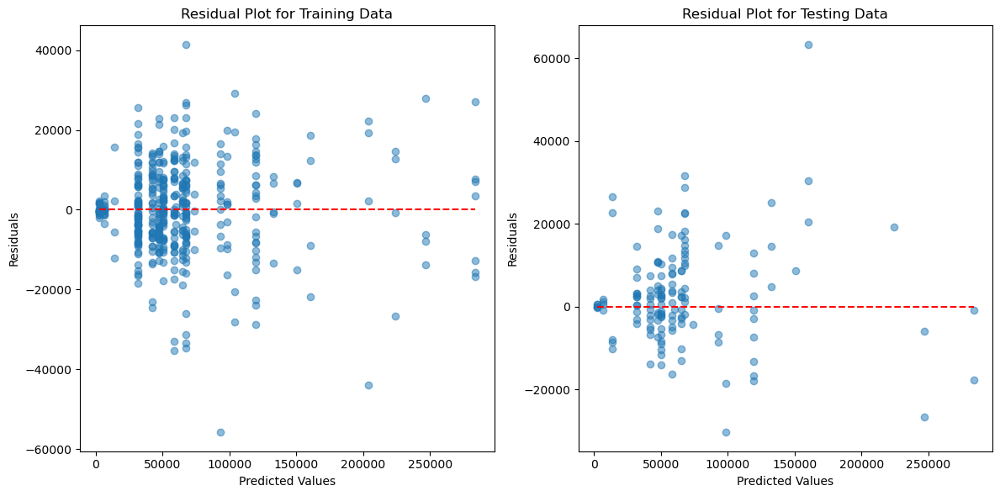

In [924]:
# Calculate residuals for training and testing data
residuals_train = y_train_imputed - y3_pred_train
residuals_test = y_test_imputed - y3_pred

# Plot residuals
plt.figure(figsize=(12, 6))

# Plot the residual plot for training data
plt.subplot(1, 2, 1)
plt.scatter(y3_pred_train, residuals_train, alpha=0.5)
plt.hlines(0, min(y3_pred_train), max(y3_pred_train), colors='r', linestyles='dashed')
plt.title('Residual Plot for Training Data')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

# Plot the residual plot for testing data
plt.subplot(1, 2, 2)
plt.scatter(y3_pred, residuals_test, alpha=0.5)
plt.hlines(0, min(y3_pred), max(y3_pred), colors='r', linestyles='dashed')
plt.title('Residual Plot for Testing Data')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

# Adjust layout for better visualization
plt.tight_layout()
plt.show()


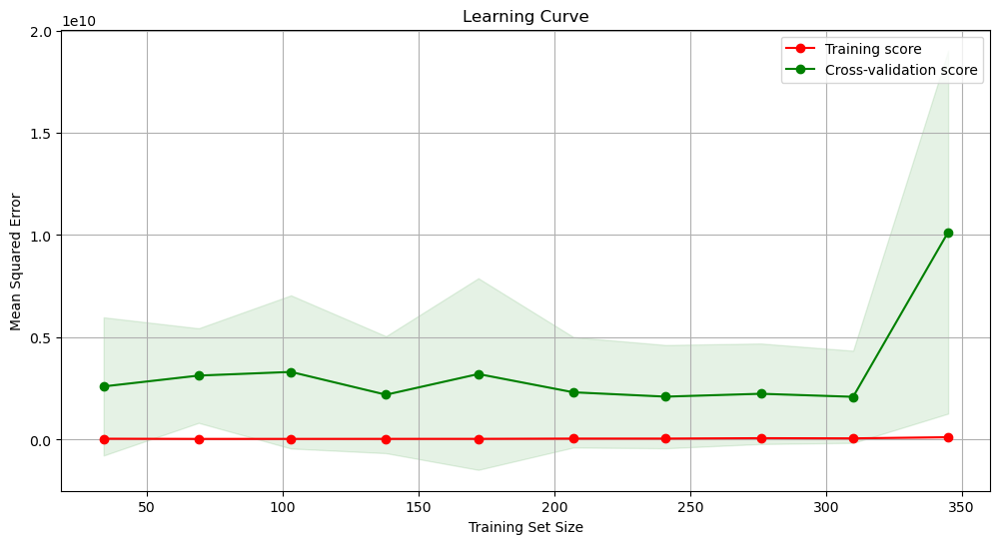

In [926]:
# Define the model
model = DecisionTreeRegressor(min_samples_split=3, min_samples_leaf=4, max_depth=5, random_state=42)

# Use the learning_curve function from sklearn to get training sizes, training scores, and validation scores.
train_sizes, train_scores, validation_scores = learning_curve(
    estimator=model,
    X=X_train_imputed,
    y=y_train_imputed,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5,
    scoring='neg_mean_squared_error'
)

# Calculate the mean and standard deviation of the training and validation scores for each training set size
train_scores_mean = -train_scores.mean(axis=1)  # Convert negative MSE to positive for visualization
train_scores_std = train_scores.std(axis=1)
validation_scores_mean = -validation_scores.mean(axis=1)  # Convert negative MSE to positive for visualization
validation_scores_std = validation_scores.std(axis=1)

# Plot the learning curve
plt.figure(figsize=(12, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, validation_scores_mean - validation_scores_std, validation_scores_mean + validation_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, validation_scores_mean, 'o-', color="g", label="Cross-validation score")
plt.title("Learning Curve")
plt.xlabel("Training Set Size")
plt.ylabel("Mean Squared Error")
plt.legend(loc="best")
plt.grid()
plt.show()


### Random Forest

In [917]:
# Initialize the model
random_forest_model = RandomForestRegressor(random_state=42)

# Define the initial parameters to search
param_distributions = {
    'n_estimators': list(range(5, 201, 5)),  # Increase the range to 200
    'max_depth':  list(range(5, 25)),
    'min_samples_split': list(range(4, 25)),
    'min_samples_leaf': list(range(4, 25)),
}

# Initialize the random search
random_search = RandomizedSearchCV(estimator=random_forest_model, 
                                   param_distributions=param_distributions, 
                                   n_iter=20, 
                                   cv=10, 
                                   scoring='neg_mean_squared_error', 
                                   random_state=42)

# Early stopping configuration
overfitting = True
iteration = 0
max_iterations = 20
best_validation_score = float('inf')
no_improvement_counter = 0
max_no_improvement = 5  # number of iterations with no improvement to trigger early stopping

# Lists to store training and test errors for each iteration
train_errors = []
test_errors = []
best_scores = []

while overfitting and iteration < max_iterations:
    
    print("Iteration:", iteration)

    # Fit the random search
    random_search.fit(X_train_imputed, y_train_imputed)

    # Store the best score of this iteration
    current_validation_score = -random_search.best_score_
    best_scores.append(current_validation_score)
    
    print("Best Score:", -random_search.best_score_)
    print("Best Params:", random_search.best_params_)
    
    if current_validation_score < best_validation_score:
        best_validation_score = current_validation_score
        no_improvement_counter = 0  # reset the counter
    else:
        no_improvement_counter += 1

    # If no improvement in validation score for max_no_improvement iterations, break
    if no_improvement_counter >= max_no_improvement:
        print("Early stopping triggered. No improvement in validation score for", max_no_improvement, "iterations.")
        break
    
    # Make predictions on the training and test sets
    y_pred_train = random_search.predict(X_train_imputed)
    y_pred_test = random_search.predict(X_test_imputed)

    # Compute the RMSE for training and test sets
    train_rmse = np.sqrt(mean_squared_error(y_train_imputed, y_pred_train))
    test_rmse = np.sqrt(mean_squared_error(y_test_imputed, y_pred_test))
    
    # Compute the R2 scores
    train_r2 = r2_score(y_train_imputed, y_pred_train)
    test_r2 = r2_score(y_test_imputed, y_pred_test)
    
    print("RMSE Results for Training set, test set:", train_rmse, test_rmse)
    print("R2 Results for Training set, test set:", train_r2, test_r2)
    
    # Store errors for visualization
    train_errors.append(train_rmse)
    test_errors.append(test_rmse)

    # Check if the difference between the train and test RMSE is below the threshold
    if np.abs(train_rmse - test_rmse) < 0.05:
        overfitting = False
    else:
        # Refine the parameters based on the best ones from the current iteration
        best_params = random_search.best_params_
        param_distributions['max_depth'] = list(range(max(1, best_params['max_depth'] - 1), best_params['max_depth'] + 2))
        param_distributions['min_samples_split'] = list(range(max(2, best_params['min_samples_split'] - 1), best_params['min_samples_split'] + 2))
        param_distributions['min_samples_leaf'] = list(range(max(1, best_params['min_samples_leaf'] - 1), best_params['min_samples_leaf'] + 2))
        param_distributions['n_estimators'] = list(range(max(5, best_params['n_estimators'] - 10), best_params['n_estimators'] + 11, 10))

    # Increase the iteration counter
    iteration += 1

# Print the best parameters found during the search
best_params


Iteration: 0
Best Score:  3538917926.0511003
Best Params: {'n_estimators': 140, 'min_samples_split': 24, 'min_samples_leaf': 24, 'max_depth': 15}
RMSE Results for Training set, test set: 25416.369441831688 22427.800184049964
R2 Results for Training set, test set: 0.7573247957046014 0.8032613256636487
Iteration: 1
Best Score:  3426611065.9533668
Best Params: {'n_estimators': 140, 'min_samples_split': 24, 'min_samples_leaf': 25, 'max_depth': 14}
RMSE Results for Training set, test set: 27366.929526885928 24817.14477068633
R2 Results for Training set, test set: 0.7186476659152807 0.7591093116364858
Iteration: 2
Best Score:  3426550788.9298315
Best Params: {'n_estimators': 150, 'min_samples_split': 24, 'min_samples_leaf': 25, 'max_depth': 15}
RMSE Results for Training set, test set: 27312.88538118129 24751.746501822592
R2 Results for Training set, test set: 0.7197577964970339 0.7603772316052918
Iteration: 3


KeyboardInterrupt: 

In [ ]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(random_search.best_estimator_.feature_importances_, X_train_imputed.columns), reverse=True):
    print(name, importance)


In [958]:

# Initialize the model {'n_estimators': 25, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_depth': 7}
model = RandomForestRegressor(n_estimators=25, min_samples_split=10,min_samples_leaf=5, max_depth=8, random_state=42)

# Fit the model
model.fit(X_train_imputed, y_train_imputed)

# Predict the response
y_pred_mean = model.predict(X_test_imputed)
y_pred_train = model.predict(X_train_imputed)

# Print R^2 for training and testing
print("Training R^2:", r2_score(y_train_imputed, y_pred_train))
print("Testing R^2:", r2_score(y_test_imputed, y_pred_mean))

# Print RMS for training and testing
print("Training RMS:", np.sqrt(mean_squared_error(y_train_imputed, y_pred_train)))
print("Testing RMS:", np.sqrt(mean_squared_error(y_test_imputed, y_pred_mean)))


Training R^2: 0.9646434670946941
Testing R^2: 0.9173962537199014
Training RMS: 9701.42762735086
Testing RMS: 14532.545115396664


In [931]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_imputed.columns), reverse=True):
    print(name, importance)


Feature importances:
borough_code_E09000033 0.6042666747173294
start_number_of_docks 0.07500741790314042
duration_minutes 0.06494998794212438
start_number_of_bikes 0.05064053278274222
start_number_standard_bikes 0.042092393034333625
humidity 0.02397331992588364
start_number_of_empty_docks 0.015384736785623692
feelslike 0.01406407861459868
temp 0.01262782873727062
cloudcover 0.012190432429652377
average_house_price 0.00823148511847504
Unemployment rate - aged 16+ 0.005484744555534154
dew 0.004884695096171824
visibility 0.00431210355392396
Living Environment - Average score  0.003989016853908657
Male Part Time Workers  - median_hourly 0.00391752303006241
Male Full Time Workers - mean_annual 0.0035029715690829437
Living Environment - Rank of average score  0.002609340078225515
start_number_ebikes 0.002313880842892467
IDACI - Rank of proportion of LSOAs in most deprived 10% nationally  0.0022927182581290047
Economic activity rate - aged 16+ 0.0020934956772348545
Living Environment - Rank o

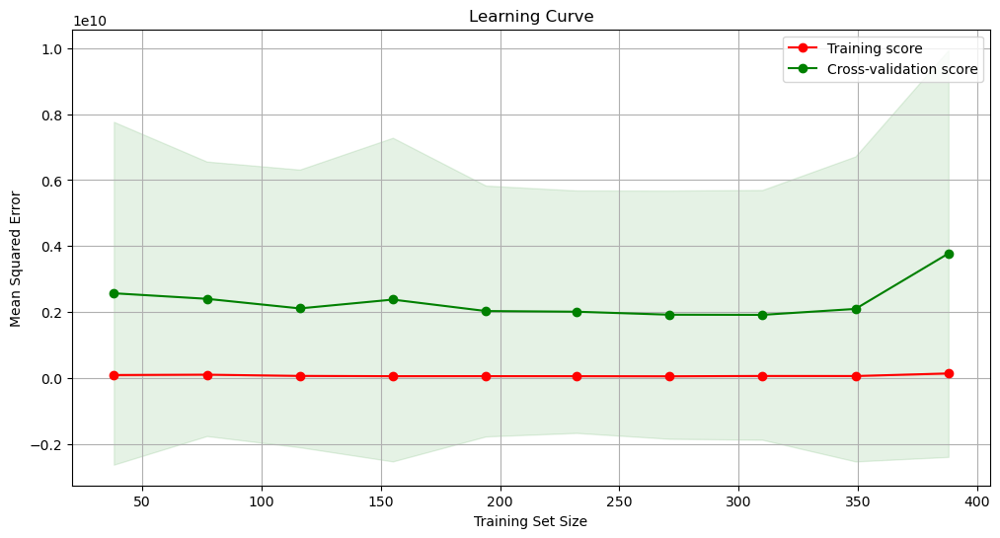

In [933]:
# Define the model
model = RandomForestRegressor(n_estimators=150, min_samples_split=12,min_samples_leaf=8, max_depth=15, random_state=42)

# Use the learning_curve function from sklearn to get training sizes, training scores, and validation scores.
train_sizes, train_scores, validation_scores = learning_curve(
    estimator=model,
    X=X_train_imputed,
    y=y_train_imputed,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=10,
    scoring='neg_mean_squared_error'
)

# Calculate the mean and standard deviation of the training and validation scores for each training set size
train_scores_mean = -train_scores.mean(axis=1)
train_scores_std = train_scores.std(axis=1)
validation_scores_mean = -validation_scores.mean(axis=1)
validation_scores_std = validation_scores.std(axis=1)

# Plot the learning curve
plt.figure(figsize=(12, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, validation_scores_mean - validation_scores_std, validation_scores_mean + validation_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, validation_scores_mean, 'o-', color="g", label="Cross-validation score")
plt.title("Learning Curve")
plt.xlabel("Training Set Size")
plt.ylabel("Mean Squared Error")
plt.legend(loc="best")
plt.grid()
plt.show()


## Models without borough_code

In [1394]:
# Select columns with names that match the regex pattern 'borough_code' from X_train_imputed DataFrame
borough_columns = X_train_imputed.filter(regex='borough_code').columns


In [1395]:
# Remove columns with borough codes from X_train_imputed DataFrame
X_train_imputed.drop(columns=borough_columns, inplace=True)

# Remove columns with borough codes from X_test_imputed DataFrame
X_test_imputed.drop(columns=borough_columns, inplace=True)


### Decision Tree Regressor

##### Mean Fill

In [ ]:
# Initialize the model
model = DecisionTreeRegressor(random_state=42)

# Define the parameters to search using a grid
param_grid = {
    'max_depth': [3, 5, 7, 8, 9, 10, 11, 12],
    'min_samples_split': [3, 4, 5, 6, 7, 10, 11, 12, 13],
    'min_samples_leaf': [3, 4, 5, 6, 7, 8, 10, 11, 12]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, verbose=1)

# Execute the grid search
grid_search.fit(X3_train_mean, y3_train_mean)

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

# Make predictions on the test set
y3_pred = grid_search.predict(X3_test_mean)
y3_pred_train = grid_search.predict(X3_train_mean)

# Print the R2 scores
print("R2 Score (Train):", r2_score(y3_train_mean, y3_pred_train))
print("R2 Score (Test):", r2_score(y3_test_mean, y3_pred))

# Compute the RMSE on the training and test sets
rmse_train = np.sqrt(mean_squared_error(y3_train_mean, y3_pred_train))
rmse_test = np.sqrt(mean_squared_error(y3_test_mean, y3_pred))
print("RMSE (Train):", rmse_train)
print("RMSE (Test):", rmse_test)

# Print summary of the best model from the grid search
print("Best Model:", grid_search.best_estimator_)


Fitting 10 folds for each of 648 candidates, totalling 6480 fits


{'max_depth': 8, 'min_samples_leaf': 3, 'min_samples_split': 3}
0.9192941994545251
0.9887302517387481
0.9019601360077865
Mean Squared Error: 5817.286973300169 10929.241143717454
DecisionTreeRegressor(max_depth=8, min_samples_leaf=3, min_samples_split=3,
                      random_state=42)


In [ ]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X3_train_mean.columns), reverse=True):
    print(name, importance)

Feature importances:
Male Full Time Workers - mean_annual 0.7253997171123255
Unemployment rate - aged 16+ 0.08901348530206994
Education, Skills and Training - Rank of average rank  0.06174839843071343
humidity 0.06045371472217486
temp 0.021993420916190304
% of all 16+ who are aged 50-64 0.017361704517014798
feelslike 0.007025920712517928
Living Environment - Rank of average rank  0.004548089886889485
Living Environment - Average rank  0.0034242632353234975
start_number_of_empty_docks 0.0030883054018363827
start_number_of_bikes 0.0014391528150950186
start_number_of_docks 0.0013470283135044558
precip 0.0007240661434462656
cloudcover 0.0007083457549775199
holiday 0.0006834717983795756
average_house_price 0.000487402232520845
visibility 0.00043368421011842514
windspeed 9.756262272368464e-05
dew 2.226587217797526e-05
uvindex 0.0
start_year 0.0
start_number_standard_bikes 0.0
start_number_ebikes 0.0
start_month 0.0
population_density 0.0
duration_minutes 0.0
Rank of Income Scale 0.0
Rank of 

#### Median Fill

In [ ]:
# Initialize the model
model = DecisionTreeRegressor(random_state=42)

# Define the parameters to search using a grid
param_grid = {
    'max_depth': [3, 5, 7, 8, 9, 10, 11, 12],
    'min_samples_split': [3, 4, 5, 6, 7, 10, 11, 12, 13],
    'min_samples_leaf': [3, 4, 5, 6, 7, 8, 10, 11, 12]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, verbose=1)

# Execute the grid search
grid_search.fit(X3_train_median, y3_train_median)

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

# Make predictions on the test set
y3_pred = grid_search.predict(X3_test_median)
y3_pred_train = grid_search.predict(X3_train_median)

# Print the R2 scores
print("R2 Score (Train):", r2_score(y3_train_median, y3_pred_train))
print("R2 Score (Test):", r2_score(y3_test_median, y3_pred))

# Compute the RMSE on the training and test sets
rmse_train = np.sqrt(mean_squared_error(y3_train_median, y3_pred_train))
rmse_test = np.sqrt(mean_squared_error(y3_test_median, y3_pred))
print("RMSE (Train):", rmse_train)
print("RMSE (Test):", rmse_test)

# Print summary of the best model from the grid search
print("Best Model:", grid_search.best_estimator_)


Fitting 10 folds for each of 648 candidates, totalling 6480 fits


{'max_depth': 9, 'min_samples_leaf': 3, 'min_samples_split': 3}
0.9056006009091682
0.9888657706132113
0.7943620961001525
Mean Squared Error: 5782.204711093136 15828.517565779586
DecisionTreeRegressor(max_depth=9, min_samples_leaf=3, min_samples_split=3,
                      random_state=42)


In [ ]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X3_train_median.columns), reverse=True):
    print(name, importance)

Feature importances:
Male Full Time Workers - mean_annual 0.7253003048805338
Unemployment rate - aged 16+ 0.08900128647013675
Education, Skills and Training - Rank of average rank  0.061739936136129145
start_number_of_empty_docks 0.05160910556813037
feelslike 0.025133387956613875
% of all 16+ who are aged 50-64 0.017359325186346437
humidity 0.013157809092330094
Living Environment - Rank of average rank  0.004547466594992095
temp 0.003966915295419752
Living Environment - Rank of proportion of LSOAs in most deprived 10% nationally  0.0034237939579824187
start_number_standard_bikes 0.0014389555867395849
precip 0.0007239669139737599
cloudcover 0.0007082486799019149
holiday 0.0006833781321494396
start_number_of_bikes 0.000487335436597753
visibility 0.0004336247759689436
start_number_of_docks 0.00011324107283734889
windspeed 9.754925227724576e-05
% of all 16+ who are aged 20-24 5.210619018232987e-05
dew 2.2262820756815608e-05
uvindex 0.0
start_year 0.0
start_number_ebikes 0.0
start_month 0.0

#### KNN Fill

In [964]:
# Initialize the model
model = DecisionTreeRegressor(random_state=42)

# Define the parameters' distributions to search using random search
param_dist = {
    'max_depth': [7, 8, 9, 10, 11, 12, 15, 18, 20, 22],
    'min_samples_split': [4, 5, 6, 7, 10, 11, 12, 13, 15, 18, 20],
    'min_samples_leaf': [4, 5, 6, 7, 8, 10, 11, 12, 14, 17, 20]
}

# Initialize the random search
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist, n_iter=100, cv=10, verbose=1, random_state=42)

# Execute the random search
random_search.fit(X_train_imputed, y_train_imputed)

# Print the best parameters and best score
print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

# Make predictions on the test set
y3_pred = random_search.predict(X_test_imputed)
y3_pred_train = random_search.predict(X_train_imputed)

# Print the R2 scores
print("R2 Score (Train):", r2_score(y_train_imputed, y3_pred_train))
print("R2 Score (Test):", r2_score(y_test_imputed, y3_pred))

# Compute the RMSE on the training and test sets
rmse_train = np.sqrt(mean_squared_error(y_train_imputed, y3_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test_imputed, y3_pred))
print("RMSE (Train):", rmse_train)
print("RMSE (Test):", rmse_test)

# Print summary of the best model from the random search
print("Best Model:", random_search.best_estimator_)


Fitting 10 folds for each of 100 candidates, totalling 1000 fits


{'min_samples_split': 6, 'min_samples_leaf': 17, 'max_depth': 7}
-4.282081380736842
0.8931057474955578
0.8558978267769074
Mean Squared Error: 16868.559213242028 19194.511910322883
DecisionTreeRegressor(max_depth=7, min_samples_leaf=17, min_samples_split=6,
                      random_state=42)


In [968]:
# Initialize the model 
model = DecisionTreeRegressor(min_samples_split=6, min_samples_leaf=17, max_depth=7, random_state=42)

# Fit the model
model.fit(X_train_imputed, y_train_imputed)

# Predict the response
y_pred_mean = model.predict(X_test_imputed)
y_pred_train = model.predict(X_train_imputed)

# Print R^2 for training and testing
print("Training R^2:", r2_score(y_train_imputed, y_pred_train))
print("Testing R^2:", r2_score(y_test_imputed, y_pred_mean))

# Print RMS for training and testing
print("Training RMS:", np.sqrt(mean_squared_error(y_train_imputed, y_pred_train)))
print("Testing RMS:", np.sqrt(mean_squared_error(y_test_imputed, y_pred_mean)))


Training R^2: 0.8931057474955578
Testing R^2: 0.8558978267769074
Training RMS: 16868.559213242028
Testing RMS: 19194.511910322883


In [969]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(model.feature_importances_, X_train_imputed.columns), reverse=True):
    print(name, importance)


Feature importances:
Male Full Time Workers - mean_annual 0.5006478219492924
start_number_of_empty_docks 0.3283677605632367
start_number_of_docks 0.050964392717477366
duration_minutes 0.040918573595695396
Income - Rank of average rank  0.03782832476777182
humidity 0.01491347039079079
cloudcover 0.006649979876205086
Unemployment rate - aged 16+ 0.005658070504889613
Male Part Time Workers  - median_hourly 0.004150332540373259
average_house_price 0.004069747826768256
start_number_of_bikes 0.0029270303437115347
windspeed 0.0019119456450437228
temp 0.0009925492787442934
visibility 0.0
uvindex 0.0
start_year 0.0
start_number_standard_bikes 0.0
start_number_ebikes 0.0
start_month 0.0
precip 0.0
population_density 0.0
holiday 0.0
feelslike 0.0
dew 0.0
Rank of Income Scale 0.0
Rank of Employment Scale 0.0
Part Time Workers - mean_hourly 0.0
Part Time Workers - mean_annual 0.0
Part Time Workers  - median_weekly 0.0
Part Time Workers  - median_hourly 0.0
Part Time Workers  - median_annual 0.0
Par

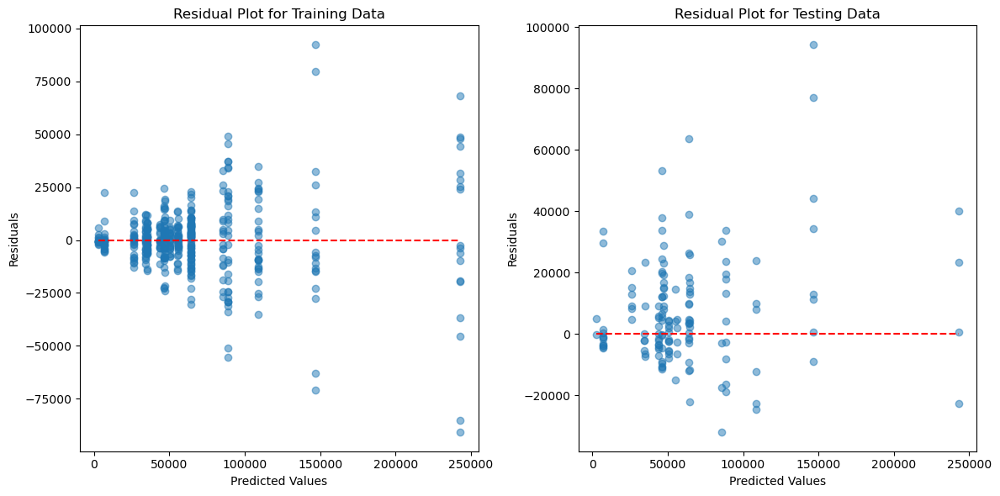

In [966]:
# Calculate residuals for training and testing data
residuals_train = y_train_imputed - y_pred_train
residuals_test = y_test_imputed - y_pred_mean

# Plot residuals using subplots
plt.figure(figsize=(12, 6))

# Subplot for training data
plt.subplot(1, 2, 1)
plt.scatter(y_pred_train, residuals_train, alpha=0.5)  # Scatter plot of predicted values vs. residuals
plt.hlines(0, min(y_pred_train), max(y_pred_train), colors='r', linestyles='dashed')  # Add dashed red line at y=0
plt.title('Residual Plot for Training Data')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

# Subplot for testing data
plt.subplot(1, 2, 2)
plt.scatter(y_pred_mean, residuals_test, alpha=0.5)  # Scatter plot of predicted values vs. residuals
plt.hlines(0, min(y_pred_mean), max(y_pred_mean), colors='r', linestyles='dashed')  # Add dashed red line at y=0
plt.title('Residual Plot for Testing Data')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

# Adjust layout for better appearance
plt.tight_layout()

# Display the plots
plt.show()


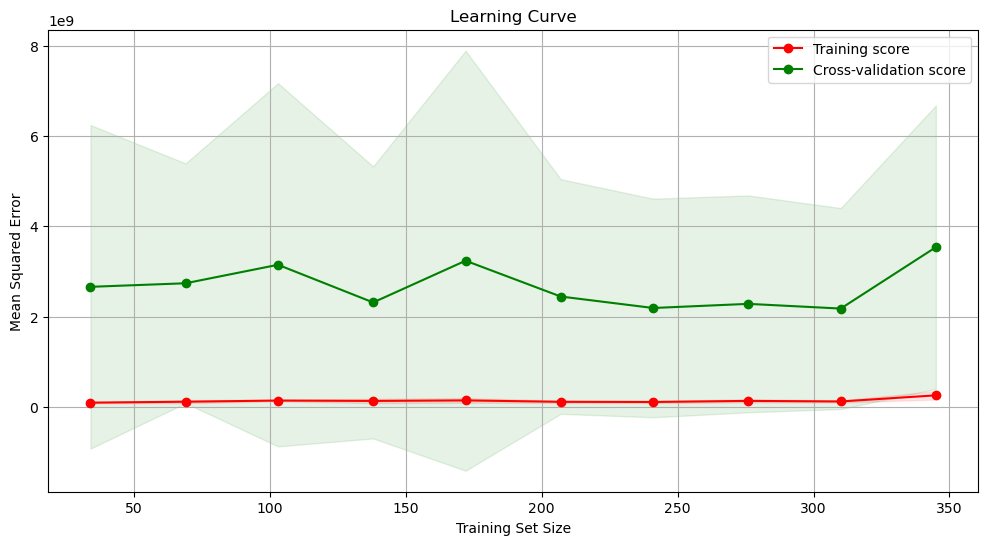

In [967]:
# Define the model with the best hyperparameters
model = DecisionTreeRegressor(min_samples_split=6, min_samples_leaf=17, max_depth=7, random_state=42)

# Use the learning_curve function to generate learning curves
train_sizes, train_scores, validation_scores = learning_curve(
    estimator=model,              # The model to use
    X=X_train_imputed,            # Training data features
    y=y_train_imputed,            # Training data target
    train_sizes=np.linspace(0.1, 1.0, 10),  # Different sizes of the training set to use
    cv=5,                         # Cross-validation strategy (number of folds)
    scoring='neg_mean_squared_error'  # Scoring metric (negative mean squared error in this case)
)

# Calculate the mean and standard deviation of training and validation scores for each training set size
train_scores_mean = -train_scores.mean(axis=1)  # Negative sign to convert back to positive MSE
train_scores_std = train_scores.std(axis=1)
validation_scores_mean = -validation_scores.mean(axis=1)
validation_scores_std = validation_scores.std(axis=1)

# Plot the learning curve
plt.figure(figsize=(12, 6))
# Fill the area between the standard deviation of training scores
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
# Fill the area between the standard deviation of validation scores
plt.fill_between(train_sizes, validation_scores_mean - validation_scores_std, validation_scores_mean + validation_scores_std, alpha=0.1, color="g")
# Plot the training scores and validation scores
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, validation_scores_mean, 'o-', color="g", label="Cross-validation score")
plt.title("Learning Curve")  # Title of the plot
plt.xlabel("Training Set Size")  # X-axis label
plt.ylabel("Mean Squared Error")  # Y-axis label
plt.legend(loc="best")  # Display the legend in the best location
plt.grid()  # Display grid lines
plt.show()  # Display the plot


### Random Forest Regressor

#### Zero Fill

In [ ]:
# Initialize the random forest model
random_forest_model = RandomForestRegressor(random_state=42)

# Define the initial parameters to search
param_distributions = {
    'n_estimators': list(range(5, 201, 5)),   # Range of number of trees in the forest
    'max_depth':  list(range(5, 25)),         # Range of maximum depth of each tree
    'min_samples_split': list(range(4, 25)),  # Range of minimum samples required to split a node
    'min_samples_leaf': list(range(4, 25)),   # Range of minimum samples required at each leaf node
}

# Initialize the random search with hyperparameter tuning
random_search = RandomizedSearchCV(estimator=random_forest_model, 
                                   param_distributions=param_distributions, 
                                   n_iter=20,     # Number of random combinations to try
                                   cv=10,         # Cross-validation folds
                                   scoring='neg_mean_squared_error',  # Scoring metric
                                   random_state=42)

# Initialize variables for early stopping criteria
overfitting = True
iteration = 0
max_iterations = 20

# Initialize variables to track performance and improvement
best_validation_score = float('inf')
no_improvement_counter = 0
max_no_improvement = 5  # Number of iterations with no improvement to trigger early stopping

# Initialize lists to store training and test errors
train_errors = []
test_errors = []
best_scores = []

# Loop until overfitting is detected or maximum iterations reached
while overfitting and iteration < max_iterations:
    
    print("Iteration:", iteration)

    # Fit the random search to find the best hyperparameters
    random_search.fit(X3_train_zero, y3_train_zero)

    # Store the best score of this iteration
    current_validation_score = -random_search.best_score_
    best_scores.append(current_validation_score)
    
    print("Best Score:", -random_search.best_score_)
    print("Best Params:", random_search.best_params_)
    
    if current_validation_score < best_validation_score:
        best_validation_score = current_validation_score
        no_improvement_counter = 0  # Reset the counter
    else:
        no_improvement_counter += 1

    # If no improvement in validation score for max_no_improvement iterations, trigger early stopping
    if no_improvement_counter >= max_no_improvement:
        print("Early stopping triggered. No improvement in validation score for", max_no_improvement, "iterations.")
        break
    
    # Make predictions on the training and test sets
    y_pred_train = random_search.predict(X3_train_zero)
    y_pred_test = random_search.predict(X3_test_zero)

    # Compute the RMSE for training and test sets
    train_rmse = np.sqrt(mean_squared_error(y3_train_zero, y_pred_train))
    test_rmse = np.sqrt(mean_squared_error(y3_test_zero, y_pred_test))
    
    # Compute the R2 scores
    train_r2 = r2_score(y3_train_zero, y_pred_train)
    test_r2 = r2_score(y3_test_zero, y_pred_test)
    
    print("RMSE Results for Training set, test set:", train_rmse, test_rmse)
    print("R2 Results for Training set, test set:", train_r2, test_r2)
    
    # Append errors to lists for tracking
    train_errors.append(train_rmse)
    test_errors.append(test_rmse)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_rmse - test_rmse) < 0.05:
        overfitting = False
    else:
        # Refine the parameters based on the best ones from the current iteration
        best_params = random_search.best_params_
        param_distributions['max_depth'] = list(range(max(1, best_params['max_depth'] - 1), best_params['max_depth'] + 2))
        param_distributions['min_samples_split'] = list(range(max(2, best_params['min_samples_split'] - 1), best_params['min_samples_split'] + 2))
        param_distributions['min_samples_leaf'] = list(range(max(1, best_params['min_samples_leaf'] - 1), best_params['min_samples_leaf'] + 2))
        param_distributions['n_estimators'] = list(range(max(5, best_params['n_estimators'] - 10), best_params['n_estimators'] + 11, 10))

    # Increase the iteration counter
    iteration += 1

# Print the best hyperparameters found
print("Best Hyperparameters:", random_search.best_params_)


Iteration: 0
Best Score:  522163733.46576774
Best Params: {'n_estimators': 35, 'min_samples_split': 11, 'min_samples_leaf': 6, 'max_depth': 8}
RMSE Results for Training set, test set: 16497.21098058172 13103.720869695126
R2 Results for Training set, test set: 0.9093653430925904 0.8590672423109503
Iteration: 1
Best Score:  320287487.22138274
Best Params: {'n_estimators': 25, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_depth': 7}
RMSE Results for Training set, test set: 14379.10609053061 14071.952731388683
R2 Results for Training set, test set: 0.9311447572188418 0.8374707921728314
Iteration: 2
Best Score:  263019799.59515357
Best Params: {'n_estimators': 25, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_depth': 8}
RMSE Results for Training set, test set: 13263.609053152572 14437.590153363975
R2 Results for Training set, test set: 0.9414136201643397 0.8289149340260895
Iteration: 3
Best Score:  249729187.50420552
Best Params: {'n_estimators': 25, 'min_samples_split': 8, 'mi

{'n_estimators': 25,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_depth': 11}

In [ ]:
# Initialize random forest regressor
rf = RandomForestRegressor(max_depth=7, min_samples_leaf=5, min_samples_split=10, n_estimators=25, random_state=42)

# Fit the model
rf.fit(X3_train_zero, y3_train_zero)

# Predict the model
y3_pred = rf.predict(X3_test_zero)

# Predict the training set
y3_train_pred = rf.predict(X3_train_zero)

# Calculate the mean squared error for training set
mse3_train = mean_squared_error(y3_train_zero, y3_train_pred)
print("Training MSE: %.4f" % mse3_train)

# Calculate the root mean squared error for training set
rmse3_train = np.sqrt(mse3_train)
print("Training RMSE: %.4f" % rmse3_train)

# Calculate the mean squared error
mse3 = mean_squared_error(y3_test_zero, y3_pred)
print("Testing MSE: %.4f" % mse3)

# Calculate the root mean squared error
rmse3 = np.sqrt(mse3)
print("Testing RMSE: %.4f" % rmse3)

# Calculate r2 score for training
r2_3_train = r2_score(y3_train_zero, y3_train_pred)
print("Training R2: %.4f" % r2_3_train)

# Calculate r2 score
r2_3 = r2_score(y3_test_mean, y3_pred)
print("Testing R2: %.4f" % r2_3)


Training MSE: 206758691.9627
Training RMSE: 14379.1061
Testing MSE: 198019853.6744
Testing RMSE: 14071.9527
Training R2: 0.9311
Training Adjusted R2: 1.1754
Testing R2: 0.8375
Testing Adjusted R2: 1.0499


In [ ]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(rf.feature_importances_, X3_train_zero.columns), reverse=True):
    print(name, importance)


Feature importances:
% who are economically inactive - aged 16+ 0.12007180414082247
Female Full Time Workers  - median_weekly 0.094139990275211
Female Full Time Workers - mean_hourly 0.08743955380851982
Female Full Time Workers  - median_annual 0.08416250640008666
Female Full Time Workers  - mean_weekly 0.06833046817884038
Male Full Time Workers - mean_annual 0.06534572813145242
Unemployment rate - aged 16+ 0.05524748438618362
Economic activity rate - aged 16+ 0.0535471495111009
average_house_price 0.04932581407512956
Full Time Workers - mean_annual 0.03486446611509038
Full Time Workers  - median_annual 0.03183736080357162
start_number_of_empty_docks 0.029839164330214444
% in employment working part-time - aged 16-19 0.028805726263423273
start_number_of_docks 0.02652099313683705
% of all 16+ who are aged 65+ 0.02306059776895456
duration_minutes 0.020268817002499127
start_number_standard_bikes 0.012539692770039319
temp 0.011225000580737434
Employment - Rank of proportion of LSOAs in mos

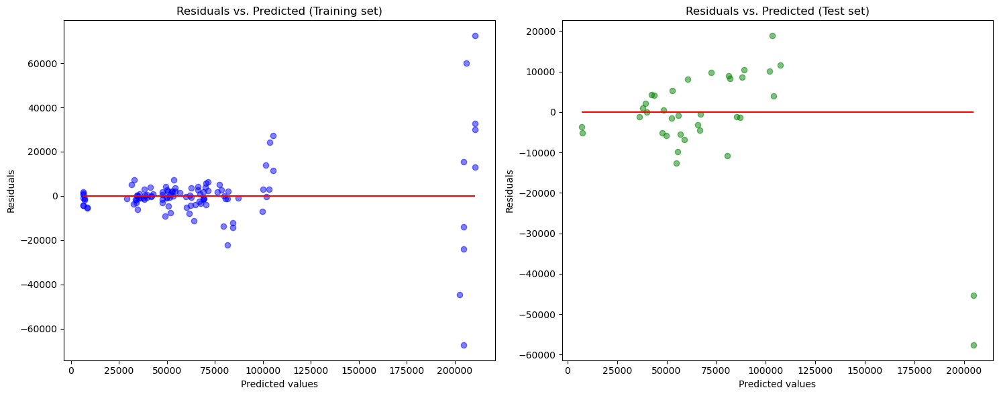

In [ ]:

# Calculate residuals for training set
residuals_train = y3_train_zero - y3_train_pred

# Calculate residuals for test set
residuals_test = y3_test_zero - y3_pred

# Create a subplot of 2 plots
fig, ax = plt.subplots(1, 2, figsize=(15,6))

# Plot residuals vs predicted values for training set
ax[0].scatter(y3_train_pred, residuals_train, color='blue', alpha=0.5)
ax[0].hlines(y=0, xmin=y3_train_pred.min(), xmax=y3_train_pred.max(), color='red')
ax[0].set_title('Residuals vs. Predicted (Training set)')
ax[0].set_xlabel('Predicted values')
ax[0].set_ylabel('Residuals')

# Plot residuals vs predicted values for test set
ax[1].scatter(y3_pred, residuals_test, color='green', alpha=0.5)
ax[1].hlines(y=0, xmin=y3_pred.min(), xmax=y3_pred.max(), color='red')
ax[1].set_title('Residuals vs. Predicted (Test set)')
ax[1].set_xlabel('Predicted values')
ax[1].set_ylabel('Residuals')

# Show the plots
plt.tight_layout()
plt.show()


##### Mean Fill

In [ ]:
# Initialize the model
random_forest_model = RandomForestRegressor(random_state=42)

# Define the initial parameters to search
param_distributions = {
    'n_estimators': list(range(5, 201, 5)),  # Increase the range to 200
    'max_depth':  list(range(5, 25)),
    'min_samples_split': list(range(4, 25)),
    'min_samples_leaf': list(range(4, 25)),
}

# Initialize the random search
random_search = RandomizedSearchCV(estimator=random_forest_model, 
                                   param_distributions=param_distributions, 
                                   n_iter=20, 
                                   cv=10, 
                                   scoring='neg_mean_squared_error', 
                                   random_state=42)


overfitting = True
iteration = 0
max_iterations = 20

best_validation_score = float('inf')
no_improvement_counter = 0
max_no_improvement = 5  # number of iterations with no improvement to trigger early stopping


train_errors = []
test_errors = []
best_scores = []

while overfitting and iteration < max_iterations:
    
    print("Iteration:", iteration)

    # Fit the random search
    random_search.fit(X3_train_mean, y3_train_mean)

    # Store the best score of this iteration
    current_validation_score = -random_search.best_score_
    best_scores.append(current_validation_score)
    
    print("Best Score: ",-random_search.best_score_)
    print("Best Params:",random_search.best_params_)
    
    if current_validation_score < best_validation_score:
        best_validation_score = current_validation_score
        no_improvement_counter = 0  # reset the counter
    else:
        no_improvement_counter += 1

    # If no improvement in validation score for max_no_improvement iterations, break
    if no_improvement_counter >= max_no_improvement:
        print("Early stopping triggered. No improvement in validation score for", max_no_improvement, "iterations.")
        break
    
    # Make predictions on the training and test sets
    y_pred_train = random_search.predict(X3_train_mean)
    y_pred_test = random_search.predict(X3_test_mean)

    # Compute the RMSE for training and test sets
    train_rmse = np.sqrt(mean_squared_error(y3_train_mean, y_pred_train))
    test_rmse = np.sqrt(mean_squared_error(y3_test_mean, y_pred_test))
    
    # Compute the R2 scores
    train_r2 = r2_score(y3_train_mean, y_pred_train)
    test_r2 = r2_score(y3_test_mean, y_pred_test)
    
    print("RMSE Results for Training set, test set:", train_rmse, test_rmse)
    print("R2 Results for Training set, test set:", train_r2, test_r2)
    
    train_errors.append(train_rmse)
    test_errors.append(test_rmse)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_rmse - test_rmse) < 0.05:
        overfitting = False
    else:
        # Refine the parameters based on the best ones from the current iteration
        best_params = random_search.best_params_
        param_distributions['max_depth'] = list(range(max(1, best_params['max_depth'] - 1), best_params['max_depth'] + 2))
        param_distributions['min_samples_split'] = list(range(max(2, best_params['min_samples_split'] - 1), best_params['min_samples_split'] + 2))
        param_distributions['min_samples_leaf'] = list(range(max(1, best_params['min_samples_leaf'] - 1), best_params['min_samples_leaf'] + 2))
        param_distributions['n_estimators'] = list(range(max(5, best_params['n_estimators'] - 10), best_params['n_estimators'] + 11, 10))

    # Increase the iteration counter
    iteration += 1


best_params


Iteration: 0


Best Score:  513376795.0035242
Best Params: {'n_estimators': 35, 'min_samples_split': 11, 'min_samples_leaf': 6, 'max_depth': 8}
RMSE Results for Training set, test set: 16878.43927582702 12932.424974992366
R2 Results for Training set, test set: 0.9051280539446045 0.8627277922299199
Iteration: 1
Best Score:  327881071.3936455
Best Params: {'n_estimators': 25, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_depth': 7}
RMSE Results for Training set, test set: 14415.63591747799 13982.374691673229
R2 Results for Training set, test set: 0.9307944621332277 0.8395334353235789
Iteration: 2
Best Score:  270742908.8697629
Best Params: {'n_estimators': 25, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_depth': 7}
RMSE Results for Training set, test set: 13392.494046775131 14550.021083248022
R2 Results for Training set, test set: 0.940269498387704 0.8262399517171549
Iteration: 3
Best Score:  264270222.0928329
Best Params: {'n_estimators': 25, 'min_samples_split': 8, 'min_samples_leaf': 4

KeyboardInterrupt: 

In [ ]:
# Initialize the Random Forest Regressor with optimized hyperparameters
rf = RandomForestRegressor(max_depth=8, min_samples_leaf=6, min_samples_split=11, n_estimators=38, random_state=42)

# Fit the model on the training data
rf.fit(X3_train_mean, y3_train_mean)

# Predict using the trained model
y3_pred = rf.predict(X3_test_mean)

# Predict the training set
y3_train_pred = rf.predict(X3_train_mean)

# Calculate the mean squared error for training set
mse3_train = mean_squared_error(y3_train_mean, y3_train_pred)
print("Training MSE: %.4f" % mse3_train)

# Calculate the root mean squared error for training set
rmse3_train = np.sqrt(mse3_train)
print("Training RMSE: %.4f" % rmse3_train)

# Calculate the mean squared error for testing set
mse3 = mean_squared_error(y3_test_mean, y3_pred)
print("Testing MSE: %.4f" % mse3)

# Calculate the root mean squared error for testing set
rmse3 = np.sqrt(mse3)
print("Testing RMSE: %.4f" % rmse3)

# Calculate the R2 score for training
r2_3_train = r2_score(y3_train_mean, y3_train_pred)
print("Training R2: %.4f" % r2_3_train)

# Calculate the R2 score for testing
r2_3 = r2_score(y3_test_mean, y3_pred)
print("Testing R2: %.4f" % r2_3)


Training MSE: 279006030.3271
Training RMSE: 16703.4736
Testing MSE: 176988799.7139
Testing RMSE: 13303.7138
Training R2: 0.9071
Training Adjusted R2: 1.2367
Testing R2: 0.8547
Testing Adjusted R2: 1.0446


In [ ]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(rf.feature_importances_, X3_train_mean.columns), reverse=True):
    print(name, importance)


Feature importances:
% in employment working part-time - aged 25-49 0.11145206250261383
% who are economically inactive - aged 16+ 0.10389033063082764
Female Full Time Workers - mean_hourly 0.10104182302205561
Male Full Time Workers - mean_annual 0.08430984099600256
Female Full Time Workers  - median_weekly 0.08067137813530952
Unemployment rate - aged 16+ 0.06328921570902774
average_house_price 0.06263370963687777
Female Full Time Workers  - mean_weekly 0.04511218011817396
start_number_of_empty_docks 0.0411730041444969
Full Time Workers - mean_annual 0.040968710943026385
Economic activity rate - aged 16+ 0.03638723307777566
start_number_of_docks 0.02840976424133135
Female Full Time Workers  - median_annual 0.022734424478563935
Full Time Workers  - median_annual 0.02114912530814378
% of all 16+ who are aged 65+ 0.019909074252197578
Employment - Rank of proportion of LSOAs in most deprived 10% nationally  0.01954040016687852
duration_minutes 0.016672487192051468
temp 0.008848174561918876

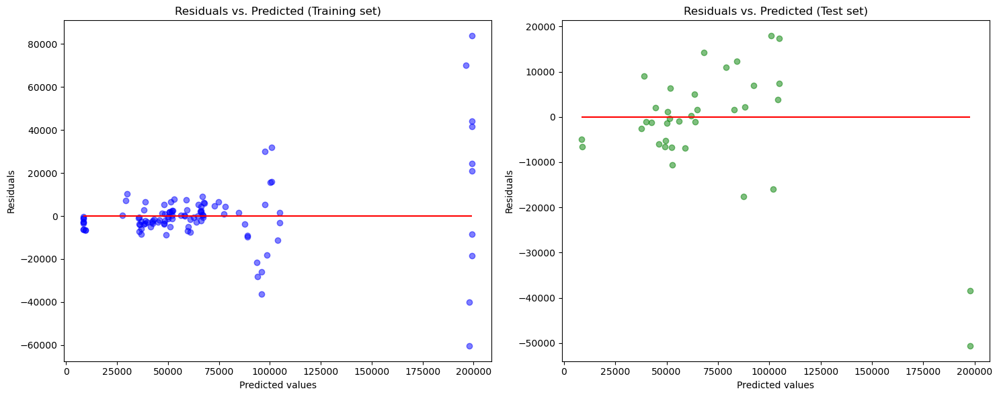

In [ ]:

# Calculate residuals for training set
residuals_train = y3_train_mean - y3_train_pred

# Calculate residuals for test set
residuals_test = y3_test_mean - y3_pred

# Create a subplot of 2 plots
fig, ax = plt.subplots(1, 2, figsize=(15,6))

# Plot residuals vs predicted values for training set
ax[0].scatter(y3_train_pred, residuals_train, color='blue', alpha=0.5)
ax[0].hlines(y=0, xmin=y3_train_pred.min(), xmax=y3_train_pred.max(), color='red')
ax[0].set_title('Residuals vs. Predicted (Training set)')
ax[0].set_xlabel('Predicted values')
ax[0].set_ylabel('Residuals')

# Plot residuals vs predicted values for test set
ax[1].scatter(y3_pred, residuals_test, color='green', alpha=0.5)
ax[1].hlines(y=0, xmin=y3_pred.min(), xmax=y3_pred.max(), color='red')
ax[1].set_title('Residuals vs. Predicted (Test set)')
ax[1].set_xlabel('Predicted values')
ax[1].set_ylabel('Residuals')

# Show the plots
plt.tight_layout()
plt.show()


#### Median Fill

In [ ]:
# Initialize the model
random_forest_model = RandomForestRegressor(random_state=42)

# Define the initial parameters to search
param_distributions = {
    'n_estimators': list(range(5, 201, 5)),  # Increase the range to 200
    'max_depth':  list(range(5, 25)),
    'min_samples_split': list(range(4, 25)),
    'min_samples_leaf': list(range(4, 25)),
}

# Initialize the random search
random_search = RandomizedSearchCV(estimator=random_forest_model, 
                                   param_distributions=param_distributions, 
                                   n_iter=20, 
                                   cv=10, 
                                   scoring='neg_mean_squared_error', 
                                   random_state=42)


overfitting = True
iteration = 0
max_iterations = 20

best_validation_score = float('inf')
no_improvement_counter = 0
max_no_improvement = 5  # number of iterations with no improvement to trigger early stopping


train_errors = []
test_errors = []
best_scores = []

while overfitting and iteration < max_iterations:
    
    print("Iteration:", iteration)

    # Fit the random search
    random_search.fit(X3_train_median, y3_train_median)

    # Store the best score of this iteration
    current_validation_score = -random_search.best_score_
    best_scores.append(current_validation_score)
    
    print("Best Score: ",-random_search.best_score_)
    print("Best Params:",random_search.best_params_)
    
    if current_validation_score < best_validation_score:
        best_validation_score = current_validation_score
        no_improvement_counter = 0  # reset the counter
    else:
        no_improvement_counter += 1

    # If no improvement in validation score for max_no_improvement iterations, break
    if no_improvement_counter >= max_no_improvement:
        print("Early stopping triggered. No improvement in validation score for", max_no_improvement, "iterations.")
        break
    
    # Make predictions on the training and test sets
    y_pred_train = random_search.predict(X3_train_median)
    y_pred_test = random_search.predict(X3_test_median)

    # Compute the RMSE for training and test sets
    train_rmse = np.sqrt(mean_squared_error(y3_train_median, y_pred_train))
    test_rmse = np.sqrt(mean_squared_error(y3_test_median, y_pred_test))
    
    # Compute the R2 scores
    train_r2 = r2_score(y3_train_median, y_pred_train)
    test_r2 = r2_score(y3_test_median, y_pred_test)
    
    print("RMSE Results for Training set, test set:", train_rmse, test_rmse)
    print("R2 Results for Training set, test set:", train_r2, test_r2)
    
    train_errors.append(train_rmse)
    test_errors.append(test_rmse)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_rmse - test_rmse) < 0.05:
        overfitting = False
    else:
        # Refine the parameters based on the best ones from the current iteration
        best_params = random_search.best_params_
        param_distributions['max_depth'] = list(range(max(1, best_params['max_depth'] - 1), best_params['max_depth'] + 2))
        param_distributions['min_samples_split'] = list(range(max(2, best_params['min_samples_split'] - 1), best_params['min_samples_split'] + 2))
        param_distributions['min_samples_leaf'] = list(range(max(1, best_params['min_samples_leaf'] - 1), best_params['min_samples_leaf'] + 2))
        param_distributions['n_estimators'] = list(range(max(5, best_params['n_estimators'] - 10), best_params['n_estimators'] + 11, 10))

    # Increase the iteration counter
    iteration += 1


best_params

# Iteration: 0
# Best Score:  1545809710.2836819
# Best Params: {'n_estimators': 75, 'min_samples_split': 19, 'min_samples_leaf': 2, 'max_depth': 10}
# RMSE Results for Training set, test set: 11572.91709986751 11723.03966988669
# R2 Results for Training set, test set: 0.9496865545107306 0.9462477245564129

Iteration: 0
Best Score:  514334719.8475057
Best Params: {'n_estimators': 35, 'min_samples_split': 11, 'min_samples_leaf': 6, 'max_depth': 8}
RMSE Results for Training set, test set: 16880.39197476772 12919.371296472094
R2 Results for Training set, test set: 0.9051061008407816 0.8630047708970183
Iteration: 1
Best Score:  327704359.1571149
Best Params: {'n_estimators': 25, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_depth': 7}
RMSE Results for Training set, test set: 14434.746024848228 13975.514991407703
R2 Results for Training set, test set: 0.9306108556838792 0.8396908452840564
Iteration: 2
Best Score:  266876526.75614232
Best Params: {'n_estimators': 25, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_depth': 7}
RMSE Results for Training set, test set: 13376.758117082198 14473.48073624092
R2 Results for Training set, test set: 0.9404097803664554 0.8280632718233544
Iteration: 3
Best Score:  259862725.5526967
Best Params: {'n_estimators': 25, 'min_samples_split': 8, 'min_s

{'n_estimators': 25,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_depth': 9}

In [ ]:
# initialise random forest regressor
rf = RandomForestRegressor(max_depth=7, min_samples_leaf=5, min_samples_split=10, n_estimators=25,random_state=42)

# fit the model
rf.fit(X3_train_median, y3_train_median)

# predict the model
y3_pred = rf.predict(X3_test_median)

# predict the training set
y3_train_pred = rf.predict(X3_train_median)

# calculate the mean squared error for training set
mse3_train = mean_squared_error(y3_train_median, y3_train_pred)
print("Training MSE: %.4f" % mse3_train)

# calculate the root mean squared error for training set
rmse3_train = np.sqrt(mse3_train)
print("Training RMSE: %.4f" % rmse3_train)

# calculate the mean squared error
mse3 = mean_squared_error(y3_test_median, y3_pred)
print("Testing MSE: %.4f" % mse3)

# calculate the root mean squared error
rmse3 = np.sqrt(mse3)
print("Testing RMSE: %.4f" % rmse3)

#calculate r2 score for training
r2_3_train = r2_score(y3_train_median, y3_train_pred)
print("Training R2: %.4f" % r2_3_train)


# calculate r2 score
r2_3 = r2_score(y3_test_median, y3_pred)
print("Testing R2: %.4f" % r2_3)

Training MSE: 208361892.8019
Training RMSE: 14434.7460
Testing MSE: 195315019.2751
Testing RMSE: 13975.5150
Training R2: 0.9306
Training Adjusted R2: 1.1768
Testing R2: 0.8397
Testing Adjusted R2: 1.0492


In [ ]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(rf.feature_importances_, X3_train_median.columns), reverse=True):
    print(name, importance)


Feature importances:
% who are economically inactive - aged 16+ 0.11993050507143829
Female Full Time Workers - mean_hourly 0.08746266265320106
Female Full Time Workers  - mean_weekly 0.06958791692669317
Male Full Time Workers - mean_annual 0.06545669038761098
Unemployment rate - aged 16+ 0.06544541841166372
Female Full Time Workers  - median_weekly 0.0635637432958918
Female Full Time Workers  - median_annual 0.06271507119107571
% in employment working part-time - aged 25-49 0.05462862378008687
Economic activity rate - aged 16+ 0.05400626111475313
average_house_price 0.052399843485848085
Full Time Workers - mean_annual 0.03473309681793485
Full Time Workers  - median_annual 0.03183736080357162
start_number_of_empty_docks 0.03042634133540047
start_number_of_docks 0.027248514954018397
% of all 16+ who are aged 65+ 0.02306059776895456
duration_minutes 0.020356425778311843
start_number_standard_bikes 0.012610918146148363
feelslike 0.011908640608321355
IMD 2019 - Extent  0.009300079645227104


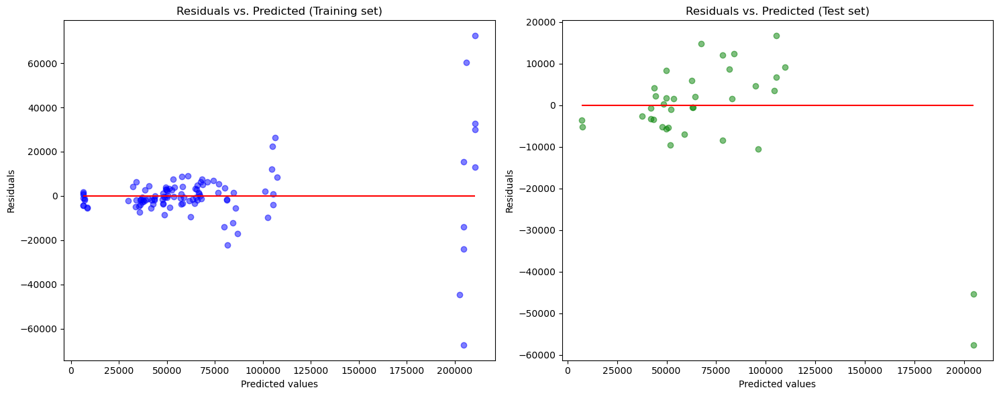

In [ ]:

# Calculate residuals for training set
residuals_train = y3_train_median - y3_train_pred

# Calculate residuals for test set
residuals_test = y3_test_median - y3_pred

# Create a subplot of 2 plots
fig, ax = plt.subplots(1, 2, figsize=(15,6))

# Plot residuals vs predicted values for training set
ax[0].scatter(y3_train_pred, residuals_train, color='blue', alpha=0.5)
ax[0].hlines(y=0, xmin=y3_train_pred.min(), xmax=y3_train_pred.max(), color='red')
ax[0].set_title('Residuals vs. Predicted (Training set)')
ax[0].set_xlabel('Predicted values')
ax[0].set_ylabel('Residuals')

# Plot residuals vs predicted values for test set
ax[1].scatter(y3_pred, residuals_test, color='green', alpha=0.5)
ax[1].hlines(y=0, xmin=y3_pred.min(), xmax=y3_pred.max(), color='red')
ax[1].set_title('Residuals vs. Predicted (Test set)')
ax[1].set_xlabel('Predicted values')
ax[1].set_ylabel('Residuals')

# Show the plots
plt.tight_layout()
plt.show()


### Gradient Boost

#### Zero Fill

In [ ]:

# Define the model
model = GradientBoostingRegressor(random_state=42)

# Parameters to search
param_distributions = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': [ 5, 7, 8, 9, 10, 11, 12],
    'min_samples_split': [ 4, 5, 6, 7, 10, 11, 12, 13],
    'min_samples_leaf': [ 4, 5, 6, 7, 8, 10, 11, 12],
    'learning_rate': [0.01, 0.05, 0.1, 0.15, 0.2]
}

# Define the randomized search
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions, 
                                   n_iter=100, cv=5, verbose=1, random_state=42)

# Execute the randomized search
random_search.fit(X3_train_zero, y3_train_zero)

# Print the best parameters
print(random_search.best_params_)
print(random_search.best_score_)

y3_pred = random_search.predict(X3_test_zero)
y3_pred_train = random_search.predict(X3_train_zero)

# Print the r2 score
print(r2_score(y3_train_zero, y3_pred_train))
print(r2_score(y3_test_zero, y3_pred))

# Compute the RMSE
rmse_train = np.sqrt(mean_squared_error(y3_train_zero, y3_pred_train))
mse = np.sqrt(mean_squared_error(y3_test_zero, y3_pred))
print('Mean Squared Error:', rmse_train, mse)

# Print summary of the model
print(random_search.best_estimator_)

# Print the feature importances in descending order
sorted(zip(random_search.best_estimator_.feature_importances_, X3_train_zero.columns), reverse=True)


Fitting 5 folds for each of 100 candidates, totalling 500 fits


{'n_estimators': 300, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_depth': 9, 'learning_rate': 0.15}
0.9237735688734017
0.9999999999720961
0.9207632148715017
Mean Squared Error: 0.28946494541237494 9825.441667418016
GradientBoostingRegressor(learning_rate=0.15, max_depth=9, min_samples_leaf=4,
                          min_samples_split=4, n_estimators=300,
                          random_state=42)


[(0.5275151502472558, 'Economic activity rate - aged 16+'),
 (0.08444740705257972, 'Unemployment rate - aged 16+'),
 (0.05551916217242746, 'Female Full Time Workers  - median_weekly'),
 (0.048273266657325106, '% who are economically inactive - aged 16+'),
 (0.039321703557963966, 'Female Full Time Workers  - median_annual'),
 (0.029898346054797256, 'Full Time Workers  - median_annual'),
 (0.026119915758552468, 'humidity'),
 (0.025882021366054584, '% in employment working part-time - aged 16-19'),
 (0.023000300178512206, 'temp'),
 (0.016942076673126395, 'Male Full Time Workers - mean_hourly'),
 (0.014051636433023118, 'visibility'),
 (0.013638206252742213, 'start_number_of_docks'),
 (0.013625585013962046, 'Female Full Time Workers - mean_hourly'),
 (0.012240730806423385, 'Education, Skills and Training - Average score '),
 (0.00986827734407817, 'duration_minutes'),
 (0.007549014608636498, 'feelslike'),
 (0.006322491782128462, 'dew'),
 (0.0055191477421200185, 'start_number_of_empty_docks')

In [ ]:
# initialise random forest regressor
rf = GradientBoostingRegressor(learning_rate=0.01, max_depth=13, min_samples_leaf=8,
                          min_samples_split=6, n_estimators=250,
                          random_state=42)

# fit the model
rf.fit(X3_train_zero, y3_train_zero)

# predict the model
y3_pred = rf.predict(X3_test_zero)

# predict the training set
y3_train_pred = rf.predict(X3_train_zero)

# calculate the mean squared error for training set
mse3_train = mean_squared_error(y3_train_zero, y3_train_pred)
print("Training MSE: %.4f" % mse3_train)

# calculate the root mean squared error for training set
rmse3_train = np.sqrt(mse3_train)
print("Training RMSE: %.4f" % rmse3_train)

# calculate the mean squared error
mse3 = mean_squared_error(y3_test_zero, y3_pred)
print("Testing MSE: %.4f" % mse3)

# calculate the root mean squared error
rmse3 = np.sqrt(mse3)
print("Testing RMSE: %.4f" % rmse3)

#calculate r2 score for training
r2_3_train = r2_score(y3_train_zero, y3_train_pred)
print("Training R2: %.4f" % r2_3_train)

# calculate r2 score
r2_3 = r2_score(y3_test_mean, y3_pred)
print("Testing R2: %.4f" % r2_3)


# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(rf.feature_importances_, X3_train_zero.columns), reverse=True):
    print(name, importance)


Training MSE: 134155234.8684
Training RMSE: 11582.5401
Testing MSE: 143073444.0821
Testing RMSE: 11961.3312
Training R2: 0.9553
Training Adjusted R2: 1.1138
Testing R2: 0.8826
Testing Adjusted R2: 1.0361
Feature importances:
Male Full Time Workers - mean_annual 0.11138511942169049
% who are economically inactive - aged 16+ 0.09795037488089596
Female Full Time Workers  - mean_weekly 0.0860277513683519
Full Time Workers - mean_annual 0.0842163736161624
Economic activity rate - aged 16+ 0.0789602980662407
Unemployment rate - aged 16+ 0.0759297542761412
Full Time Workers  - median_annual 0.075020873494347
Female Full Time Workers  - median_weekly 0.06859983303658293
Female Full Time Workers - mean_hourly 0.0667150747714134
Female Full Time Workers  - median_annual 0.06542493540491794
% in employment working part-time - aged 16-19 0.029104381684531284
start_number_of_empty_docks 0.0204961057646363
temp 0.011480122453100865
feelslike 0.010383056099638733
visibility 0.008915411607179324
start

In [ ]:
# initialise random forest regressor
rf = GradientBoostingRegressor(learning_rate=0.005, max_depth=16, min_samples_leaf=8,
                          min_samples_split=6, n_estimators=250, random_state=42)

# fit the model
rf.fit(X3_train_zero, y3_train_zero)

# predict the model
y3_pred = rf.predict(X3_test_zero)

# predict the training set
y3_train_pred = rf.predict(X3_train_zero)

# calculate the mean squared error for training set
mse3_train = mean_squared_error(y3_train_zero, y3_train_pred)
print("Training MSE: %.4f" % mse3_train)

# calculate the root mean squared error for training set
rmse3_train = np.sqrt(mse3_train)
print("Training RMSE: %.4f" % rmse3_train)

# calculate the mean squared error
mse3 = mean_squared_error(y3_test_zero, y3_pred)
print("Testing MSE: %.4f" % mse3)

# calculate the root mean squared error
rmse3 = np.sqrt(mse3)
print("Testing RMSE: %.4f" % rmse3)


# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(rf.feature_importances_, X3_train_zero.columns), reverse=True):
    print(name, importance)


Training MSE: 434082802.6330
Training RMSE: 20834.6539
Testing MSE: 156594430.4587
Testing RMSE: 12513.7696
Feature importances:
Economic activity rate - aged 16+ 0.13725093797612375
Female Full Time Workers  - median_annual 0.1078778111445257
% who are economically inactive - aged 16+ 0.10622862709047741
Full Time Workers - mean_annual 0.10086783300486205
Unemployment rate - aged 16+ 0.08287912948497118
Female Full Time Workers  - median_weekly 0.07928693617144558
Female Full Time Workers - mean_hourly 0.06978793176465693
Female Full Time Workers  - mean_weekly 0.06387693813726508
Full Time Workers  - median_annual 0.05806084636881048
Male Full Time Workers - mean_annual 0.049663534517337425
% in employment working part-time - aged 16-19 0.030180312883709984
temp 0.011346910441909783
feelslike 0.00912303413052977
humidity 0.00877690531105345
start_number_of_bikes 0.006139663206111423
start_number_of_docks 0.0052965255149241995
duration_minutes 0.004299747183810265
% of all 16+ who are

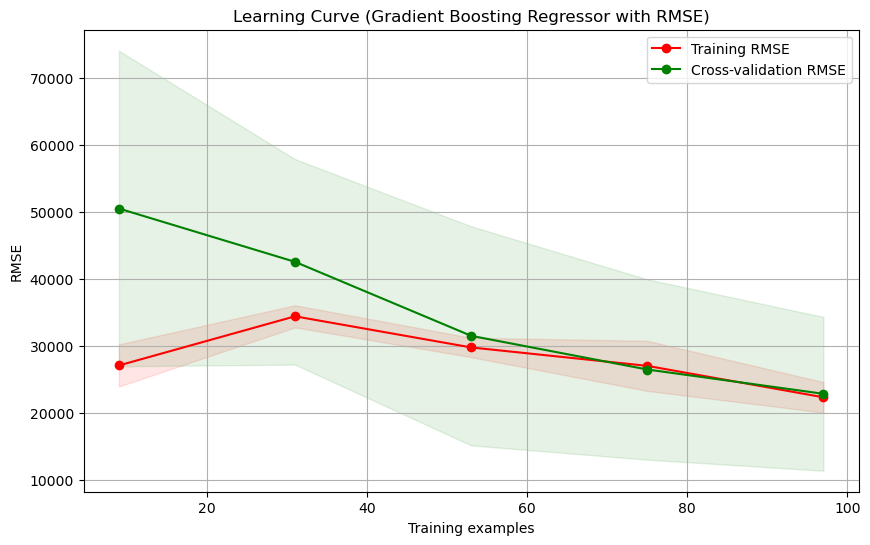

In [ ]:
def plot_learning_curve_rmse(estimator, title, X, y, ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure(figsize=(10,6))
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("RMSE")
    
    # Here, we use neg_mean_squared_error to get negative MSE values
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring="neg_mean_squared_error")
    
    # Convert negative MSE to RMSE
    train_scores_rmse = np.sqrt(-train_scores)
    test_scores_rmse = np.sqrt(-test_scores)
    
    train_scores_mean = np.mean(train_scores_rmse, axis=1)
    train_scores_std = np.std(train_scores_rmse, axis=1)
    test_scores_mean = np.mean(test_scores_rmse, axis=1)
    test_scores_std = np.std(test_scores_rmse, axis=1)
    
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training RMSE")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation RMSE")

    plt.legend(loc="best")
    plt.show()

# Plot the learning curve using RMSE
plot_learning_curve_rmse(rf, "Learning Curve (Gradient Boosting Regressor with RMSE)", X3_train_zero, y3_train_zero, cv=10)


##### Mean Fill

In [ ]:
# Define the model
model = GradientBoostingRegressor(random_state=42)

# Parameters to search
param_distributions = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': [3, 5, 7, 8, 9, 10, 11, 12, 15, 17, 19, 20],
    'min_samples_split': [3, 4, 5, 6, 7, 10, 11, 12, 13, 15, 17, 19],
    'min_samples_leaf': [3, 4, 5, 6, 7, 8, 10, 11, 12, 14, 17, 20],
    'learning_rate': [0.01, 0.001, 0.005, 0.05, 0.1, 0.15, 0.2]
}

# Define the randomized search
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions, 
                                   n_iter=100, cv=10, verbose=1, random_state=42)

# Execute the randomized search
random_search.fit(X3_train_mean, y3_train_mean)

# Print the best parameters
print(random_search.best_params_)
print(random_search.best_score_)

# Predict using the best model on test and train sets
y3_pred = random_search.predict(X3_test_mean)
y3_pred_train = random_search.predict(X3_train_mean)

# Print the r2 score for training and testing
print(r2_score(y3_train_mean, y3_pred_train))
print(r2_score(y3_test_mean, y3_pred))

# Compute the RMSE
rmse_train = np.sqrt(mean_squared_error(y3_train_mean, y3_pred_train))
rmse_test = np.sqrt(mean_squared_error(y3_test_mean, y3_pred))
print('Root Mean Squared Error (Train, Test):', rmse_train, rmse_test)

# Print summary of the best model
print(random_search.best_estimator_)

# Print the feature importances in descending order
feature_importances = sorted(zip(random_search.best_estimator_.feature_importances_, X3_train_mean.columns), reverse=True)
for importance, feature in feature_importances:
    print(f"Feature: {feature}, Importance: {importance}")


Fitting 10 folds for each of 100 candidates, totalling 1000 fits


{'n_estimators': 100, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_depth': 19, 'learning_rate': 0.05}
0.9550602432776014
0.9983077703856517
0.925463395015146
Mean Squared Error: 2254.2030161295606 9529.57345684924
GradientBoostingRegressor(learning_rate=0.05, max_depth=19, min_samples_leaf=4,
                          min_samples_split=6, random_state=42)


[(0.20879723954858925, 'Full Time Workers - mean_annual'),
 (0.14220793766986695, 'Full Time Workers  - median_annual'),
 (0.11976335400619123, '% in employment working part-time - aged 25-49'),
 (0.11857180063763337, 'Male Full Time Workers - mean_annual'),
 (0.08635065198447667, 'Unemployment rate - aged 16+'),
 (0.03794308057123793, '% who are economically inactive - aged 16+'),
 (0.028081707680292858, 'Economic activity rate - aged 16+'),
 (0.023318281583990814, 'temp'),
 (0.022622289445399367, 'Female Full Time Workers - mean_hourly'),
 (0.021455247927107058, 'Female Full Time Workers  - median_weekly'),
 (0.018195755080301586, 'Female Full Time Workers  - median_annual'),
 (0.016563413438996172, 'feelslike'),
 (0.011831498645034716, 'humidity'),
 (0.011122162670186984, 'average_house_price'),
 (0.010632202550164858, 'start_number_of_empty_docks'),
 (0.009793871031495451, '% of all 16+ who are aged 50-64'),
 (0.009038200906669127, 'dew'),
 (0.007953234439476079, 'Education, Skills

In [ ]:
# initialise random forest regressor
rf = GradientBoostingRegressor(learning_rate=0.01, max_depth=13, min_samples_leaf=8,
                          min_samples_split=6, n_estimators=250, random_state=42)

# fit the model
rf.fit(X3_train_mean, y3_train_mean)

# predict the model
y3_pred = rf.predict(X3_test_mean)

# predict the training set
y3_train_pred = rf.predict(X3_train_mean)

# calculate the mean squared error for training set
mse3_train = mean_squared_error(y3_train_mean, y3_train_pred)
print("Training MSE: %.4f" % mse3_train)

# calculate the root mean squared error for training set
rmse3_train = np.sqrt(mse3_train)
print("Training RMSE: %.4f" % rmse3_train)

# calculate the mean squared error
mse3 = mean_squared_error(y3_test_mean, y3_pred)
print("Testing MSE: %.4f" % mse3)

# calculate the root mean squared error
rmse3 = np.sqrt(mse3)
print("Testing RMSE: %.4f" % rmse3)

#calculate r2 score for training
r2_3_train = r2_score(y3_train_mean, y3_train_pred)
print("Training R2: %.4f" % r2_3_train)

# calculate r2 score
r2_3 = r2_score(y3_test_mean, y3_pred)
print("Testing R2: %.4f" % r2_3)

# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(rf.feature_importances_, X3_train_mean.columns), reverse=True):
    print(name, importance)


Training MSE: 132223753.9708
Training RMSE: 11498.8588
Testing MSE: 125151984.1071
Testing RMSE: 11187.1348
Training R2: 0.9560
Testing R2: 0.8973
Feature importances:
Full Time Workers - mean_annual 0.1680451353194866
Full Time Workers  - median_annual 0.11984123169177888
% who are economically inactive - aged 16+ 0.09979556692858264
Economic activity rate - aged 16+ 0.08272705677679536
Unemployment rate - aged 16+ 0.06917054186171658
Male Full Time Workers - mean_annual 0.050930573248513814
Female Full Time Workers  - median_annual 0.04842301827082461
Female Full Time Workers - mean_hourly 0.04475049903801192
% in employment working part-time - aged 25-49 0.04448188733736943
Female Full Time Workers  - median_weekly 0.03870512955854491
Female Full Time Workers  - mean_weekly 0.036643620817446744
start_number_of_empty_docks 0.020735266802555948
feelslike 0.013878117760322207
% with NVQ2 only - aged 16-64 0.01117531292811155
% with NVQ4+ - aged 16-64 0.011057574138096637
visibility 0.0

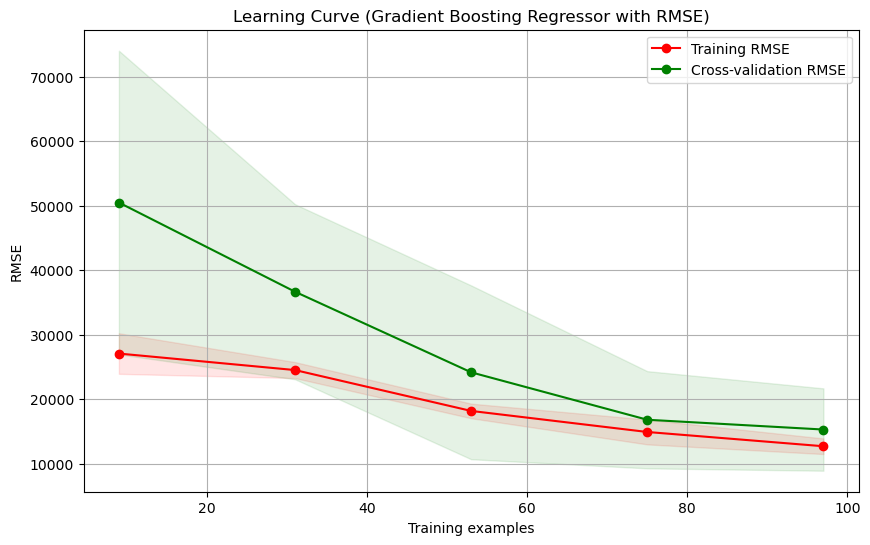

In [ ]:
# Plot the learning curve using RMSE
plot_learning_curve_rmse(rf, "Learning Curve (Gradient Boosting Regressor with RMSE)", X3_train_mean, y3_train_mean, cv=10)


#### Median Fill

In [1189]:
# initialise random forest regressor
rf = GradientBoostingRegressor(max_depth=7, min_samples_leaf=5, min_samples_split=10, n_estimators=25,random_state=42)

# fit the model
rf.fit(X3_train_median, y3_train_median)

# predict the model
y3_pred = rf.predict(X3_test_median)

# predict the training set
y3_train_pred = rf.predict(X3_train_median)

# calculate the mean squared error for training set
mse3_train = mean_squared_error(y3_train_median, y3_train_pred)
print("Training MSE: %.4f" % mse3_train)

# calculate the root mean squared error for training set
rmse3_train = np.sqrt(mse3_train)
print("Training RMSE: %.4f" % rmse3_train)

# calculate the mean squared error
mse3 = mean_squared_error(y3_test_median, y3_pred)
print("Testing MSE: %.4f" % mse3)

# calculate the root mean squared error
rmse3 = np.sqrt(mse3)
print("Testing RMSE: %.4f" % rmse3)

#calculate r2 score for training
r2_3_train = r2_score(y3_train_median, y3_train_pred)
print("Training R2: %.4f" % r2_3_train)

# calculate r2 score
r2_3 = r2_score(y3_test_median, y3_pred)
print("Testing R2: %.4f" % r2_3)

# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(rf.feature_importances_, X3_train_median.columns), reverse=True):
    print(name, importance)


Training MSE: 45698289.5222
Training RMSE: 6760.0510
Testing MSE: 49399378.7042
Testing RMSE: 7028.4692
Training R2: 0.9848
Training Adjusted R2: 1.0388
Testing R2: 0.9595
Testing Adjusted R2: 1.0124
Feature importances:
% who are economically inactive - aged 16+ 0.2786388796072058
% in employment working part-time - aged 25-49 0.1383859995382571
Full Time Workers  - median_annual 0.08757934903778537
Unemployment rate - aged 16+ 0.07856924444463106
Female Full Time Workers  - median_weekly 0.07715141047837905
Full Time Workers - mean_annual 0.056999027441758485
Female Full Time Workers  - median_annual 0.05464576810698617
Female Full Time Workers - mean_hourly 0.020608169084865503
temp 0.015415988850865685
visibility 0.01366836294781754
feelslike 0.013214453832130872
humidity 0.01252123457334183
uvindex 0.012470493485400537
Male Full Time Workers - mean_hourly 0.011779239720091204
Female Full Time Workers  - mean_weekly 0.010622445694139624
Education, Skills and Training - Average scor

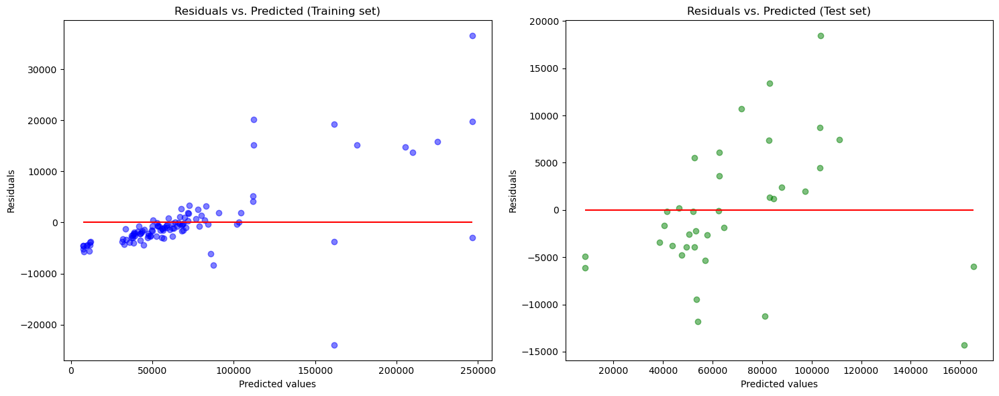

In [1335]:
# Calculate residuals for training set
residuals_train = y3_train_median - y3_train_pred

# Calculate residuals for test set
residuals_test = y3_test_median - y3_pred

# Create a subplot of 2 plots
fig, ax = plt.subplots(1, 2, figsize=(15,6))

# Plot residuals vs predicted values for training set
ax[0].scatter(y3_train_pred, residuals_train, color='blue', alpha=0.5)
ax[0].hlines(y=0, xmin=y3_train_pred.min(), xmax=y3_train_pred.max(), color='red')
ax[0].set_title('Residuals vs. Predicted (Training set)')
ax[0].set_xlabel('Predicted values')
ax[0].set_ylabel('Residuals')

# Plot residuals vs predicted values for test set
ax[1].scatter(y3_pred, residuals_test, color='green', alpha=0.5)
ax[1].hlines(y=0, xmin=y3_pred.min(), xmax=y3_pred.max(), color='red')
ax[1].set_title('Residuals vs. Predicted (Test set)')
ax[1].set_xlabel('Predicted values')
ax[1].set_ylabel('Residuals')

# Show the plots
plt.tight_layout()
plt.show()


#### KNN Fill

In [1188]:
# initialise random forest regressor
rf = GradientBoostingRegressor(learning_rate=0.009, max_depth=15, min_samples_leaf=6,
                          min_samples_split=12, n_estimators=200,
                          random_state=42)

# fit the model
rf.fit(X_train_imputed, y_train_imputed)

# predict the model
y3_pred = rf.predict(X_test_imputed)

# predict the training set
y3_train_pred = rf.predict(X_train_imputed)

# calculate the mean squared error for training set
mse3_train = mean_squared_error(y_train_imputed, y3_train_pred)
print("Training MSE: %.4f" % mse3_train)

# calculate the root mean squared error for training set
rmse3_train = np.sqrt(mse3_train)
print("Training RMSE: %.4f" % rmse3_train)

# calculate the mean squared error
mse3 = mean_squared_error(y_test_imputed, y3_pred)
print("Testing MSE: %.4f" % mse3)

# calculate the root mean squared error
rmse3 = np.sqrt(mse3)
print("Testing RMSE: %.4f" % rmse3)

#calculate r2 score for training
r2_3_train = r2_score(y_train_imputed, y3_train_pred)
print("Training R2: %.4f" % r2_3_train)

# calculate r2 score
r2_3 = r2_score(y_test_imputed, y3_pred)
print("Testing R2: %.4f" % r2_3)

# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(rf.feature_importances_, X_train_imputed.columns), reverse=True):
    print(name, importance)


Training MSE: 104483969.3001
Training RMSE: 10221.7400
Testing MSE: 271122009.3560
Testing RMSE: 16465.7830
Training R2: 0.9607
Testing R2: 0.8940
Feature importances:
Male Full Time Workers - mean_annual 0.4530161246093269
start_number_of_docks 0.22678248298747078
start_number_of_empty_docks 0.12210044642746001
duration_minutes 0.04281239926465525
humidity 0.018852305429078512
start_number_standard_bikes 0.018693157541170003
cloudcover 0.016733253315388868
average_house_price 0.012904029876094814
feelslike 0.00925189681228838
temp 0.006496558485417206
start_number_of_bikes 0.005316597938697699
dew 0.0047795048423435816
% with other qualifications (NVQ) - aged 16-64 0.003456533259450441
Part Time Workers - mean_annual 0.0034342543598451887
Unemployment rate - aged 16+ 0.0029527801300979
start_number_ebikes 0.002841774658831155
Living Environment - Rank of average score 0.002272895012665473
start_month 0.0021136046153995385
windspeed 0.0020952091516386086
Male Full Time Workers  - media

# Final Model for Gradient Boost Regressor

#### Pre-process

In [1396]:
#Remove end of line whhite space from column names
X3_train_median.columns = X3_train_median.columns.str.strip()

#Remove end of line whhite space from column names
X3_test_median.columns = X3_test_median.columns.str.strip()

In [1397]:
X_train_imputed = X3_train_median[['% who are economically inactive - aged 16+',
'% in employment working part-time - aged 25-49',
'Full Time Workers  - median_annual',
'Unemployment rate - aged 16+',
'Female Full Time Workers  - median_weekly',
'Full Time Workers - mean_annual',
'Female Full Time Workers  - median_annual',
'Female Full Time Workers - mean_hourly',
'temp',
'visibility',
'feelslike',
'humidity',
'uvindex',
'Male Full Time Workers - mean_hourly',
'Female Full Time Workers  - mean_weekly',
'Education, Skills and Training - Average score',
'dew',
'% of all 16+ who are aged 50-64',
'start_number_of_empty_docks',
'Barriers to Housing and Services - Proportion  of LSOAs in most deprived 10% nationally',
'start_number_of_docks',
'Male Full Time Workers  - median_hourly',
'average_house_price',
'% with NVQ2 only - aged 16-64',
'% with NVQ1 only - aged 16-64',
'% with other qualifications (NVQ) - aged 16-64',
'start_number_ebikes',
'Barriers to Housing and Services - Average rank',
'start_number_of_bikes',
'Economic activity rate - aged 16+',
'Income scale',
'% of all 16+ who are aged 20-24',
'Living Environment - Rank of average rank',
'Living Environment - Proportion  of LSOAs in most deprived 10% nationally',
'start_number_standard_bikes',
'Health Deprivation and Disability - Average score',
'Male Part Time Workers  - mean_weekly',
'duration_minutes',
'Living Environment - Average rank',
'% with no qualifications (NVQ) - aged 16-64',
'Female Part Time Workers  - median_weekly',
'Living Environment - Average score',
'% in employment who are employees - aged 16+',
'Living Environment - Rank of proportion of LSOAs in most deprived 10% nationally',
'cloudcover',
'% of all 16+ who are aged 16-19',
'IDAOPI - Average score',
'holiday',
'IDACI - Rank of average rank',
'start_month',
'Male Part Time Workers - mean_hourly',
'IDAOPI - Rank of average score',
'Employment - Average score',
'% in employment working full-time - aged 20-24',
'precip',
'windspeed',
'Income - Average rank',
'IDACI - Rank of proportion of LSOAs in most deprived 10% nationally',
'% with NVQ3 only - aged 16-64',
'Part Time Workers  - median_weekly',
'% in employment working part-time - aged 50+',
'% of all 16+ who are aged 25-34']]

In [1398]:
X_test_imputed = X3_test_median[['% who are economically inactive - aged 16+',
'% in employment working part-time - aged 25-49',
'Full Time Workers  - median_annual',
'Unemployment rate - aged 16+',
'Female Full Time Workers  - median_weekly',
'Full Time Workers - mean_annual',
'Female Full Time Workers  - median_annual',
'Female Full Time Workers - mean_hourly',
'temp',
'visibility',
'feelslike',
'humidity',
'uvindex',
'Male Full Time Workers - mean_hourly',
'Female Full Time Workers  - mean_weekly',
'Education, Skills and Training - Average score',
'dew',
'% of all 16+ who are aged 50-64',
'start_number_of_empty_docks',
'Barriers to Housing and Services - Proportion  of LSOAs in most deprived 10% nationally',
'start_number_of_docks',
'Male Full Time Workers  - median_hourly',
'average_house_price',
'% with NVQ2 only - aged 16-64',
'% with NVQ1 only - aged 16-64',
'% with other qualifications (NVQ) - aged 16-64',
'start_number_ebikes',
'Barriers to Housing and Services - Average rank',
'start_number_of_bikes',
'Economic activity rate - aged 16+',
'Income scale',
'% of all 16+ who are aged 20-24',
'Living Environment - Rank of average rank',
'Living Environment - Proportion  of LSOAs in most deprived 10% nationally',
'start_number_standard_bikes',
'Health Deprivation and Disability - Average score',
'Male Part Time Workers  - mean_weekly',
'duration_minutes',
'Living Environment - Average rank',
'% with no qualifications (NVQ) - aged 16-64',
'Female Part Time Workers  - median_weekly',
'Living Environment - Average score',
'% in employment who are employees - aged 16+',
'Living Environment - Rank of proportion of LSOAs in most deprived 10% nationally',
'cloudcover',
'% of all 16+ who are aged 16-19',
'IDAOPI - Average score',
'holiday',
'IDACI - Rank of average rank',
'start_month',
'Male Part Time Workers - mean_hourly',
'IDAOPI - Rank of average score',
'Employment - Average score',
'% in employment working full-time - aged 20-24',
'precip',
'windspeed',
'Income - Average rank',
'IDACI - Rank of proportion of LSOAs in most deprived 10% nationally',
'% with NVQ3 only - aged 16-64',
'Part Time Workers  - median_weekly',
'% in employment working part-time - aged 50+',
'% of all 16+ who are aged 25-34']]

#### KNN Fill

In [1400]:
# initialise random forest regressor
rf = GradientBoostingRegressor(max_depth=7, min_samples_leaf=5, min_samples_split=10, n_estimators=25,random_state=42)

# fit the model
rf.fit(X_train_imputed, y3_train_median)

# predict the model
y3_pred = rf.predict(X_test_imputed)

# predict the training set
y3_train_pred = rf.predict(X_train_imputed)

# calculate the mean squared error for training set
mse3_train = mean_squared_error(y3_train_median, y3_train_pred)
print("Training MSE: %.4f" % mse3_train)

# calculate the root mean squared error for training set
rmse3_train = np.sqrt(mse3_train)
print("Training RMSE: %.4f" % rmse3_train)

# calculate the mean squared error
mse3 = mean_squared_error(y3_test_median, y3_pred)
print("Testing MSE: %.4f" % mse3)

# calculate the root mean squared error
rmse3 = np.sqrt(mse3)
print("Testing RMSE: %.4f" % rmse3)

#calculate r2 score for training
r2_3_train = r2_score(y3_train_median, y3_train_pred)
print("Training R2: %.4f" % r2_3_train)

# calculate adjusted r2 score for training
adj_r2_3_train = 1 - (1-r2_3_train)*(len(y3_train_median)-1)/(len(y3_train_median)-X3_train_median.shape[1]-1)
print("Training Adjusted R2: %.4f" % adj_r2_3_train)

# calculate r2 score
r2_3 = r2_score(y3_test_median, y3_pred)
print("Testing R2: %.4f" % r2_3)

# calculate adjusted r2 score
adj_r2_3 = 1 - (1-r2_3)*(len(y3_test_median)-1)/(len(y3_test_median)-X3_test_zero.shape[1]-1)
print("Testing Adjusted R2: %.4f" % adj_r2_3)



# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(rf.feature_importances_, X_train_imputed.columns), reverse=True):
    print(name, importance)


Training MSE: 45698289.5222
Training RMSE: 6760.0510
Testing MSE: 47970060.2358
Testing RMSE: 6926.0422
Training R2: 0.9848
Training Adjusted R2: 1.0388
Testing R2: 0.9606
Testing Adjusted R2: 1.0121
Feature importances:
% who are economically inactive - aged 16+ 0.25028807448006885
Full Time Workers - mean_annual 0.1544031839934381
% in employment working part-time - aged 25-49 0.13837860378419803
Unemployment rate - aged 16+ 0.07929939087401025
Female Full Time Workers  - median_weekly 0.07834566617962888
Female Full Time Workers  - mean_weekly 0.07824208224518825
Female Full Time Workers  - median_annual 0.02059327254406516
feelslike 0.018615000513188124
temp 0.016938086775763295
visibility 0.01624594838818484
start_number_of_docks 0.012752627261774728
Female Full Time Workers - mean_hourly 0.012627617306231175
start_number_of_empty_docks 0.012584190807234738
% with NVQ3 only - aged 16-64 0.00954118417327393
Income scale 0.009157164607586591
% of all 16+ who are aged 50-64 0.0088273

#### Feature Importance

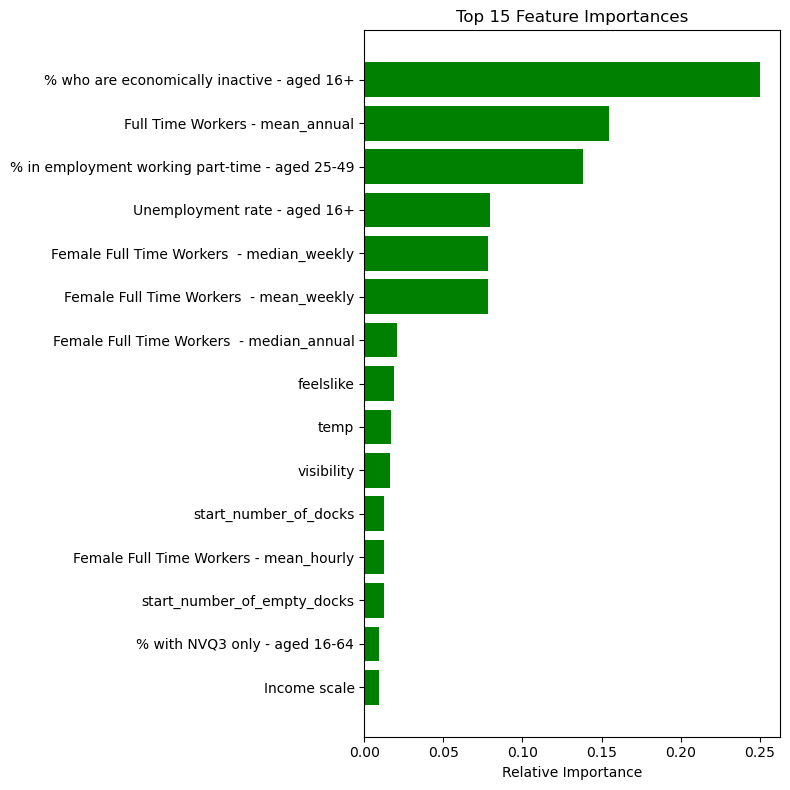

In [1405]:
# Assuming the variable "model" refers to "clf" which is our trained GradientBoostingClassifier
importances = rf.feature_importances_

# Get the indices of the features sorted by importance
indices = np.argsort(importances)[-15:]  # Get the top 15

features = X_train_imputed.columns

# Plot the top 15 feature importances
plt.figure(figsize=(8, 8))
plt.title('Top 15 Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='g', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.tight_layout()
plt.show()

#### SHAP Values

In [1288]:
# Initialize the explainer
explainer = shap.TreeExplainer(rf)

# Compute SHAP values for a set of samples (e.g., X_test_final)
shap_values = explainer.shap_values(X_test_imputed)

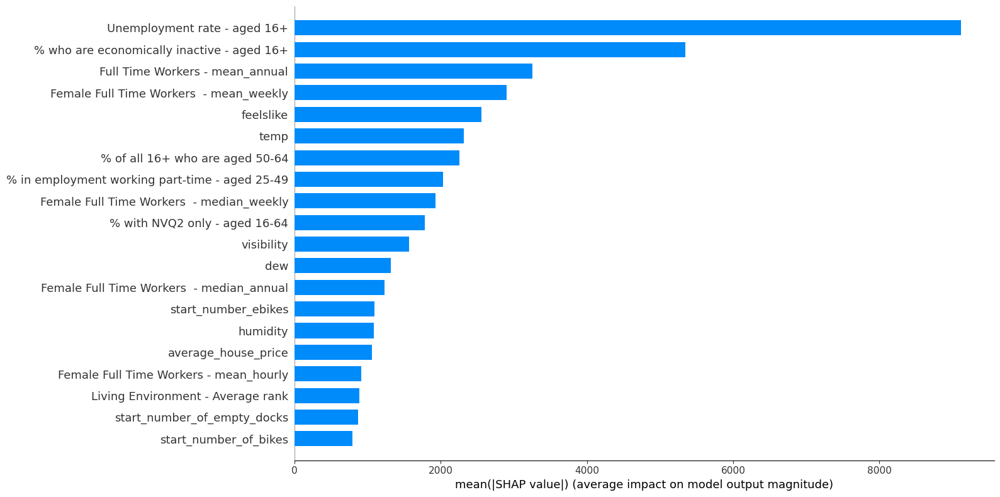

In [1289]:

shap.summary_plot(shap_values, X_test_imputed.values, plot_type="bar", feature_names = X_test_imputed.columns, plot_size=(16, 8))

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


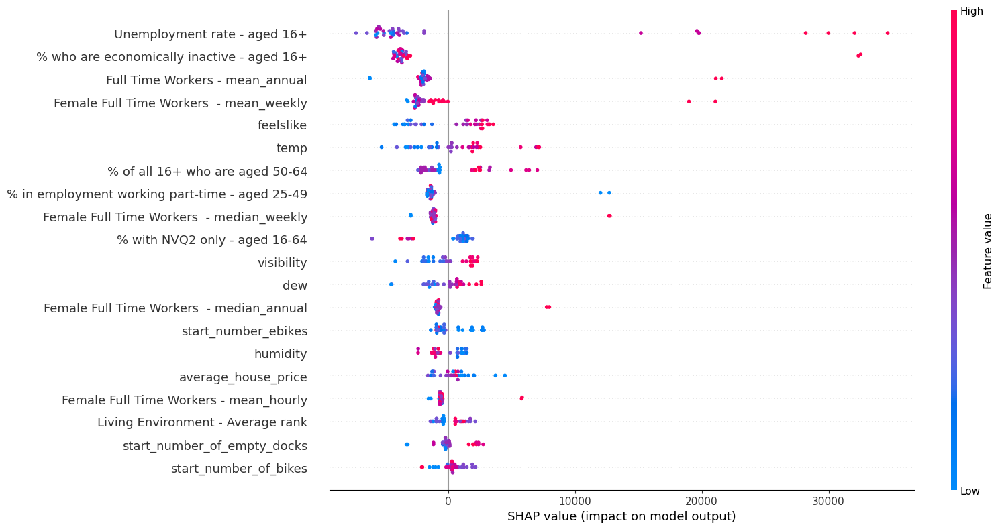

In [1290]:
shap.summary_plot(shap_values, X_test_imputed, plot_size=[16,8])

In [1291]:
# Average the SHAP values across instances
average_shap_values = np.mean(shap_values, axis=0)

# Print the averaged SHAP values along with feature names
for feature_name, value in zip(X_train_imputed.columns, average_shap_values):
    print(f"{feature_name}: {value}")


% who are economically inactive - aged 16+: -1744.5295484063029
% in employment working part-time - aged 25-49: -657.7553115676044
Full Time Workers  - median_annual: -264.94537693064916
Unemployment rate - aged 16+: 1954.1568227232335
Female Full Time Workers  - median_weekly: -511.1720695940123
Full Time Workers - mean_annual: -884.2571506400097
Female Full Time Workers  - median_annual: -359.73956684990617
Female Full Time Workers - mean_hourly: -269.05534766784245
temp: 492.2969620625303
visibility: 24.97585040866499
feelslike: 253.23065068157146
humidity: -113.55747271509732
uvindex: 3.7117849043148854
Male Full Time Workers - mean_hourly: 0.0
Female Full Time Workers  - mean_weekly: -677.4572345507041
Education, Skills and Training - Average score: 1.2434870406239231
dew: -208.62462195145596
% of all 16+ who are aged 50-64: 353.86876533078066
start_number_of_empty_docks: 130.6389911651894
Barriers to Housing and Services - Proportion  of LSOAs in most deprived 10% nationally: 94.

% who are economically inactive - aged 16+: A negative SHAP value of -1744.53 indicates that, in regions where a higher percentage of people (aged 16+) are economically inactive, the model predicts about 1744.53 fewer pickups on average.

% in employment working part-time - aged 25-49: A negative value of -657.76 suggests that a higher percentage of people (aged 25-49) working part-time leads to around 657.76 fewer pickups.

Unemployment rate - aged 16+: This positive value of 1954.16 suggests that areas with a higher unemployment rate among those aged 16+ tend to have around 1954.16 more pickups on average.

temp: A value of 492.30 indicates that as temperature rises, the model predicts approximately 492.30 more pickups. This could suggest that people might be more likely to use the service in warmer conditions.

start_number_of_empty_docks: A positive value of 130.64 means that having more empty docks at the start can increase the predicted pickups by around 130.64.

average_house_price: The positive value of 315.51 indicates that in areas with more expensive houses, there are around 315.51 more pickups predicted. This could perhaps reflect a higher disposable income or different transportation preferences in these areas.

duration_minutes: A negative value of -331.31 suggests that longer durations might result in around 331.31 fewer pickups.

holiday: The negative value of -33.97 suggests that on holidays, there are about 33.97 fewer pickups.

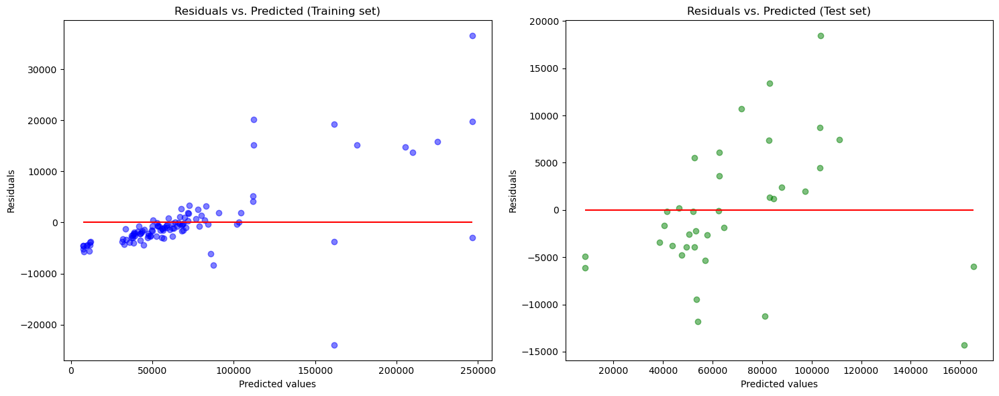

In [1201]:

# Calculate residuals for training set
residuals_train = y3_train_zero - y3_train_pred

# Calculate residuals for test set
residuals_test = y3_test_zero - y3_pred

# Create a subplot of 2 plots
fig, ax = plt.subplots(1, 2, figsize=(15,6))

# Plot residuals vs predicted values for training set
ax[0].scatter(y3_train_pred, residuals_train, color='blue', alpha=0.5)
ax[0].hlines(y=0, xmin=y3_train_pred.min(), xmax=y3_train_pred.max(), color='red')
ax[0].set_title('Residuals vs. Predicted (Training set)')
ax[0].set_xlabel('Predicted values')
ax[0].set_ylabel('Residuals')

# Plot residuals vs predicted values for test set
ax[1].scatter(y3_pred, residuals_test, color='green', alpha=0.5)
ax[1].hlines(y=0, xmin=y3_pred.min(), xmax=y3_pred.max(), color='red')
ax[1].set_title('Residuals vs. Predicted (Test set)')
ax[1].set_xlabel('Predicted values')
ax[1].set_ylabel('Residuals')

# Show the plots
plt.tight_layout()
plt.show()


# Regression models (Other-Experiments)

### Decision Tree

#### Mean Fill

In [ ]:
# Train a decision tree regressor model on the training set with grid search and validation
model = DecisionTreeRegressor(random_state=42)

# Define the parameters to search
param_grid = {
    'max_depth': [3, 5, 7, 8, 9, 10, 11, 12, None],
    'min_samples_split': [2, 3, 4, 5, 6, 7, 10, 11, 12, 13],
    'min_samples_leaf': [2, 3, 4, 5, 6, 7, 8, 10, 11, 12]
}

# Define the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

# Execute the grid search
grid_search.fit(X_train_2019_mean, y_train_2019_mean)

# Print the best parameters
print(grid_search.best_params_)
print(grid_search.best_score_)

# Predict using the best model on the test set
y_pred = grid_search.predict(X_test_2019_mean)
y_pred_train = grid_search.predict(X_train_2019_mean)

# Print the r2 score for training and testing
print(r2_score(y_train_2019_mean, y_pred_train))
print(r2_score(y_test_2019_mean, y_pred))

# Compute the RMSE on the training and test sets
rmse_train = np.sqrt(mean_squared_error(y_train_2019_mean, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test_2019_mean, y_pred))
print('Root Mean Squared Error (Training, Testing):', rmse_train, rmse_test)

# Print summary of the best model
print(grid_search.best_estimator_)


{'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5}
-153296909.6811594
0.9912258254465162
0.9187715301747138
Mean Squared Error (training, testing): 5028.030995964206 10038.423159632624
DecisionTreeRegressor(max_depth=10, min_samples_leaf=2, min_samples_split=5,
                      random_state=42)


In [ ]:
# Print the feature importances in descending order
feature_importances = sorted(zip(grid_search.best_estimator_.feature_importances_, X_train_2019_mean.columns), reverse=True)
for importance, feature in feature_importances:
    print(f'Feature: {feature}, Importance: {importance:.4f}')


[(0.7165904979587036, 'Female Full Time Workers  - mean_weekly'),
 (0.08954130769648767, 'borough_code_E09000025'),
 (0.06533178230072201, 'Unemployment rate - aged 16+'),
 (0.04687387616255801, 'temp'),
 (0.029582338486864333, 'feelslike'),
 (0.020306182316632677, '% of all 16+ who are aged 50-64'),
 (0.012005729547415286, 'humidity'),
 (0.004763539388397125,
  'Living Environment - Rank of proportion of LSOAs in most deprived 10% nationally '),
 (0.0046145975186904446, 'Living Environment - Average rank '),
 (0.004219497950043474, 'start_number_of_empty_docks'),
 (0.0022355836989240655, 'visibility'),
 (0.0012223267478899248, 'holiday'),
 (0.0008932063914671752, 'average_house_price'),
 (0.0007218186768406169, 'dew'),
 (0.00034320120900292576, 'windspeed'),
 (0.0002746912779904955, 'cloudcover'),
 (0.00022530954109796747, 'duration_minutes'),
 (0.00019538558771044597, 'start_month'),
 (2.5758865943317635e-05, 'start_number_of_bikes'),
 (2.2203106794890714e-05, 'Employment - Rank of a

#### KNN Fill

In [ ]:
# Initialize the DecisionTreeRegressor model with a fixed random state
model = DecisionTreeRegressor(random_state=42)

# Define the parameters to search using grid search
param_grid = {
    'max_depth': [3, 5, 7, 8, 9, 10, 11, 12, None],
    'min_samples_split': [2, 3, 4, 5, 6, 7, 10, 11, 12, 13],
    'min_samples_leaf': [2, 3, 4, 5, 6, 7, 8, 10, 11, 12]
}

# Initialize the grid search with cross-validation and using negative mean squared error as the scoring metric
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

# Execute the grid search on the training data
grid_search.fit(X_train_2019_knn, y_train_2019_knn)

# Print the best parameters and the corresponding score
print("Best Parameters:", grid_search.best_params_)
print("Best Negative Mean Squared Error Score:", grid_search.best_score_)

# Make predictions using the trained model on the test set
y_pred = grid_search.predict(X_test_2019_knn)

# Make predictions on the training set as well
y_pred_train = grid_search.predict(X_train_2019_knn)

# Print the R-squared scores for training and test sets
print("R-squared Score (Training):", r2_score(y_train_2019_knn, y_pred_train))
print("R-squared Score (Testing):", r2_score(y_test_2019_knn, y_pred))

# Compute the RMSE on the training and test sets
rmse_train = np.sqrt(mean_squared_error(y_train_2019_knn, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test_2019_knn, y_pred))
print('Root Mean Squared Error (Training, Testing):', rmse_train, rmse_test)

# Print summary of the best estimator from the grid search
print("Best Estimator from Grid Search:", grid_search.best_estimator_)


{'max_depth': 8, 'min_samples_leaf': 2, 'min_samples_split': 2}
-141579732.50033832
0.9968907697641166
0.8408852011128065
Mean Squared Error (training, testing): 2993.1001759605247 14049.687030055815
DecisionTreeRegressor(max_depth=8, min_samples_leaf=2, random_state=42)


In [ ]:
# print the feature importances in descending order
sorted(zip(grid_search.best_estimator_.feature_importances_, X_train_2019_knn.columns), reverse=True)

[(0.7125183915729476, 'Female Full Time Workers  - mean_weekly'),
 (0.08903247910903295, 'borough_code_E09000025'),
 (0.06496052707384219, 'Unemployment rate - aged 16+'),
 (0.05062757846975975, 'start_number_of_empty_docks'),
 (0.025935157113092838, '% of all 16+ who are aged 50-64'),
 (0.017696182466604895, 'humidity'),
 (0.01194898538814158, 'feelslike'),
 (0.011192815910278852, 'temp'),
 (0.004612283190268555, 'uvindex'),
 (0.0038109721906669884, '% of all 16+ who are aged 20-24'),
 (0.0029279105928829725, 'Part Time Workers  - median_weekly'),
 (0.0012624102928341428, 'average_house_price'),
 (0.0009849888969181975, 'start_month'),
 (0.0006967524579141365, '% with no qualifications (NVQ) - aged 16-64'),
 (0.0005014834163068876, 'duration_minutes'),
 (0.00029256100791200644, 'start_number_standard_bikes'),
 (0.00028772238515524675, 'visibility'),
 (0.00021092599643807188, 'holiday'),
 (0.00020820362802069384, 'Female Part Time Workers  - median_weekly'),
 (0.00019238240337872794, '

### Random Forest

#### Zero Fill

In [ ]:
# Initialize the model
model = RandomForestRegressor(random_state=42)

# Define the initial parameters to search
param_grid = {
    'n_estimators': [5, 10, 20, 30, 40, 50, 60, 80, 100, 110],
    'max_depth': [5, 6, 8, 9, 10],
    'min_samples_split': [2, 3, 4, 5, 6],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

overfitting = True
iteration = 0
max_iterations = 20


while overfitting and iteration < max_iterations:

    print('param_grid',iteration,":", param_grid)

    # Fit the grid search
    grid_search.fit(X_train_2019_zero, y_train_2019_zero)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X_train_2019_zero)
    y_pred_test = grid_search.predict(X_test_2019_zero)

    # Compute the R2 scores
    train_r2 = r2_score(y_train_2019_zero, y_pred_train)
    test_r2 = r2_score(y_test_2019_zero, y_pred_test)
    
    print(train_r2, test_r2)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_r2 - test_r2) < 0.05:
        overfitting = False
    else:
        # Adjust the parameters and repeat the grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d-1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s+1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l+1 for l in param_grid['min_samples_leaf']]
        param_grid['n_estimators'] = [random.randint(5, 150) if n >= 150 else n+10 for n in param_grid['n_estimators']]

        
        print('param_grid',iteration,":", param_grid)
        

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Compute and print the RMSE
print("Train RMSE:", np.sqrt(mean_squared_error(y_train_2019_zero, y_pred_train)))
print("Test RMSE:", np.sqrt(mean_squared_error(y_test_2019_zero, y_pred_test)))


param_grid 0 : {'n_estimators': [5, 10, 20, 30, 40, 50, 60, 80, 100, 110], 'max_depth': [5, 6, 8, 9, 10], 'min_samples_split': [2, 3, 4, 5, 6], 'min_samples_leaf': [1, 2, 3, 4, 5, 6]}
0.9944861456584129 0.9025082305431995
param_grid 0 : {'n_estimators': [15, 20, 30, 40, 50, 60, 70, 90, 110, 120], 'max_depth': [4, 5, 7, 8, 9], 'min_samples_split': [3, 4, 5, 6, 7], 'min_samples_leaf': [2, 3, 4, 5, 6, 7]}
param_grid 1 : {'n_estimators': [15, 20, 30, 40, 50, 60, 70, 90, 110, 120], 'max_depth': [4, 5, 7, 8, 9], 'min_samples_split': [3, 4, 5, 6, 7], 'min_samples_leaf': [2, 3, 4, 5, 6, 7]}
0.988155962741354 0.8979317728067938
param_grid 1 : {'n_estimators': [25, 30, 40, 50, 60, 70, 80, 100, 120, 130], 'max_depth': [3, 4, 6, 7, 8], 'min_samples_split': [4, 5, 6, 7, 8], 'min_samples_leaf': [3, 4, 5, 6, 7, 8]}
param_grid 2 : {'n_estimators': [25, 30, 40, 50, 60, 70, 80, 100, 120, 130], 'max_depth': [3, 4, 6, 7, 8], 'min_samples_split': [4, 5, 6, 7, 8], 'min_samples_leaf': [3, 4, 5, 6, 7, 8]}
0.9

In [ ]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X_train_2019_zero.columns), reverse=True):
    print(name, importance)

Feature importances:
% who are economically inactive - aged 16+ 0.08966479956855501
Economic activity rate - aged 16+ 0.08155410607499625
Female Full Time Workers  - median_annual 0.06646568486829751
borough_code_E09000033 0.06075700908330132
Female Full Time Workers - mean_hourly 0.0452656072061526
Full Time Workers - mean_annual 0.04438162525197333
% of all 16+ who are aged 50-64 0.04070640340798826
start_number_of_empty_docks 0.040196749502633494
Full Time Workers  - median_annual 0.0380551128058433
% of all 16+ who are aged 65+ 0.03758382681492164
Male Full Time Workers - mean_annual 0.03723404937749064
Unemployment rate - aged 16+ 0.03419867997729433
Female Full Time Workers  - median_weekly 0.030243157434947304
Health Deprivation and Disability - Rank of average score  0.029360243684338504
Employment - Rank of proportion of LSOAs in most deprived 10% nationally  0.02920330089230813
% in employment working part-time - aged 16-19 0.02672622450696766
average_house_price 0.0238729323

#### Mean Fill

In [ ]:
# Initialize the model
model = RandomForestRegressor(random_state=42)

# Define the initial parameters to search
param_grid = {
    'n_estimators': [5, 10, 20, 30, 40, 50, 60, 80, 100, 110],
    'max_depth': [5, 6, 8, 9, 10],
    'min_samples_split': [2, 3, 4, 5, 6],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

overfitting = True
iteration = 0
max_iterations = 20


while overfitting and iteration < max_iterations:

    print('param_grid',iteration,":", param_grid)

    # Fit the grid search
    grid_search.fit(X_train_2019_mean, y_train_2019_mean)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X_train_2019_mean)
    y_pred_test = grid_search.predict(X_test_2019_mean)

    # Compute the mean squared error scores
    train_ms = np.sqrt(mean_squared_error(y_train_2019_mean, y_pred_train))
    test_ms = np.sqrt(mean_squared_error(y_test_2019_mean, y_pred_test))
    
    print(train_ms, test_ms)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_ms - test_ms) < 100:
        overfitting = False
    else:
        # Adjust the parameters and repeat the grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d-1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s+1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l+1 for l in param_grid['min_samples_leaf']]
        param_grid['n_estimators'] = [random.randint(5, 150) if n >= 150 else n+10 for n in param_grid['n_estimators']]

        
        print('param_grid',iteration,":", param_grid)
        

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Compute and print the RMSE
print("Train RMSE:", np.sqrt(mean_squared_error(y_train_2019_mean, y_pred_train)))
print("Test RMSE:", np.sqrt(mean_squared_error(y_test_2019_mean, y_pred_test)))


param_grid 0 : {'n_estimators': [5, 10, 20, 30, 40, 50, 60, 80, 100, 110], 'max_depth': [5, 6, 8, 9, 10], 'min_samples_split': [2, 3, 4, 5, 6], 'min_samples_leaf': [1, 2, 3, 4, 5, 6]}


3219.877957477539 10948.4017455366
param_grid 0 : {'n_estimators': [15, 20, 30, 40, 50, 60, 70, 90, 110, 120], 'max_depth': [4, 5, 7, 8, 9], 'min_samples_split': [3, 4, 5, 6, 7], 'min_samples_leaf': [2, 3, 4, 5, 6, 7]}
param_grid 1 : {'n_estimators': [15, 20, 30, 40, 50, 60, 70, 90, 110, 120], 'max_depth': [4, 5, 7, 8, 9], 'min_samples_split': [3, 4, 5, 6, 7], 'min_samples_leaf': [2, 3, 4, 5, 6, 7]}
5129.211882921702 11512.051541713101
param_grid 1 : {'n_estimators': [25, 30, 40, 50, 60, 70, 80, 100, 120, 130], 'max_depth': [3, 4, 6, 7, 8], 'min_samples_split': [4, 5, 6, 7, 8], 'min_samples_leaf': [3, 4, 5, 6, 7, 8]}
param_grid 2 : {'n_estimators': [25, 30, 40, 50, 60, 70, 80, 100, 120, 130], 'max_depth': [3, 4, 6, 7, 8], 'min_samples_split': [4, 5, 6, 7, 8], 'min_samples_leaf': [3, 4, 5, 6, 7, 8]}
8927.3179407903 13480.046483565488
param_grid 2 : {'n_estimators': [35, 40, 50, 60, 70, 80, 90, 110, 130, 140], 'max_depth': [2, 3, 5, 6, 7], 'min_samples_split': [5, 6, 7, 8, 9], 'min_sampl

In [ ]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X_train_2019_mean.columns), reverse=True):
    print(name, importance)

Feature importances:
% in employment working part-time - aged 25-49 0.09538689790524495
borough_code_E09000033 0.09313827972567766
Female Full Time Workers  - median_annual 0.07843165689798891
Male Full Time Workers - mean_annual 0.07697013549986147
% who are economically inactive - aged 16+ 0.0764562017686476
Economic activity rate - aged 16+ 0.06715710549379877
Female Full Time Workers  - median_weekly 0.0608947117467988
Unemployment rate - aged 16+ 0.05940332742624823
Full Time Workers - mean_annual 0.057963994580740835
Female Full Time Workers  - mean_weekly 0.046428611285165185
Full Time Workers  - median_annual 0.04457624600481581
Female Full Time Workers - mean_hourly 0.0375582711914222
feelslike 0.012432423149910478
temp 0.01199610927332782
% with NVQ4+ - aged 16-64 0.010814895424650611
start_number_of_empty_docks 0.010772149070276734
humidity 0.010343904466806447
% of all 16+ who are aged 50-64 0.010302085572452378
% with NVQ2 only - aged 16-64 0.008706188969813107
duration_mi

#### KNN Fill

In [ ]:
# Initialize the model
model = RandomForestRegressor(random_state=42)

# Define the initial parameters to search
param_grid = {
    'n_estimators': [5, 10, 20, 30, 40, 50, 60, 80, 100, 110],
    'max_depth': [5, 6, 8, 9, 10],
    'min_samples_split': [2, 3, 4, 5, 6],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

overfitting = True
iteration = 0
max_iterations = 20


while overfitting and iteration < max_iterations:

    print('param_grid',iteration,":", param_grid)

    # Fit the grid search
    grid_search.fit(X_train_2019_knn, y_train_2019_knn)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X_train_2019_knn)
    y_pred_test = grid_search.predict(X_test_2019_knn)
    
    # Compute the mean squared error scores
    train_ms = np.sqrt(mean_squared_error(y_train_2019_knn, y_pred_train))
    test_ms = np.sqrt(mean_squared_error(y_test_2019_knn, y_pred_test))
    
    print(train_ms, test_ms)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_ms - test_ms) < 100:
        overfitting = False
    else:
        # Adjust the parameters and repeat the grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d-1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s+1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l+1 for l in param_grid['min_samples_leaf']]
        param_grid['n_estimators'] = [random.randint(5, 150) if n >= 150 else n+10 for n in param_grid['n_estimators']]

        
        print('param_grid',iteration,":", param_grid)
        

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Compute and print the RMSE
print("Train RMSE:", np.sqrt(mean_squared_error(y_train_2019_knn, y_pred_train)))
print("Test RMSE:", np.sqrt(mean_squared_error(y_test_2019_knn, y_pred_test)))


param_grid 0 : {'n_estimators': [5, 10, 20, 30, 40, 50, 60, 80, 100, 110], 'max_depth': [5, 6, 8, 9, 10], 'min_samples_split': [2, 3, 4, 5, 6], 'min_samples_leaf': [1, 2, 3, 4, 5, 6]}


3637.177544052688 10025.364242336214
param_grid 0 : {'n_estimators': [15, 20, 30, 40, 50, 60, 70, 90, 110, 120], 'max_depth': [4, 5, 7, 8, 9], 'min_samples_split': [3, 4, 5, 6, 7], 'min_samples_leaf': [2, 3, 4, 5, 6, 7]}
param_grid 1 : {'n_estimators': [15, 20, 30, 40, 50, 60, 70, 90, 110, 120], 'max_depth': [4, 5, 7, 8, 9], 'min_samples_split': [3, 4, 5, 6, 7], 'min_samples_leaf': [2, 3, 4, 5, 6, 7]}
5823.977603425593 10791.19697121527
param_grid 1 : {'n_estimators': [25, 30, 40, 50, 60, 70, 80, 100, 120, 130], 'max_depth': [3, 4, 6, 7, 8], 'min_samples_split': [4, 5, 6, 7, 8], 'min_samples_leaf': [3, 4, 5, 6, 7, 8]}
param_grid 2 : {'n_estimators': [25, 30, 40, 50, 60, 70, 80, 100, 120, 130], 'max_depth': [3, 4, 6, 7, 8], 'min_samples_split': [4, 5, 6, 7, 8], 'min_samples_leaf': [3, 4, 5, 6, 7, 8]}
8966.07740310508 13605.44492383793
param_grid 2 : {'n_estimators': [35, 40, 50, 60, 70, 80, 90, 110, 130, 140], 'max_depth': [2, 3, 5, 6, 7], 'min_samples_split': [5, 6, 7, 8, 9], 'min_samp

In [ ]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X_train_2019_knn.columns), reverse=True):
    print(name, importance)

Feature importances:
% in employment working part-time - aged 25-49 0.16018834010345925
borough_code_E09000033 0.14779370460286498
Female Full Time Workers - mean_hourly 0.14755990321405216
Economic activity rate - aged 16+ 0.13303212154863428
Female Full Time Workers  - mean_weekly 0.1045837363744896
Unemployment rate - aged 16+ 0.06191757888898814
% of all 16+ who are aged 50-64 0.02140635378962642
Female Full Time Workers  - median_weekly 0.017348872267743096
start_number_of_empty_docks 0.015906413483514653
temp 0.013937379885367054
feelslike 0.01166625536888433
% with NVQ4+ - aged 16-64 0.01097060258467735
start_number_of_docks 0.00796483591081904
humidity 0.007691841680422011
duration_minutes 0.007475973290800384
% with NVQ2 only - aged 16-64 0.006815705332426909
start_number_ebikes 0.0067922391550918225
dew 0.006516426332434408
uvindex 0.006437031557959246
visibility 0.006389031874349052
start_number_standard_bikes 0.005282727353762111
Living Environment - Average score  0.004394

### Gradient Boost

#### Zero Fill

In [ ]:
# Initialize the model
model = GradientBoostingRegressor(random_state=42)

# Define the initial parameters to search
param_grid = {
    'n_estimators': [10,20,50,80,120,130,180,220],
    'max_depth': [3,4,5, 6, 8, 9, 10,15,20,25,30],
    'min_samples_split': [6,7,8,9,10,12,13,15,18,20,25,28,30,32],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6,7,8,10,13,14,15,18,20,25,29,30,25]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

overfitting = True
iteration = 0
max_iterations = 10


while overfitting and iteration < max_iterations:

    print('param_grid',iteration,":", param_grid)

    # Fit the grid search
    grid_search.fit(X_train_2019_zero, y_train_2019_zero)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X_train_2019_zero)
    y_pred_test = grid_search.predict(X_test_2019_zero)

    # Compute the R2 scores
    train_r2 = r2_score(y_train_2019_zero, y_pred_train)
    test_r2 = r2_score(y_test_2019_zero, y_pred_test)
    
    print(train_r2, test_r2)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_r2 - test_r2) < 0.05:
        overfitting = False
    else:
        # Adjust the parameters and repeat the grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d-1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s+1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l+1 for l in param_grid['min_samples_leaf']]
        param_grid['n_estimators'] = [random.randint(5, 150) if n >= 150 else n+10 for n in param_grid['n_estimators']]

        
        print('param_grid',iteration,":", param_grid)
        

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Compute and print the RMSE
print("Train RMSE:", np.sqrt(mean_squared_error(y_train_2019_zero, y_pred_train)))
print("Test RMSE:", np.sqrt(mean_squared_error(y_test_2019_zero, y_pred_test)))


param_grid 0 : {'n_estimators': [10, 20, 50, 80, 120, 130, 180, 220], 'max_depth': [3, 4, 5, 6, 8, 9, 10, 15, 20, 25, 30], 'min_samples_split': [6, 7, 8, 9, 10, 12, 13, 15, 18, 20, 25, 28, 30, 32], 'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 10, 13, 14, 15, 18, 20, 25, 29, 30, 25]}


KeyboardInterrupt: 

In [ ]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X_train_2019_zero.columns), reverse=True):
    print(name, importance)

#### Mean Fill

In [ ]:
# Initialize the model
model = GradientBoostingRegressor(random_state=42)

# Define the initial parameters to search
param_grid = {
    'n_estimators': [10,20,50,80,120,130,180,220],
    'max_depth': [3,4,5, 6, 8, 9, 10,15,20,25,30],
    'min_samples_split': [6,7,8,9,10,12,13,15,18,20,25,28,30,32],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6,7,8,10,13,14,15,18,20,25,29,30,25]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

overfitting = True
iteration = 0
max_iterations = 10


while overfitting and iteration < max_iterations:

    print('param_grid',iteration,":", param_grid)

    # Fit the grid search
    grid_search.fit(X_train_2019_mean, y_train_2019_mean)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X_train_2019_mean)
    y_pred_test = grid_search.predict(X_test_2019_mean)

    # Compute the R2 scores
    train_r2 = r2_score(y_train_2019_mean, y_pred_train)
    test_r2 = r2_score(y_test_2019_mean, y_pred_test)
    
    print(train_r2, test_r2)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_r2 - test_r2) < 0.05:
        overfitting = False
    else:
        # Adjust the parameters and repeat the grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d-1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s+1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l+1 for l in param_grid['min_samples_leaf']]
        param_grid['n_estimators'] = [random.randint(5, 150) if n >= 150 else n+10 for n in param_grid['n_estimators']]

        
        print('param_grid',iteration,":", param_grid)
        

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Compute and print the RMSE
print("Train RMSE:", np.sqrt(mean_squared_error(y_train_2019_mean, y_pred_train)))
print("Test RMSE:", np.sqrt(mean_squared_error(y_test_2019_mean, y_pred_test)))


param_grid 0 : {'n_estimators': [110, 120, 122, 124, 126, 128, 127, 130], 'max_depth': [3, 4, 5, 6, 8, 9, 10], 'min_samples_split': [6, 7, 8, 9, 10, 12, 13], 'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 10]}
Fitting 5 folds for each of 3528 candidates, totalling 17640 fits
0.9723007158047705 0.8107316705282912
param_grid 0 : {'n_estimators': [120, 130, 132, 134, 136, 138, 137, 140], 'max_depth': [2, 3, 4, 5, 7, 8, 9], 'min_samples_split': [7, 8, 9, 10, 2, 7, 9], 'min_samples_leaf': [2, 3, 4, 5, 6, 7, 8, 9, 6]}
param_grid 1 : {'n_estimators': [120, 130, 132, 134, 136, 138, 137, 140], 'max_depth': [2, 3, 4, 5, 7, 8, 9], 'min_samples_split': [7, 8, 9, 10, 2, 7, 9], 'min_samples_leaf': [2, 3, 4, 5, 6, 7, 8, 9, 6]}
Fitting 5 folds for each of 3528 candidates, totalling 17640 fits
0.983283989996272 0.8248809394294748
param_grid 1 : {'n_estimators': [130, 140, 142, 144, 146, 148, 147, 150], 'max_depth': [3, 2, 3, 4, 6, 7, 8], 'min_samples_split': [8, 9, 10, 4, 3, 8, 10], 'min_samples_leaf': [

KeyboardInterrupt: 

In [ ]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X_train_2019_mean.columns), reverse=True):
    print(name, importance)

#### KNN Fill

In [ ]:
# train a gradient boosting regressor model on the training set with grid search and validation
model = GradientBoostingRegressor(random_state=42)

# Define the initial parameters to search
param_grid = {
    'n_estimators': [10,20,50,80,120,130,180,220],
    'max_depth': [3,4,5, 6, 8, 9, 10,15,20,25,30],
    'min_samples_split': [6,7,8,9,10,12,13,15,18,20,25,28,30,32],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6,7,8,10,13,14,15,18,20,25,29,30,25]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

overfitting = True
iteration = 0
max_iterations = 20


while overfitting and iteration < max_iterations:

    print('param_grid',iteration,":", param_grid)

    # Fit the grid search
    grid_search.fit(X_train_2019_knn, y_train_2019_knn)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X_train_2019_knn)
    y_pred_test = grid_search.predict(X_test_2019_knn)

    # Compute the R2 scores
    train_r2 = r2_score(y_train_2019_knn, y_pred_train)
    test_r2 = r2_score(y_test_2019_knn, y_pred_test)
    
    print(train_r2, test_r2)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_r2 - test_r2) < 0.05:
        overfitting = False
    else:
        # Adjust the parameters and repeat the grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d-1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s+1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l+1 for l in param_grid['min_samples_leaf']]
        param_grid['n_estimators'] = [random.randint(5, 150) if n >= 150 else n+10 for n in param_grid['n_estimators']]

        
        print('param_grid',iteration,":", param_grid)
        

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Compute and print the RMSE
print("Train RMSE:", np.sqrt(mean_squared_error(y_train_2019_knn, y_pred_train)))
print("Test RMSE:", np.sqrt(mean_squared_error(y_test_2019_knn, y_pred_test)))



param_grid 0 : {'n_estimators': [10, 20, 50, 80, 120, 130, 180, 220], 'max_depth': [3, 4, 5, 6, 8, 9, 10, 15, 20, 25, 30], 'min_samples_split': [6, 7, 8, 9, 10, 12, 13, 15, 18, 20, 25, 28, 30, 32], 'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 10, 13, 14, 15, 18, 20, 25, 29, 30, 25]}
Fitting 5 folds for each of 22176 candidates, totalling 110880 fits
0.9997759212823398 0.9013880122100839
best params {'max_depth': 3, 'min_samples_leaf': 4, 'min_samples_split': 32, 'n_estimators': 220}
param_grid 0 : {'n_estimators': [20, 30, 60, 90, 130, 140, 23, 21], 'max_depth': [2, 3, 4, 5, 7, 8, 9, 14, 19, 24, 29], 'min_samples_split': [7, 8, 9, 10, 3, 5, 6, 2, 6, 10, 8, 10, 9, 3], 'min_samples_leaf': [2, 3, 4, 5, 6, 7, 8, 9, 4, 5, 8, 9, 7, 3, 10, 8, 10, 7]}
param_grid 1 : {'n_estimators': [20, 30, 60, 90, 130, 140, 23, 21], 'max_depth': [2, 3, 4, 5, 7, 8, 9, 14, 19, 24, 29], 'min_samples_split': [7, 8, 9, 10, 3, 5, 6, 2, 6, 10, 8, 10, 9, 3], 'min_samples_leaf': [2, 3, 4, 5, 6, 7, 8, 9, 4, 5, 8, 9, 7

KeyboardInterrupt: 

In [ ]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X_train_2019_knn.columns), reverse=True):
    print(name, importance)

In [150]:
X_train_2019_zero, X_test_2019_zero = train_test_split(X_2019_zero_fill, test_size=0.2, random_state=42)

X_train_2019_mean, X_test_2019_mean = train_test_split(X_2019_mean_fill, test_size=0.2, random_state=42)

X_train_2019_knn, X_test_2019_knn = train_test_split(X_2019_knn_fill, test_size=0.2, random_state=42)

In [151]:
# Function to drop columns with a certain prefix and a specific column
def drop_columns(df, prefix, col_name):
    cols_to_drop = [col for col in df.columns if col.startswith(prefix)] + [col_name]
    return df.drop(cols_to_drop, axis=1)

In [152]:
# Extracting target variable and dropping unnecessary columns
y_train_2019_zero = X_train_2019_zero['pickups']
X_train_2019_zero = drop_columns(X_train_2019_zero, 'borough_code_', 'pickups')

y_test_2019_zero = X_test_2019_zero['pickups']
X_test_2019_zero = drop_columns(X_test_2019_zero, 'borough_code_', 'pickups')

y_train_2019_mean = X_train_2019_mean['pickups']
X_train_2019_mean = drop_columns(X_train_2019_mean, 'borough_code_', 'pickups')

y_test_2019_mean = X_test_2019_mean['pickups']
X_test_2019_mean = drop_columns(X_test_2019_mean, 'borough_code_', 'pickups')

y_train_2019_knn = X_train_2019_knn['pickups']
X_train_2019_knn = drop_columns(X_train_2019_knn, 'borough_code_', 'pickups')

y_test_2019_knn = X_test_2019_knn['pickups']
X_test_2019_knn = drop_columns(X_test_2019_knn, 'borough_code_', 'pickups')

# Printing shapes
print("Train Dataset with Zero Fill: ", X_train_2019_zero.shape, y_train_2019_zero.shape)
print("Test Dataset with Zero Fill: ", X_test_2019_zero.shape, y_test_2019_zero.shape)
print("Train Dataset with Mean Fill: ", X_train_2019_mean.shape, y_train_2019_mean.shape)


Train Dataset with Zero Fill:  (115, 149) (115,)
Test Dataset with Zero Fill:  (29, 149) (29,)
Train Dataset with Mean Fill:  (115, 149) (115,)


### Random Forest

#### Mean Fill

In [154]:
# Initialize the model
model = RandomForestRegressor(random_state=42)

# Define the initial parameters to search
param_grid = {
    'n_estimators': [5, 10, 20, 30, 40, 50, 60, 80, 100, 110],
    'max_depth': [5, 6, 8, 9, 10],
    'min_samples_split': [2, 3, 4, 5, 6],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

overfitting = True
iteration = 0
max_iterations = 20

while overfitting and iteration < max_iterations:

    print('param_grid', iteration, ":", param_grid)

    # Fit the grid search
    grid_search.fit(X_train_2019_mean, y_train_2019_mean)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X_train_2019_mean)
    y_pred_test = grid_search.predict(X_test_2019_mean)

    # Compute the mean squared error scores
    train_ms = np.sqrt(mean_squared_error(y_train_2019_mean, y_pred_train))
    test_ms = np.sqrt(mean_squared_error(y_test_2019_mean, y_pred_test))

    print(train_ms, test_ms)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_ms - test_ms) < 100:
        overfitting = False
    else:
        # Adjust the parameters and repeat the grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d-1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s+1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l+1 for l in param_grid['min_samples_leaf']]
        param_grid['n_estimators'] = [random.randint(5, 150) if n >= 150 else n+10 for n in param_grid['n_estimators']]

        print('param_grid', iteration, ":", param_grid)

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Compute and print the RMSE
print("Train RMSE:", np.sqrt(mean_squared_error(y_train_2019_mean, y_pred_train)))
print("Test RMSE:", np.sqrt(mean_squared_error(y_test_2019_mean, y_pred_test)))


param_grid 0 : {'n_estimators': [5, 10, 20, 30, 40, 50, 60, 80, 100, 110], 'max_depth': [5, 6, 8, 9, 10], 'min_samples_split': [2, 3, 4, 5, 6], 'min_samples_leaf': [1, 2, 3, 4, 5, 6]}


3878.4346220192924 8975.707961367363
param_grid 0 : {'n_estimators': [15, 20, 30, 40, 50, 60, 70, 90, 110, 120], 'max_depth': [4, 5, 7, 8, 9], 'min_samples_split': [3, 4, 5, 6, 7], 'min_samples_leaf': [2, 3, 4, 5, 6, 7]}
param_grid 1 : {'n_estimators': [15, 20, 30, 40, 50, 60, 70, 90, 110, 120], 'max_depth': [4, 5, 7, 8, 9], 'min_samples_split': [3, 4, 5, 6, 7], 'min_samples_leaf': [2, 3, 4, 5, 6, 7]}
5021.375667398145 10888.632702345529
param_grid 1 : {'n_estimators': [25, 30, 40, 50, 60, 70, 80, 100, 120, 130], 'max_depth': [3, 4, 6, 7, 8], 'min_samples_split': [4, 5, 6, 7, 8], 'min_samples_leaf': [3, 4, 5, 6, 7, 8]}
param_grid 2 : {'n_estimators': [25, 30, 40, 50, 60, 70, 80, 100, 120, 130], 'max_depth': [3, 4, 6, 7, 8], 'min_samples_split': [4, 5, 6, 7, 8], 'min_samples_leaf': [3, 4, 5, 6, 7, 8]}
8059.361660399787 13123.803880330683
param_grid 2 : {'n_estimators': [35, 40, 50, 60, 70, 80, 90, 110, 130, 140], 'max_depth': [2, 3, 5, 6, 7], 'min_samples_split': [5, 6, 7, 8, 9], 'min_s

KeyboardInterrupt: 

In [155]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X_train_2019_mean.columns), reverse=True):
    print(name, importance)

Feature importances:
% who are economically inactive - aged 16+ 0.10736583271129853
Female Full Time Workers - mean_hourly 0.09563812723537035
% in employment working part-time - aged 25-49 0.09282859208221321
Female Full Time Workers  - median_weekly 0.0883500259718205
Female Full Time Workers  - mean_weekly 0.06768953666246126
Female Full Time Workers  - median_annual 0.06716950292137633
Male Full Time Workers - mean_annual 0.06568615005219619
Unemployment rate - aged 16+ 0.04975374793220189
Full Time Workers - mean_annual 0.0484342991532477
Full Time Workers  - median_annual 0.046313714911307834
Economic activity rate - aged 16+ 0.04269780931517797
start_number_of_empty_docks 0.032778766445972385
Employment - Proportion  of LSOAs in most deprived 10% nationally  0.016456128479860187
% with NVQ2 only - aged 16-64 0.015586929861457752
duration_minutes 0.015110547925136678
Employment - Rank of proportion of LSOAs in most deprived 10% nationally  0.014663122715580667
feelslike 0.0087308

#### KNN Fill

In [159]:
# Initialize the model
model = RandomForestRegressor(random_state=42)

# Define the initial parameters to search
param_grid = {
    'n_estimators': [30, 40, 50, 60, 80, 100, 110,117,123,128,130,145,155,165,170],
    'max_depth': [5, 6, 8, 9, 10],
    'min_samples_split': [2, 3, 4, 5, 6],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

overfitting = True
iteration = 0
max_iterations = 10


while overfitting and iteration < max_iterations:

    print('param_grid',iteration,":", param_grid)

    # Fit the grid search
    grid_search.fit(X_train_2019_knn, y_train_2019_knn)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X_train_2019_knn)
    y_pred_test = grid_search.predict(X_test_2019_knn)

    # Compute the mean squared error scores
    train_ms = np.sqrt(mean_squared_error(y_train_2019_knn, y_pred_train))
    test_ms = np.sqrt(mean_squared_error(y_test_2019_knn, y_pred_test))
    
    print(train_ms, test_ms)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_ms - test_ms) < 1000:
        overfitting = False
    else:
        # Adjust the parameters and repeat the grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d-1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s+1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l+1 for l in param_grid['min_samples_leaf']]
        param_grid['n_estimators'] = [random.randint(5, 150) if n >= 150 else n+10 for n in param_grid['n_estimators']]

        
        print('param_grid',iteration,":", param_grid)
        

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Compute and print the RMSE
print("Train RMSE:", np.sqrt(mean_squared_error(y_train_2019_knn, y_pred_train)))
print("Test RMSE:", np.sqrt(mean_squared_error(y_test_2019_knn, y_pred_test)))


param_grid 0 : {'n_estimators': [5, 10, 20, 30, 40, 50, 60, 80, 100, 110], 'max_depth': [5, 6, 8, 9, 10], 'min_samples_split': [2, 3, 4, 5, 6], 'min_samples_leaf': [1, 2, 3, 4, 5, 6]}


3248.406442244088 10540.829829704395
param_grid 0 : {'n_estimators': [15, 20, 30, 40, 50, 60, 70, 90, 110, 120], 'max_depth': [4, 5, 7, 8, 9], 'min_samples_split': [3, 4, 5, 6, 7], 'min_samples_leaf': [2, 3, 4, 5, 6, 7]}
param_grid 1 : {'n_estimators': [15, 20, 30, 40, 50, 60, 70, 90, 110, 120], 'max_depth': [4, 5, 7, 8, 9], 'min_samples_split': [3, 4, 5, 6, 7], 'min_samples_leaf': [2, 3, 4, 5, 6, 7]}
4932.941215624387 10482.667100422857
param_grid 1 : {'n_estimators': [25, 30, 40, 50, 60, 70, 80, 100, 120, 130], 'max_depth': [3, 4, 6, 7, 8], 'min_samples_split': [4, 5, 6, 7, 8], 'min_samples_leaf': [3, 4, 5, 6, 7, 8]}
param_grid 2 : {'n_estimators': [25, 30, 40, 50, 60, 70, 80, 100, 120, 130], 'max_depth': [3, 4, 6, 7, 8], 'min_samples_split': [4, 5, 6, 7, 8], 'min_samples_leaf': [3, 4, 5, 6, 7, 8]}
8567.143991034523 13745.19448304641
param_grid 2 : {'n_estimators': [35, 40, 50, 60, 70, 80, 90, 110, 130, 140], 'max_depth': [2, 3, 5, 6, 7], 'min_samples_split': [5, 6, 7, 8, 9], 'min_sa

KeyboardInterrupt: 

In [160]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X_train_2019_knn.columns), reverse=True):
    print(name, importance)

Feature importances:
% in employment working part-time - aged 25-49 0.20696168644709786
Female Full Time Workers  - mean_weekly 0.19532001261943505
Female Full Time Workers - mean_hourly 0.17545913447852435
Economic activity rate - aged 16+ 0.12796004520269097
Unemployment rate - aged 16+ 0.06107901618042637
% of all 16+ who are aged 50-64 0.020477550103714055
feelslike 0.0165868131038041
start_number_of_empty_docks 0.015043337056168405
temp 0.013678310639338623
Female Full Time Workers  - median_weekly 0.012199035547463478
% with NVQ4+ - aged 16-64 0.011395499266641634
start_number_of_docks 0.010049471971151289
humidity 0.009750984555221668
visibility 0.006420714816144808
uvindex 0.006398748831106544
dew 0.00585995532741776
% with NVQ2 only - aged 16-64 0.005825317233929955
duration_minutes 0.005692673526997102
average_house_price 0.005253850233378836
start_number_of_bikes 0.004605951332556081
start_number_ebikes 0.004344294633134077
Female Part Time Workers  - median_hourly 0.0031955

### Gradient Boost

#### Mean Fill

In [161]:
# Initialize the model
model = GradientBoostingRegressor(random_state=42)

# Define the parameter distributions
param_dist = {
    'n_estimators': randint(10, 220),
    'max_depth': randint(3, 30),
    'min_samples_split': randint(6, 32),
    'min_samples_leaf': randint(1, 30)
}

# Initialize the random search
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist, n_iter=20, cv=5, scoring='neg_mean_squared_error', random_state=42)

overfitting = True
iteration = 0
max_iterations = 10

while overfitting and iteration < max_iterations:
    # Fit the random search
    random_search.fit(X_train_2019_mean, y_train_2019_mean)

    # Make predictions on the training and test sets
    y_pred_train = random_search.predict(X_train_2019_mean)
    y_pred_test = random_search.predict(X_test_2019_mean)
    
    # Compute the mean squared error scores
    train_ms = np.sqrt(mean_squared_error(y_train_2019_mean, y_pred_train))
    test_ms = np.sqrt(mean_squared_error(y_test_2019_mean, y_pred_test))
    
    print(train_ms, test_ms)
    print("Best parameters in this iteration:", random_search.best_params_)
    
    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_ms - test_ms) < 100:
        overfitting = False

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

# Compute and print the RMSE
print("Train RMSE:", np.sqrt(mean_squared_error(y_train_2019_mean, y_pred_train)))
print("Test RMSE:", np.sqrt(mean_squared_error(y_test_2019_mean, y_pred_test)))


3144.933786525247 10928.859337899734
Best parameters in this iteration: {'max_depth': 18, 'min_samples_leaf': 15, 'min_samples_split': 20, 'n_estimators': 199}
3144.933786525247 10928.859337899734
Best parameters in this iteration: {'max_depth': 18, 'min_samples_leaf': 15, 'min_samples_split': 20, 'n_estimators': 199}
3144.933786525247 10928.859337899734
Best parameters in this iteration: {'max_depth': 18, 'min_samples_leaf': 15, 'min_samples_split': 20, 'n_estimators': 199}
3144.933786525247 10928.859337899734
Best parameters in this iteration: {'max_depth': 18, 'min_samples_leaf': 15, 'min_samples_split': 20, 'n_estimators': 199}
3144.933786525247 10928.859337899734
Best parameters in this iteration: {'max_depth': 18, 'min_samples_leaf': 15, 'min_samples_split': 20, 'n_estimators': 199}
3144.933786525247 10928.859337899734
Best parameters in this iteration: {'max_depth': 18, 'min_samples_leaf': 15, 'min_samples_split': 20, 'n_estimators': 199}


KeyboardInterrupt: 

In [ ]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X_train_2019_mean.columns), reverse=True):
    print(name, importance)

#### KNN Fill

In [162]:
# train a gradient boosting regressor model on the training set with grid search and validation
model = GradientBoostingRegressor(random_state=42)

# Define the initial parameters to search
param_grid = {
    'n_estimators': [10,20,50,80,120,130,180,220],
    'max_depth': [3,4,5, 6, 8, 9, 10,15,20,25,30],
    'min_samples_split': [6,7,8,9,10,12,13,15,18,20,25,28,30,32],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6,7,8,10,13,14,15,18,20,25,29,30,25]
}

# Initialize the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, scoring='neg_mean_squared_error')

overfitting = True
iteration = 0
max_iterations = 10


while overfitting and iteration < max_iterations:

    print('param_grid',iteration,":", param_grid)

    # Fit the grid search
    grid_search.fit(X_train_2019_knn, y_train_2019_knn)

    # Make predictions on the training and test sets
    y_pred_train = grid_search.predict(X_train_2019_knn)
    y_pred_test = grid_search.predict(X_test_2019_knn)

    # Compute the mean squared error scores
    train_ms = np.sqrt(mean_squared_error(y_train_2019_knn, y_pred_train))
    test_ms = np.sqrt(mean_squared_error(y_test_2019_knn, y_pred_test))
    
    print(train_ms, test_ms)
    
    print("Best parameters:", grid_search.best_params_)

    # Check if the difference between the train and test score is below the threshold
    if np.abs(train_ms - test_ms) < 100:
        overfitting = False
    else:
        # Adjust the parameters and repeat the grid search
        param_grid['max_depth'] = [random.randint(2, 10) if d <= 2 else d-1 for d in param_grid['max_depth']]
        param_grid['min_samples_split'] = [random.randint(2, 10) if s >= 10 else s+1 for s in param_grid['min_samples_split']]
        param_grid['min_samples_leaf'] = [random.randint(1, 10) if l >= 10 else l+1 for l in param_grid['min_samples_leaf']]
        param_grid['n_estimators'] = [random.randint(5, 150) if n >= 150 else n+10 for n in param_grid['n_estimators']]

        
        print('param_grid',iteration,":", param_grid)
        

    # Increase the iteration counter
    iteration += 1

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Compute and print the RMSE
print("Train RMSE:", np.sqrt(mean_squared_error(y_train_2019_knn, y_pred_train)))
print("Test RMSE:", np.sqrt(mean_squared_error(y_test_2019_knn, y_pred_test)))



param_grid 0 : {'n_estimators': [10, 20, 50, 80, 120, 130, 180, 220], 'max_depth': [3, 4, 5, 6, 8, 9, 10, 15, 20, 25, 30], 'min_samples_split': [6, 7, 8, 9, 10, 12, 13, 15, 18, 20, 25, 28, 30, 32], 'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 10, 13, 14, 15, 18, 20, 25, 29, 30, 25]}


KeyboardInterrupt: 

In [ ]:
# Print the feature importances
print("Feature importances:")
for importance, name in sorted(zip(grid_search.best_estimator_.feature_importances_, X_train_2019_knn.columns), reverse=True):
    print(name, importance)

## Evaluating models

### Random Forest Models (Mean imputation)

In [164]:
# Initialize the RandomForestRegressor model
model_test = RandomForestRegressor()

# Fit the model with best parameters to the training data
model_test.fit(X_train_2019_mean, y_train_2019_mean)

# Print train and test scores
print("Train Score:", model_test.score(X_train_2019_mean, y_train_2019_mean))
print("Test Score:", model_test.score(X_test_2019_mean, y_test_2019_mean))

# Predict the test set
y_pred = model_test.predict(X_test_2019_mean)

# Predict the train set
y_pred_train = model_test.predict(X_train_2019_mean)

# Compute the RMSE on the training set
rmse_train = np.sqrt(mean_squared_error(y_train_2019_mean, y_pred_train))

# Compute the RMSE on the testing set
rmse_test = np.sqrt(mean_squared_error(y_test_2019_mean, y_pred))

print("Train RMSE:", rmse_train)
print("Test RMSE:", rmse_test)

# Print the R2 score
print("R2 Score on Test Set:", r2_score(y_test_2019_mean, y_pred))

# Print the feature importances in descending order
feature_importances = sorted(zip(model_test.feature_importances_, X_train_2019_mean.columns), reverse=True)
for importance, feature in feature_importances:
    print(f"Feature: {feature}, Importance: {importance}")


0.8458674173279761
0.8368835183198782
21073.76045243675 14225.262382582969
0.8368835183198782


[(0.09162549095098381, '% who are economically inactive - aged 16+'),
 (0.0584765742578805, 'Female Full Time Workers  - median_weekly'),
 (0.053162923733428874, 'Female Full Time Workers - mean_hourly'),
 (0.052820684262498044, '% in employment working part-time - aged 25-49'),
 (0.052809017771542885,
  'Employment - Proportion  of LSOAs in most deprived 10% nationally '),
 (0.04883130915490812, 'start_number_of_empty_docks'),
 (0.045687085452028965, 'Economic activity rate - aged 16+'),
 (0.044851564732716405, 'Male Full Time Workers - mean_annual'),
 (0.04324360669491335, '% of all 16+ who are aged 25-34'),
 (0.041663581434358, 'Female Full Time Workers  - median_annual'),
 (0.0411933393561547, 'Unemployment rate - aged 16+'),
 (0.04083318489479812, 'Female Full Time Workers  - mean_weekly'),
 (0.033689039009079484, '% of all 16+ who are aged 65+'),
 (0.03267208477230132,
  'Employment - Rank of proportion of LSOAs in most deprived 10% nationally '),
 (0.03071701053436526, 'Health D

### Random Forest KNN Imputation

In [166]:
# Define the model with specified hyperparameters
model = RandomForestRegressor(max_depth=5, min_samples_leaf=6, min_samples_split=3, n_estimators=80, random_state=42)

# Fit the model to the training data
model.fit(X_train_2019_knn, y_train_2019_knn)

# Predict on the training data
train_predictions = model.predict(X_train_2019_knn)

# Predict on the test data
test_predictions = model.predict(X_test_2019_knn)

# Calculate the mean absolute error on the training data
train_error = mean_absolute_error(y_train_2019_knn, train_predictions)
print(f'Training Mean Absolute Error: {train_error:.3f}')

# Calculate the mean absolute error on the test data
test_error = mean_absolute_error(y_test_2019_knn, test_predictions)
print(f'Test Mean Absolute Error: {test_error:.3f}')

# Calculate the R2 score on the training data
train_r2_score = r2_score(y_train_2019_knn, train_predictions)
print(f'Training R2 Score: {train_r2_score:.3f}')

# Calculate the R2 score on the test data
test_r2_score = r2_score(y_test_2019_knn, test_predictions)
print(f'Test R2 Score: {test_r2_score:.3f}')

# Define the evaluation procedure using Repeated K-Fold cross-validation
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=42)

# Evaluate the model using cross-validation for Mean Absolute Error
scores = cross_val_score(model, X_train_2019_knn, y_train_2019_knn, scoring='neg_mean_absolute_error', cv=cv)

# Convert scores to be positive
scores = np.absolute(scores)

# Print the mean and standard deviation of the cross-validation error
print(f'Cross-Validation Mean Absolute Error: {scores.mean():.3f} ({scores.std():.3f})')

# Evaluate the model using cross-validation for R2 score
r2_scores = cross_val_score(model, X_train_2019_knn, y_train_2019_knn, scoring='r2', cv=cv, n_jobs=-1)

# Calculate the mean R2 score
mean_r2_score = np.mean(r2_scores)
print(f'Cross-Validation Mean R2 Score: {mean_r2_score:.3f}')


Training Mean Absolute Error: 8672.435
Test Mean Absolute Error: 9593.071
Training R2 Score: 0.913
Test R2 Score: 0.799
Cross-Validation Mean Absolute Error: 12228.264 (4940.873)
Cross-Validation Mean R2 Score: 0.816
